In [2]:
plt.rcParams['svg.fonttype'] = 'none'

NameError: name 'plt' is not defined

In [1]:
runs

NameError: name 'runs' is not defined

## Import

In [69]:

import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
import pandas as pd
from glob import glob
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['font.serif'] = 'Times New Roman'
mpl.rcParams['font.size'] = 9

In [6]:
import deepmind_lab
import matplotlib.pyplot as plt

observations = ['DEBUG.CAMERA.TOP_DOWN']
observations = ['RGB_INTERLEAVED']
env = deepmind_lab.Lab('openfield_map2_fixed_loc3', observations,
                       config={'width': '96',    # screen size, in pixels
                               'height': '72',   # screen size, in pixels
                               },  # lt_chasm option.
                       renderer='hardware')       # select renderer.
env.reset()
obs = env.observations()
# print(obs['DEBUG.CAMERA.TOP_DOWN'].dtype)
# plt.figure()
# plt.imshow(obs)
# plt.savefig('tryfig.png')

Map number:	3


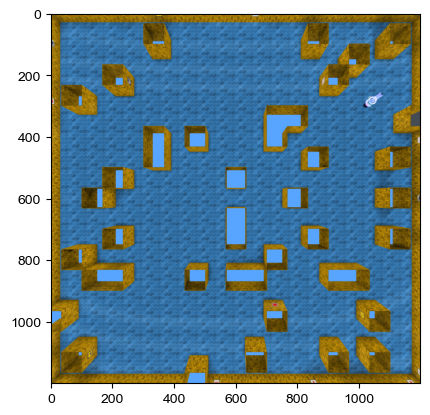

In [9]:

plt.imshow(np.moveaxis(obs['DEBUG.CAMERA.TOP_DOWN'], 0, -1))
plt.savefig('topdownview.png')

Map number:	3


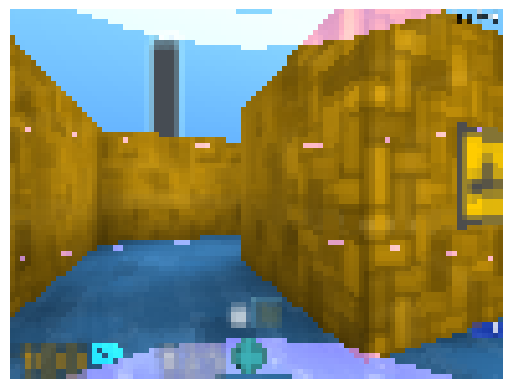

In [8]:
env.reset()
obs = env.observations()
plt.imshow(obs[observations[0]])
plt.axis('off')
plt.savefig('firstpersonview.png')

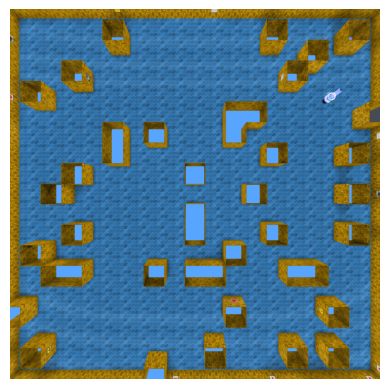

In [10]:
plt.imshow(np.moveaxis(obs['DEBUG.CAMERA.TOP_DOWN'], 0, -1))
plt.axis('off')
plt.savefig('topdownview.png')

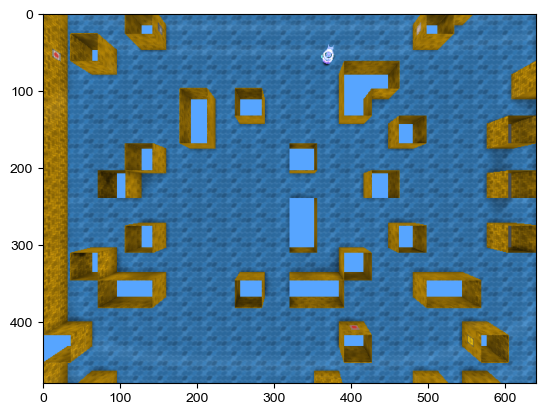

In [6]:
plt.imshow(np.moveaxis(obs['DEBUG.CAMERA.TOP_DOWN'], 0, -1))


Font 'default' does not have a glyph for '\u2011' [U+2011], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u2011' [U+2011], substituting with a dummy symbol.


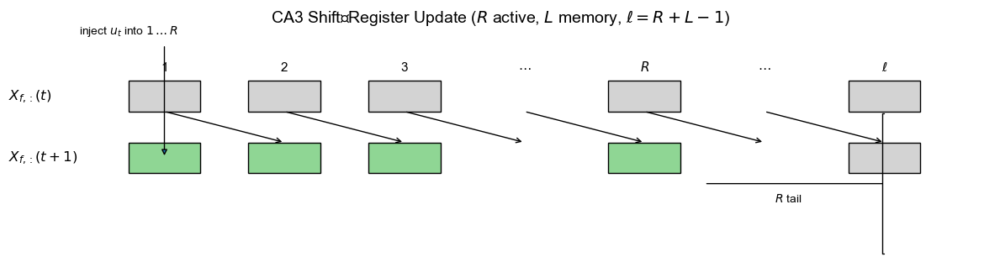

Font 'default' does not have a glyph for '\u2011' [U+2011], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u2011' [U+2011], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u2011' [U+2011], substituting with a dummy symbol.


In [21]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Schematic parameters
box = 0.6          # square side
green = "#8fd694"
grey  = "#d3d3d3"

# Labels (indices start at 1); explicit head 1‑3, symbolic R, tail ℓ
labels = ["1", "2", "3", r"$\cdots$", r"$R$", r"$\cdots$", r"$\ell$"]
n = len(labels)

fig, ax = plt.subplots(figsize=(12, 3))
ax.set_xlim(-1, n + 0.2)
ax.set_ylim(-1, 2.8)
ax.axis("off")

def slot_xy(i, y):          # bottom‑left corner for slot i at vertical offset y
    return (i, y)

def draw_box(i, y, color=grey):
    rect = patches.Rectangle(slot_xy(i, y), box, box,
                             facecolor=color, edgecolor="k", lw=1)
    ax.add_patch(rect)

# ---- top and bottom rows (boxes only for concrete labels) ----
y_top, y_bot = 1.2, 0.0
concrete_idx = [i for i, lab in enumerate(labels) if lab != r"$\cdots$"]

# draw boxes top & bottom
for i in concrete_idx:
    draw_box(i, y_top)
    # choose colour for bottom row: green if box index within injection range (label <= R)
    label = labels[i]
    if label in {"1", "2", "3", r"$R$"}:
        color = green
    else:
        color = grey
    draw_box(i, y_bot, color=color)

# ---- textual labels ABOVE top row ----
for i, lab in enumerate(labels):
    ax.text(i + box/2, y_top + box + 0.15, lab,
            ha="center", va="bottom", fontsize=11)

# Row identifiers Xf
ax.text(-1.0, y_top + box/2, r"$X_{f,:}(t)$", fontsize=12, va="center")
ax.text(-1.0, y_bot + box/2, r"$X_{f,:}(t+1)$", fontsize=12, va="center")

# ---- shift arrows (even across ellipses) ----
for i in range(n - 1):
    x_src = i + box/2
    x_dst = (i + 1) + box/2
    ax.annotate("",
                xy=(x_dst, y_bot + box), xytext=(x_src, y_top),
                arrowprops=dict(arrowstyle="->", lw=1))

# ---- injection arrow ----
ax.annotate("",
            xy=(0 + box/2, y_bot + box/2),
            xytext=(0 + box/2, y_top + box + 0.7),
            arrowprops=dict(arrowstyle="-|>", lw=1))
ax.text(0, y_top + box + 0.9, r"inject $u_t$ into $1\dots R$", ha="center", fontsize=10)

# ---- R‑tail bracket (symbolic) ----
tail_start = n - 2   # second‑last placeholder '…'
tail_end   = n - 1   # final cell ℓ
ax.annotate("",
            xy=(tail_end + box/2, y_bot - 0.2),
            xytext=(tail_start - 0.2, y_bot - 0.2),
            arrowprops=dict(arrowstyle='-[,widthB=6.0,lengthB=0.15', lw=1))
ax.text((tail_start + tail_end)/2, y_bot - 0.55, r"$R$ tail", ha="center", fontsize=10)

# ---- title ----
ax.set_title(r"CA3 Shift‑Register Update ($R$ active, $L$ memory, $\ell = R+L-1$)", fontsize=14)
plt.tight_layout()
plt.show()
fig.savefig('sequences.svg')

## Training Plots

In [ ]:
/home/xiaoxiong/Downloads/wandb_train_resume_LSTM_3panels.csv

In [ ]:
/home/xiaoxiong/Downloads/wandb_train_resume_envstep.csv

In [ ]:
/home/xiaoxiong/Downloads/wandb_export_2025-05-12T21_09_38.912+02_00.csv

In [ ]:
/home/xiaoxiong/Downloads/wandb_export_2025-05-12T21_26_50.391+02_00.csv

In [72]:
training_data=pd.read_csv('/home/xiaoxiong/Downloads/wandb_train_resume_LSTM_3panels.csv')

In [73]:
cols = training_data.columns

# 1) Drop MIN/MAX columns
mask = cols.str.contains(r'__MIN|__MAX')
training_data = training_data.loc[:, ~mask]

In [74]:
training_data.columns

Index(['Step',
       'Epi_Ins9_Depth_Fix3_Tr_AR_LSTM_DGBN243_Hippo16_skip8_3pbt_64_rollout_Gamma99_epoch2_20250512_180459_608550 - 0/global_step',
       'Epi_Ins9_Depth_Fix3_Tr_AR_LSTM_DGBN243_Hippo16_skip8_3pbt_64_rollout_Gamma99_epoch2_20250512_180459_608550 - 1/global_step',
       'Epi_Ins9_Depth_Fix3_Tr_AR_LSTM_DGBN243_Hippo16_skip8_3pbt_64_rollout_Gamma99_epoch2_20250512_180459_608550 - 2/global_step',
       'Epi_Ins9_Depth_Fix3_Tr_AR_LSTM_DGBN243_Hippo16_skip8_3pbt_64_rollout_Gamma99_epoch2_20250512_180459_608550 - 0/policy_stats/avg_z_00_openfield_map2_fixed_loc3_dmlab_raw_score',
       'Epi_Ins9_Depth_Fix3_Tr_AR_LSTM_DGBN243_Hippo16_skip8_3pbt_64_rollout_Gamma99_epoch2_20250512_180459_608550 - 1/policy_stats/avg_z_00_openfield_map2_fixed_loc3_dmlab_raw_score',
       'Epi_Ins9_Depth_Fix3_Tr_AR_LSTM_DGBN243_Hippo16_skip8_3pbt_64_rollout_Gamma99_epoch2_20250512_180459_608550 - 2/policy_stats/avg_z_00_openfield_map2_fixed_loc3_dmlab_raw_score',
       'Epi_Ins9_Depth_Fix3_Tr_

In [778]:
col

'Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2_20250426_181928_792734 - 2/policy_stats/avg_z_00_openfield_map2_fixed_loc3_dmlab_raw_score'

In [78]:
for col in training_data.columns:

    m = pd.Series(col).str.extract(r'^(?P<run>.+?) - (?P<ep>\d+).*(?:/|_)(?P<tail>[^/_]+)$')

In [76]:
col

'Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2_20250426_181928_792734 - 2/reward/reward_min'

In [79]:
m

,run,ep,tail
0,Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L...,2,min


In [80]:
cols = training_data.columns

# 1) Drop MIN/MAX columns
mask = cols.str.contains(r'__MIN|__MAX')
training_data = training_data.loc[:, ~mask]

# 2) Rename the rest
# Pattern is:    <run-name> - <epoch>/policy_stats/..._raw_score
# We’ll pull out run-name and epoch, and form “runname_epoch#”
new_names = {}
for col in training_data.columns:

    m = pd.Series(col).str.extract(r'^(?P<run>.+?) - (?P<ep>\d+).*(?:/|_)(?P<tail>[^/_]+)$')
    run  = m.loc[0, 'run']
    ep   = m.loc[0, 'ep']
    tail = m.loc[0, 'tail']

    expname = col[:3]
    if col.startswith('Epi_Ins9_Depth_Fix3_Tr_AR_LSTM'):
        expname = 'LSTM'
    new   = f"{expname}_{ep}_{tail}"
    new_names[col] = new
    if col=='Step': new_names[col] = 'Step'
    # if col.endswith('step'): new_names[col] = f"{expname}_{ep}_envstep"

training_data = training_data.rename(columns=new_names)

In [81]:
training_data.columns

Index(['Step', 'LSTM_0_step', 'LSTM_1_step', 'LSTM_2_step', 'LSTM_0_score',
       'LSTM_1_score', 'LSTM_2_score', 'LSTM_0_len', 'LSTM_1_len',
       'LSTM_2_len', 'LSTM_0_min', 'LSTM_1_min', 'LSTM_2_min', 'Res_0_step',
       'Res_1_step', 'Res_2_step', 'Res_0_score', 'Res_1_score', 'Res_2_score',
       'Res_0_len', 'Res_1_len', 'Res_2_len', 'Res_0_min', 'Res_1_min',
       'Res_2_min', 'Epi_0_step', 'Epi_1_step', 'Epi_2_step', 'Epi_0_score',
       'Epi_1_score', 'Epi_2_score', 'Epi_0_len', 'Epi_1_len', 'Epi_2_len',
       'Epi_0_min', 'Epi_1_min', 'Epi_2_min'],
      dtype='object')

In [29]:
training_data.columns

Index(['Step', 'LSTM_0_envstep', 'LSTM_1_envstep', 'LSTM_2_envstep', 'LSTM_0',
       'LSTM_1', 'LSTM_2', 'Res_0_envstep', 'Res_1_envstep', 'Res_2_envstep',
       'Res_0', 'Res_1', 'Res_2', 'Epi_0_envstep', 'Epi_1_envstep',
       'Epi_2_envstep', 'Epi_0', 'Epi_1', 'Epi_2'],
      dtype='object')

In [83]:
##interpolate
colors={'Res': 'C1', 'Epi': 'C0', 'LSTM': 'C2'}
# Compute smoothed curve
for expname in colors:
    for pol in np.arange(3):
        col=f"{expname}_{pol}"
        training_data[col+'_step'].interpolate(method='linear', inplace=True)

In [85]:
from numpy import nansum


import numpy as np
from scipy import interpolate

def gaussian_smooth_step(df, xcol, ycol, sigma):
    """
    Smooth ycol in df using a Gaussian kernel defined over xcol,
    first removing any (x,y) pairs where y is NaN.
    """
    # Extract raw arrays
    x_all = df[xcol].values
    y_all = df[ycol].values

    # Keep only the non-NaN points
    valid = ~np.isnan(y_all)
    x = x_all[valid]
    y = y_all[valid]

    # Prepare an output array
    smoothed = np.full_like(x_all, fill_value=np.nan, dtype=float)

    # Compute pairwise distances between all targets and valid points
    # dx has shape (n_all, n_valid)
    dx = x_all[:, None] - x[None, :]

    # Un-normalized Gaussian weights
    W = np.exp(-0.5 * (dx / sigma)**2)

    # Normalize each row to sum to 1
    row_sums = W.sum(axis=1, keepdims=True)
    W /= row_sums

    # Weighted average only over the valid y's
    smoothed = W.dot(y)

    return smoothed


# Choose sigma (e.g., 5 units in 'Step')
sigma = 1000000
# Compute smoothed curve
df = training_data[['Step']].copy()
for expname in colors:
    for pol in np.arange(3):
        col=f"{expname}_{pol}"
        # Smooth the data
        df[col+'_step'] = training_data[col+'_step'].copy()
        for stat in ['score','len','min']:
            df[col+'_'+stat] = gaussian_smooth_step(training_data, col+'_step', col+"_"+stat, sigma)


In [84]:
training_data.columns


Index(['Step', 'LSTM_0_step', 'LSTM_1_step', 'LSTM_2_step', 'LSTM_0_score',
       'LSTM_1_score', 'LSTM_2_score', 'LSTM_0_len', 'LSTM_1_len',
       'LSTM_2_len', 'LSTM_0_min', 'LSTM_1_min', 'LSTM_2_min', 'Res_0_step',
       'Res_1_step', 'Res_2_step', 'Res_0_score', 'Res_1_score', 'Res_2_score',
       'Res_0_len', 'Res_1_len', 'Res_2_len', 'Res_0_min', 'Res_1_min',
       'Res_2_min', 'Epi_0_step', 'Epi_1_step', 'Epi_2_step', 'Epi_0_score',
       'Epi_1_score', 'Epi_2_score', 'Epi_0_len', 'Epi_1_len', 'Epi_2_len',
       'Epi_0_min', 'Epi_1_min', 'Epi_2_min'],
      dtype='object')

In [86]:
for expname in colors:
    for pol in np.arange(3):
        col=f"{expname}_{pol}"
        # Smooth the data
        df[col+'_score'] /= 10
        df[col+'_min'] /= 4.82


In [43]:
for expname in colors:
    for pol in np.arange(3):
        col=f"{expname}_{pol}"
        df[col+"_smooth"]/=10

In [ ]:
# fig,ax=plt.subplots(figsize=(5.5, 3))



In [ ]:
fig,ax=plt.subplots(figsize=(5.5, 3))
# Compute smoothed curve
df.plot(x='Step', title='Training data',legend=False,ax=ax,)

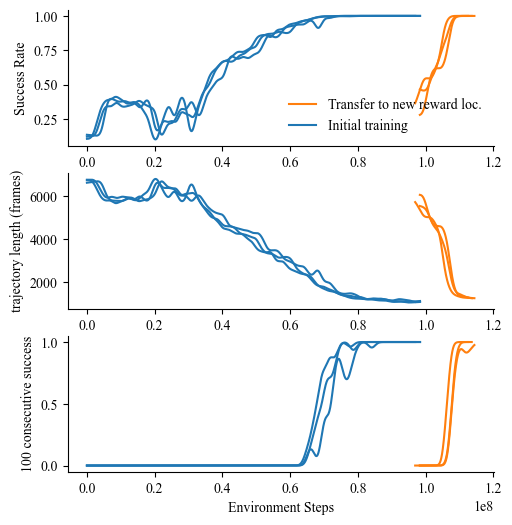

In [92]:
fig,ax=plt.subplots(3,1,figsize=(5.5, 2*3))
colors={'Res': 'C1', 'Epi': 'C0', 'LSTM': 'C2'}
# Compute smoothed curve
for expname in colors:
    if expname=='LSTM':
        continue
    for pol in np.arange(3):
        col=f"{expname}_{pol}_"
        i=0
        for stat in ['score','len','min']:
        # tmpdf=df.copy()
        # if col.startswith('Res'):
        #     tmpdf['Step']+= 480000
        #     color='C1'
        # else:
        #     color='C0'
        
            df.plot(x=col+'step', y=col+stat,legend=False,xlabel="",ax=ax[i],color=colors[expname])
            i+=1

for i in range(3):
    ax[i].spines[['top', 'right']].set_visible(False)
line1, = ax[0].plot([], [], color='C1', label="Transfer to new reward loc.")
line2, = ax[0].plot([], [], color='C0', label="Initial training")

ax[0].legend(handles=[line1, line2],frameon=False)#, title="Column groups")
ax[2].set_xlabel('Environment Steps')
ax[0].set_ylabel('Success Rate')
ax[1].set_ylabel('trajectory length (frames)')
ax[2].set_ylabel('100 consecutive success')
fig.savefig('/home/xiaoxiong/Neuripsfigs/Training_local_resume.svg',bbox_inches='tight',dpi=300)

In [93]:

import wandb

api = wandb.Api()

In [100]:
!export WANDB_API_KEY=36315659e0dddadabbe5efd509b05f435db05c50

In [98]:
wandb.login()

wandb: Currently logged in as: xiaoxionglin (xiaoxionglin-bernstein-center-freiburg). Use `wandb login --relogin` to force relogin


True

In [102]:
runs = api.runs("xiaoxionglin-bernstein-center-freiburg/SF_dmlab_NEMO_control")

In [103]:
runs.variables

{'project': 'SF_dmlab_NEMO_control',
 'entity': 'xiaoxionglin-bernstein-center-freiburg',
 'order': '+created_at',
 'filters': '{}'}

In [104]:
summary_list, config_list, name_list = [], [], []
for run in runs:
    # .summary contains output keys/values for
    # metrics such as accuracy.
    #  We call ._json_dict to omit large files
    summary_list.append(run.summary._json_dict)

    # .config contains the hyperparameters.
    #  We remove special values that start with _.
    config_list.append({k: v for k, v in run.config.items() if not k.startswith("_")})

    # .name is the human-readable name of the run.
    name_list.append(run.name)

runs_df = pd.DataFrame(
    {"summary": summary_list, "config": config_list, "name": name_list}
)


In [105]:
runs_df

,summary,config,name
0,"{'0/global_step': 160497664, '0/len/len': 4026...","{'env': 'openfield_map2_fixed_loc3', 'algo': '...",00_control_see_0_H.L_1_H.R_1_r.siz_29_e.fra_4_...
1,"{'0/global_step': 324141056, '0/len/len': 3679...","{'env': 'openfield_map2_fixed_loc3', 'algo': '...",01_control_see_0_H.L_1_H.R_1_r.siz_29_e.fra_8_...
2,"{'0/global_step': 169213952, '0/len/len': 5456...","{'env': 'openfield_map2_fixed_loc3', 'algo': '...",02_control_see_0_H.L_1_H.R_8_r.siz_141_e.fra_4...
3,"{'0/global_step': 347963392, '0/len/len': 3687...","{'env': 'openfield_map2_fixed_loc3', 'algo': '...",03_control_see_0_H.L_1_H.R_8_r.siz_141_e.fra_8...
4,"{'0/global_step': 171491328, '0/len/len': 6201...","{'env': 'openfield_map2_fixed_loc3', 'algo': '...",04_control_see_1111_H.L_1_H.R_1_r.siz_29_e.fra...
5,"{'0/global_step': 343441408, '0/len/len': 4974...","{'env': 'openfield_map2_fixed_loc3', 'algo': '...",05_control_see_1111_H.L_1_H.R_1_r.siz_29_e.fra...
6,"{'0/global_step': 338132992, '0/len/len': 5657...","{'env': 'openfield_map2_fixed_loc3', 'algo': '...",07_control_see_1111_H.L_1_H.R_8_r.siz_141_e.fr...
7,"{'0/global_step': 170770432, '0/len/len': 6000...","{'env': 'openfield_map2_fixed_loc3', 'algo': '...",06_control_see_1111_H.L_1_H.R_8_r.siz_141_e.fr...
8,"{'0/global_step': 322404352, '0/len/len': 5381...","{'env': 'openfield_map2_fixed_loc3', 'algo': '...",09_control_see_2222_H.L_1_H.R_1_r.siz_29_e.fra...
9,"{'0/global_step': 170295296, '0/len/len': 7120...","{'env': 'openfield_map2_fixed_loc3', 'algo': '...",08_control_see_2222_H.L_1_H.R_1_r.siz_29_e.fra...


## L64 R8

In [339]:
import sys

# from sample_factory.enjoy import enjoy
from sf_examples.dmlab.cumstom_enjoy import enjoy
from sf_examples.dmlab.train_hipposlam import parse_dmlab_args, register_dmlab_components



cli = [
    "--algo", "APPO",
    "--env",  "openfield_map2_fixed_loc3",         # pick any DM‑Lab level you have
    "--experiment", "13_hipposlam__e.fra_8_see_2222_n.pol_4_H.L_64_r.siz_1149",
    "--encoder_load_path","/home/xiaoxiong/try0120/train_dir/Random3_openfield_new/checkpoint_p0/best_000025288_203030528_reward_94.185.pth",
    "--train_dir", "./train_dir", # anything writable
    "--max_num_frames", "50000",          # short rollout for the test
    "--num_envs", "1",
    "--dmlab_level_cache_path","./.dmlab_cache",
    "--load_checkpoint_kind","latest",
    "--use_jit","False",
    "--no_render",        # <-- skip human window; avoid X11 on servers
]

cli_dict={
 'algo': 'APPO',
 'env': 'openfield_map2_fixed_loc3',
 'experiment': '13_hipposlam__e.fra_8_see_2222_n.pol_4_H.L_64_r.siz_1149',
 'encoder_load_path': '/home/xiaoxiong/try0120/train_dir/Random3_openfield_new/checkpoint_p0/best_000025288_203030528_reward_94.185.pth',
 'train_dir': './train_dir',
 'max_num_frames': '50000',
 'num_envs': '1',
 'dmlab_level_cache_path': './.dmlab_cache',
 'load_checkpoint_kind': 'latest',
 'no_render': True,
 'use_jit': False,
}
register_dmlab_components()
cfg = parse_dmlab_args(evaluation=True, argv=cli)

# tweak whatever you like *after* parsing
cfg.with_pos_obs = True
cfg.cli_args=cli_dict
# status = enjoy(cfg)

[2025-05-08 04:06:24,168][1267942] Environment test already registered, overwriting...
[2025-05-08 04:06:24,169][1267942] Environment openfield_map already registered, overwriting...
[2025-05-08 04:06:24,170][1267942] Environment openfield_map2 already registered, overwriting...
[2025-05-08 04:06:24,170][1267942] Environment openfield_map2_fixed_loc3 already registered, overwriting...
[2025-05-08 04:06:24,170][1267942] Environment openfield_map2_fixed_loc2 already registered, overwriting...
[2025-05-08 04:06:24,171][1267942] Environment openfield_map2_fixed_loc1 already registered, overwriting...
[2025-05-08 04:06:24,171][1267942] Environment openfield_map_episode already registered, overwriting...
[2025-05-08 04:06:24,172][1267942] Environment openfield_map_transparent already registered, overwriting...
[2025-05-08 04:06:24,172][1267942] Environment random_maze already registered, overwriting...
[2025-05-08 04:06:24,172][1267942] Environment dmlab_benchmark already registered, overwri

In [340]:
import time
from collections import deque
from typing import Dict, Tuple

import gymnasium as gym
import numpy as np
import torch
from torch import Tensor

from sample_factory.algo.learning.learner import Learner
from sample_factory.algo.sampling.batched_sampling import preprocess_actions
from sample_factory.algo.utils.action_distributions import argmax_actions
from sample_factory.algo.utils.env_info import extract_env_info
from sample_factory.algo.utils.make_env import make_env_func_batched
from sample_factory.algo.utils.misc import ExperimentStatus
from sample_factory.algo.utils.rl_utils import make_dones, prepare_and_normalize_obs
from sample_factory.algo.utils.tensor_utils import unsqueeze_tensor
from sample_factory.cfg.arguments import load_from_checkpoint
from sample_factory.huggingface.huggingface_utils import generate_model_card, generate_replay_video, push_to_hf
from sample_factory.model.actor_critic import create_actor_critic
from sample_factory.model.model_utils import get_rnn_size
from sample_factory.utils.attr_dict import AttrDict
from sample_factory.utils.typing import Config, StatusCode
from sample_factory.utils.utils import debug_log_every_n, experiment_dir, log

In [5]:
# ---------------------------------------------------------------------------
# logging helpers (put near the top of the file, after imports)
# ---------------------------------------------------------------------------
import datetime, pathlib, json, h5py, pandas as pd, torch

def _ensure_parent(path: pathlib.Path):
    path.parent.mkdir(parents=True, exist_ok=True)


In [11]:
%cd ~/from_NEMO/

/home/xiaoxiong/from_NEMO


In [341]:
    verbose = False

    cfg = load_from_checkpoint(cfg)

    eval_env_frameskip: int = cfg.env_frameskip if cfg.eval_env_frameskip is None else cfg.eval_env_frameskip
    assert (
        cfg.env_frameskip % eval_env_frameskip == 0
    ), f"{cfg.env_frameskip=} must be divisible by {eval_env_frameskip=}"
    render_action_repeat: int = cfg.env_frameskip // eval_env_frameskip
    cfg.env_frameskip = cfg.eval_env_frameskip = eval_env_frameskip
    log.debug(f"Using frameskip {cfg.env_frameskip} and {render_action_repeat=} for evaluation")

    cfg.num_envs = 1

    render_mode = "human"
    if cfg.save_video:
        render_mode = "rgb_array"
    elif cfg.no_render:
        render_mode = None

    env = make_env_func_batched(
        cfg, env_config=AttrDict(worker_index=0, vector_index=0, env_id=0), render_mode=render_mode
    )
    env_info = extract_env_info(env, cfg)

    if hasattr(env.unwrapped, "reset_on_init"):
        # reset call ruins the demo recording for VizDoom
        env.unwrapped.reset_on_init = False
    log.info(env.action_space)
    actor_critic = create_actor_critic(cfg, env.observation_space, env.action_space)
    actor_critic.eval()

[2025-05-08 04:06:39,065][1267942] Loading existing experiment configuration from ./train_dir/13_hipposlam__e.fra_8_see_2222_n.pol_4_H.L_64_r.siz_1149/config.json
[2025-05-08 04:06:39,066][1267942] Overriding arg 'encoder_load_path' with value '/home/xiaoxiong/try0120/train_dir/Random3_openfield_new/checkpoint_p0/best_000025288_203030528_reward_94.185.pth' passed from command line
[2025-05-08 04:06:39,067][1267942] Overriding arg 'train_dir' with value './train_dir' passed from command line
[2025-05-08 04:06:39,067][1267942] Overriding arg 'dmlab_level_cache_path' with value './.dmlab_cache' passed from command line
[2025-05-08 04:06:39,068][1267942] Adding new argument 'fps'=0 that is not in the saved config file!
[2025-05-08 04:06:39,069][1267942] Adding new argument 'eval_env_frameskip'=None that is not in the saved config file!
[2025-05-08 04:06:39,069][1267942] Adding new argument 'no_render'=True that is not in the saved config file!
[2025-05-08 04:06:39,072][1267942] Adding new 

ActorCriticSharedWeights(
  (obs_normalizer): ObservationNormalizer()
  (returns_normalizer): RecursiveScriptModule(original_name=RunningMeanStdInPlace)
  (encoder): HipposlamEncoder(
    (depth_encoder): DepthEncoder(
      (downsample): Upsample(size=(1, 10), mode='nearest')
    )
    (basic_encoder): ResnetEncoder(
      (conv_head): Sequential(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
        (2): ResBlock(
          (res_block_core): Sequential(
            (0): ReLU()
            (1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (2): ReLU()
            (3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          )
        )
        (3): ResBlock(
          (res_block_core): Sequential(
            (0): ReLU()
            (1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (2

In [11]:
[x for x in dict(actor_critic.named_modules()).keys() if x.startswith('encoder.DG')]

['encoder.DG_projection',
 'encoder.DG_projection.linear',
 'encoder.DG_projection.batchnorm1d',
 'encoder.DG_projection.activation']

In [21]:
[x for x in dict(actor_critic.named_modules()).keys() if x.startswith('deco')]

['decoder', 'decoder.mlp', 'decoder.mlp.0', 'decoder.mlp.1', 'decoder.mlp.2']

In [10]:
cfg.env

'openfield_map2_fixed_loc3'

In [24]:
verbose = False

cfg = load_from_checkpoint(cfg)

eval_env_frameskip: int = cfg.env_frameskip 
assert (
    cfg.env_frameskip % eval_env_frameskip == 0
), f"{cfg.env_frameskip=} must be divisible by {eval_env_frameskip=}"
render_action_repeat: int = cfg.env_frameskip // eval_env_frameskip
cfg.env_frameskip = cfg.eval_env_frameskip = eval_env_frameskip
log.debug(f"Using frameskip {cfg.env_frameskip} and {render_action_repeat=} for evaluation")

cfg.num_envs = 1

render_mode = "human"
if cfg.save_video:
    render_mode = "rgb_array"
elif cfg.no_render:
    render_mode = None

env = make_env_func_batched(
    cfg, env_config=AttrDict(worker_index=0, vector_index=0, env_id=0), render_mode=render_mode
)
env_info = extract_env_info(env, cfg)

if hasattr(env.unwrapped, "reset_on_init"):
    # reset call ruins the demo recording for VizDoom
    env.unwrapped.reset_on_init = False
log.info(env.action_space)
actor_critic = create_actor_critic(cfg, env.observation_space, env.action_space)
actor_critic.eval()



device = torch.device("cpu" if cfg.device == "cpu" else "cuda")
actor_critic.model_to_device(device)


#################### register hook
layers_to_log = [
    "encoder.DG_projection.linear",
    "core",
    "decoder.mlp.2"
]          # <- example; edit to taste

# 2B. activation buffer

import collections
act_buffers = collections.defaultdict(list)

def make_hook(layer_name):
    def _hook(_m, _inp, out):
        if isinstance(out, (tuple, list)):      # RNN returns (output, h_n)
            out = out[0]
        act_buffers[layer_name].append(out.detach().cpu())
    return _hook

# attach the hook once
for layer_to_log in layers_to_log:
    try:
        dict(actor_critic.named_modules())[layer_to_log].register_forward_hook(make_hook(layer_to_log))
        log.info("Activation hook registered on %s", layer_to_log)
    except KeyError:
        raise RuntimeError(f"Layer '{layer_to_log}' not found in the network!")

####################


policy_id = cfg.policy_index
# log.info(policy_id)
name_prefix = dict(latest="checkpoint", best="best")[cfg.load_checkpoint_kind]
# log.info(Learner.checkpoint_dir(cfg, policy_id))
checkpoints = Learner.get_checkpoints(Learner.checkpoint_dir(cfg, policy_id), f"{name_prefix}_*")
checkpoint_dict = Learner.load_checkpoint(checkpoints, device)
actor_critic.load_state_dict(checkpoint_dict["model"])

episode_rewards = [deque([], maxlen=100) for _ in range(env.num_agents)]
true_objectives = [deque([], maxlen=100) for _ in range(env.num_agents)]
num_frames = 0

last_render_start = time.time()

def max_frames_reached(frames):
    return cfg.max_num_frames is not None and frames > cfg.max_num_frames

reward_list = []

obs, infos = env.reset()
rnn_states = torch.zeros([env.num_agents, get_rnn_size(cfg)], dtype=torch.float32, device=device)
episode_reward = None
finished_episode = [False for _ in range(env.num_agents)]

video_frames = []
num_episodes = 0

# saved_data=dict()
pose_records = []

with torch.no_grad():
    while not max_frames_reached(num_frames):
        normalized_obs = prepare_and_normalize_obs(actor_critic, obs)

        # if not cfg.no_render:
        #     visualize_policy_inputs(normalized_obs)
        policy_outputs = actor_critic(normalized_obs, rnn_states)

        # sample actions from the distribution by default
        actions = policy_outputs["actions"]

        if cfg.eval_deterministic:
            action_distribution = actor_critic.action_distribution()
            actions = argmax_actions(action_distribution)

        # actions shape should be [num_agents, num_actions] even if it's [1, 1]
        if actions.ndim == 1:
            actions = unsqueeze_tensor(actions, dim=-1)
        actions = preprocess_actions(env_info, actions)

        rnn_states = policy_outputs["new_rnn_states"]

        for _ in range(render_action_repeat):
            # last_render_start = render_frame(cfg, env, video_frames, num_episodes, last_render_start)

            obs, rew, terminated, truncated, infos = env.step(actions)
            # log.info(obs['DEBUG.POS.TRANS'])
            # save info
            frame_idx = num_frames          # or use a wall‑clock timestamp
            pos = obs['DEBUG.POS.TRANS']    # (B,3)
            rot = obs['DEBUG.POS.ROT']      # (B,3) or (B,4) depending on env

            for agent_i in range(env.num_agents):
                pose_records.append({
                    "frame"  : frame_idx,
                    "agent"  : agent_i,
                    "x"      : float(pos[agent_i, 0]),
                    "y"      : float(pos[agent_i, 1]),
                    "z"      : float(pos[agent_i, 2]),
                    "rot_x"  : float(rot[agent_i, 0]),
                    "rot_y"  : float(rot[agent_i, 1]),
                    "rot_z"  : float(rot[agent_i, 2]),
                    # keep the whole info dict as a JSON string for convenience
                    "info"   : json.dumps(infos[agent_i], default=str),
                })



            dones = make_dones(terminated, truncated)
            infos = [{} for _ in range(env_info.num_agents)] if infos is None else infos

            if episode_reward is None:
                episode_reward = rew.float().clone()
            else:
                episode_reward += rew.float()

            num_frames += 1
            if num_frames % 100 == 0:
                log.debug(f"Num frames {num_frames}...")

            dones = dones.cpu().numpy()
            for agent_i, done_flag in enumerate(dones):
                if done_flag:
                    finished_episode[agent_i] = True
                    rew = episode_reward[agent_i].item()
                    episode_rewards[agent_i].append(rew)

                    true_objective = rew
                    if isinstance(infos, (list, tuple)):
                        true_objective = infos[agent_i].get("true_objective", rew)
                    true_objectives[agent_i].append(true_objective)

                    if verbose:
                        log.info(
                            "Episode finished for agent %d at %d frames. Reward: %.3f, true_objective: %.3f",
                            agent_i,
                            num_frames,
                            episode_reward[agent_i],
                            true_objectives[agent_i][-1],
                        )
                    rnn_states[agent_i] = torch.zeros([get_rnn_size(cfg)], dtype=torch.float32, device=device)
                    episode_reward[agent_i] = 0

                    if cfg.use_record_episode_statistics:
                        # we want the scores from the full episode not a single agent death (due to EpisodicLifeEnv wrapper)
                        if "episode" in infos[agent_i].keys():
                            num_episodes += 1
                            reward_list.append(infos[agent_i]["episode"]["r"])
                    else:
                        num_episodes += 1
                        reward_list.append(true_objective)

            # if episode terminated synchronously for all agents, pause a bit before starting a new one
            if all(dones):
                # render_frame(cfg, env, video_frames, num_episodes, last_render_start)
                time.sleep(0.05)

            if all(finished_episode):
                finished_episode = [False] * env.num_agents
                avg_episode_rewards_str, avg_true_objective_str = "", ""
                for agent_i in range(env.num_agents):
                    avg_rew = np.mean(episode_rewards[agent_i])
                    avg_true_obj = np.mean(true_objectives[agent_i])

                    if not np.isnan(avg_rew):
                        if avg_episode_rewards_str:
                            avg_episode_rewards_str += ", "
                        avg_episode_rewards_str += f"#{agent_i}: {avg_rew:.3f}"
                    if not np.isnan(avg_true_obj):
                        if avg_true_objective_str:
                            avg_true_objective_str += ", "
                        avg_true_objective_str += f"#{agent_i}: {avg_true_obj:.3f}"

                log.info(
                    "Avg episode rewards: %s, true rewards: %s", avg_episode_rewards_str, avg_true_objective_str
                )
                log.info(
                    "Avg episode reward: %.3f, avg true_objective: %.3f",
                    np.mean([np.mean(episode_rewards[i]) for i in range(env.num_agents)]),
                    np.mean([np.mean(true_objectives[i]) for i in range(env.num_agents)]),
                )

            # VizDoom multiplayer stuff
            # for player in [1, 2, 3, 4, 5, 6, 7, 8]:
            #     key = f'PLAYER{player}_FRAGCOUNT'
            #     if key in infos[0]:
            #         log.debug('Score for player %d: %r', player, infos[0][key])

        if num_episodes >= cfg.max_num_episodes:
            break

env.close()

[2025-05-04 21:43:47,891][1267942] Loading existing experiment configuration from ./train_dir/13_hipposlam__e.fra_8_see_2222_n.pol_4_H.L_64_r.siz_1149/config.json
[2025-05-04 21:43:47,892][1267942] Overriding arg 'encoder_load_path' with value '/home/xiaoxiong/try0120/train_dir/Random3_openfield_new/checkpoint_p0/best_000025288_203030528_reward_94.185.pth' passed from command line
[2025-05-04 21:43:47,892][1267942] Overriding arg 'train_dir' with value './train_dir' passed from command line
[2025-05-04 21:43:47,892][1267942] Overriding arg 'dmlab_level_cache_path' with value './.dmlab_cache' passed from command line
[2025-05-04 21:43:47,892][1267942] Adding new argument 'fps'=0 that is not in the saved config file!
[2025-05-04 21:43:47,893][1267942] Adding new argument 'eval_env_frameskip'=None that is not in the saved config file!
[2025-05-04 21:43:47,893][1267942] Adding new argument 'no_render'=True that is not in the saved config file!
[2025-05-04 21:43:47,894][1267942] Adding new 

Map number:	3


[2025-05-04 21:44:05,643][1267942] Num frames 100...
[2025-05-04 21:44:06,201][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:06,202][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.166666666667
Map number:	3
Map number:	3


[2025-05-04 21:44:06,903][1267942] Num frames 200...
[2025-05-04 21:44:07,380][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:07,380][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.05
Map number:	3
Map number:	3


[2025-05-04 21:44:08,459][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:08,459][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.75
Map number:	3


[2025-05-04 21:44:09,053][1267942] Num frames 300...


Map number:	3


[2025-05-04 21:44:09,567][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:09,567][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.4
Map number:	3
Map number:	3


[2025-05-04 21:44:10,385][1267942] Num frames 400...
[2025-05-04 21:44:11,017][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:11,018][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.3
Map number:	3
Map number:	3


[2025-05-04 21:44:12,080][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:12,081][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.7166666666667
Map number:	3


[2025-05-04 21:44:12,532][1267942] Num frames 500...


Map number:	3


[2025-05-04 21:44:13,353][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:13,354][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.15
Map number:	3


[2025-05-04 21:44:13,795][1267942] Num frames 600...


Map number:	3


[2025-05-04 21:44:14,398][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:14,399][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	5.9666666666667
Map number:	3
Map number:	3


[2025-05-04 21:44:15,074][1267942] Num frames 700...
[2025-05-04 21:44:15,590][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:15,591][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.8666666666667
Map number:	3
Map number:	3


[2025-05-04 21:44:16,339][1267942] Num frames 800...
[2025-05-04 21:44:16,719][1267942] Num frames 900...
[2025-05-04 21:44:17,532][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:17,533][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	38.633333333333
Map number:	3


[2025-05-04 21:44:17,966][1267942] Num frames 1000...


Map number:	3


[2025-05-04 21:44:18,358][1267942] Num frames 1100...
[2025-05-04 21:44:18,984][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:18,985][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.85
Map number:	3


[2025-05-04 21:44:19,574][1267942] Num frames 1200...


Map number:	3


[2025-05-04 21:44:20,342][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:20,343][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.133333333333
Map number:	3


[2025-05-04 21:44:20,872][1267942] Num frames 1300...


Map number:	3


[2025-05-04 21:44:21,548][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:21,548][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.083333333333
Map number:	3


[2025-05-04 21:44:22,133][1267942] Num frames 1400...


Map number:	3


[2025-05-04 21:44:22,658][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:22,658][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.0166666666667
Map number:	3
Map number:	3


[2025-05-04 21:44:23,369][1267942] Num frames 1500...
[2025-05-04 21:44:23,780][1267942] Num frames 1600...
[2025-05-04 21:44:24,313][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:24,314][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.533333333333
Map number:	3
Map number:	3


[2025-05-04 21:44:25,272][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:25,272][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.3833333333333
Map number:	3


[2025-05-04 21:44:25,890][1267942] Num frames 1700...


Map number:	3


[2025-05-04 21:44:26,462][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:26,463][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.4
Map number:	3
Map number:	3


[2025-05-04 21:44:27,214][1267942] Num frames 1800...
[2025-05-04 21:44:27,604][1267942] Num frames 1900...
[2025-05-04 21:44:27,984][1267942] Num frames 2000...
[2025-05-04 21:44:28,368][1267942] Num frames 2100...
[2025-05-04 21:44:28,829][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:28,829][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	49.383333333333
Map number:	3
Map number:	3


[2025-05-04 21:44:29,606][1267942] Num frames 2200...
[2025-05-04 21:44:30,254][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:30,254][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.1
Map number:	3


[2025-05-04 21:44:30,839][1267942] Num frames 2300...


Map number:	3


[2025-05-04 21:44:31,434][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:31,434][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.2
Map number:	3
Map number:	3


[2025-05-04 21:44:32,073][1267942] Num frames 2400...
[2025-05-04 21:44:32,576][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:32,576][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.116666666667
Map number:	3
Map number:	3


[2025-05-04 21:44:33,319][1267942] Num frames 2500...
[2025-05-04 21:44:33,936][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:33,936][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.466666666667
Map number:	3
Map number:	3


[2025-05-04 21:44:34,589][1267942] Num frames 2600...
[2025-05-04 21:44:35,076][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:35,077][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.5166666666667
Map number:	3
Map number:	3


[2025-05-04 21:44:35,805][1267942] Num frames 2700...
[2025-05-04 21:44:36,411][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:36,411][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.533333333333
Map number:	3
Map number:	3


[2025-05-04 21:44:37,067][1267942] Num frames 2800...
[2025-05-04 21:44:37,709][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:37,710][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.133333333333
Map number:	3
Map number:	3


[2025-05-04 21:44:38,632][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:38,632][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	3.9
Map number:	3


[2025-05-04 21:44:39,075][1267942] Num frames 2900...


Map number:	3


[2025-05-04 21:44:39,882][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:39,882][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.533333333333
Map number:	3


[2025-05-04 21:44:40,320][1267942] Num frames 3000...


Map number:	3


[2025-05-04 21:44:41,081][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:41,081][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.616666666667
Map number:	3


[2025-05-04 21:44:41,531][1267942] Num frames 3100...


Map number:	3


[2025-05-04 21:44:41,933][1267942] Num frames 3200...
[2025-05-04 21:44:42,472][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:42,472][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.983333333333
Map number:	3
Map number:	3


[2025-05-04 21:44:43,140][1267942] Num frames 3300...
[2025-05-04 21:44:43,758][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:43,758][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.016666666667
Map number:	3
Map number:	3


[2025-05-04 21:44:44,352][1267942] Num frames 3400...
[2025-05-04 21:44:44,936][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:44,937][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.783333333333
Map number:	3
Map number:	3


[2025-05-04 21:44:45,597][1267942] Num frames 3500...
[2025-05-04 21:44:46,209][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:46,210][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.916666666667
Map number:	3
Map number:	3


[2025-05-04 21:44:47,232][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:47,232][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.5666666666667
Map number:	3


[2025-05-04 21:44:47,642][1267942] Num frames 3600...


Map number:	3


[2025-05-04 21:44:48,397][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:48,397][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.75
Map number:	3


[2025-05-04 21:44:48,862][1267942] Num frames 3700...


Map number:	3


[2025-05-04 21:44:49,268][1267942] Num frames 3800...
[2025-05-04 21:44:49,670][1267942] Num frames 3900...
[2025-05-04 21:44:50,259][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:50,260][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	33.766666666667
Map number:	3
Map number:	3


[2025-05-04 21:44:51,300][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:51,301][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.3833333333333
Map number:	3


[2025-05-04 21:44:51,742][1267942] Num frames 4000...


Map number:	3


[2025-05-04 21:44:52,135][1267942] Num frames 4100...
[2025-05-04 21:44:52,714][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:52,714][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.483333333333
Map number:	3
Map number:	3


[2025-05-04 21:44:53,335][1267942] Num frames 4200...
[2025-05-04 21:44:53,773][1267942] Num frames 4300...
[2025-05-04 21:44:54,158][1267942] Num frames 4400...
[2025-05-04 21:44:54,852][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:54,852][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	43.716666666667
Map number:	3


[2025-05-04 21:44:55,371][1267942] Num frames 4500...


Map number:	3


[2025-05-04 21:44:55,774][1267942] Num frames 4600...
[2025-05-04 21:44:56,502][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:56,503][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.383333333333
Map number:	3
Map number:	3


[2025-05-04 21:44:56,976][1267942] Num frames 4700...
[2025-05-04 21:44:57,765][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:57,765][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.633333333333
Map number:	3


[2025-05-04 21:44:58,226][1267942] Num frames 4800...


Map number:	3


[2025-05-04 21:44:58,955][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:44:58,956][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.633333333333
Map number:	3


[2025-05-04 21:44:59,453][1267942] Num frames 4900...


Map number:	3


[2025-05-04 21:44:59,900][1267942] Num frames 5000...
[2025-05-04 21:45:00,331][1267942] Num frames 5100...
[2025-05-04 21:45:01,223][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:01,223][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	41.8
Map number:	3


[2025-05-04 21:45:01,664][1267942] Num frames 5200...


Map number:	3


[2025-05-04 21:45:02,297][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:02,298][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.4
Map number:	3
Map number:	3


[2025-05-04 21:45:02,896][1267942] Num frames 5300...
[2025-05-04 21:45:03,383][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:03,384][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.05
Map number:	3
Map number:	3


[2025-05-04 21:45:04,485][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:04,486][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.05
Map number:	3


[2025-05-04 21:45:04,950][1267942] Num frames 5400...


Map number:	3


[2025-05-04 21:45:05,721][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:05,721][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.983333333333
Map number:	3


[2025-05-04 21:45:06,182][1267942] Num frames 5500...


Map number:	3


[2025-05-04 21:45:06,571][1267942] Num frames 5600...
[2025-05-04 21:45:07,128][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:07,128][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.466666666667
Map number:	3
Map number:	3


[2025-05-04 21:45:07,784][1267942] Num frames 5700...
[2025-05-04 21:45:08,431][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:08,432][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.016666666667
Map number:	3


[2025-05-04 21:45:09,021][1267942] Num frames 5800...


Map number:	3


[2025-05-04 21:45:09,415][1267942] Num frames 5900...
[2025-05-04 21:45:09,976][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:09,977][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.566666666667
Map number:	3
Map number:	3


[2025-05-04 21:45:10,696][1267942] Num frames 6000...
[2025-05-04 21:45:11,185][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:11,186][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.333333333333
Map number:	3
Map number:	3


[2025-05-04 21:45:11,960][1267942] Num frames 6100...
[2025-05-04 21:45:12,346][1267942] Num frames 6200...
[2025-05-04 21:45:12,905][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:12,906][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	29.816666666667
Map number:	3
Map number:	3


[2025-05-04 21:45:13,580][1267942] Num frames 6300...
[2025-05-04 21:45:13,954][1267942] Num frames 6400...
[2025-05-04 21:45:14,348][1267942] Num frames 6500...
[2025-05-04 21:45:14,747][1267942] Num frames 6600...
[2025-05-04 21:45:15,239][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:15,239][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	49.75
Map number:	3
Map number:	3


[2025-05-04 21:45:16,012][1267942] Num frames 6700...
[2025-05-04 21:45:16,540][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:16,541][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.983333333333
Map number:	3
Map number:	3


[2025-05-04 21:45:17,243][1267942] Num frames 6800...
[2025-05-04 21:45:17,780][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:17,781][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.383333333333
Map number:	3
Map number:	3


[2025-05-04 21:45:18,507][1267942] Num frames 6900...
[2025-05-04 21:45:19,093][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:19,094][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.883333333333
Map number:	3
Map number:	3


[2025-05-04 21:45:20,131][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:20,132][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.5333333333333
Map number:	3


[2025-05-04 21:45:20,556][1267942] Num frames 7000...


Map number:	3


[2025-05-04 21:45:20,933][1267942] Num frames 7100...
[2025-05-04 21:45:21,331][1267942] Num frames 7200...
[2025-05-04 21:45:21,927][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:21,927][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	32.666666666667
Map number:	3
Map number:	3


[2025-05-04 21:45:22,606][1267942] Num frames 7300...
[2025-05-04 21:45:23,224][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:23,225][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.05
Map number:	3
Map number:	3


[2025-05-04 21:45:24,356][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:24,357][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.8166666666667
Map number:	3


[2025-05-04 21:45:24,786][1267942] Num frames 7400...


Map number:	3


[2025-05-04 21:45:25,617][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:25,617][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.55
Map number:	3


[2025-05-04 21:45:26,015][1267942] Num frames 7500...


Map number:	3


[2025-05-04 21:45:26,782][1267942] Num frames 7600...
[2025-05-04 21:45:26,833][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:26,833][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.583333333333
Map number:	3
Map number:	3


[2025-05-04 21:45:27,794][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:27,794][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	3.8166666666667
Map number:	3
Map number:	3


[2025-05-04 21:45:28,885][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:28,885][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.6166666666667
Map number:	3


[2025-05-04 21:45:29,311][1267942] Num frames 7700...


Map number:	3
api:pickup:    	10	; Time: 	1.8166666666667
Map number:	3


[2025-05-04 21:45:29,787][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:29,788][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-04 21:45:30,552][1267942] Num frames 7800...
[2025-05-04 21:45:31,088][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:31,089][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.283333333333
Map number:	3
Map number:	3


[2025-05-04 21:45:32,176][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:32,177][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.1666666666667
Map number:	3


[2025-05-04 21:45:32,612][1267942] Num frames 7900...


Map number:	3
api:pickup:    	10	; Time: 	4.6833333333333
Map number:	3


[2025-05-04 21:45:33,139][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:33,139][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-04 21:45:33,830][1267942] Num frames 8000...
[2025-05-04 21:45:34,489][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:34,489][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.033333333333
Map number:	3


[2025-05-04 21:45:35,062][1267942] Num frames 8100...


Map number:	3


[2025-05-04 21:45:35,814][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:35,815][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.533333333333
Map number:	3


[2025-05-04 21:45:36,282][1267942] Num frames 8200...


Map number:	3


[2025-05-04 21:45:37,033][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:37,033][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.333333333333
Map number:	3


[2025-05-04 21:45:37,526][1267942] Num frames 8300...


Map number:	3


[2025-05-04 21:45:37,934][1267942] Num frames 8400...
[2025-05-04 21:45:38,468][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:38,468][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.383333333333
Map number:	3
Map number:	3


[2025-05-04 21:45:39,310][1267942] Num frames 8500...
[2025-05-04 21:45:40,159][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:40,160][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.866666666667
Map number:	3


[2025-05-04 21:45:40,594][1267942] Num frames 8600...


Map number:	3


[2025-05-04 21:45:41,334][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:41,334][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11
Map number:	3


[2025-05-04 21:45:41,845][1267942] Num frames 8700...


Map number:	3


[2025-05-04 21:45:42,348][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:42,349][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.2166666666667
Map number:	3
Map number:	3


[2025-05-04 21:45:43,065][1267942] Num frames 8800...
[2025-05-04 21:45:43,665][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:43,666][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.483333333333
Map number:	3
Map number:	3


[2025-05-04 21:45:44,307][1267942] Num frames 8900...
[2025-05-04 21:45:44,803][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:44,804][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.7333333333333
Map number:	3
Map number:	3


[2025-05-04 21:45:45,898][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:45,899][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.8166666666667
Map number:	3


[2025-05-04 21:45:46,390][1267942] Num frames 9000...


Map number:	3


[2025-05-04 21:45:47,179][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:47,179][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.15
Map number:	3


[2025-05-04 21:45:47,612][1267942] Num frames 9100...


Map number:	3


[2025-05-04 21:45:48,372][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:48,372][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.833333333333
Map number:	3


[2025-05-04 21:45:48,840][1267942] Num frames 9200...


Map number:	3


[2025-05-04 21:45:49,513][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:49,513][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.5666666666667
Map number:	3


[2025-05-04 21:45:50,133][1267942] Num frames 9300...


Map number:	3


[2025-05-04 21:45:50,649][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:50,649][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.8
Map number:	3
Map number:	3


[2025-05-04 21:45:51,392][1267942] Num frames 9400...
[2025-05-04 21:45:51,826][1267942] Num frames 9500...
[2025-05-04 21:45:52,343][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:52,344][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	25.616666666667
Map number:	3
Map number:	3


[2025-05-04 21:45:53,566][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:53,566][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.6
Map number:	3
Map number:	3


[2025-05-04 21:45:54,023][1267942] Num frames 9600...
[2025-05-04 21:45:54,419][1267942] Num frames 9700...
[2025-05-04 21:45:54,791][1267942] Num frames 9800...
[2025-05-04 21:45:55,331][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:55,332][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	31.816666666667
Map number:	3
Map number:	3


[2025-05-04 21:45:56,317][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:56,318][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.9833333333333
Map number:	3


[2025-05-04 21:45:56,885][1267942] Num frames 9900...


Map number:	3


[2025-05-04 21:45:57,283][1267942] Num frames 10000...
[2025-05-04 21:45:57,734][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:57,734][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.316666666667
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	5.8833333333333
Map number:	3


[2025-05-04 21:45:58,725][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:58,726][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-04 21:45:59,303][1267942] Num frames 10100...


Map number:	3


[2025-05-04 21:45:59,793][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:45:59,794][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8
Map number:	3
Map number:	3


[2025-05-04 21:46:00,981][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:00,982][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.4
Map number:	3


[2025-05-04 21:46:01,443][1267942] Num frames 10200...


Map number:	3


[2025-05-04 21:46:02,125][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:02,125][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.9166666666667
Map number:	3


[2025-05-04 21:46:02,674][1267942] Num frames 10300...


Map number:	3


[2025-05-04 21:46:03,330][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:03,331][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.366666666667
Map number:	3


[2025-05-04 21:46:03,893][1267942] Num frames 10400...


Map number:	3


[2025-05-04 21:46:04,280][1267942] Num frames 10500...
[2025-05-04 21:46:04,670][1267942] Num frames 10600...
[2025-05-04 21:46:05,312][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:05,313][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	38.85
Map number:	3


[2025-05-04 21:46:05,899][1267942] Num frames 10700...


Map number:	3


[2025-05-04 21:46:06,617][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:06,618][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.516666666667
Map number:	3


[2025-05-04 21:46:07,170][1267942] Num frames 10800...


Map number:	3


[2025-05-04 21:46:07,891][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:07,891][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.933333333333
Map number:	3


[2025-05-04 21:46:08,443][1267942] Num frames 10900...


Map number:	3


[2025-05-04 21:46:09,015][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:09,015][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.75
Map number:	3
Map number:	3


[2025-05-04 21:46:09,678][1267942] Num frames 11000...
[2025-05-04 21:46:10,079][1267942] Num frames 11100...
[2025-05-04 21:46:10,592][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:10,593][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.95
Map number:	3
Map number:	3


[2025-05-04 21:46:11,309][1267942] Num frames 11200...
[2025-05-04 21:46:11,708][1267942] Num frames 11300...
[2025-05-04 21:46:12,090][1267942] Num frames 11400...
[2025-05-04 21:46:12,874][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:12,875][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	49.066666666667
Map number:	3


[2025-05-04 21:46:13,323][1267942] Num frames 11500...


Map number:	3


[2025-05-04 21:46:14,058][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:14,059][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.366666666667
Map number:	3


[2025-05-04 21:46:14,570][1267942] Num frames 11600...


Map number:	3


[2025-05-04 21:46:15,331][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:15,332][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.516666666667
Map number:	3


[2025-05-04 21:46:15,867][1267942] Num frames 11700...


Map number:	3


[2025-05-04 21:46:16,268][1267942] Num frames 11800...
[2025-05-04 21:46:16,859][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:16,860][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.933333333333
Map number:	3
Map number:	3


[2025-05-04 21:46:17,505][1267942] Num frames 11900...
[2025-05-04 21:46:18,027][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:18,027][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.716666666667
Map number:	3
Map number:	3


[2025-05-04 21:46:19,087][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:19,087][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.0166666666667
Map number:	3


[2025-05-04 21:46:19,552][1267942] Num frames 12000...


Map number:	3


[2025-05-04 21:46:20,081][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:20,082][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	5.25
Map number:	3
Map number:	3


[2025-05-04 21:46:20,792][1267942] Num frames 12100...
[2025-05-04 21:46:21,176][1267942] Num frames 12200...
[2025-05-04 21:46:21,550][1267942] Num frames 12300...
[2025-05-04 21:46:21,943][1267942] Num frames 12400...
[2025-05-04 21:46:22,417][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:22,417][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	51.416666666667
Map number:	3
Map number:	3


[2025-05-04 21:46:23,440][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:23,441][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.75
Map number:	3


[2025-05-04 21:46:24,003][1267942] Num frames 12500...


Map number:	3


[2025-05-04 21:46:24,719][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:24,719][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.583333333333
Map number:	3


[2025-05-04 21:46:25,285][1267942] Num frames 12600...


Map number:	3


[2025-05-04 21:46:25,963][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:25,964][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13
Map number:	3


[2025-05-04 21:46:26,532][1267942] Num frames 12700...


Map number:	3


[2025-05-04 21:46:27,184][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:27,185][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.016666666667
Map number:	3


[2025-05-04 21:46:27,750][1267942] Num frames 12800...


Map number:	3


[2025-05-04 21:46:28,291][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:28,292][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.8333333333333
Map number:	3
Map number:	3


[2025-05-04 21:46:29,003][1267942] Num frames 12900...
[2025-05-04 21:46:29,789][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:29,789][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.483333333333
Map number:	3


[2025-05-04 21:46:30,222][1267942] Num frames 13000...


Map number:	3


[2025-05-04 21:46:30,652][1267942] Num frames 13100...
[2025-05-04 21:46:31,190][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:31,191][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.233333333333
Map number:	3
Map number:	3


[2025-05-04 21:46:31,885][1267942] Num frames 13200...
[2025-05-04 21:46:32,280][1267942] Num frames 13300...
[2025-05-04 21:46:32,843][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:32,844][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	27.983333333333
Map number:	3
Map number:	3


[2025-05-04 21:46:33,496][1267942] Num frames 13400...
[2025-05-04 21:46:33,968][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:33,968][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.266666666667
Map number:	3
Map number:	3


[2025-05-04 21:46:34,743][1267942] Num frames 13500...
[2025-05-04 21:46:35,311][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:35,312][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.933333333333
Map number:	3
Map number:	3


[2025-05-04 21:46:36,338][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:36,338][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.8166666666667
Map number:	3


[2025-05-04 21:46:36,813][1267942] Num frames 13600...


Map number:	3


[2025-05-04 21:46:37,382][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:37,382][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.3
Map number:	3
Map number:	3


[2025-05-04 21:46:38,081][1267942] Num frames 13700...
[2025-05-04 21:46:38,702][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:38,703][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.533333333333
Map number:	3
Map number:	3


[2025-05-04 21:46:39,366][1267942] Num frames 13800...
[2025-05-04 21:46:40,187][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:40,187][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.066666666667
Map number:	3


[2025-05-04 21:46:40,578][1267942] Num frames 13900...


Map number:	3


[2025-05-04 21:46:40,987][1267942] Num frames 14000...
[2025-05-04 21:46:41,374][1267942] Num frames 14100...
[2025-05-04 21:46:42,127][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:42,127][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	37.4
Map number:	3
Map number:	3


[2025-05-04 21:46:42,599][1267942] Num frames 14200...
[2025-05-04 21:46:43,261][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:43,262][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.3833333333333
Map number:	3
Map number:	3


[2025-05-04 21:46:43,867][1267942] Num frames 14300...
[2025-05-04 21:46:44,410][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:44,411][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.5166666666667
Map number:	3
Map number:	3


[2025-05-04 21:46:45,109][1267942] Num frames 14400...
[2025-05-04 21:46:45,500][1267942] Num frames 14500...
[2025-05-04 21:46:45,964][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:45,965][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.2
Map number:	3
Map number:	3


[2025-05-04 21:46:46,735][1267942] Num frames 14600...
[2025-05-04 21:46:47,183][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:47,183][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.85
Map number:	3
Map number:	3


[2025-05-04 21:46:47,973][1267942] Num frames 14700...
[2025-05-04 21:46:48,370][1267942] Num frames 14800...
[2025-05-04 21:46:48,750][1267942] Num frames 14900...
[2025-05-04 21:46:49,306][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:49,307][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	43.833333333333
Map number:	3
Map number:	3


[2025-05-04 21:46:50,004][1267942] Num frames 15000...
[2025-05-04 21:46:50,477][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:50,477][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.166666666667
Map number:	3
Map number:	3


[2025-05-04 21:46:51,210][1267942] Num frames 15100...
[2025-05-04 21:46:51,668][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:51,669][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.683333333333
Map number:	3
Map number:	3


[2025-05-04 21:46:52,738][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:52,739][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.6666666666667
Map number:	3


[2025-05-04 21:46:53,294][1267942] Num frames 15200...


Map number:	3


[2025-05-04 21:46:53,806][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:53,807][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.2
Map number:	3
Map number:	3


[2025-05-04 21:46:54,934][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:54,935][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.3333333333333
Map number:	3


[2025-05-04 21:46:55,370][1267942] Num frames 15300...


Map number:	3


[2025-05-04 21:46:56,084][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:56,085][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.133333333333
Map number:	3


[2025-05-04 21:46:56,606][1267942] Num frames 15400...


Map number:	3


[2025-05-04 21:46:57,039][1267942] Num frames 15500...
[2025-05-04 21:46:57,588][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:57,589][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.5
Map number:	3
Map number:	3


[2025-05-04 21:46:58,270][1267942] Num frames 15600...
[2025-05-04 21:46:58,988][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:46:58,988][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.1
Map number:	3


[2025-05-04 21:46:59,511][1267942] Num frames 15700...


Map number:	3


[2025-05-04 21:47:00,050][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:00,050][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.7833333333333
Map number:	3
Map number:	3


[2025-05-04 21:47:00,739][1267942] Num frames 15800...
[2025-05-04 21:47:01,378][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:01,378][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.433333333333
Map number:	3
Map number:	3


[2025-05-04 21:47:01,978][1267942] Num frames 15900...
[2025-05-04 21:47:02,608][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:02,608][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.233333333333
Map number:	3
Map number:	3


[2025-05-04 21:47:03,337][1267942] Num frames 16000...
[2025-05-04 21:47:04,208][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:04,209][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.533333333333
Map number:	3


[2025-05-04 21:47:04,661][1267942] Num frames 16100...


Map number:	3


[2025-05-04 21:47:05,364][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:05,365][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.5166666666667
Map number:	3


[2025-05-04 21:47:05,919][1267942] Num frames 16200...


Map number:	3


[2025-05-04 21:47:06,419][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:06,419][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.8833333333333
Map number:	3
Map number:	3


[2025-05-04 21:47:07,530][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:07,531][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.1666666666667
Map number:	3


[2025-05-04 21:47:07,983][1267942] Num frames 16300...


Map number:	3
api:pickup:    	10	; Time: 	5.9333333333333
Map number:	3


[2025-05-04 21:47:08,561][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:08,561][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-04 21:47:09,238][1267942] Num frames 16400...
[2025-05-04 21:47:09,719][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:09,719][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.15
Map number:	3
Map number:	3


[2025-05-04 21:47:10,663][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:10,663][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	2.8666666666667
Map number:	3
Map number:	3


[2025-05-04 21:47:11,345][1267942] Num frames 16500...
[2025-05-04 21:47:11,732][1267942] Num frames 16600...
[2025-05-04 21:47:12,234][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:12,235][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.183333333333
Map number:	3
Map number:	3


[2025-05-04 21:47:13,313][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:13,313][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.0166666666667
Map number:	3


[2025-05-04 21:47:13,814][1267942] Num frames 16700...


Map number:	3


[2025-05-04 21:47:14,546][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:14,547][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.716666666667
Map number:	3


[2025-05-04 21:47:15,039][1267942] Num frames 16800...


Map number:	3


[2025-05-04 21:47:15,689][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:15,690][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.6333333333333
Map number:	3
Map number:	3


[2025-05-04 21:47:16,361][1267942] Num frames 16900...
[2025-05-04 21:47:17,120][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:17,120][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.916666666667
Map number:	3


[2025-05-04 21:47:17,611][1267942] Num frames 17000...


Map number:	3


[2025-05-04 21:47:18,361][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:18,362][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.966666666667
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	1.7666666666667
Map number:	3


[2025-05-04 21:47:19,249][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:19,250][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-04 21:47:19,661][1267942] Num frames 17100...


Map number:	3


[2025-05-04 21:47:20,060][1267942] Num frames 17200...
[2025-05-04 21:47:20,874][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:20,875][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.166666666667
Map number:	3


[2025-05-04 21:47:21,306][1267942] Num frames 17300...


Map number:	3


[2025-05-04 21:47:22,014][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:22,015][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.5333333333333
Map number:	3


[2025-05-04 21:47:22,536][1267942] Num frames 17400...


Map number:	3


[2025-05-04 21:47:23,354][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:23,354][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.5
Map number:	3


[2025-05-04 21:47:23,799][1267942] Num frames 17500...


Map number:	3


[2025-05-04 21:47:24,296][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:24,297][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	2.7666666666667
Map number:	3
Map number:	3


[2025-05-04 21:47:25,054][1267942] Num frames 17600...
[2025-05-04 21:47:25,461][1267942] Num frames 17700...
[2025-05-04 21:47:25,942][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:25,942][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.316666666667
Map number:	3
Map number:	3


[2025-05-04 21:47:26,780][1267942] Num frames 17800...
[2025-05-04 21:47:27,282][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:27,283][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.283333333333
Map number:	3
Map number:	3


[2025-05-04 21:47:28,097][1267942] Num frames 17900...
[2025-05-04 21:47:28,800][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:28,801][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.483333333333
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	4.2
Map number:	3


[2025-05-04 21:47:29,762][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:29,762][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-04 21:47:30,177][1267942] Num frames 18000...


Map number:	3


[2025-05-04 21:47:30,661][1267942] Num frames 18100...
[2025-05-04 21:47:31,141][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:31,142][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.516666666667
Map number:	3
Map number:	3


[2025-05-04 21:47:32,299][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:32,300][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.383333333333
Map number:	3


[2025-05-04 21:47:32,768][1267942] Num frames 18200...


Map number:	3


[2025-05-04 21:47:33,186][1267942] Num frames 18300...
[2025-05-04 21:47:33,675][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:33,676][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.283333333333
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	4.8333333333333
Map number:	3


[2025-05-04 21:47:34,670][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:34,671][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-04 21:47:35,250][1267942] Num frames 18400...


Map number:	3


[2025-05-04 21:47:35,715][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:35,716][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.85
Map number:	3
Map number:	3


[2025-05-04 21:47:36,506][1267942] Num frames 18500...
[2025-05-04 21:47:37,208][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:37,208][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.233333333333
Map number:	3


[2025-05-04 21:47:37,740][1267942] Num frames 18600...


Map number:	3


[2025-05-04 21:47:38,405][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:38,405][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.666666666667
Map number:	3
Map number:	3


[2025-05-04 21:47:38,987][1267942] Num frames 18700...
[2025-05-04 21:47:39,742][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:39,743][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.716666666667
Map number:	3


[2025-05-04 21:47:40,230][1267942] Num frames 18800...


Map number:	3


[2025-05-04 21:47:40,665][1267942] Num frames 18900...
[2025-05-04 21:47:41,188][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:41,189][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.383333333333
Map number:	3
Map number:	3


[2025-05-04 21:47:42,262][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:42,262][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.4333333333333
Map number:	3


[2025-05-04 21:47:42,892][1267942] Num frames 19000...


Map number:	3


[2025-05-04 21:47:43,497][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:43,498][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.533333333333
Map number:	3
Map number:	3


[2025-05-04 21:47:44,140][1267942] Num frames 19100...
[2025-05-04 21:47:44,624][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:44,625][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.0666666666667
Map number:	3
Map number:	3


[2025-05-04 21:47:45,794][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:45,795][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.683333333333
Map number:	3


[2025-05-04 21:47:46,241][1267942] Num frames 19200...


Map number:	3


[2025-05-04 21:47:47,037][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:47,038][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.3
Map number:	3


[2025-05-04 21:47:47,492][1267942] Num frames 19300...


Map number:	3


[2025-05-04 21:47:47,928][1267942] Num frames 19400...
[2025-05-04 21:47:48,320][1267942] Num frames 19500...
[2025-05-04 21:47:49,091][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:49,092][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	39.5
Map number:	3


[2025-05-04 21:47:49,555][1267942] Num frames 19600...


Map number:	3


[2025-05-04 21:47:49,941][1267942] Num frames 19700...
[2025-05-04 21:47:50,436][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:50,436][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.633333333333
Map number:	3
Map number:	3


[2025-05-04 21:47:51,624][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:51,624][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.266666666667
Map number:	3
Map number:	3


[2025-05-04 21:47:52,031][1267942] Num frames 19800...
[2025-05-04 21:47:52,429][1267942] Num frames 19900...
[2025-05-04 21:47:53,151][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:53,152][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.933333333333
Map number:	3


[2025-05-04 21:47:53,682][1267942] Num frames 20000...


Map number:	3
api:pickup:    	10	; Time: 	6.55
Map number:	3


[2025-05-04 21:47:54,196][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:54,196][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-04 21:47:54,974][1267942] Num frames 20100...
[2025-05-04 21:47:55,720][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:55,721][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.316666666667
Map number:	3


[2025-05-04 21:47:56,263][1267942] Num frames 20200...


Map number:	3


[2025-05-04 21:47:56,886][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:56,887][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.7166666666667
Map number:	3
Map number:	3


[2025-05-04 21:47:57,509][1267942] Num frames 20300...
[2025-05-04 21:47:58,110][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:58,111][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.783333333333
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	6
Map number:	3


[2025-05-04 21:47:59,114][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:47:59,115][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-04 21:47:59,550][1267942] Num frames 20400...


Map number:	3


[2025-05-04 21:47:59,928][1267942] Num frames 20500...
[2025-05-04 21:48:00,572][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:00,572][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.866666666667
Map number:	3


[2025-05-04 21:48:01,157][1267942] Num frames 20600...


Map number:	3


[2025-05-04 21:48:01,841][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:01,842][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.1
Map number:	3


[2025-05-04 21:48:02,368][1267942] Num frames 20700...


Map number:	3


[2025-05-04 21:48:02,927][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:02,928][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.85
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	6.6
Map number:	3


[2025-05-04 21:48:03,939][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:03,940][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-04 21:48:04,412][1267942] Num frames 20800...


Map number:	3


[2025-05-04 21:48:04,984][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:04,984][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.6166666666667
Map number:	3
Map number:	3


[2025-05-04 21:48:05,636][1267942] Num frames 20900...
[2025-05-04 21:48:06,005][1267942] Num frames 21000...
[2025-05-04 21:48:06,550][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:06,551][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.7
Map number:	3
Map number:	3


[2025-05-04 21:48:07,260][1267942] Num frames 21100...
[2025-05-04 21:48:07,874][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:07,875][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.566666666667
Map number:	3
Map number:	3


[2025-05-04 21:48:08,480][1267942] Num frames 21200...
[2025-05-04 21:48:09,061][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:09,062][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.133333333333
Map number:	3
Map number:	3


[2025-05-04 21:48:09,703][1267942] Num frames 21300...
[2025-05-04 21:48:10,179][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:10,179][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.9333333333333
Map number:	3
Map number:	3


[2025-05-04 21:48:11,348][1267942] Num frames 21400...
[2025-05-04 21:48:11,398][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:11,399][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.833333333333
Map number:	3
Map number:	3


[2025-05-04 21:48:12,505][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:12,505][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.233333333333
Map number:	3


[2025-05-04 21:48:12,991][1267942] Num frames 21500...


Map number:	3


[2025-05-04 21:48:13,742][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:13,742][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.166666666667
Map number:	3
Map number:	3


[2025-05-04 21:48:14,242][1267942] Num frames 21600...
[2025-05-04 21:48:15,003][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:15,004][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.8
Map number:	3


[2025-05-04 21:48:15,501][1267942] Num frames 21700...


Map number:	3


[2025-05-04 21:48:16,172][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:16,173][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.883333333333
Map number:	3


[2025-05-04 21:48:16,731][1267942] Num frames 21800...


Map number:	3


[2025-05-04 21:48:17,524][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:17,524][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.666666666667
Map number:	3


[2025-05-04 21:48:17,970][1267942] Num frames 21900...


Map number:	3


[2025-05-04 21:48:18,355][1267942] Num frames 22000...
[2025-05-04 21:48:18,855][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:18,856][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.833333333333
Map number:	3
Map number:	3


[2025-05-04 21:48:20,024][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:20,025][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.6166666666667
Map number:	3


[2025-05-04 21:48:20,476][1267942] Num frames 22100...


Map number:	3


[2025-05-04 21:48:20,866][1267942] Num frames 22200...
[2025-05-04 21:48:21,248][1267942] Num frames 22300...
[2025-05-04 21:48:21,940][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:21,940][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	36.716666666667
Map number:	3


[2025-05-04 21:48:22,472][1267942] Num frames 22400...


Map number:	3


[2025-05-04 21:48:23,155][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:23,155][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.35
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	2.2333333333333
Map number:	3


[2025-05-04 21:48:24,053][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:24,053][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-04 21:48:24,512][1267942] Num frames 22500...


Map number:	3


[2025-05-04 21:48:24,893][1267942] Num frames 22600...
[2025-05-04 21:48:25,289][1267942] Num frames 22700...
[2025-05-04 21:48:25,846][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:25,847][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	33.25
Map number:	3
Map number:	3


[2025-05-04 21:48:26,493][1267942] Num frames 22800...
[2025-05-04 21:48:27,113][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:27,113][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.233333333333
Map number:	3


[2025-05-04 21:48:27,695][1267942] Num frames 22900...


Map number:	3


[2025-05-04 21:48:28,064][1267942] Num frames 23000...
[2025-05-04 21:48:28,568][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:28,569][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.483333333333
Map number:	3
Map number:	3


[2025-05-04 21:48:29,292][1267942] Num frames 23100...
[2025-05-04 21:48:29,811][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:29,812][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.666666666667
Map number:	3
Map number:	3


[2025-05-04 21:48:30,518][1267942] Num frames 23200...
[2025-05-04 21:48:31,267][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:31,268][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.966666666667
Map number:	3


[2025-05-04 21:48:31,718][1267942] Num frames 23300...


Map number:	3


[2025-05-04 21:48:32,119][1267942] Num frames 23400...
[2025-05-04 21:48:32,633][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:32,634][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.866666666667
Map number:	3
Map number:	3


[2025-05-04 21:48:33,649][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:33,649][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.95
Map number:	3
Map number:	3


[2025-05-04 21:48:34,154][1267942] Num frames 23500...
[2025-05-04 21:48:34,620][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:34,621][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.45
Map number:	3
Map number:	3


[2025-05-04 21:48:35,613][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:35,614][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	5.7333333333333
Map number:	3


[2025-05-04 21:48:36,181][1267942] Num frames 23600...


Map number:	3


[2025-05-04 21:48:36,746][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:36,746][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.033333333333
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	6.9166666666667
Map number:	3


[2025-05-04 21:48:37,770][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:37,771][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-04 21:48:38,285][1267942] Num frames 23700...


Map number:	3
api:pickup:    	10	; Time: 	4.0166666666667
Map number:	3


[2025-05-04 21:48:38,764][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:38,764][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-04 21:48:39,502][1267942] Num frames 23800...
[2025-05-04 21:48:39,891][1267942] Num frames 23900...
[2025-05-04 21:48:40,335][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:40,335][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	25.966666666667
Map number:	3
Map number:	3


[2025-05-04 21:48:41,079][1267942] Num frames 24000...
[2025-05-04 21:48:41,564][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:41,565][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.55
Map number:	3
Map number:	3


[2025-05-04 21:48:42,665][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:42,666][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.0666666666667
Map number:	3


[2025-05-04 21:48:43,125][1267942] Num frames 24100...


Map number:	3


[2025-05-04 21:48:43,737][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:43,738][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.6833333333333
Map number:	3


[2025-05-04 21:48:44,303][1267942] Num frames 24200...


Map number:	3


[2025-05-04 21:48:44,742][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:44,742][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.9166666666667
Map number:	3
Map number:	3


[2025-05-04 21:48:45,838][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:45,838][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.5333333333333
Map number:	3


[2025-05-04 21:48:46,324][1267942] Num frames 24300...


Map number:	3


[2025-05-04 21:48:46,757][1267942] Num frames 24400...
[2025-05-04 21:48:47,222][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:47,223][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.483333333333
Map number:	3
Map number:	3


[2025-05-04 21:48:47,965][1267942] Num frames 24500...
[2025-05-04 21:48:48,344][1267942] Num frames 24600...
[2025-05-04 21:48:48,937][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:48,938][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	31.483333333333
Map number:	3
Map number:	3


[2025-05-04 21:48:49,542][1267942] Num frames 24700...
[2025-05-04 21:48:50,217][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:50,217][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.75
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	2.9333333333333
Map number:	3


[2025-05-04 21:48:51,140][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:51,141][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-04 21:48:51,598][1267942] Num frames 24800...


Map number:	3


[2025-05-04 21:48:51,985][1267942] Num frames 24900...
[2025-05-04 21:48:52,495][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:52,495][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.933333333333
Map number:	3
Map number:	3


[2025-05-04 21:48:53,188][1267942] Num frames 25000...
[2025-05-04 21:48:53,991][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:53,991][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.783333333333
Map number:	3


[2025-05-04 21:48:54,416][1267942] Num frames 25100...


Map number:	3
api:pickup:    	10	; Time: 	6.05
Map number:	3


[2025-05-04 21:48:54,989][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:54,989][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3
api:pickup:    	10	; Time: 	3.7833333333333
Map number:	3


[2025-05-04 21:48:55,950][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:55,951][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-04 21:48:56,465][1267942] Num frames 25200...


Map number:	3


[2025-05-04 21:48:56,855][1267942] Num frames 25300...
[2025-05-04 21:48:57,236][1267942] Num frames 25400...
[2025-05-04 21:48:57,965][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:57,965][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	40.766666666667
Map number:	3


[2025-05-04 21:48:58,464][1267942] Num frames 25500...


Map number:	3


[2025-05-04 21:48:58,913][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:48:58,913][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.2
Map number:	3
Map number:	3


[2025-05-04 21:48:59,680][1267942] Num frames 25600...
[2025-05-04 21:49:00,120][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:00,120][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.95
Map number:	3
Map number:	3


[2025-05-04 21:49:00,916][1267942] Num frames 25700...
[2025-05-04 21:49:01,383][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:01,383][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.833333333333
Map number:	3
Map number:	3


[2025-05-04 21:49:02,365][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:02,366][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	5.1166666666667
Map number:	3
Map number:	3


[2025-05-04 21:49:02,991][1267942] Num frames 25800...
[2025-05-04 21:49:03,557][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:03,558][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.983333333333
Map number:	3
Map number:	3


[2025-05-04 21:49:04,241][1267942] Num frames 25900...
[2025-05-04 21:49:04,832][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:04,832][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.333333333333
Map number:	3
Map number:	3


[2025-05-04 21:49:05,514][1267942] Num frames 26000...
[2025-05-04 21:49:06,006][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:06,006][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.8833333333333
Map number:	3
Map number:	3


[2025-05-04 21:49:07,245][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:07,246][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.666666666667
Map number:	3


[2025-05-04 21:49:07,681][1267942] Num frames 26100...


Map number:	3


[2025-05-04 21:49:08,283][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:08,284][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.1333333333333
Map number:	3
Map number:	3


[2025-05-04 21:49:08,904][1267942] Num frames 26200...
[2025-05-04 21:49:09,565][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:09,565][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.166666666667
Map number:	3


[2025-05-04 21:49:10,116][1267942] Num frames 26300...


Map number:	3


[2025-05-04 21:49:10,512][1267942] Num frames 26400...
[2025-05-04 21:49:10,993][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:10,994][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.383333333333
Map number:	3
Map number:	3


[2025-05-04 21:49:12,171][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:12,171][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.516666666667
Map number:	3


[2025-05-04 21:49:12,634][1267942] Num frames 26500...


Map number:	3


[2025-05-04 21:49:13,207][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:13,207][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.4833333333333
Map number:	3
Map number:	3


[2025-05-04 21:49:13,863][1267942] Num frames 26600...
[2025-05-04 21:49:14,264][1267942] Num frames 26700...
[2025-05-04 21:49:14,885][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:14,885][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.783333333333
Map number:	3


[2025-05-04 21:49:15,494][1267942] Num frames 26800...


Map number:	3


[2025-05-04 21:49:16,047][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:16,047][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.2
Map number:	3
Map number:	3


[2025-05-04 21:49:16,718][1267942] Num frames 26900...
[2025-05-04 21:49:17,276][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:17,277][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.766666666667
Map number:	3
Map number:	3


[2025-05-04 21:49:18,332][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:18,333][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.7
Map number:	3


[2025-05-04 21:49:18,743][1267942] Num frames 27000...


Map number:	3
api:pickup:    	10	; Time: 	3.35
Map number:	3


[2025-05-04 21:49:19,262][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:19,263][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-04 21:49:20,401][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:20,401][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.3333333333333
Map number:	3


[2025-05-04 21:49:20,825][1267942] Num frames 27100...


Map number:	3


[2025-05-04 21:49:21,224][1267942] Num frames 27200...
[2025-05-04 21:49:21,932][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:21,932][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.583333333333
Map number:	3


[2025-05-04 21:49:22,455][1267942] Num frames 27300...


Map number:	3


[2025-05-04 21:49:23,131][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:23,131][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.1
Map number:	3
Map number:	3


[2025-05-04 21:49:24,101][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:24,102][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.5
Map number:	3


[2025-05-04 21:49:24,504][1267942] Num frames 27400...


Map number:	3


[2025-05-04 21:49:24,906][1267942] Num frames 27500...
[2025-05-04 21:49:25,287][1267942] Num frames 27600...
[2025-05-04 21:49:25,735][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:25,735][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	27.616666666667
Map number:	3
Map number:	3


[2025-05-04 21:49:26,528][1267942] Num frames 27700...
[2025-05-04 21:49:26,917][1267942] Num frames 27800...
[2025-05-04 21:49:27,439][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:27,440][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.316666666667
Map number:	3
Map number:	3


[2025-05-04 21:49:28,407][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:28,408][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.9
Map number:	3


[2025-05-04 21:49:29,001][1267942] Num frames 27900...


Map number:	3


[2025-05-04 21:49:29,778][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:29,779][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.183333333333
Map number:	3


[2025-05-04 21:49:30,328][1267942] Num frames 28000...


Map number:	3


[2025-05-04 21:49:31,127][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:31,128][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.766666666667
Map number:	3


[2025-05-04 21:49:31,632][1267942] Num frames 28100...


Map number:	3


[2025-05-04 21:49:32,275][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:32,276][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.4666666666667
Map number:	3


[2025-05-04 21:49:32,861][1267942] Num frames 28200...


Map number:	3


[2025-05-04 21:49:33,512][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:33,512][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.533333333333
Map number:	3


[2025-05-04 21:49:34,080][1267942] Num frames 28300...


Map number:	3


[2025-05-04 21:49:34,855][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:34,856][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.933333333333
Map number:	3


[2025-05-04 21:49:35,329][1267942] Num frames 28400...


Map number:	3


[2025-05-04 21:49:35,728][1267942] Num frames 28500...
[2025-05-04 21:49:36,231][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:36,232][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.1
Map number:	3
Map number:	3


[2025-05-04 21:49:36,938][1267942] Num frames 28600...
[2025-05-04 21:49:37,322][1267942] Num frames 28700...
[2025-05-04 21:49:37,720][1267942] Num frames 28800...
[2025-05-04 21:49:38,321][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:38,322][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	43.233333333333
Map number:	3
Map number:	3


[2025-05-04 21:49:38,956][1267942] Num frames 28900...
[2025-05-04 21:49:39,514][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:39,514][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.966666666667
Map number:	3
Map number:	3


[2025-05-04 21:49:40,550][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:40,550][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.0333333333333
Map number:	3


[2025-05-04 21:49:41,017][1267942] Num frames 29000...


Map number:	3


[2025-05-04 21:49:41,419][1267942] Num frames 29100...
[2025-05-04 21:49:42,046][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:42,046][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.616666666667
Map number:	3
Map number:	3


[2025-05-04 21:49:42,680][1267942] Num frames 29200...
[2025-05-04 21:49:43,412][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:43,412][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.416666666667
Map number:	3


[2025-05-04 21:49:43,904][1267942] Num frames 29300...


Map number:	3


[2025-05-04 21:49:44,333][1267942] Num frames 29400...
[2025-05-04 21:49:44,742][1267942] Num frames 29500...
[2025-05-04 21:49:45,242][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:45,243][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	30.783333333333
Map number:	3
Map number:	3


[2025-05-04 21:49:46,039][1267942] Num frames 29600...
[2025-05-04 21:49:46,704][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:46,705][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.733333333333
Map number:	3


[2025-05-04 21:49:47,268][1267942] Num frames 29700...


Map number:	3


[2025-05-04 21:49:47,663][1267942] Num frames 29800...
[2025-05-04 21:49:48,128][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:48,129][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.383333333333
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	5.8666666666667
Map number:	3


[2025-05-04 21:49:49,118][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:49,119][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-04 21:49:49,685][1267942] Num frames 29900...


Map number:	3


[2025-05-04 21:49:50,151][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:50,152][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.6833333333333
Map number:	3
Map number:	3


[2025-05-04 21:49:51,312][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:51,312][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.033333333333
Map number:	3


[2025-05-04 21:49:51,747][1267942] Num frames 30000...


Map number:	3


[2025-05-04 21:49:52,156][1267942] Num frames 30100...
[2025-05-04 21:49:52,542][1267942] Num frames 30200...
[2025-05-04 21:49:53,029][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:53,030][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.933333333333
Map number:	3
Map number:	3


[2025-05-04 21:49:54,137][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:54,138][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.45
Map number:	3


[2025-05-04 21:49:54,599][1267942] Num frames 30300...


Map number:	3


[2025-05-04 21:49:55,294][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:55,294][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.683333333333
Map number:	3


[2025-05-04 21:49:55,836][1267942] Num frames 30400...


Map number:	3


[2025-05-04 21:49:56,244][1267942] Num frames 30500...
[2025-05-04 21:49:56,790][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:56,791][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.516666666667
Map number:	3
Map number:	3


[2025-05-04 21:49:57,449][1267942] Num frames 30600...
[2025-05-04 21:49:58,296][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:58,296][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.066666666667
Map number:	3


[2025-05-04 21:49:58,867][1267942] Num frames 30700...


Map number:	3


[2025-05-04 21:49:59,524][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:49:59,524][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.1166666666667
Map number:	3
Map number:	3


[2025-05-04 21:50:00,144][1267942] Num frames 30800...
[2025-05-04 21:50:00,781][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:00,781][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.1
Map number:	3


[2025-05-04 21:50:01,361][1267942] Num frames 30900...


Map number:	3


[2025-05-04 21:50:01,746][1267942] Num frames 31000...
[2025-05-04 21:50:02,136][1267942] Num frames 31100...
[2025-05-04 21:50:02,519][1267942] Num frames 31200...
[2025-05-04 21:50:03,085][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:03,085][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	51.15
Map number:	3
Map number:	3


[2025-05-04 21:50:04,128][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:04,129][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.5833333333333
Map number:	3


[2025-05-04 21:50:04,576][1267942] Num frames 31300...


Map number:	3


[2025-05-04 21:50:05,273][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:05,274][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.1
Map number:	3


[2025-05-04 21:50:05,837][1267942] Num frames 31400...


Map number:	3


[2025-05-04 21:50:06,236][1267942] Num frames 31500...
[2025-05-04 21:50:06,744][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:06,744][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.15
Map number:	3
Map number:	3


[2025-05-04 21:50:07,493][1267942] Num frames 31600...
[2025-05-04 21:50:08,040][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:08,040][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.483333333333
Map number:	3
Map number:	3


[2025-05-04 21:50:08,732][1267942] Num frames 31700...
[2025-05-04 21:50:09,477][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:09,478][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.533333333333
Map number:	3


[2025-05-04 21:50:09,927][1267942] Num frames 31800...


Map number:	3


[2025-05-04 21:50:10,612][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:10,613][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.116666666667
Map number:	3


[2025-05-04 21:50:11,155][1267942] Num frames 31900...


Map number:	3


[2025-05-04 21:50:11,881][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:11,881][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.95
Map number:	3


[2025-05-04 21:50:12,402][1267942] Num frames 32000...


Map number:	3


[2025-05-04 21:50:13,164][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:13,165][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.766666666667
Map number:	3


[2025-05-04 21:50:13,628][1267942] Num frames 32100...


Map number:	3


[2025-05-04 21:50:14,234][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:14,235][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.65
Map number:	3
Map number:	3


[2025-05-04 21:50:14,882][1267942] Num frames 32200...
[2025-05-04 21:50:15,355][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:15,356][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.1333333333333
Map number:	3
Map number:	3


[2025-05-04 21:50:16,378][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:16,379][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.9833333333333
Map number:	3


[2025-05-04 21:50:16,947][1267942] Num frames 32300...


Map number:	3


[2025-05-04 21:50:17,360][1267942] Num frames 32400...
[2025-05-04 21:50:18,070][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:18,070][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.816666666667
Map number:	3


[2025-05-04 21:50:18,574][1267942] Num frames 32500...


Map number:	3


[2025-05-04 21:50:18,969][1267942] Num frames 32600...
[2025-05-04 21:50:19,633][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:19,634][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.45
Map number:	3


[2025-05-04 21:50:20,200][1267942] Num frames 32700...


Map number:	3


[2025-05-04 21:50:20,566][1267942] Num frames 32800...
[2025-05-04 21:50:21,045][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:21,046][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.633333333333
Map number:	3
Map number:	3


[2025-05-04 21:50:22,056][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:22,057][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.2333333333333
Map number:	3
Map number:	3


[2025-05-04 21:50:22,667][1267942] Num frames 32900...
[2025-05-04 21:50:23,104][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:23,104][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	5.85
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	6.7833333333333
Map number:	3


[2025-05-04 21:50:24,130][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:24,131][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-04 21:50:24,686][1267942] Num frames 33000...


Map number:	3


[2025-05-04 21:50:25,090][1267942] Num frames 33100...
[2025-05-04 21:50:25,736][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:25,736][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.266666666667
Map number:	3


[2025-05-04 21:50:26,312][1267942] Num frames 33200...


Map number:	3


[2025-05-04 21:50:27,137][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:27,138][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.583333333333
Map number:	3


[2025-05-04 21:50:27,530][1267942] Num frames 33300...


Map number:	3


[2025-05-04 21:50:28,308][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:28,309][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.233333333333
Map number:	3


[2025-05-04 21:50:28,751][1267942] Num frames 33400...


Map number:	3


[2025-05-04 21:50:29,141][1267942] Num frames 33500...
[2025-05-04 21:50:29,854][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:29,854][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.65
Map number:	3


[2025-05-04 21:50:30,340][1267942] Num frames 33600...


Map number:	3


[2025-05-04 21:50:30,827][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:30,827][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.2833333333333
Map number:	3
Map number:	3


[2025-05-04 21:50:31,921][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:31,922][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.6
Map number:	3


[2025-05-04 21:50:32,406][1267942] Num frames 33700...


Map number:	3


[2025-05-04 21:50:33,064][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:33,065][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.533333333333
Map number:	3


[2025-05-04 21:50:33,655][1267942] Num frames 33800...


Map number:	3


[2025-05-04 21:50:34,038][1267942] Num frames 33900...
[2025-05-04 21:50:34,482][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:34,483][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.183333333333
Map number:	3
Map number:	3


[2025-05-04 21:50:35,556][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:35,556][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.05
Map number:	3


[2025-05-04 21:50:36,079][1267942] Num frames 34000...


Map number:	3


[2025-05-04 21:50:36,625][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:36,625][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.9166666666667
Map number:	3
Map number:	3


[2025-05-04 21:50:37,348][1267942] Num frames 34100...
[2025-05-04 21:50:37,729][1267942] Num frames 34200...
[2025-05-04 21:50:38,382][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:38,382][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	30.116666666667
Map number:	3


[2025-05-04 21:50:38,980][1267942] Num frames 34300...


Map number:	3


[2025-05-04 21:50:39,633][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:39,633][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.933333333333
Map number:	3


[2025-05-04 21:50:40,198][1267942] Num frames 34400...


Map number:	3


[2025-05-04 21:50:40,889][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:40,890][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.116666666667
Map number:	3


[2025-05-04 21:50:41,427][1267942] Num frames 34500...


Map number:	3


[2025-05-04 21:50:41,831][1267942] Num frames 34600...
[2025-05-04 21:50:42,370][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:42,370][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.216666666667
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	3.7166666666667
Map number:	3


[2025-05-04 21:50:43,357][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:43,358][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-04 21:50:43,970][1267942] Num frames 34700...
[2025-05-04 21:50:44,365][1267942] Num frames 34800...
[2025-05-04 21:50:45,101][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:45,101][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	30.783333333333
Map number:	3


[2025-05-04 21:50:45,600][1267942] Num frames 34900...


Map number:	3


[2025-05-04 21:50:46,421][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:46,422][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.75
Map number:	3


[2025-05-04 21:50:46,965][1267942] Num frames 35000...


Map number:	3


[2025-05-04 21:50:47,712][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:47,713][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.4
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	3.8666666666667
Map number:	3


[2025-05-04 21:50:48,714][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:48,715][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-04 21:50:49,143][1267942] Num frames 35100...


Map number:	3


[2025-05-04 21:50:49,973][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:49,974][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.55
Map number:	3


[2025-05-04 21:50:50,383][1267942] Num frames 35200...


Map number:	3
api:pickup:    	10	; Time: 	6.7
Map number:	3


[2025-05-04 21:50:51,007][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:51,008][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-04 21:50:51,628][1267942] Num frames 35300...
[2025-05-04 21:50:52,240][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:52,240][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.616666666667
Map number:	3
Map number:	3


[2025-05-04 21:50:53,278][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:53,278][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.7833333333333
Map number:	3


[2025-05-04 21:50:53,743][1267942] Num frames 35400...


Map number:	3


[2025-05-04 21:50:54,144][1267942] Num frames 35500...
[2025-05-04 21:50:54,745][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:54,746][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.05
Map number:	3
Map number:	3


[2025-05-04 21:50:55,778][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:55,779][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.3666666666667
Map number:	3


[2025-05-04 21:50:56,171][1267942] Num frames 35600...


Map number:	3


[2025-05-04 21:50:56,612][1267942] Num frames 35700...
[2025-05-04 21:50:57,137][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:57,137][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.1
Map number:	3
Map number:	3


[2025-05-04 21:50:57,860][1267942] Num frames 35800...
[2025-05-04 21:50:58,311][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:58,312][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.616666666667
Map number:	3
Map number:	3


[2025-05-04 21:50:59,057][1267942] Num frames 35900...
[2025-05-04 21:50:59,724][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:50:59,725][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.766666666667
Map number:	3
Map number:	3


[2025-05-04 21:51:00,662][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:00,663][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.4
Map number:	3


[2025-05-04 21:51:01,083][1267942] Num frames 36000...


Map number:	3


[2025-05-04 21:51:01,485][1267942] Num frames 36100...
[2025-05-04 21:51:01,903][1267942] Num frames 36200...
[2025-05-04 21:51:02,322][1267942] Num frames 36300...
[2025-05-04 21:51:02,740][1267942] Num frames 36400...
[2025-05-04 21:51:03,265][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:03,265][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	56.783333333333
Map number:	3
Map number:	3


[2025-05-04 21:51:03,986][1267942] Num frames 36500...
[2025-05-04 21:51:04,823][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:04,824][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.166666666667
Map number:	3


[2025-05-04 21:51:05,215][1267942] Num frames 36600...


Map number:	3


[2025-05-04 21:51:05,920][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:05,921][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.15
Map number:	3


[2025-05-04 21:51:06,452][1267942] Num frames 36700...


Map number:	3


[2025-05-04 21:51:06,989][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:06,989][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.5833333333333
Map number:	3
Map number:	3


[2025-05-04 21:51:07,734][1267942] Num frames 36800...
[2025-05-04 21:51:08,278][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:08,279][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.333333333333
Map number:	3
Map number:	3


[2025-05-04 21:51:09,040][1267942] Num frames 36900...
[2025-05-04 21:51:09,458][1267942] Num frames 37000...
[2025-05-04 21:51:09,896][1267942] Num frames 37100...
[2025-05-04 21:51:10,491][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:10,491][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	41.133333333333
Map number:	3
Map number:	3


[2025-05-04 21:51:11,147][1267942] Num frames 37200...
[2025-05-04 21:51:11,661][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:11,662][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.966666666667
Map number:	3
Map number:	3


[2025-05-04 21:51:12,378][1267942] Num frames 37300...
[2025-05-04 21:51:12,766][1267942] Num frames 37400...
[2025-05-04 21:51:13,563][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:13,564][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	36.733333333333
Map number:	3
Map number:	3


[2025-05-04 21:51:13,973][1267942] Num frames 37500...
[2025-05-04 21:51:14,654][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:14,655][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.05
Map number:	3
Map number:	3


[2025-05-04 21:51:15,329][1267942] Num frames 37600...
[2025-05-04 21:51:15,829][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:15,830][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.2333333333333
Map number:	3
Map number:	3


[2025-05-04 21:51:16,755][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:16,756][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	3.3166666666667
Map number:	3
Map number:	3


[2025-05-04 21:51:17,381][1267942] Num frames 37700...
[2025-05-04 21:51:17,892][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:17,893][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.4166666666667
Map number:	3
Map number:	3


[2025-05-04 21:51:18,983][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:18,984][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.65
Map number:	3


[2025-05-04 21:51:19,503][1267942] Num frames 37800...


Map number:	3


[2025-05-04 21:51:20,342][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:20,342][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.683333333333
Map number:	3


[2025-05-04 21:51:20,745][1267942] Num frames 37900...


Map number:	3


[2025-05-04 21:51:21,466][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:21,466][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.1166666666667
Map number:	3


[2025-05-04 21:51:22,036][1267942] Num frames 38000...


Map number:	3


[2025-05-04 21:51:22,441][1267942] Num frames 38100...
[2025-05-04 21:51:23,071][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:23,072][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.95
Map number:	3
Map number:	3


[2025-05-04 21:51:23,686][1267942] Num frames 38200...
[2025-05-04 21:51:24,305][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:24,306][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.116666666667
Map number:	3
Map number:	3


[2025-05-04 21:51:25,333][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:25,333][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	5.0166666666667
Map number:	3


[2025-05-04 21:51:25,821][1267942] Num frames 38300...


Map number:	3


[2025-05-04 21:51:26,490][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:26,491][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.5
Map number:	3


[2025-05-04 21:51:27,106][1267942] Num frames 38400...


Map number:	3


[2025-05-04 21:51:27,901][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:27,902][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.283333333333
Map number:	3


[2025-05-04 21:51:28,420][1267942] Num frames 38500...


Map number:	3


[2025-05-04 21:51:29,007][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:29,008][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.9
Map number:	3
Map number:	3


[2025-05-04 21:51:29,705][1267942] Num frames 38600...
[2025-05-04 21:51:30,346][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:30,346][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.6
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	4.45
Map number:	3


[2025-05-04 21:51:31,355][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:31,356][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-04 21:51:31,839][1267942] Num frames 38700...


Map number:	3


[2025-05-04 21:51:32,486][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:32,487][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.7
Map number:	3
Map number:	3


[2025-05-04 21:51:33,223][1267942] Num frames 38800...
[2025-05-04 21:51:33,960][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:33,961][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.916666666667
Map number:	3
Map number:	3


[2025-05-04 21:51:34,516][1267942] Num frames 38900...
[2025-05-04 21:51:35,029][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:35,029][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.55
Map number:	3
Map number:	3


[2025-05-04 21:51:35,793][1267942] Num frames 39000...
[2025-05-04 21:51:36,180][1267942] Num frames 39100...
[2025-05-04 21:51:36,949][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:36,949][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	36.983333333333
Map number:	3


[2025-05-04 21:51:37,395][1267942] Num frames 39200...


Map number:	3


[2025-05-04 21:51:38,130][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:38,130][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.416666666667
Map number:	3


[2025-05-04 21:51:38,626][1267942] Num frames 39300...


Map number:	3


[2025-05-04 21:51:39,274][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:39,274][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.8833333333333
Map number:	3
Map number:	3


[2025-05-04 21:51:39,899][1267942] Num frames 39400...
[2025-05-04 21:51:40,683][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:40,683][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.866666666667
Map number:	3


[2025-05-04 21:51:41,148][1267942] Num frames 39500...


Map number:	3
api:pickup:    	10	; Time: 	6.4166666666667
Map number:	3


[2025-05-04 21:51:41,726][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:41,727][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-04 21:51:42,408][1267942] Num frames 39600...
[2025-05-04 21:51:43,082][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:43,082][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.916666666667
Map number:	3


[2025-05-04 21:51:43,635][1267942] Num frames 39700...


Map number:	3


[2025-05-04 21:51:44,318][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:44,318][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.516666666667
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	5.6
Map number:	3


[2025-05-04 21:51:45,375][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:45,376][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-04 21:51:45,793][1267942] Num frames 39800...


Map number:	3


[2025-05-04 21:51:46,614][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:46,615][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.466666666667
Map number:	3


[2025-05-04 21:51:47,136][1267942] Num frames 39900...


Map number:	3
api:pickup:    	10	; Time: 	5.0833333333333
Map number:	3


[2025-05-04 21:51:47,732][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:47,733][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-04 21:51:48,668][1267942] Num frames 40000...
[2025-05-04 21:51:49,309][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:49,310][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.483333333333
Map number:	3
Map number:	3


[2025-05-04 21:51:50,336][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:50,337][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.7666666666667
Map number:	3


[2025-05-04 21:51:50,812][1267942] Num frames 40100...


Map number:	3


[2025-05-04 21:51:51,645][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:51,645][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.266666666667
Map number:	3
Map number:	3


[2025-05-04 21:51:52,078][1267942] Num frames 40200...
[2025-05-04 21:51:52,882][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:52,883][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.7
Map number:	3


[2025-05-04 21:51:53,310][1267942] Num frames 40300...


Map number:	3


[2025-05-04 21:51:53,694][1267942] Num frames 40400...
[2025-05-04 21:51:54,346][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:54,346][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.15
Map number:	3


[2025-05-04 21:51:54,914][1267942] Num frames 40500...


Map number:	3


[2025-05-04 21:51:55,537][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:55,538][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.633333333333
Map number:	3
Map number:	3


[2025-05-04 21:51:56,136][1267942] Num frames 40600...
[2025-05-04 21:51:56,521][1267942] Num frames 40700...
[2025-05-04 21:51:56,989][1267942] Num frames 40800...
[2025-05-04 21:51:57,470][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:57,471][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	34.516666666667
Map number:	3
Map number:	3


[2025-05-04 21:51:58,517][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:58,518][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.2
Map number:	3


[2025-05-04 21:51:59,096][1267942] Num frames 40900...


Map number:	3


[2025-05-04 21:51:59,720][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:51:59,720][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.883333333333
Map number:	3
Map number:	3


[2025-05-04 21:52:00,357][1267942] Num frames 41000...
[2025-05-04 21:52:01,029][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:01,029][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.133333333333
Map number:	3
Map number:	3


[2025-05-04 21:52:01,756][1267942] Num frames 41100...
[2025-05-04 21:52:02,183][1267942] Num frames 41200...
[2025-05-04 21:52:02,621][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:02,621][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.083333333333
Map number:	3
Map number:	3


[2025-05-04 21:52:03,394][1267942] Num frames 41300...
[2025-05-04 21:52:04,126][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:04,126][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.85
Map number:	3


[2025-05-04 21:52:04,632][1267942] Num frames 41400...


Map number:	3


[2025-05-04 21:52:05,169][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:05,169][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	5.4166666666667
Map number:	3
Map number:	3


[2025-05-04 21:52:05,867][1267942] Num frames 41500...
[2025-05-04 21:52:06,456][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:06,457][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.7
Map number:	3
Map number:	3


[2025-05-04 21:52:07,145][1267942] Num frames 41600...
[2025-05-04 21:52:07,520][1267942] Num frames 41700...
[2025-05-04 21:52:08,300][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:08,301][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	33.383333333333
Map number:	3


[2025-05-04 21:52:08,754][1267942] Num frames 41800...


Map number:	3


[2025-05-04 21:52:09,171][1267942] Num frames 41900...
[2025-05-04 21:52:09,843][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:09,843][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.15
Map number:	3


[2025-05-04 21:52:10,394][1267942] Num frames 42000...


Map number:	3


[2025-05-04 21:52:10,761][1267942] Num frames 42100...
[2025-05-04 21:52:11,184][1267942] Num frames 42200...
[2025-05-04 21:52:11,682][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:11,683][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	34.583333333333
Map number:	3
Map number:	3


[2025-05-04 21:52:12,388][1267942] Num frames 42300...
[2025-05-04 21:52:13,176][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:13,177][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.333333333333
Map number:	3


[2025-05-04 21:52:13,638][1267942] Num frames 42400...


Map number:	3
api:pickup:    	10	; Time: 	3.95
Map number:	3


[2025-05-04 21:52:14,155][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:14,155][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-04 21:52:14,900][1267942] Num frames 42500...
[2025-05-04 21:52:15,423][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:15,424][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.016666666667
Map number:	3
Map number:	3


[2025-05-04 21:52:16,483][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:16,484][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.6333333333333
Map number:	3


[2025-05-04 21:52:17,058][1267942] Num frames 42600...


Map number:	3


[2025-05-04 21:52:17,708][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:17,708][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.05
Map number:	3


[2025-05-04 21:52:18,289][1267942] Num frames 42700...


Map number:	3


[2025-05-04 21:52:19,129][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:19,129][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.916666666667
Map number:	3
Map number:	3


[2025-05-04 21:52:19,565][1267942] Num frames 42800...
[2025-05-04 21:52:20,131][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:20,131][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.35
Map number:	3
Map number:	3


[2025-05-04 21:52:20,806][1267942] Num frames 42900...
[2025-05-04 21:52:21,230][1267942] Num frames 43000...
[2025-05-04 21:52:21,700][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:21,700][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.6
Map number:	3
Map number:	3


[2025-05-04 21:52:22,648][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:22,649][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	3.2333333333333
Map number:	3
Map number:	3


[2025-05-04 21:52:23,311][1267942] Num frames 43100...
[2025-05-04 21:52:23,927][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:23,928][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.05
Map number:	3


[2025-05-04 21:52:24,507][1267942] Num frames 43200...


Map number:	3


[2025-05-04 21:52:24,931][1267942] Num frames 43300...
[2025-05-04 21:52:25,315][1267942] Num frames 43400...
[2025-05-04 21:52:25,779][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:25,780][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	35.183333333333
Map number:	3
Map number:	3


[2025-05-04 21:52:26,551][1267942] Num frames 43500...
[2025-05-04 21:52:27,308][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:27,309][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.9
Map number:	3


[2025-05-04 21:52:27,771][1267942] Num frames 43600...


Map number:	3


[2025-05-04 21:52:28,184][1267942] Num frames 43700...
[2025-05-04 21:52:28,658][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:28,658][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.066666666667
Map number:	3
Map number:	3


[2025-05-04 21:52:29,396][1267942] Num frames 43800...
[2025-05-04 21:52:29,993][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:29,994][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.216666666667
Map number:	3
Map number:	3


[2025-05-04 21:52:30,624][1267942] Num frames 43900...
[2025-05-04 21:52:31,329][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:31,329][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.566666666667
Map number:	3


[2025-05-04 21:52:31,841][1267942] Num frames 44000...


Map number:	3


[2025-05-04 21:52:32,320][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:32,320][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.9
Map number:	3
Map number:	3


[2025-05-04 21:52:33,484][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:33,485][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.55
Map number:	3


[2025-05-04 21:52:33,923][1267942] Num frames 44100...


Map number:	3


[2025-05-04 21:52:34,336][1267942] Num frames 44200...
[2025-05-04 21:52:34,841][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:34,842][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.966666666667
Map number:	3
Map number:	3


[2025-05-04 21:52:35,587][1267942] Num frames 44300...
[2025-05-04 21:52:36,257][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:36,258][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.8
Map number:	3


[2025-05-04 21:52:36,796][1267942] Num frames 44400...


Map number:	3


[2025-05-04 21:52:37,491][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:37,491][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.65
Map number:	3


[2025-05-04 21:52:38,006][1267942] Num frames 44500...


Map number:	3


[2025-05-04 21:52:38,391][1267942] Num frames 44600...
[2025-05-04 21:52:39,193][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:39,194][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	27.433333333333
Map number:	3


[2025-05-04 21:52:39,712][1267942] Num frames 44700...


Map number:	3


[2025-05-04 21:52:40,497][1267942] Num frames 44800...
[2025-05-04 21:52:40,547][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:40,548][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.583333333333
Map number:	3
Map number:	3


[2025-05-04 21:52:41,550][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:41,550][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	5.0333333333333
Map number:	3
Map number:	3


[2025-05-04 21:52:42,221][1267942] Num frames 44900...
[2025-05-04 21:52:42,733][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:42,733][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.5166666666667
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	5.0833333333333
Map number:	3


[2025-05-04 21:52:43,748][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:43,749][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-04 21:52:44,486][1267942] Num frames 45000...
[2025-05-04 21:52:45,165][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:45,165][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.05
Map number:	3
Map number:	3


[2025-05-04 21:52:45,983][1267942] Num frames 45100...
[2025-05-04 21:52:46,499][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:46,500][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.883333333333
Map number:	3
Map number:	3


[2025-05-04 21:52:47,299][1267942] Num frames 45200...
[2025-05-04 21:52:47,787][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:47,788][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.383333333333
Map number:	3
Map number:	3


[2025-05-04 21:52:48,552][1267942] Num frames 45300...
[2025-05-04 21:52:49,318][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:49,319][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.283333333333
Map number:	3


[2025-05-04 21:52:49,778][1267942] Num frames 45400...


Map number:	3


[2025-05-04 21:52:50,429][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:50,429][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.7666666666667
Map number:	3
Map number:	3


[2025-05-04 21:52:51,039][1267942] Num frames 45500...
[2025-05-04 21:52:51,571][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:51,571][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.6166666666667
Map number:	3
Map number:	3


[2025-05-04 21:52:52,780][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:52,780][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.183333333333
Map number:	3


[2025-05-04 21:52:53,278][1267942] Num frames 45600...


Map number:	3


[2025-05-04 21:52:54,373][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:54,374][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.3
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	2.8166666666667
Map number:	3


[2025-05-04 21:52:55,440][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:55,440][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-04 21:52:55,851][1267942] Num frames 45700...


Map number:	3


[2025-05-04 21:52:56,628][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:56,629][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.9
Map number:	3
Map number:	3


[2025-05-04 21:52:57,342][1267942] Num frames 45800...
[2025-05-04 21:52:58,358][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:58,358][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.933333333333
Map number:	3


[2025-05-04 21:52:58,941][1267942] Num frames 45900...


Map number:	3


[2025-05-04 21:52:59,496][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:52:59,497][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.4166666666667
Map number:	3
Map number:	3


[2025-05-04 21:53:00,690][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:00,691][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.6333333333333
Map number:	3


[2025-05-04 21:53:01,204][1267942] Num frames 46000...


Map number:	3


[2025-05-04 21:53:01,600][1267942] Num frames 46100...
[2025-05-04 21:53:02,090][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:02,091][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.833333333333
Map number:	3
Map number:	3


[2025-05-04 21:53:03,030][1267942] Num frames 46200...
[2025-05-04 21:53:03,611][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:03,612][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.4
Map number:	3
Map number:	3


[2025-05-04 21:53:04,363][1267942] Num frames 46300...
[2025-05-04 21:53:04,885][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:04,885][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.083333333333
Map number:	3
Map number:	3


[2025-05-04 21:53:06,155][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:06,155][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.95
Map number:	3


[2025-05-04 21:53:06,620][1267942] Num frames 46400...


Map number:	3


[2025-05-04 21:53:07,231][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:07,232][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.25
Map number:	3
Map number:	3


[2025-05-04 21:53:08,120][1267942] Num frames 46500...
[2025-05-04 21:53:08,835][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:08,836][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.516666666667
Map number:	3


[2025-05-04 21:53:09,450][1267942] Num frames 46600...


Map number:	3


[2025-05-04 21:53:09,912][1267942] Num frames 46700...
[2025-05-04 21:53:10,531][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:10,532][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.7
Map number:	3
Map number:	3


[2025-05-04 21:53:11,230][1267942] Num frames 46800...
[2025-05-04 21:53:11,729][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:11,730][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.7166666666667
Map number:	3
Map number:	3


[2025-05-04 21:53:12,857][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:12,857][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.9333333333333
Map number:	3
Map number:	3


[2025-05-04 21:53:13,488][1267942] Num frames 46900...
[2025-05-04 21:53:14,121][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:14,122][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.95
Map number:	3
Map number:	3


[2025-05-04 21:53:15,282][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:15,282][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.6666666666667
Map number:	3


[2025-05-04 21:53:15,765][1267942] Num frames 47000...


Map number:	3


[2025-05-04 21:53:16,504][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:16,504][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.483333333333
Map number:	3


[2025-05-04 21:53:17,056][1267942] Num frames 47100...


Map number:	3


[2025-05-04 21:53:17,705][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:17,706][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.9666666666667
Map number:	3
Map number:	3


[2025-05-04 21:53:18,899][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:18,900][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.15
Map number:	3


[2025-05-04 21:53:19,329][1267942] Num frames 47200...


Map number:	3


[2025-05-04 21:53:20,153][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:20,154][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.683333333333
Map number:	3


[2025-05-04 21:53:20,664][1267942] Num frames 47300...


Map number:	3


[2025-05-04 21:53:21,332][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:21,333][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.65
Map number:	3
Map number:	3


[2025-05-04 21:53:22,007][1267942] Num frames 47400...
[2025-05-04 21:53:22,706][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:22,706][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.633333333333
Map number:	3


[2025-05-04 21:53:23,236][1267942] Num frames 47500...


Map number:	3


[2025-05-04 21:53:23,677][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:23,678][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	5.2833333333333
Map number:	3
Map number:	3


[2025-05-04 21:53:24,595][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:24,595][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	2.6666666666667
Map number:	3
Map number:	3


[2025-05-04 21:53:25,594][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:25,595][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	5.4833333333333
Map number:	3


[2025-05-04 21:53:26,153][1267942] Num frames 47600...


Map number:	3


[2025-05-04 21:53:26,575][1267942] Num frames 47700...
[2025-05-04 21:53:27,348][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:27,349][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.8
Map number:	3
Map number:	3


[2025-05-04 21:53:27,971][1267942] Num frames 47800...
[2025-05-04 21:53:28,567][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:28,568][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.6
Map number:	3
Map number:	3


[2025-05-04 21:53:29,229][1267942] Num frames 47900...
[2025-05-04 21:53:29,870][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:29,871][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.866666666667
Map number:	3
Map number:	3


[2025-05-04 21:53:30,488][1267942] Num frames 48000...
[2025-05-04 21:53:31,084][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:31,084][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.4
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	5.05
Map number:	3


[2025-05-04 21:53:32,071][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:32,072][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-04 21:53:32,589][1267942] Num frames 48100...


Map number:	3


[2025-05-04 21:53:33,337][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:33,337][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.183333333333
Map number:	3


[2025-05-04 21:53:33,823][1267942] Num frames 48200...


Map number:	3


[2025-05-04 21:53:34,649][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:34,650][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.533333333333
Map number:	3


[2025-05-04 21:53:35,057][1267942] Num frames 48300...


Map number:	3


[2025-05-04 21:53:35,754][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:35,755][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.0666666666667
Map number:	3
Map number:	3


[2025-05-04 21:53:37,157][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:37,158][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.1333333333333
Map number:	3


[2025-05-04 21:53:37,620][1267942] Num frames 48400...


Map number:	3


[2025-05-04 21:53:38,451][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:38,452][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.833333333333
Map number:	3


[2025-05-04 21:53:38,970][1267942] Num frames 48500...


Map number:	3


[2025-05-04 21:53:39,595][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:39,595][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.2
Map number:	3
Map number:	3


[2025-05-04 21:53:40,277][1267942] Num frames 48600...
[2025-05-04 21:53:40,726][1267942] Num frames 48700...
[2025-05-04 21:53:41,399][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:41,399][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.55
Map number:	3
Map number:	3


[2025-05-04 21:53:42,025][1267942] Num frames 48800...
[2025-05-04 21:53:42,816][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:42,817][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.133333333333
Map number:	3


[2025-05-04 21:53:43,499][1267942] Num frames 48900...


Map number:	3


[2025-05-04 21:53:44,504][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:44,505][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.666666666667
Map number:	3


[2025-05-04 21:53:45,058][1267942] Num frames 49000...


Map number:	3


[2025-05-04 21:53:45,502][1267942] Num frames 49100...
[2025-05-04 21:53:46,168][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:46,169][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.566666666667
Map number:	3
Map number:	3


[2025-05-04 21:53:46,802][1267942] Num frames 49200...
[2025-05-04 21:53:47,559][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:47,560][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.1
Map number:	3


[2025-05-04 21:53:48,089][1267942] Num frames 49300...


Map number:	3


[2025-05-04 21:53:48,486][1267942] Num frames 49400...
[2025-05-04 21:53:49,157][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:49,158][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.116666666667
Map number:	3
Map number:	3


[2025-05-04 21:53:49,788][1267942] Num frames 49500...
[2025-05-04 21:53:50,221][1267942] Num frames 49600...
[2025-05-04 21:53:51,023][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:51,024][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	29.433333333333
Map number:	3


[2025-05-04 21:53:51,574][1267942] Num frames 49700...


Map number:	3


[2025-05-04 21:53:52,379][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:52,379][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.2
Map number:	3


[2025-05-04 21:53:52,897][1267942] Num frames 49800...


Map number:	3


[2025-05-04 21:53:53,311][1267942] Num frames 49900...
[2025-05-04 21:53:53,996][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-04 21:53:53,997][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.866666666667
Map number:	3
Map number:	3


[2025-05-04 21:53:54,661][1267942] Num frames 50000...


In [ ]:
register_env()

In [46]:
activation_buf[0].device

device(type='cpu')

In [47]:
pose_records[0].keys()

dict_keys(['frame', 'agent', 'x', 'y', 'z', 'rot_x', 'rot_y', 'rot_z', 'info'])

In [25]:
ts        = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
telemetry = pathlib.Path(experiment_dir(cfg=cfg)) / "telemetry"
_ensure_parent(telemetry)
pose_path = telemetry / f"pose_{ts}.parquet"

csv_path = pose_path.with_suffix(".csv")
_ensure_parent(csv_path)
pddata=pd.DataFrame(pose_records)
pddata.to_csv(csv_path, index=False)
log.info("Saved %d pose rows to %s", len(pose_records), csv_path)

# log.info("Saved %d pose rows to %s", len(pose_records), pose_path)

# 5B.  save activations to HDF5  ----------------------------------------
act_path = telemetry / f"activations_{ts}.h5"
with h5py.File(act_path, "w") as h5:
    for layer, lst in act_buffers.items():
        if not lst:            # nothing recorded for that layer
            continue
        data = torch.cat(lst, dim=0).numpy()   # (frames*agents, …)
        h5.create_dataset(layer, data=data, compression="gzip")
        log.info("Saved %-20s  shape=%r", layer, data.shape)

[2025-05-04 21:54:04,504][1267942] Saved 50001 pose rows to train_dir/13_hipposlam__e.fra_8_see_2222_n.pol_4_H.L_64_r.siz_1149/telemetry/pose_20250504_215404.csv
[2025-05-04 21:54:04,601][1267942] Saved encoder.DG_projection.linear  shape=(50001, 16)
[2025-05-04 21:54:05,349][1267942] Saved core                  shape=(50001, 1149)
[2025-05-04 21:54:06,007][1267942] Saved decoder.mlp.2         shape=(50001, 128)


In [220]:
import pandas as pd, h5py, matplotlib.pyplot as plt

pddata = pd.read_csv("/home/xiaoxiong/from_NEMO/train_dir/13_hipposlam__e.fra_8_see_2222_n.pol_4_H.L_64_r.siz_1149/telemetry/pose_20250504_215404.csv")
with h5py.File("/home/xiaoxiong/from_NEMO/train_dir/13_hipposlam__e.fra_8_see_2222_n.pol_4_H.L_64_r.siz_1149/telemetry/activations_20250504_215404.h5") as h5:
    activations = {k: h5[k][...] for k in h5}

### SI calculation and data formatting

In [ ]:
pddata['rot_pi']=pddata['rot_y']*np.pi/180
activations['core']=torch.cat(activations['core'], dim=0).numpy() 

In [225]:
activations['core']=torch.cat(activations['core'], dim=0).numpy() 

TypeError: cat() received an invalid combination of arguments - got (numpy.ndarray, dim=int), but expected one of:
 * (tuple of Tensors tensors, int dim, *, Tensor out)
 * (tuple of Tensors tensors, name dim, *, Tensor out)


In [251]:
occu_xya[:].sum()

50001.0

In [572]:
activations['core'].mean()

0.18544252

(array([5.8980000e+03, 2.5650000e+04, 5.2682000e+04, 1.6306600e+05,
        4.9188000e+04, 2.3972000e+04, 1.8610000e+04, 5.1716125e+07,
        1.6228830e+06, 9.4091600e+05, 5.6439500e+05, 3.6881200e+05,
        2.4979700e+05, 2.1318700e+05, 1.8421800e+05, 1.7886400e+05,
        1.3814500e+05, 1.1957900e+05, 8.5500000e+04, 7.4064000e+04,
        5.5470000e+04, 4.3952000e+04, 4.8818000e+04, 3.4911000e+04,
        3.3916000e+04, 3.6044000e+04, 2.9364000e+04, 2.5909000e+04,
        2.3140000e+04, 2.2063000e+04, 2.4136000e+04, 2.7184000e+04,
        8.3687000e+04, 2.6059000e+04, 1.4370000e+04, 1.0320000e+04,
        8.2680000e+03, 8.0750000e+03, 7.1030000e+03, 6.6390000e+03,
        5.4510000e+03, 7.8480000e+03, 3.8840000e+03, 4.0680000e+03,
        3.7520000e+03, 3.1960000e+03, 2.9890000e+03, 3.4940000e+03,
        3.4380000e+03, 3.0550000e+03, 2.5820000e+03, 2.1060000e+03,
        2.3210000e+03, 2.1690000e+03, 2.0160000e+03, 2.0640000e+03,
        1.9520000e+03, 1.2690000e+03, 6.0000000e

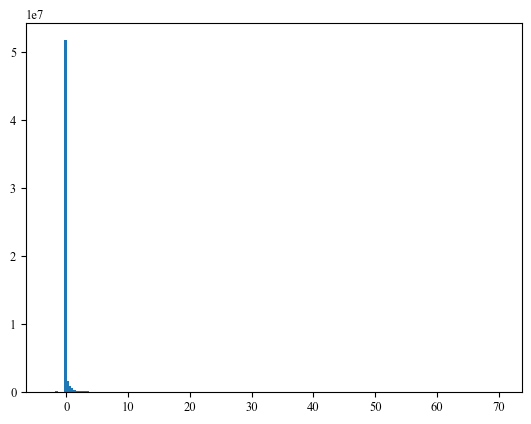

In [571]:
plt.hist(activations['core'].flatten(),bins=200)

In [ ]:
def SpatialInformation(firing,occu):
    p_occu = occu/occu.flatten().sum()
    fr_x = firing/occu
    fr_mean = firing.flatten().sum()/occu[:].sum()
    out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
    return( out )
    
xbound=(100,2000)
ybound=(100,2000)
grain = 19
occu_xya=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),density=False)[0]

tmp_act=activations

grain=19
hla_xya=np.zeros((grain,grain,12,128))
for i in range(128):
    hla_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['decoder.mlp.2'][:,i]*(tmp_act['decoder.mlp.2'][:,i]>0),density=False)[0]

sids=tmp_act['core'][:,:-13:15]

grain=19
seq0_xya=np.zeros((grain,grain,12,16))
for i in range(16):
    seq0_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=sids[:,i],density=False)[0]

grain=19
seqall_xya=np.zeros((grain,grain,12,16*15))
for i in range(16*15):
    seqall_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['core'][:,i],density=False)[0]

SI_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i],occu_xya) for i in range(128)])
SI_seq0=np.array([SpatialInformation(seq0_xya[:,:,:,i],occu_xya) for i in range(16)])
SI_seqall=np.array([SpatialInformation(seqall_xya[:,:,:,i],occu_xya) for i in range(16*15)])

/tmp/ipykernel_1267942/1295001479.py:3: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_1267942/1295001479.py:5: RuntimeWarning: divide by zero encountered in log
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/1295001479.py:5: RuntimeWarning: invalid value encountered in multiply
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/1295001479.py:5: RuntimeWarning: invalid value encountered in true_divide
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())


In [249]:
SI_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i],occu_xya) for i in range(128)])

/tmp/ipykernel_1267942/1295001479.py:3: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_1267942/1295001479.py:5: RuntimeWarning: divide by zero encountered in log
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/1295001479.py:5: RuntimeWarning: invalid value encountered in multiply
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/1295001479.py:5: RuntimeWarning: invalid value encountered in true_divide
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())


In [256]:
hla_xya_po=hla_xya[:,:,:,:]*(hla_xya[:,:,:,:]>0)
hla_positive = hla_xya_po.reshape(-1,128).sum(0)


In [264]:
np.nonzero(hla_positive <1e-4)

(array([ 8, 96]),)

In [266]:
hla_xya[:,:,:,59].sum()

10004.461905166507

In [260]:
SI_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i]*(hla_xya[:,:,:,i]>0),occu_xya) for i in range(128)])


/tmp/ipykernel_1267942/1295001479.py:3: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_1267942/1295001479.py:5: RuntimeWarning: divide by zero encountered in log
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/1295001479.py:5: RuntimeWarning: invalid value encountered in multiply
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/1295001479.py:5: RuntimeWarning: invalid value encountered in true_divide
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())


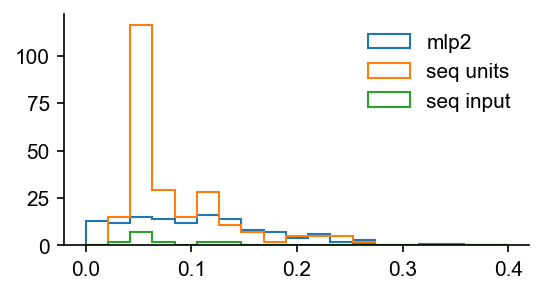

In [261]:
plt.figure(figsize=(4,2),dpi=150)
plt.hist(SI_mlp2,np.linspace(0,0.4,20),histtype='step',label='mlp2')
plt.hist(SI_seqall,np.linspace(0,0.4,20),histtype='step',label='seq units')
plt.hist(SI_seq0,np.linspace(0,0.4,20),histtype='step',label='seq input')
plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)

In [253]:
np.isnan(SI_mlp2).sum(),np.isnan(SI_seq0).sum(),np.isnan(SI_seqall).sum()

(0, 0, 0)

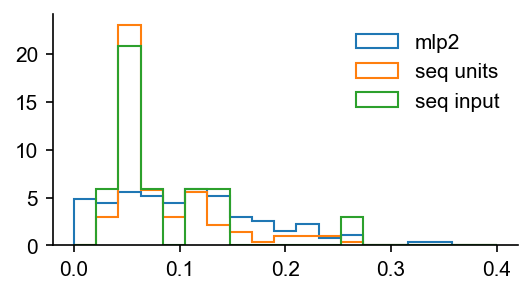

In [262]:
plt.figure(figsize=(4,2),dpi=150)
plt.hist(SI_mlp2,np.linspace(0,0.4,20),histtype='step',label='mlp2',density=True)
plt.hist(SI_seqall,np.linspace(0,0.4,20),histtype='step',label='seq units',density=True)
plt.hist(SI_seq0,np.linspace(0,0.4,20),histtype='step',label='seq input',density=True)
plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)

In [270]:
SI_pos_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i].sum(-1),occu_xya.sum(-1)) for i in range(128)])
SI_pos_seq0=np.array([SpatialInformation(seq0_xya[:,:,:,i].sum(-1),occu_xya.sum(-1)) for i in range(16)])
SI_pos_seqall=np.array([SpatialInformation(seqall_xya[:,:,:,i].sum(-1),occu_xya.sum(-1)) for i in range(16*15)])

/tmp/ipykernel_1267942/1295001479.py:3: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_1267942/1295001479.py:5: RuntimeWarning: divide by zero encountered in log
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/1295001479.py:5: RuntimeWarning: invalid value encountered in multiply
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/1295001479.py:5: RuntimeWarning: invalid value encountered in true_divide
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())


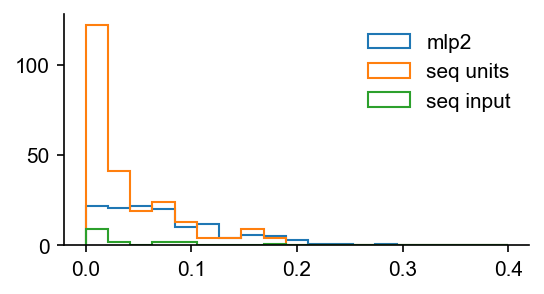

In [271]:
plt.figure(figsize=(4,2),dpi=150)
plt.hist(SI_pos_mlp2,np.linspace(0,0.4,20),histtype='step',label='mlp2')
plt.hist(SI_pos_seqall,np.linspace(0,0.4,20),histtype='step',label='seq units')
plt.hist(SI_pos_seq0,np.linspace(0,0.4,20),histtype='step',label='seq input')
plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)

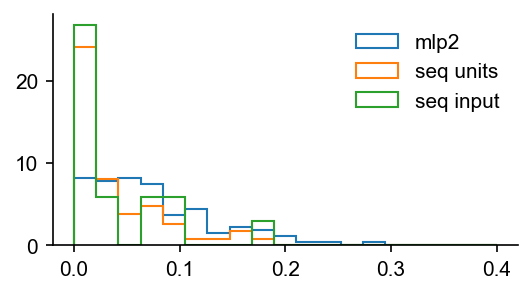

In [272]:
plt.figure(figsize=(4,2),dpi=150)
plt.hist(SI_pos_mlp2,np.linspace(0,0.4,20),histtype='step',label='mlp2',density=True)
plt.hist(SI_pos_seqall,np.linspace(0,0.4,20),histtype='step',label='seq units',density=True)
plt.hist(SI_pos_seq0,np.linspace(0,0.4,20),histtype='step',label='seq input',density=True)
plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)

In [ ]:
# place_hd_screening.py
"""Minimal, self‑contained helpers to decide whether a neuron is tuned to both
spatial position **and** head direction (HD).

The workflow mirrors classic place‑cell screening but operates on a **joint
(position, head‑direction) rate map**.  The key statistic is Skaggs‑style
"spatial information" extended to two dimensions.

Dependencies
------------
numpy               >= 1.23
scipy               >= 1.11   (for ndimage.gaussian_filter)
"""

from __future__ import annotations


from scipy.ndimage import gaussian_filter

from typing import Tuple

###############################################################################
# Helper functions
###############################################################################

def _rate_map(
    pos: np.ndarray,
    hd: np.ndarray,
    occ_dur: np.ndarray,
    spike_mask: np.ndarray,
    pos_edges: np.ndarray,
    hd_edges: np.ndarray,
    smooth_sigma: Tuple[float, float] = (1.0, 1.0),
) -> Tuple[np.ndarray, np.ndarray]:
    """Return smoothed occupancy and rate map.

    Parameters
    ----------
    pos, hd : (N,) arrays
        Instantaneous position (cm or bin index) and head‑direction (deg 0–360).
    occ_dur : (N,) array
        Time spent in each sample (sec). Usually ``np.diff(times, prepend=times[0])``.
    spike_mask : (N,) bool
        True at samples that carry at least one spike / calcium event.
    pos_edges, hd_edges : 1‑D arrays
        Bin edges for position and HD.
    smooth_sigma : tuple of float
        Gaussian kernel σ in *bins* along (pos, hd).
    """
    # 2‑D occupancy histogram -------------------------------------------------
    occ, *_ = np.histogram2d(
        pos, hd, bins=[pos_edges, hd_edges], weights=occ_dur
    )

    # 2‑D spike histogram -----------------------------------------------------
    spike_occ, *_ = np.histogram2d(
        pos[spike_mask], hd[spike_mask], bins=[pos_edges, hd_edges], weights=occ_dur[spike_mask]
    )

    # Smooth both maps to cut sampling noise ---------------------------------
    occ_s    = gaussian_filter(occ,  sigma=smooth_sigma, mode="constant")
    spike_s  = gaussian_filter(spike_occ, sigma=smooth_sigma, mode="constant")

    with np.errstate(invalid="ignore", divide="ignore"):
        rate_map = spike_s / occ_s

    return occ_s, rate_map


def joint_information(occ: np.ndarray, rate: np.ndarray) -> float:
    """Skaggs information (bits/spike) for a joint (pos, HD) rate map."""
    occ_time       = np.nansum(occ)
    p_ij           = occ / occ_time              # probability of being in each bin
    r_bar          = np.nansum(rate * p_ij)      # overall mean rate

    with np.errstate(invalid="ignore", divide="ignore"):
        term       = p_ij * (rate / r_bar) * np.log2(rate / r_bar)
    return np.nansum(term[np.isfinite(term)])


def circular_shift(arr: np.ndarray, shift: float, period: float) -> np.ndarray:
    """Shift an array of *angles* (deg) or *times* by ``shift`` modulo ``period``."""
    return (arr + shift) % period


def shuffle_information(
    spike_times: np.ndarray,
    behav_times: np.ndarray,
    pos: np.ndarray,
    hd: np.ndarray,
    pos_edges: np.ndarray,
    hd_edges: np.ndarray,
    n_shuffle: int = 500,
    min_shift: float = 5.0,
) -> Tuple[float, float]:
    """Compute observed and shuffled information; return (obs, p‑value)."""
    # Occupancy duration per sample (sec)
    occ_dur = np.diff(behav_times, prepend=behav_times[0])

    # Build sample‑wise spike mask -------------------------------------------
    spike_mask      = np.zeros_like(behav_times, dtype=bool)
    spike_idxs      = np.searchsorted(behav_times, spike_times, side="right") - 1
    spike_mask[spike_idxs] = True

    # Observed information ----------------------------------------------------
    occ, rate       = _rate_map(pos, hd, occ_dur, spike_mask, pos_edges, hd_edges)
    info_obs        = joint_information(occ, rate)

    # Null distribution via circular time‑shift ------------------------------
    T               = behav_times[-1]
    null_infos      = np.empty(n_shuffle)
    rng             = np.random.default_rng()

    for k in range(n_shuffle):
        shift       = rng.uniform(min_shift, T - min_shift)
        # shift spike times relative to behaviour
        shifted     = circular_shift(spike_times, shift, T)
        s_idx       = np.searchsorted(behav_times, shifted, side="right") - 1
        s_mask      = np.zeros_like(behav_times, dtype=bool)
        s_mask[s_idx] = True
        occ_null, rate_null = _rate_map(pos, hd, occ_dur, s_mask, pos_edges, hd_edges)
        null_infos[k]       = joint_information(occ_null, rate_null)

    p_val           = (null_infos >= info_obs).mean()
    return info_obs, p_val

###############################################################################
# Public API
###############################################################################

def is_place_hd_cell(
    spike_times: np.ndarray,
    behav_times: np.ndarray,
    pos: np.ndarray,
    hd: np.ndarray,
    pos_edges: np.ndarray | int = 50,
    hd_edges: np.ndarray | int  = 60,
    thr_info: float = 0.3,
    alpha: float = 0.05,
    **shuffle_kwargs,
) -> bool:
    """Return **True** if the cell passes the joint (position, HD) information test.

    Parameters
    ----------
    spike_times : 1‑D array (sec)
        Timestamps of spikes / Ca²⁺ events.
    behav_times : 1‑D array (sec)
        Behavioural timebase; must bracket ``spike_times``.
    pos, hd : 1‑D arrays
        Position (cm) and head direction (deg 0–360) sampled at ``behav_times``.
    pos_edges, hd_edges : int or 1‑D arrays
        Number of bins or explicit bin edges for position and HD.
    thr_info : float
        Minimum bits/spike required.
    alpha : float
        Shuffle‑test significance threshold.
    **shuffle_kwargs
        Extra arguments forwarded to :func:`shuffle_information`.
    """
    # Convert num‑bins to edges if needed
    if isinstance(pos_edges, int):
        pos_edges = np.linspace(pos.min(), pos.max(), pos_edges + 1)
    if isinstance(hd_edges, int):
        hd_edges  = np.linspace(0, 360, hd_edges + 1)

    info_obs, p_val = shuffle_information(
        spike_times, behav_times, pos, hd, pos_edges, hd_edges, **shuffle_kwargs
    )

    return (info_obs >= thr_info) and (p_val < alpha)

###############################################################################
# Example usage
###############################################################################
if __name__ == "__main__":
    # Fake data for a quick smoke test ---------------------------------------
    rng           = np.random.default_rng(42)
    T             = 300.0                  # recording length (sec)
    behav_times   = np.arange(0, T, 0.02)  # 50 Hz tracking

    # Random walk in 1‑D lane (200 cm) + random HD ---------------------------
    pos           = np.cumsum(rng.normal(scale=1.0, size=behav_times.size))
    pos           = np.mod(pos, 200.0)     # wrap
    hd            = np.mod(rng.normal(loc=0, scale=90, size=behav_times.size), 360)

    # Simulate a neuron that fires in a window of pos=(80–120 cm) & hd=±30 deg
    in_field      = (80 <= pos) & (pos <= 120) & (hd <= 30)
    base_rate     = 0.02      # spikes/s outside field
    field_rate    = 5.0       # spikes/s inside field
    inst_rate     = np.where(in_field, field_rate, base_rate)
    spike_mask    = rng.random(size=inst_rate.size) < (inst_rate * 0.02)  # dt=20 ms
    spike_times   = behav_times[spike_mask]

    # Run the test -----------------------------------------------------------
    is_pc         = is_place_hd_cell(
        spike_times, behav_times, pos, hd, pos_edges=40, hd_edges=36,
        n_shuffle=200, min_shift=10.0, thr_info=0.5
    )
    print("Place + HD cell?", is_pc)


### place field

In [ ]:
# check model weights connecting to activations['decoder.mlp.2'] unit 59
# Locate the layer in the model   'action_parameterization.distribution_linear'
decoder_layer = dict(actor_critic.named_modules())['decoder.mlp.2']

# Access the weights of the layer
weights = decoder_layer.weight.detach().cpu().numpy()  # Shape: (output_units, input_units)

# Extract weights connecting to unit 59
unit_59_weights = weights[59]

# Print or analyze the weights
print(f"Weights connecting to unit 59 in 'decoder.mlp.2': {unit_59_weights}")

Weights connecting to unit 59 in 'decoder.mlp.2': [ 0.13177198 -0.01394533 -0.09142675  0.18912433  0.03310088 -0.06231754
  0.02469665 -0.0906596  -0.00059399 -0.12841994 -0.06079883  0.04208967
 -0.1371258   0.00206187 -0.06673939 -0.06549485 -0.03892341  0.010962
  0.03448066 -0.09256995  0.12356075  0.09720277  0.09101482  0.10359576
  0.05852258  0.03621681 -0.09630875  0.02795245 -0.0423042   0.15617247
  0.19669265  0.00833524  0.04021426 -0.09451926  0.18441197  0.0383905
  0.10036131 -0.11278711  0.07095444 -0.05503753  0.08516718  0.0853999
  0.08556565  0.07719789  0.07424161 -0.0828609   0.01668802  0.10617121
 -0.18518788  0.03676625 -0.06504232  0.08623154  0.07546169 -0.0070044
 -0.04276041  0.11424936 -0.1602431   0.02179576 -0.04900989  0.2116445
  0.09990288  0.11866186  0.03649523  0.03913787  0.01806322 -0.02011169
  0.08386746  0.06847691  0.02034568  0.11207191  0.20807663  0.01303959
 -0.00291557  0.05622108 -0.07522944  0.08542843 -0.03811241 -0.00810773
 -0.058

In [273]:
print(actor_critic)

ActorCriticSharedWeights(
  (obs_normalizer): ObservationNormalizer()
  (returns_normalizer): RecursiveScriptModule(original_name=RunningMeanStdInPlace)
  (encoder): HipposlamEncoder(
    (depth_encoder): DepthEncoder(
      (downsample): Upsample(size=(1, 10), mode='nearest')
    )
    (basic_encoder): ResnetEncoder(
      (conv_head): Sequential(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
        (2): ResBlock(
          (res_block_core): Sequential(
            (0): ReLU()
            (1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (2): ReLU()
            (3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          )
        )
        (3): ResBlock(
          (res_block_core): Sequential(
            (0): ReLU()
            (1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (2

In [246]:
dict(actor_critic.named_modules()).keys()
# how to display numbers in .2f format in output

dict_keys(['', 'obs_normalizer', 'returns_normalizer', 'encoder', 'encoder.depth_encoder', 'encoder.depth_encoder.downsample', 'encoder.basic_encoder', 'encoder.basic_encoder.conv_head', 'encoder.basic_encoder.conv_head.0', 'encoder.basic_encoder.conv_head.1', 'encoder.basic_encoder.conv_head.2', 'encoder.basic_encoder.conv_head.2.res_block_core', 'encoder.basic_encoder.conv_head.2.res_block_core.0', 'encoder.basic_encoder.conv_head.2.res_block_core.1', 'encoder.basic_encoder.conv_head.2.res_block_core.2', 'encoder.basic_encoder.conv_head.2.res_block_core.3', 'encoder.basic_encoder.conv_head.3', 'encoder.basic_encoder.conv_head.3.res_block_core', 'encoder.basic_encoder.conv_head.3.res_block_core.0', 'encoder.basic_encoder.conv_head.3.res_block_core.1', 'encoder.basic_encoder.conv_head.3.res_block_core.2', 'encoder.basic_encoder.conv_head.3.res_block_core.3', 'encoder.basic_encoder.conv_head.4', 'encoder.basic_encoder.conv_head.5', 'encoder.basic_encoder.conv_head.6', 'encoder.basic_enc

In [243]:
unit_59_weights.shape

(128,)

/tmp/ipykernel_1267942/2493835482.py:1: RuntimeWarning: invalid value encountered in true_divide
  tmp=np.nansum(seq0_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)


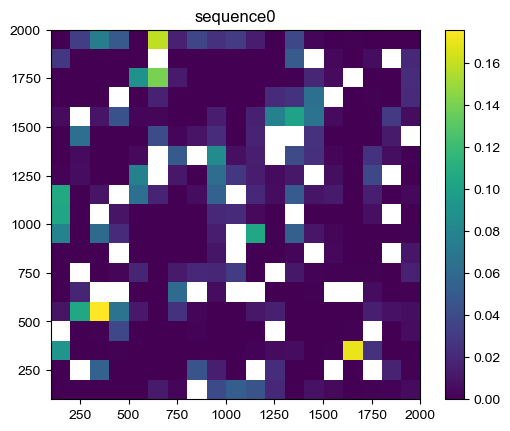

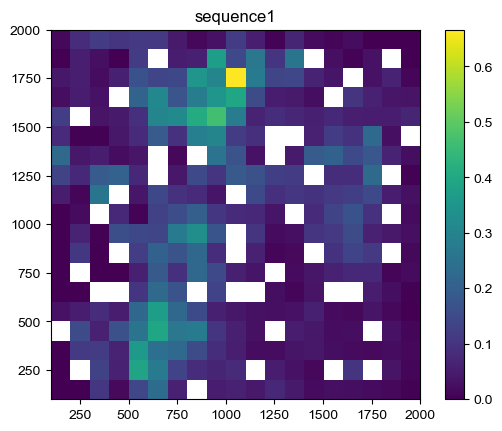

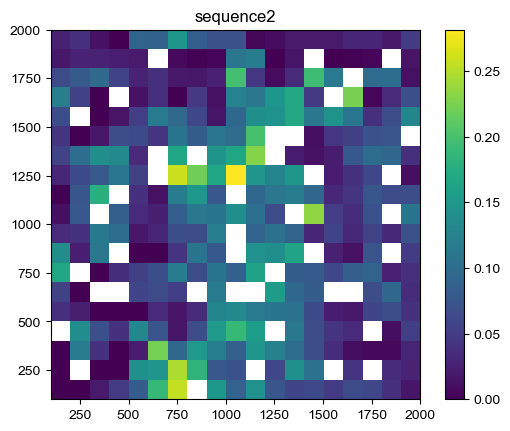

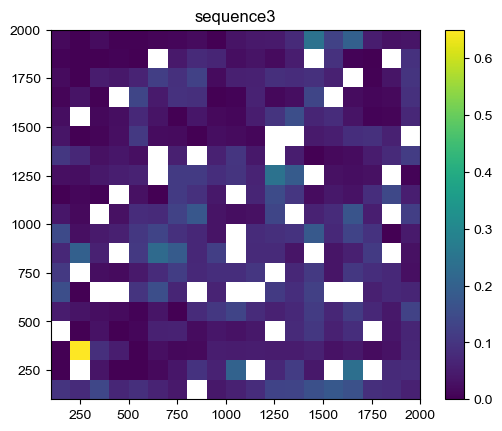

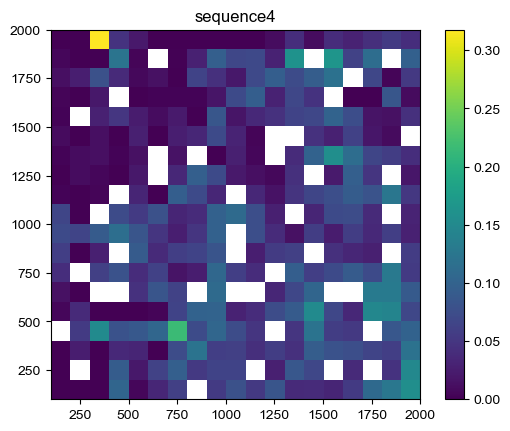

...

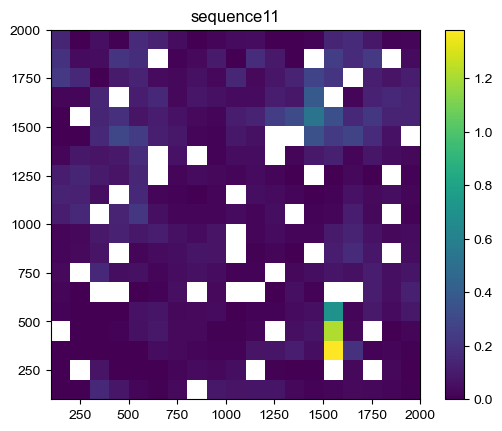

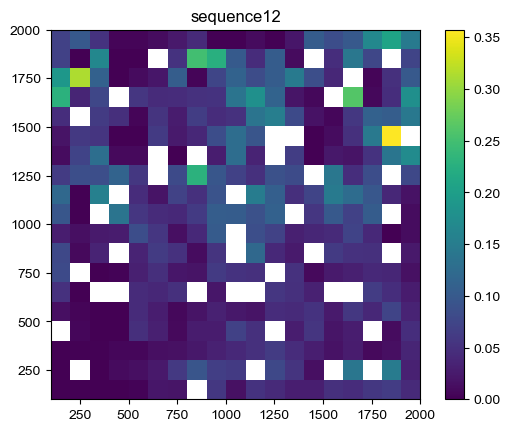

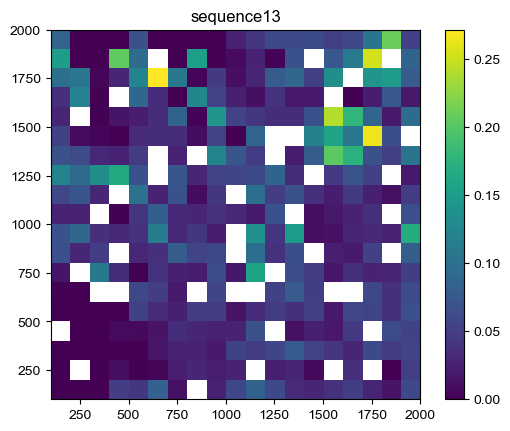

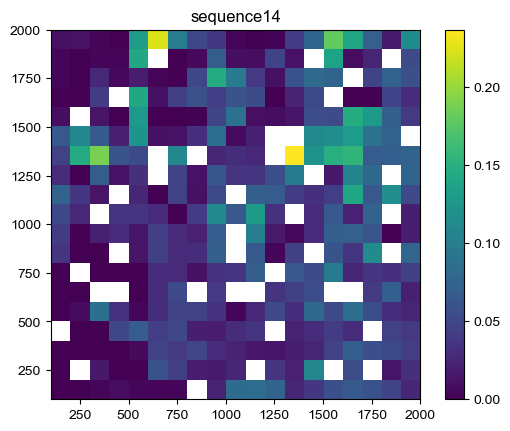

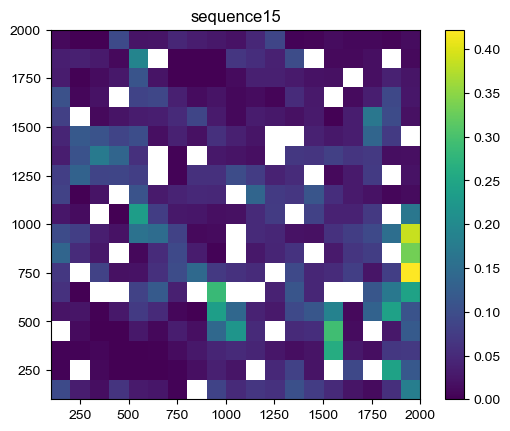

In [231]:
tmp=np.nansum(seq0_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
for i in range(16):
    plt.figure()
    plt.title(f"sequence{i}")
    plt.imshow(tmp[:,:,i].T,vmin=0,extent=[100,2000,100,2000],origin='lower')
    plt.colorbar()

In [268]:
np.nonzero(SI_mlp2>0.2)

(array([  4,  18,  30,  52,  59,  60,  64,  90,  92, 107, 112, 118, 123,
        124, 127]),)

/tmp/ipykernel_1267942/4231431943.py:1: RuntimeWarning: invalid value encountered in true_divide
  tmp=np.nansum(hla_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)


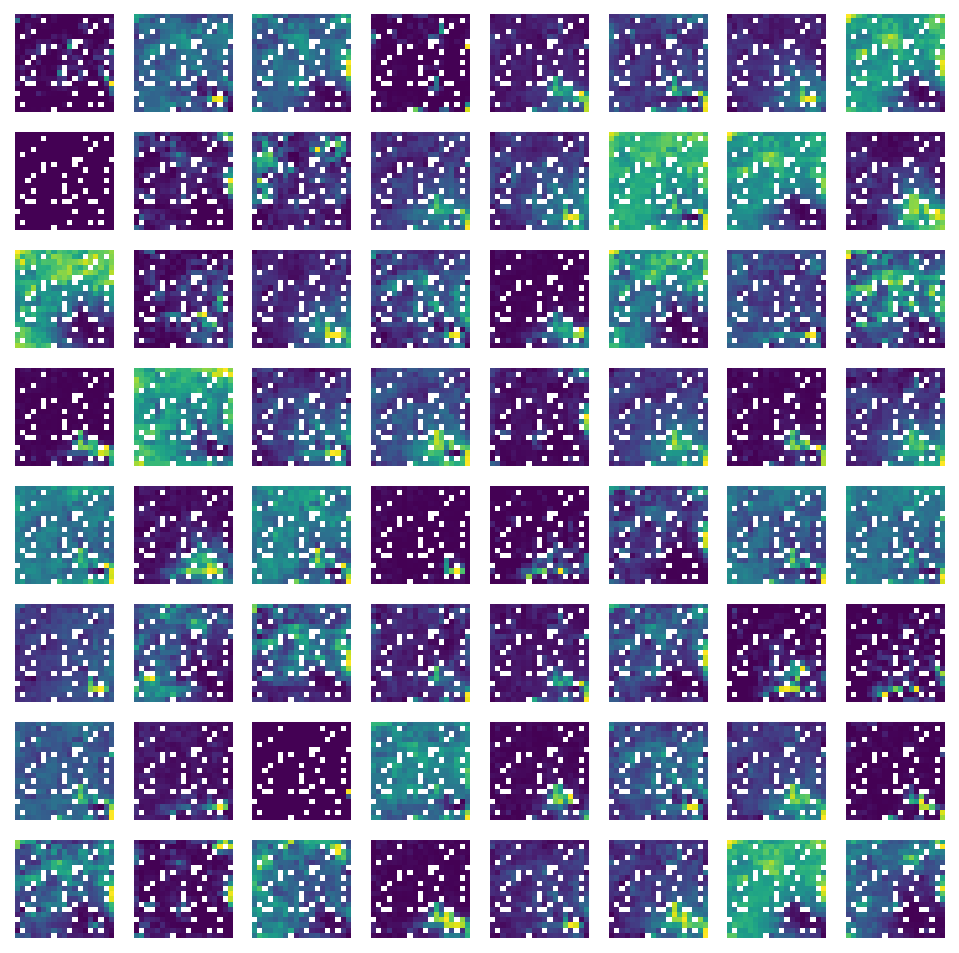

In [277]:
tmp=np.nansum(hla_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
fig,ax = plt.subplots(8, 8, figsize=(8, 8), dpi=150)
ax = ax.flatten()
for i in range(64):#np.nonzero(SI_mlp2>0.2)[0]:
    # ax[i].set_title(f"mlp2, unit {i}")
    ax[i].imshow(tmp[:,:,i].T,extent=[100,2000,100,2000],origin='lower')
    ax[i].set_axis_off()
    # ax[i].  a colorbar()

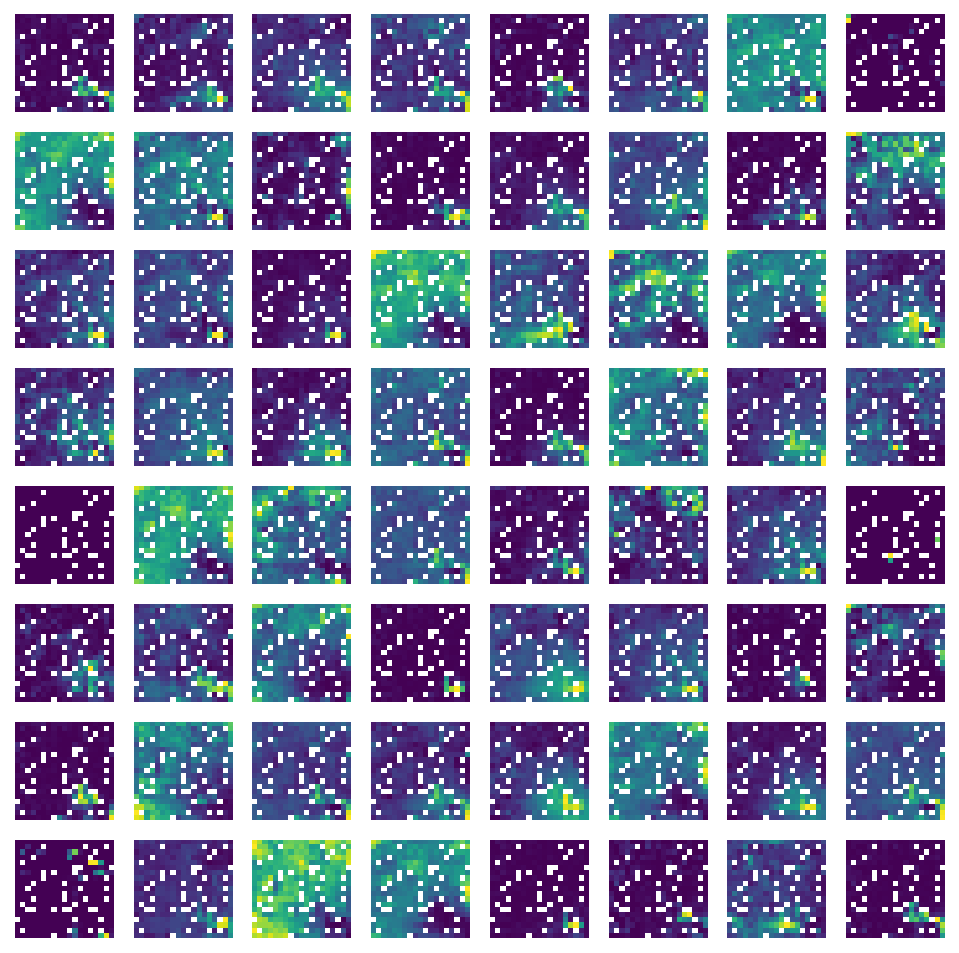

In [279]:
fig,ax = plt.subplots(8, 8, figsize=(8, 8), dpi=150)
ax = ax.flatten()
for i in range(64):#np.nonzero(SI_mlp2>0.2)[0]:
    # ax[i].set_title(f"mlp2, unit {i}")
    ax[i].imshow(tmp[:,:,64+i].T,extent=[100,2000,100,2000],origin='lower')
    ax[i].set_axis_off()

In [302]:
tmp=np.nansum(hla_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)

/tmp/ipykernel_1267942/682252563.py:1: RuntimeWarning: invalid value encountered in true_divide
  tmp=np.nansum(hla_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)


In [ ]:
# check model weights connecting to activations['decoder.mlp.2'] unit 59
# Locate the layer in the model   'action_parameterization.distribution_linear'
action_layer = dict(actor_critic.named_modules())['action_parameterization.distribution_linear']

# Access the weights of the layer
weights = action_layer.weight.detach().cpu().numpy()  # Shape: (output_units, input_units)

In [1002]:
mpl0weight=dict(actor_critic.named_modules())['decoder.mlp.0'].weight.detach().cpu().numpy()
mpl2weight=dict(actor_critic.named_modules())['decoder.mlp.2'].weight.detach().cpu().numpy()


In [1004]:
weightcombined=mpl2weight@mpl0weight

In [1005]:
weight_mlp_seqs=abs(weightcombined[:,:-13]).reshape(128,16,-1).sum(-1)

In [985]:
entropy_mlp=np.array([entropy(x) for x in weight_mlp_seqs])
np.nonzero(entropy_mlp>2.770)

NameError: name 'entropy' is not defined

In [986]:
plt.hist(entropy_mlp)

NameError: name 'entropy_mlp' is not defined

In [987]:
plt.imshow(weight_mlp_seqs[np.nonzero(entropy_mlp>2.770)[0],:])

NameError: name 'entropy_mlp' is not defined

In [988]:
weights[0]

DGProjection_batchnorm_relu(
  (linear): Linear(in_features=259, out_features=16, bias=True)
  (batchnorm1d): BatchNorm1d(16, eps=1e-05, momentum=0.05, affine=False, track_running_stats=True)
  (activation): ReLU()
)

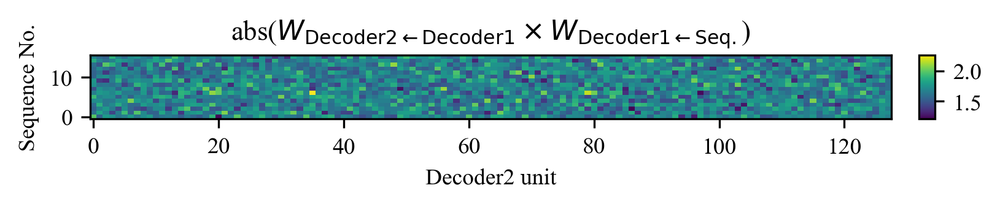

In [1016]:
# plt.figure(figsize=(6,2),dpi=300)
# plt.imshow(weight_mlp_seqs.T)
# plt.xlabel("mlp2 unit")
# plt.ylabel("sequence number")
# cbar=plt.colorbar(orientation='horizontal')

# import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(figsize=(5.5, 1.2), dpi=300)
im = ax.imshow(weight_mlp_seqs.T, aspect='auto', origin='lower')
ax.set_xlabel("Decoder2 unit")
ax.set_ylabel("Sequence No.")

# Create space below the image for the colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="2%", pad=0.15)  # pad=0.4 increases vertical gap

# Draw colorbar in cax
cbar = plt.colorbar(im, cax=cax, orientation='vertical')
ax.set_title(r"abs($W_{\mathrm{Decoder2} \leftarrow \mathrm{Decoder1}} \times W_{\mathrm{Decoder1} \leftarrow \mathrm{Seq.}}$)")
# cbar.ax.set_xlabel(r"abs($W_{\mathrm{Decoder2} \leftarrow \mathrm{Decoder1}} \times W_{\mathrm{Decoder1} \leftarrow \mathrm{Seq.}}$)",labelpad=20)
#             #    "\n(averaged over units within sequences)")

fig.tight_layout()
fig.savefig(current_fig_path/"weight_mlp2_seqs.pdf", dpi=300,bbox_inches='tight')
# fig.savefig(current_fig_path/"weight_mlp2_seqs.png", dpi=300,bbox_inches='tight')


In [989]:
weight_mlp0_seqs=abs(mpl0weight[:,:-13]).reshape(128,16,-1).sum(-1)

In [994]:
mpl0weight.shape

(128, 1149)

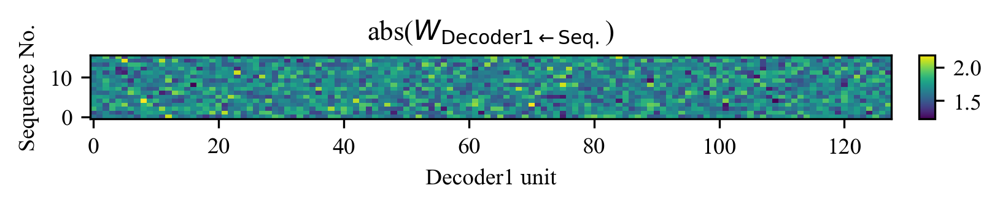

In [1018]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(figsize=(5.5, 1.2), dpi=300)
im = ax.imshow(weight_mlp0_seqs.T, aspect='auto', origin='lower')
ax.set_xlabel("Decoder1 unit")
ax.set_ylabel("Sequence No.")

# Create space below the image for the colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="2%", pad=0.15)  # pad=0.4 increases vertical gap

# Draw colorbar in cax
cbar = plt.colorbar(im, cax=cax, orientation='vertical')
ax.set_title(r"abs($W_{\mathrm{Decoder1} \leftarrow \mathrm{Seq.}}$)")
# cbar.set_label(r"abs($W_{\mathrm{Decoder1} \leftarrow \mathrm{Seq.}}$)")
            #    "\n(averaged over units within sequences)")

fig.tight_layout()#pad=0.3)
fig.savefig(current_fig_path/"weight_mlp0_seqs.pdf", dpi=300,bbox_inches='tight')
# fig.savefig(current_fig_path/"weight_mlp0_seqs.png", dpi=300,bbox_inches='tight')

In [676]:
print(actor_critic)

ActorCriticSharedWeights(
  (obs_normalizer): ObservationNormalizer(
    (running_mean_std): RunningMeanStdDictInPlace(
      (running_mean_std): ModuleDict(
        (obs): RunningMeanStdInPlace()
      )
    )
  )
  (returns_normalizer): RecursiveScriptModule(original_name=RunningMeanStdInPlace)
  (encoder): HipposlamEncoder(
    (depth_encoder): DepthEncoder(
      (downsample): Upsample(size=(1, 10), mode='nearest')
    )
    (basic_encoder): ResnetEncoder(
      (conv_head): Sequential(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
        (2): ResBlock(
          (res_block_core): Sequential(
            (0): ReLU()
            (1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (2): ReLU()
            (3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          )
        )
        (3): ResBlock(
          (res_b

In [677]:
pddata

,frame,agent,x,y,z,rot_x,rot_y,rot_z,info,rot_pi
0,0,0,773.689514,1847.645874,25.125,0.0,3.405762,0.0,"{""num_frames"": 8}",0.059442
1,1,0,816.760620,1849.836548,25.125,0.0,20.302734,0.0,"{""num_frames"": 8}",0.354350
2,2,0,858.281372,1860.803223,25.125,0.0,37.194214,0.0,"{""num_frames"": 8}",0.649161
3,3,0,895.296265,1881.582153,25.125,0.0,54.091187,0.0,"{""num_frames"": 8}",0.944069
4,4,0,925.975769,1912.638550,25.125,0.0,70.988159,0.0,"{""num_frames"": 8}",1.238977
...,...,...,...,...,...,...,...,...,...,...
49996,49996,0,1710.053589,947.876587,25.125,0.0,52.624512,0.0,"{""num_frames"": 8}",0.918471
49997,49997,0,1735.050049,979.922729,25.125,0.0,52.624512,0.0,"{""num_frames"": 8}",0.918471
49998,49998,0,1761.557739,1011.121155,25.125,0.0,35.727539,0.0,"{""num_frames"": 8}",0.623563
49999,49999,0,1783.874146,1038.793335,25.125,0.0,18.836060,0.0,"{""num_frames"": 8}",0.328751


(array([ 3.,  2.,  0.,  5., 12., 17., 24., 37., 23.,  5.]),
 array([2.76291847, 2.76379299, 2.76466751, 2.76554203, 2.76641655,
        2.76729107, 2.76816559, 2.76904011, 2.76991463, 2.77078915,
        2.77166367]),
 <BarContainer object of 10 artists>)

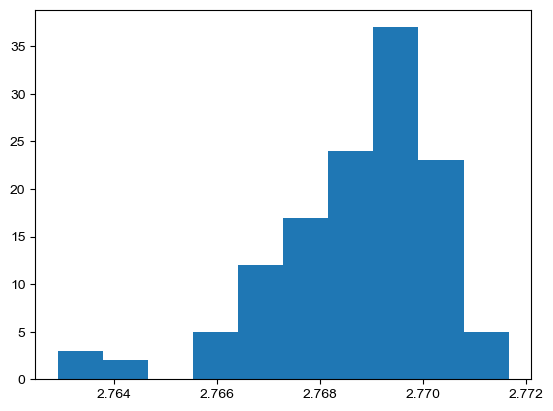

In [351]:
plt.hist([entropy(x) for x in weight_mlp_seqs])

In [327]:
weights.shape

(5, 128)

In [308]:
np.nanmean(tmp,axis=(0,1))[None,None,:].shape,tmp.shape

((1, 1, 128), (19, 19, 128))

In [318]:
(tmp/np.nanmean(tmp,axis=(0,1))[None,None,:]).shape#.mean(-1)

/tmp/ipykernel_1267942/2244212818.py:1: RuntimeWarning: invalid value encountered in true_divide
  (tmp/np.nanmean(tmp,axis=(0,1))[None,None,:]).shape#.mean(-1)


(19, 19, 128)

In [322]:
tmp1=tmp/np.nanmean(tmp,axis=(0,1))[None,None,:]

/tmp/ipykernel_1267942/3535985553.py:1: RuntimeWarning: invalid value encountered in true_divide
  tmp1=tmp/np.nanmean(tmp,axis=(0,1))[None,None,:]


In [332]:
tmp1=tmp*abs(weights).sum(0)[None,None,:]

/tmp/ipykernel_1267942/3585997502.py:1: RuntimeWarning: Mean of empty slice
  plt.imshow(np.nanmean(tmp1,axis=-1),vmin=0)


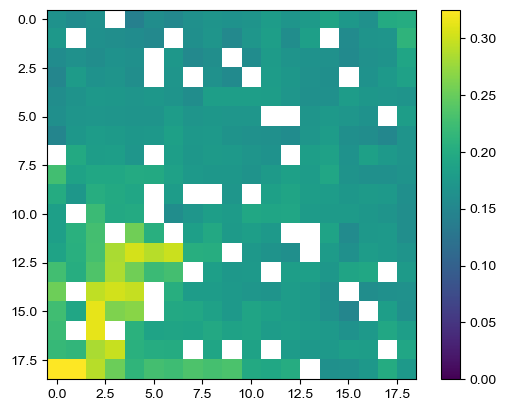

In [335]:
plt.imshow(np.nanmean(tmp1,axis=-1),vmin=0)
plt.colorbar()

/tmp/ipykernel_1267942/2063702002.py:1: RuntimeWarning: invalid value encountered in true_divide
  tmp=np.nansum(hla_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
/tmp/ipykernel_1267942/2063702002.py:2: RuntimeWarning: invalid value encountered in true_divide
  plt.imshow((tmp/np.nanmean(tmp,axis=(0,1))[None,None,:]).mean(-1).T,extent=[100,2000,100,2000],vmin=0,origin='lower')


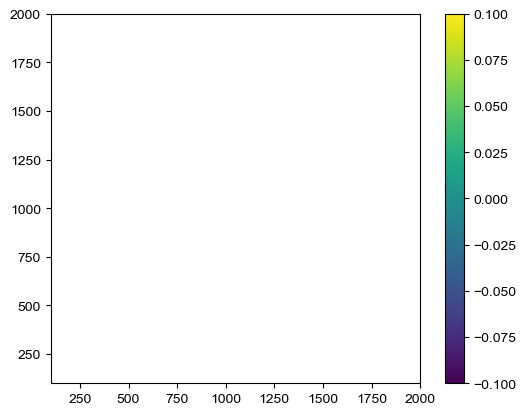

In [290]:
tmp=np.nansum(hla_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
plt.imshow((tmp/np.nanmean(tmp,axis=(0,1))[None,None,:]).mean(-1).T,extent=[100,2000,100,2000],vmin=0,origin='lower')
plt.colorbar()

/tmp/ipykernel_1267942/4228442118.py:1: RuntimeWarning: invalid value encountered in true_divide
  tmp=np.nansum(seqall_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)


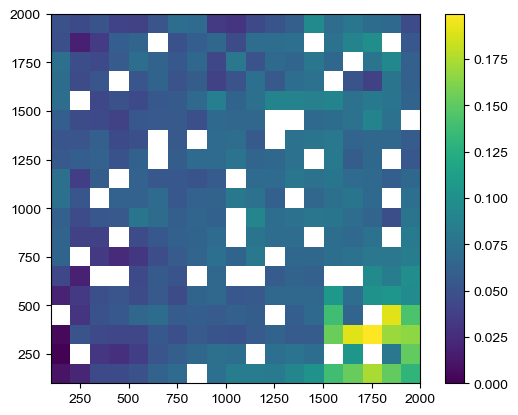

In [284]:
tmp=np.nansum(seqall_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
plt.imshow(tmp.mean(-1).T,extent=[100,2000,100,2000],vmin=0,origin='lower')
plt.colorbar()

/tmp/ipykernel_1267942/2871280924.py:1: RuntimeWarning: invalid value encountered in true_divide
  tmp=np.nansum(seq0_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)


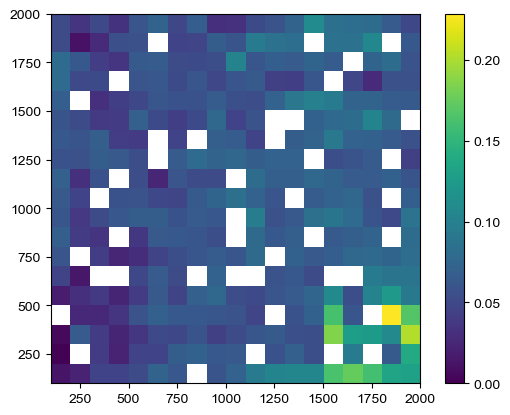

In [287]:
tmp=np.nansum(seq0_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
plt.imshow(tmp.mean(-1).T,extent=[100,2000,100,2000],vmin=0,origin='lower')
plt.colorbar()

In [ ]:
tmp=np.nansum(seqall_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
fig,ax = plt.subplots(8, 8, figsize=(8, 8), dpi=150)
ax = ax.flatten()
for i in range(64):#np.nonzero(SI_mlp2>0.2)[0]:
    # ax[i].set_title(f"mlp2, unit {i}")
    ax[i].imshow(tmp[:,:,i].T,extent=[100,2000,100,2000],origin='lower')
    ax[i].set_axis_off()
    # ax[i].  a colorbar()

In [230]:
activations.keys()

dict_keys(['core', 'decoder.mlp.2', 'encoder.DG_projection.linear'])

In [58]:
import matplotlib.pyplot as plt

In [29]:
core_act=torch.cat(act_buffers['core'], dim=0).numpy() 

In [31]:
tmp=core_act[:,:-13].reshape(50001,16,-1)

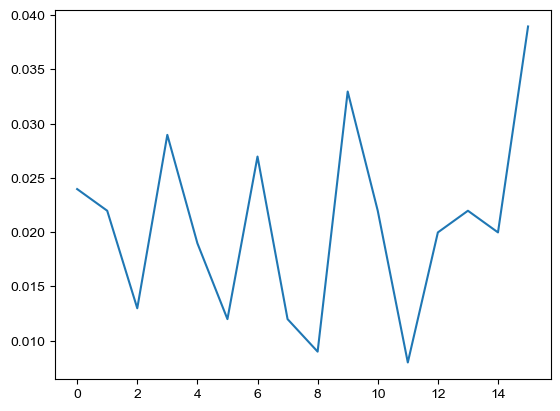

In [79]:

plt.plot((tmp[:,:,0]>0).sum(0)/1001)

In [27]:
import os
from tqdm import tqdm

In [83]:
import matplotlib.pyplot as plt

# from lib.visualization import plot_spatial_specificity
def set_arena(ax):
    xbound = np.array((100, 2000)) * 1.1
    ybound = np.array((100, 2000)) * 1.1
    goal_loc = (1550, 450)

    ax.set_xlim(*xbound)
    ax.set_ylim(*ybound)
    ax.scatter(*goal_loc, c='cyan', marker='D', zorder=3.1, s=100, alpha=0.5)
    return ax
def plot_spatial_specificity_base(ax0, ax1, xya, aedges, xbound, ybound, title='' ):
    ax0.quiver(xya[:, 0], xya[:, 1], np.cos(xya[:, 2]), np.sin(xya[:, 2]), scale=20,alpha=0.7)
    set_arena(ax0)
    ax0.set_title(title)
    abins ,_  = np.histogram(xya[:, 2], bins=aedges)
    ax1.bar(aedges[1:]/2 + aedges[:-1]/2, abins, width=aedges[1] -aedges[0], fill=False)
    ax1.scatter(0, 0, c='k')
    ax1.axis('off')
def plot_spatial_specificity(xya, aedges, xbound, ybound, title='', figsize=(8, 3)):
    fig = plt.figure(figsize=figsize)
    ax0 = fig.add_subplot(1, 2, 1)
    ax1 = fig.add_subplot(1, 2, 2, projection='polar')
    plot_spatial_specificity_base(ax0, ax1, xya, aedges, xbound, ybound, title=title)
    return fig, [ax0, ax1]
# unique_sids = np.unique(trajdf['sid'])
unique_sids = np.arange(16)
aedges = np.linspace(-np.pi, np.pi, 16)
xbound = ( 100 , 2000)
ybound = ( 100 , 2000)
jobname= 'trial'
save_imgs_dir = './state_specificity_'+jobname
os.makedirs(save_imgs_dir, exist_ok=True)
for unique_sid in tqdm(unique_sids):
    if unique_sid==-1: continue
    subdf = pddata[sids[:,unique_sid]>0]
    xya = subdf[['x','y','rot_y']].to_numpy()
    xya[:,2] = xya[:,2]*np.pi/180
    title = f'Pattern{unique_sid+1}, frequency=%.1f%%'%(xya.shape[0]*100/sids.shape[0])
    fig, (ax0, ax1) = plot_spatial_specificity(xya, aedges, xbound, ybound, title=title, figsize=(3,2))#,xbound=arena_xlim,ybound=arena_ylim)
    # ax0.set_xlim(*arena_xlim*1.1)
    # ax0.set_ylim(*arena_ylim*1.1)
    ax0.set_xlabel('x (m)')
    ax0.set_ylabel('y (m)')
    plt.sca(ax0)
    # plt.axis('equal')
    ax0.spines[['top','right']].set_visible(False)
    fig.tight_layout()
    fig.savefig(save_imgs_dir+'/%d.png'%unique_sid, dpi=300)
    plt.close(fig)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:02<00:00,  7.00it/s]


In [36]:
npmlp2=torch.cat(act_buffers['decoder.mlp.2'], dim=0).numpy() 

In [37]:
npmlp2.shape

(50001, 128)

In [78]:
xbound=(100,2000)
ybound=(100,2000)

In [77]:
pddata['x'].min(),pddata['x'].max()

(116.125, 1983.875)

In [79]:
grain=19
hla_location=np.zeros((grain,grain,128))
for i in range(128):
    hla_location[:,:,i]=np.histogram2d(pddata['x'],pddata['y'],(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1)),weights=npmlp2[:,i],density=True)[0]

In [80]:
occu=np.histogram2d(pddata['x'],pddata['y'],(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1)),density=True)[0]

In [81]:
hla_location/=occu[:,:,None]

/tmp/ipykernel_1267942/1312213684.py:1: RuntimeWarning: invalid value encountered in true_divide
  hla_location/=occu[:,:,None]


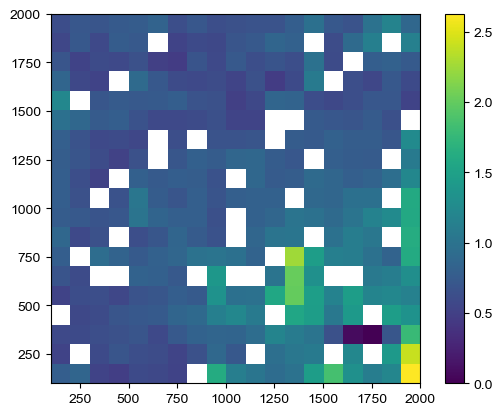

In [93]:
plt.imshow(hla_location[:,:,77].T,vmin=0,extent=[100,2000,100,2000],origin='lower')
plt.colorbar()

In [94]:
grain=19
seq0_location=np.zeros((grain,grain,16))
for i in range(16):
    seq0_location[:,:,i]=np.histogram2d(pddata['x'],pddata['y'],(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1)),weights=sids[:,i],density=True)[0]

In [95]:
seq0_location/=occu[:,:,None]

/tmp/ipykernel_1267942/3147677844.py:1: RuntimeWarning: invalid value encountered in true_divide
  seq0_location/=occu[:,:,None]


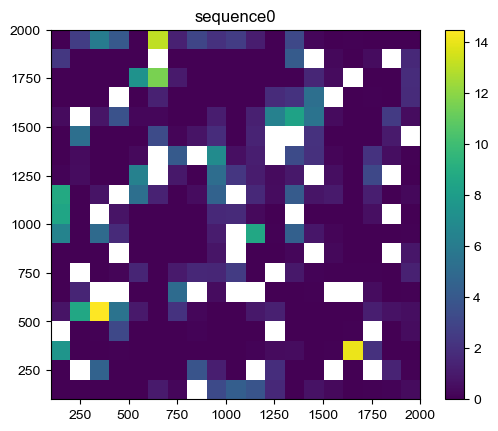

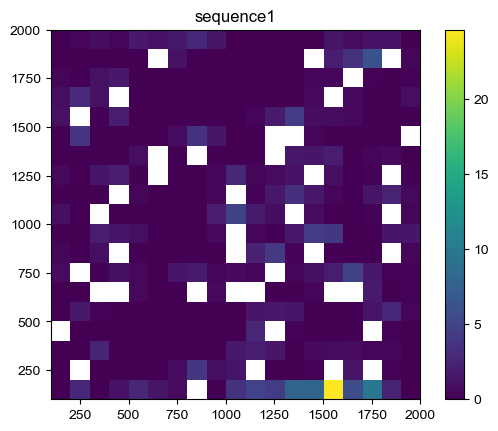

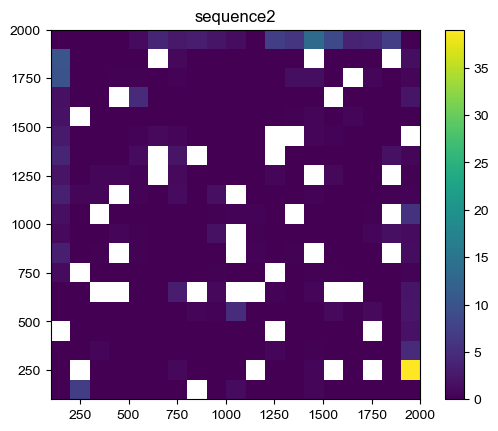

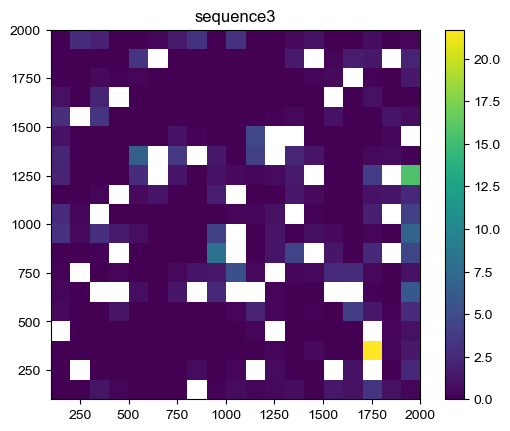

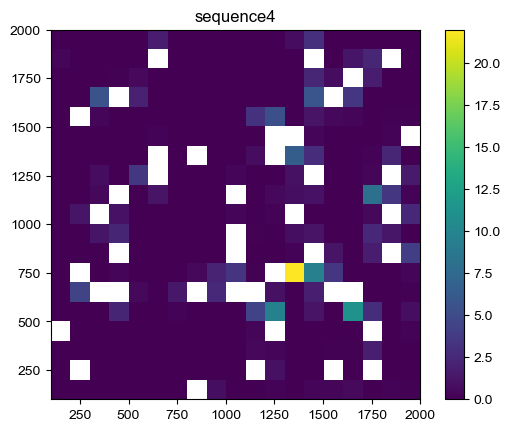

...

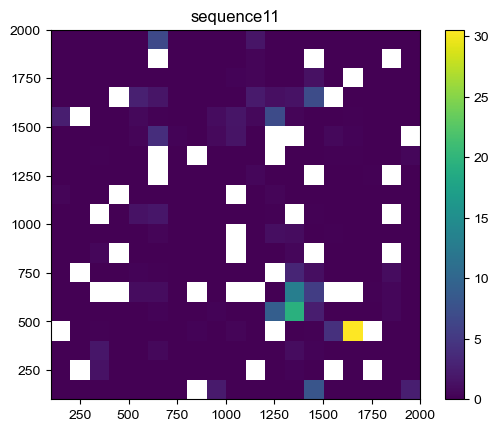

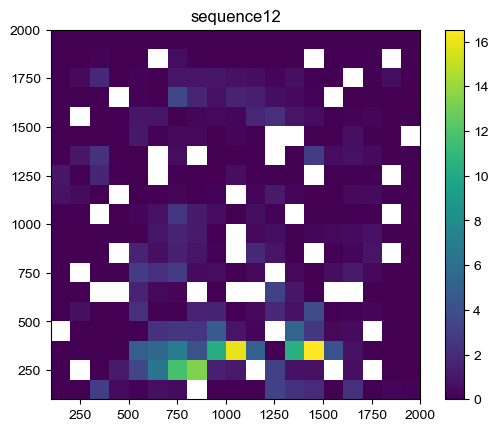

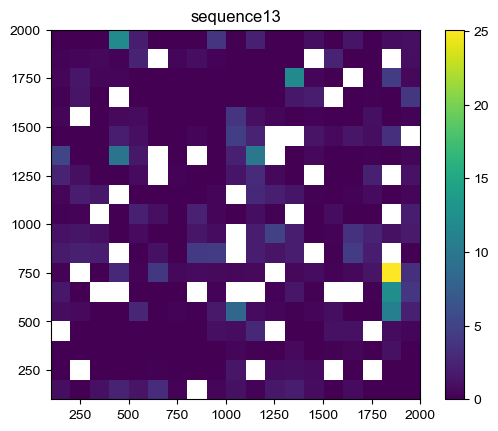

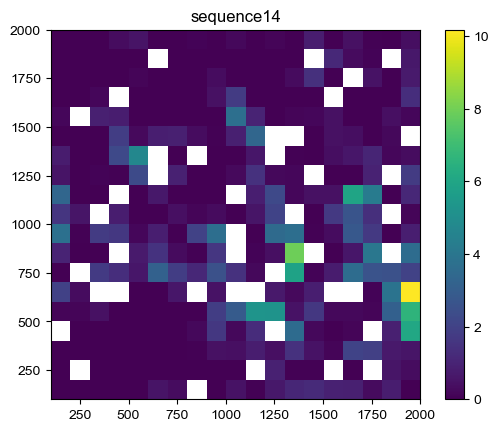

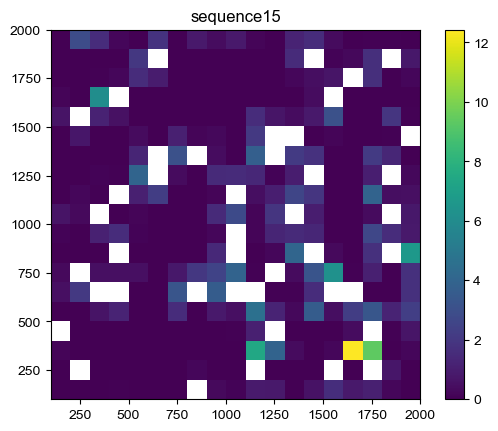

In [97]:
for i in range(16):
    plt.figure()
    plt.title(f"sequence{i}")
    plt.imshow(seq0_location[:,:,i].T,vmin=0,extent=[100,2000,100,2000],origin='lower')
    plt.colorbar()

In [ ]:
*********************
*PPPPPPPPPPPPPPPPPPP*
*PPPPP*PPPPPPP*PPP*P*
*PPPPPPPPPPPPPPP*PPP*
*PPP*PPPPPPPPPP*PPPP*
*P*PPPPPPPPPPPPPPPPP*
*PPPPPPPPPPP**PPPPP**
*PPPPP*P*PPP*PPPPPPP*
*PPPPP*PPPPPPP*PPP*P*
*PPP*PPPPP*PPPPPPPPP*
*PP*PPPPPPPPP*PPPP*P*
*PPPPPPPPP*PPPPPPPPP*
*PPP*PPPPP*PP * P *P*
*P*PPPPPPPPP*      P*
*PP**PPP*P**   **   *
*PPPPPPPPP     G    *
**PPPPPPPPP *    *  *
*PPPPPPPPPPP       P*
*P*PPPPPPPP*P  * *PP*
*PPPPPPP*PPPPP P PPP*
*********************

In [ ]:
import matplotlib.pyplot as plt

# from lib.visualization import plot_spatial_specificity
def set_arena(ax):
    xbound = np.array((0, 2000)) * 1.1
    ybound = np.array((0, 2000)) * 1.1
    goal_loc = (1600, 1600)

    ax.set_xlim(*xbound)
    ax.set_ylim(*ybound)
    ax.scatter(*goal_loc, c='cyan', marker='D', zorder=3.1, s=100, alpha=0.5)
    return ax
def plot_spatial_specificity_base(ax0, ax1, xya, aedges, xbound, ybound, title='' ):
    ax0.quiver(xya[:, 0], xya[:, 1], np.cos(xya[:, 2]), np.sin(xya[:, 2]), scale=20,alpha=0.7)
    set_arena(ax0)
    ax0.set_title(title)
    abins ,_  = np.histogram(xya[:, 2], bins=aedges)
    ax1.bar(aedges[1:]/2 + aedges[:-1]/2, abins, width=aedges[1] -aedges[0], fill=False)
    ax1.scatter(0, 0, c='k')
    ax1.axis('off')
def plot_spatial_specificity(xya, aedges, xbound, ybound, title='', figsize=(8, 3)):
    fig = plt.figure(figsize=figsize)
    ax0 = fig.add_subplot(1, 2, 1)
    ax1 = fig.add_subplot(1, 2, 2, projection='polar')
    plot_spatial_specificity_base(ax0, ax1, xya, aedges, xbound, ybound, title=title)
    return fig, [ax0, ax1]
# unique_sids = np.unique(trajdf['sid'])
unique_sids = np.arange(16)
aedges = np.linspace(-np.pi, np.pi, 16)
xbound = ( 0 , 2000)
ybound = ( 0 , 2000)
jobname= 'trial'
save_imgs_dir = './state_specificity_'+jobname
os.makedirs(save_imgs_dir, exist_ok=True)
for unique_sid in tqdm(unique_sids):
    if unique_sid==-1: continue
    subdf = pddata[sids[:,unique_sid]>0]
    xya = subdf[['x','y','rot_y']].to_numpy()
    xya[:,2] = xya[:,2]*np.pi/180
    title = f'Pattern{unique_sid+1}, frequency=%.1f%%'%(xya.shape[0]*100/sids.shape[0])
    fig, (ax0, ax1) = plot_spatial_specificity(xya, aedges, xbound, ybound, title=title, figsize=(3,2))#,xbound=arena_xlim,ybound=arena_ylim)
    # ax0.set_xlim(*arena_xlim*1.1)
    # ax0.set_ylim(*arena_ylim*1.1)
    ax0.set_xlabel('x (cm)')
    ax0.set_ylabel('y (cm)')
    plt.sca(ax0)
    # plt.axis('equal')
    ax0.spines[['top','right']].set_visible(False)
    fig.tight_layout()
    fig.savefig(save_imgs_dir+'/%d.png'%unique_sid, dpi=300)
    plt.close(fig)

(1001, 16)

In [52]:
_ensure_parent(telemetry)

In [53]:
_ensure_parent(csv_path)

### representational geometry

In [357]:
activations.keys()

dict_keys(['core', 'decoder.mlp.2', 'encoder.DG_projection.linear'])

In [ ]:
activa

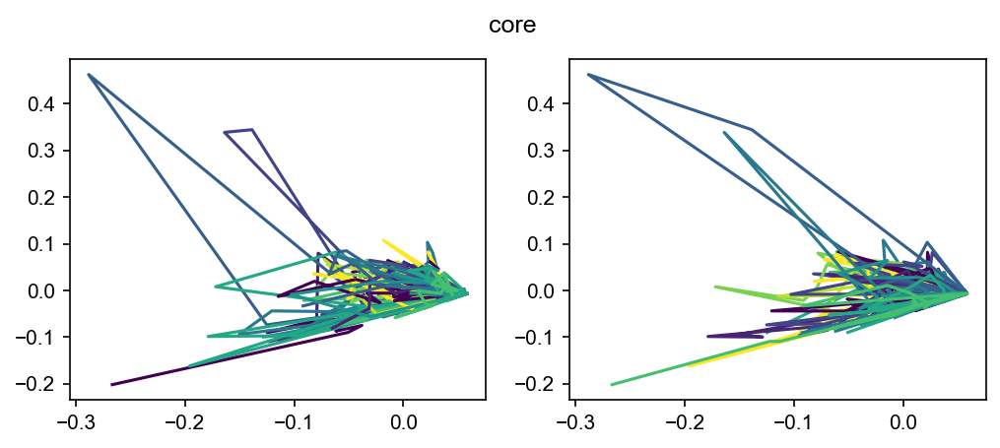

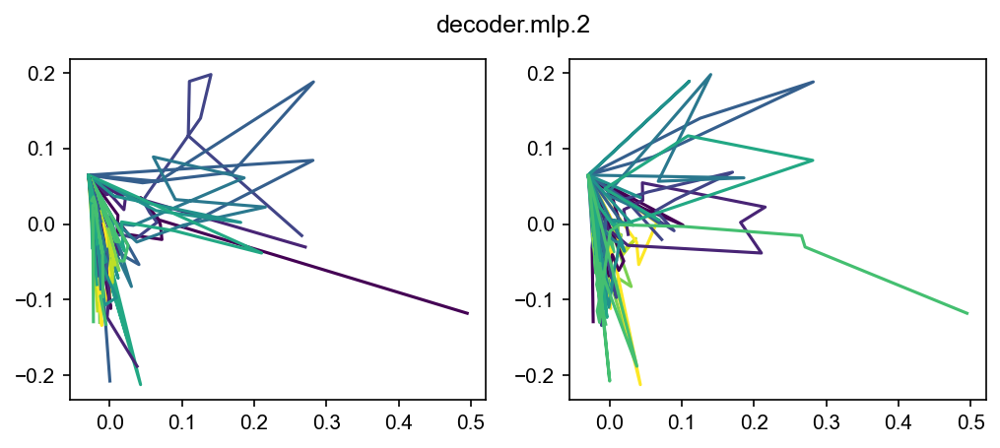

In [361]:
%matplotlib inline
from cycler import cycler
import matplotlib as mpl

xygrain=19
xbound=(100,2000)
ybound=(100,2000)
for name in ['core', 'decoder.mlp.2']:
    tmpact=activations[name]
    num_units=activations[name].shape[1]
    if name=='core':
        num_units -= 13
    hla_location=np.zeros((19,19,num_units))

    for i in range(64):
        hla_location[:,:,i]=np.histogram2d(pddata['x'],pddata['y'],(np.linspace(*xbound,20),np.linspace(*ybound,20)),weights=activations[name][:,i])[0]

    X=hla_location.copy().reshape(19*19,num_units)
    X-=X.mean(0,keepdims=True)
    U,sv,V=np.linalg.svd(X)

    my_colors = mpl.colormaps['viridis'].resampled(11)(np.arange(11))
    custom_cycler = cycler(color=my_colors)


    fig, ax = plt.subplots(1,2,figsize=(8,3),dpi=150)
    ax[0].set_prop_cycle(custom_cycler)
    ax[0].plot(U.reshape(xygrain,xygrain,-1)[:,:,0],U.reshape(xygrain,xygrain,-1)[:,:,1])#,color=mpl.colormaps['viridis'].resampled(11)(np.arange(11)))#,c=xcoors,cmap='viridis')

    ax[1].set_prop_cycle(custom_cycler)
    ax[1].plot(U.reshape(xygrain,xygrain,-1)[:,:,0].T,U.reshape(xygrain,xygrain,-1)[:,:,1].T)#,c=xcoors,cmap='viridis')
    fig.suptitle(name)

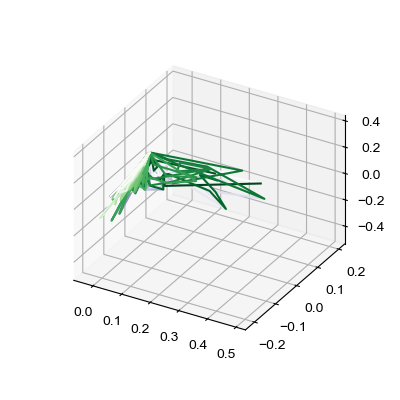

In [363]:
%matplotlib ipympl
from cycler import cycler
from mpl_toolkits.mplot3d import Axes3D


my_colors = mpl.colormaps['viridis'].resampled(xygrain)(np.arange(xygrain))
custom_cycler = cycler(color=my_colors)

fig,ax=plt.subplots(1,1,figsize=(4,4),subplot_kw={"projection": "3d",'proj_type' : 'ortho'})
# fig, ax = plt.subplots(1,1,figsize=(4,3),dpi=150)
ax.set_prop_cycle(custom_cycler)
for i in range(xygrain):
    ax.plot(U.reshape(xygrain,xygrain,-1)[i,:,0],U.reshape(xygrain,xygrain,-1)[i,:,1],U.reshape(xygrain,xygrain,-1)[i,:,2],color=mpl.colormaps['Purples_r'].resampled(xygrain)(i))#,c=xcoors,cmap='viridis')
for i in range(xygrain):
    ax.plot(U.reshape(xygrain,xygrain,-1)[:,i,0],U.reshape(xygrain,xygrain,-1)[:,i,1],U.reshape(xygrain,xygrain,-1)[:,i,2],color=mpl.colormaps['Greens_r'].resampled(xygrain)(i))#,c=xcoors,cmap='viridis')

In [365]:
plt.close(fig)

In [373]:
from sklearn.manifold import MDS
mds=MDS(n_components=3)
U=mds.fit_transform(X)


/home/xiaoxiong/miniforge3/envs/dmlab/lib/python3.8/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


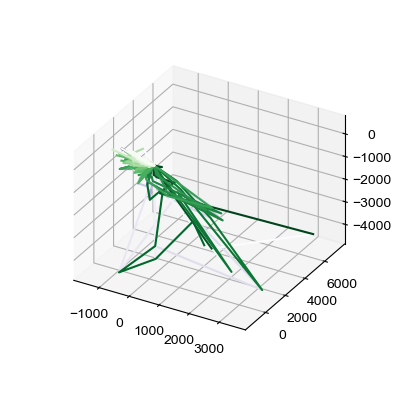

In [374]:
%matplotlib ipympl
from cycler import cycler
from mpl_toolkits.mplot3d import Axes3D


my_colors = mpl.colormaps['viridis'].resampled(xygrain)(np.arange(xygrain))
custom_cycler = cycler(color=my_colors)

fig,ax=plt.subplots(1,1,figsize=(4,4),subplot_kw={"projection": "3d",'proj_type' : 'ortho'})
# fig, ax = plt.subplots(1,1,figsize=(4,3),dpi=150)
ax.set_prop_cycle(custom_cycler)
for i in range(xygrain):
    ax.plot(U.reshape(xygrain,xygrain,-1)[i,:,0],U.reshape(xygrain,xygrain,-1)[i,:,1],U.reshape(xygrain,xygrain,-1)[i,:,2],color=mpl.colormaps['Purples_r'].resampled(xygrain)(i))#,c=xcoors,cmap='viridis')
for i in range(xygrain):
    ax.plot(U.reshape(xygrain,xygrain,-1)[:,i,0],U.reshape(xygrain,xygrain,-1)[:,i,1],U.reshape(xygrain,xygrain,-1)[:,i,2],color=mpl.colormaps['Greens_r'].resampled(xygrain)(i))#,c=xcoors,cmap='viridis')

In [ ]:
mds=MDS(n_components=2)
U=mds.fit_transform(X)

/home/xiaoxiong/miniforge3/envs/dmlab/lib/python3.8/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


/home/xiaoxiong/miniforge3/envs/dmlab/lib/python3.8/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


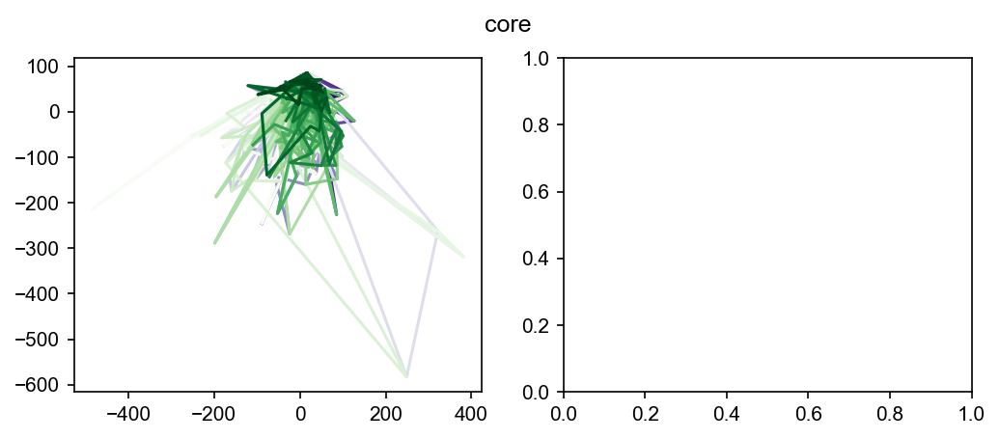

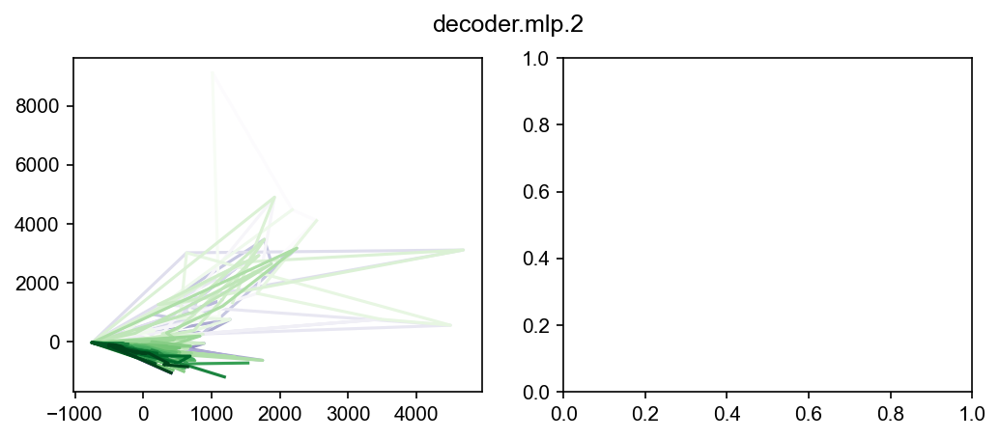

In [372]:
%matplotlib inline
from cycler import cycler
import matplotlib as mpl

xygrain=19
xbound=(100,2000)
ybound=(100,2000)
for name in ['core', 'decoder.mlp.2']:
    tmpact=activations[name]
    num_units=activations[name].shape[1]
    if name=='core':
        num_units -= 13
    hla_location=np.zeros((19,19,num_units))

    for i in range(64):
        hla_location[:,:,i]=np.histogram2d(pddata['x'],pddata['y'],(np.linspace(*xbound,20),np.linspace(*ybound,20)),weights=activations[name][:,i])[0]

    X=hla_location.copy().reshape(19*19,num_units)
    X-=X.mean(0,keepdims=True)
    mds=MDS(n_components=2)
    U=mds.fit_transform(X)

    my_colors = mpl.colormaps['viridis'].resampled(11)(np.arange(11))
    custom_cycler = cycler(color=my_colors)


    fig, ax = plt.subplots(1,2,figsize=(8,3),dpi=150)

    for i in range(xygrain):
        ax[0].plot(U.reshape(xygrain,xygrain,-1)[i,:,0],U.reshape(xygrain,xygrain,-1)[i,:,1],color=mpl.colormaps['Purples_r'].resampled(xygrain)(i))#,c=xcoors,cmap='viridis')
    for i in range(xygrain):
        ax[0].plot(U.reshape(xygrain,xygrain,-1)[:,i,0],U.reshape(xygrain,xygrain,-1)[:,i,1],color=mpl.colormaps['Greens'].resampled(xygrain)(i))#,c=xcoors,cmap='viridis')

    # ax[0].set_prop_cycle(custom_cycler)
    # ax[0].plot(U.reshape(xygrain,xygrain,-1)[:,:,0],U.reshape(xygrain,xygrain,-1)[:,:,1])#,color=mpl.colormaps['viridis'].resampled(11)(np.arange(11)))#,c=xcoors,cmap='viridis')

    # ax[1].set_prop_cycle(custom_cycler)
    # ax[1].plot(U.reshape(xygrain,xygrain,-1)[:,:,0].T,U.reshape(xygrain,xygrain,-1)[:,:,1].T)#,c=xcoors,cmap='viridis')
    fig.suptitle(name)

## L8 R8

In [98]:
import sys

# from sample_factory.enjoy import enjoy
from sf_examples.dmlab.cumstom_enjoy import enjoy
from sf_examples.dmlab.train_hipposlam import parse_dmlab_args, register_dmlab_components



cli = [
    "--algo", "APPO",
    "--env",  "openfield_map2_fixed_loc3",         # pick any DM‑Lab level you have
    "--experiment", "26_hipposlam__e.fra_8_see_8888_n.pol_8_H.L_8_r.siz_253",
    "--encoder_load_path","/home/xiaoxiong/try0120/train_dir/Random3_openfield_new/checkpoint_p0/best_000025288_203030528_reward_94.185.pth",
    "--train_dir", "./train_dir", # anything writable
    "--max_num_frames", "50000",          # short rollout for the test
    "--num_envs", "8",
    "--dmlab_level_cache_path","./.dmlab_cache",
    "--load_checkpoint_kind","latest",
    "--use_jit","False",
    "--no_render",        # <-- skip human window; avoid X11 on servers
]

cli_dict={
 'algo': 'APPO',
 'env': 'openfield_map2_fixed_loc3',
 'experiment': '26_hipposlam__e.fra_8_see_8888_n.pol_8_H.L_8_r.siz_253',
 'encoder_load_path': '/home/xiaoxiong/try0120/train_dir/Random3_openfield_new/checkpoint_p0/best_000025288_203030528_reward_94.185.pth',
 'train_dir': './train_dir',
 'max_num_frames': '50000',
 'num_envs': '8',
 'dmlab_level_cache_path': './.dmlab_cache',
 'load_checkpoint_kind': 'latest',
 'no_render': True,
 'use_jit': False,
}
register_dmlab_components()
cfg = parse_dmlab_args(evaluation=True, argv=cli)

# tweak whatever you like *after* parsing
cfg.with_pos_obs = True
cfg.cli_args=cli_dict
# status = enjoy(cfg)

[2025-05-05 16:37:32,011][1267942] Environment test already registered, overwriting...
[2025-05-05 16:37:32,012][1267942] Environment openfield_map already registered, overwriting...
[2025-05-05 16:37:32,012][1267942] Environment openfield_map2 already registered, overwriting...
[2025-05-05 16:37:32,013][1267942] Environment openfield_map2_fixed_loc3 already registered, overwriting...
[2025-05-05 16:37:32,013][1267942] Environment openfield_map2_fixed_loc2 already registered, overwriting...
[2025-05-05 16:37:32,014][1267942] Environment openfield_map2_fixed_loc1 already registered, overwriting...
[2025-05-05 16:37:32,014][1267942] Environment openfield_map_episode already registered, overwriting...
[2025-05-05 16:37:32,014][1267942] Environment openfield_map_transparent already registered, overwriting...
[2025-05-05 16:37:32,015][1267942] Environment random_maze already registered, overwriting...
[2025-05-05 16:37:32,015][1267942] Environment dmlab_benchmark already registered, overwri

In [ ]:
import time
from collections import deque
from typing import Dict, Tuple

import gymnasium as gym
import numpy as np
import torch
from torch import Tensor

from sample_factory.algo.learning.learner import Learner
from sample_factory.algo.sampling.batched_sampling import preprocess_actions
from sample_factory.algo.utils.action_distributions import argmax_actions
from sample_factory.algo.utils.env_info import extract_env_info
from sample_factory.algo.utils.make_env import make_env_func_batched
from sample_factory.algo.utils.misc import ExperimentStatus
from sample_factory.algo.utils.rl_utils import make_dones, prepare_and_normalize_obs
from sample_factory.algo.utils.tensor_utils import unsqueeze_tensor
from sample_factory.cfg.arguments import load_from_checkpoint
from sample_factory.huggingface.huggingface_utils import generate_model_card, generate_replay_video, push_to_hf
from sample_factory.model.actor_critic import create_actor_critic
from sample_factory.model.model_utils import get_rnn_size
from sample_factory.utils.attr_dict import AttrDict
from sample_factory.utils.typing import Config, StatusCode
from sample_factory.utils.utils import debug_log_every_n, experiment_dir, log

In [ ]:
# ---------------------------------------------------------------------------
# logging helpers (put near the top of the file, after imports)
# ---------------------------------------------------------------------------
import datetime, pathlib, json, h5py, pandas as pd, torch

def _ensure_parent(path: pathlib.Path):
    path.parent.mkdir(parents=True, exist_ok=True)


In [ ]:
%cd ~/from_NEMO/

/home/xiaoxiong/from_NEMO


In [ ]:
    verbose = False

    cfg = load_from_checkpoint(cfg)

    eval_env_frameskip: int = cfg.env_frameskip if cfg.eval_env_frameskip is None else cfg.eval_env_frameskip
    assert (
        cfg.env_frameskip % eval_env_frameskip == 0
    ), f"{cfg.env_frameskip=} must be divisible by {eval_env_frameskip=}"
    render_action_repeat: int = cfg.env_frameskip // eval_env_frameskip
    cfg.env_frameskip = cfg.eval_env_frameskip = eval_env_frameskip
    log.debug(f"Using frameskip {cfg.env_frameskip} and {render_action_repeat=} for evaluation")

    cfg.num_envs = 1

    render_mode = "human"
    if cfg.save_video:
        render_mode = "rgb_array"
    elif cfg.no_render:
        render_mode = None

    env = make_env_func_batched(
        cfg, env_config=AttrDict(worker_index=0, vector_index=0, env_id=0), render_mode=render_mode
    )
    env_info = extract_env_info(env, cfg)

    if hasattr(env.unwrapped, "reset_on_init"):
        # reset call ruins the demo recording for VizDoom
        env.unwrapped.reset_on_init = False
    log.info(env.action_space)
    actor_critic = create_actor_critic(cfg, env.observation_space, env.action_space)
    actor_critic.eval()

[2025-05-04 20:20:12,055][1257122] Loading existing experiment configuration from ./train_dir/13_hipposlam__e.fra_8_see_2222_n.pol_4_H.L_64_r.siz_1149/config.json
[2025-05-04 20:20:12,055][1257122] Overriding arg 'encoder_load_path' with value '/home/xiaoxiong/try0120/train_dir/Random3_openfield_new/checkpoint_p0/best_000025288_203030528_reward_94.185.pth' passed from command line
[2025-05-04 20:20:12,055][1257122] Overriding arg 'train_dir' with value './train_dir' passed from command line
[2025-05-04 20:20:12,056][1257122] Overriding arg 'dmlab_level_cache_path' with value './.dmlab_cache' passed from command line
[2025-05-04 20:20:12,056][1257122] Adding new argument 'fps'=0 that is not in the saved config file!
[2025-05-04 20:20:12,056][1257122] Adding new argument 'eval_env_frameskip'=None that is not in the saved config file!
[2025-05-04 20:20:12,057][1257122] Adding new argument 'no_render'=True that is not in the saved config file!
[2025-05-04 20:20:12,058][1257122] Adding new 

ActorCriticSharedWeights(
  (obs_normalizer): ObservationNormalizer()
  (returns_normalizer): RecursiveScriptModule(original_name=RunningMeanStdInPlace)
  (encoder): HipposlamEncoder(
    (depth_encoder): DepthEncoder(
      (downsample): Upsample(size=(1, 10), mode='nearest')
    )
    (basic_encoder): ResnetEncoder(
      (conv_head): Sequential(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
        (2): ResBlock(
          (res_block_core): Sequential(
            (0): ReLU()
            (1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (2): ReLU()
            (3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          )
        )
        (3): ResBlock(
          (res_block_core): Sequential(
            (0): ReLU()
            (1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (2

In [ ]:
[x for x in dict(actor_critic.named_modules()).keys() if x.startswith('encoder.DG')]

['encoder.DG_projection',
 'encoder.DG_projection.linear',
 'encoder.DG_projection.batchnorm1d',
 'encoder.DG_projection.activation']

In [ ]:
[x for x in dict(actor_critic.named_modules()).keys() if x.startswith('deco')]

['decoder', 'decoder.mlp', 'decoder.mlp.0', 'decoder.mlp.1', 'decoder.mlp.2']

In [ ]:
cfg.env

'openfield_map2_fixed_loc3'

In [99]:
verbose = False

cfg = load_from_checkpoint(cfg)

eval_env_frameskip: int = cfg.env_frameskip 
assert (
    cfg.env_frameskip % eval_env_frameskip == 0
), f"{cfg.env_frameskip=} must be divisible by {eval_env_frameskip=}"
render_action_repeat: int = cfg.env_frameskip // eval_env_frameskip
cfg.env_frameskip = cfg.eval_env_frameskip = eval_env_frameskip
log.debug(f"Using frameskip {cfg.env_frameskip} and {render_action_repeat=} for evaluation")

cfg.num_envs = 1

render_mode = "human"
if cfg.save_video:
    render_mode = "rgb_array"
elif cfg.no_render:
    render_mode = None

env = make_env_func_batched(
    cfg, env_config=AttrDict(worker_index=0, vector_index=0, env_id=0), render_mode=render_mode
)
env_info = extract_env_info(env, cfg)

if hasattr(env.unwrapped, "reset_on_init"):
    # reset call ruins the demo recording for VizDoom
    env.unwrapped.reset_on_init = False
log.info(env.action_space)
actor_critic = create_actor_critic(cfg, env.observation_space, env.action_space)
actor_critic.eval()



device = torch.device("cpu" if cfg.device == "cpu" else "cuda")
actor_critic.model_to_device(device)


#################### register hook
layers_to_log = [
    "encoder.DG_projection.linear",
    "core",
    "decoder.mlp.2"
]          # <- example; edit to taste

# 2B. activation buffer

import collections
act_buffers = collections.defaultdict(list)

def make_hook(layer_name):
    def _hook(_m, _inp, out):
        if isinstance(out, (tuple, list)):      # RNN returns (output, h_n)
            out = out[0]
        act_buffers[layer_name].append(out.detach().cpu())
    return _hook

# attach the hook once
for layer_to_log in layers_to_log:
    try:
        dict(actor_critic.named_modules())[layer_to_log].register_forward_hook(make_hook(layer_to_log))
        log.info("Activation hook registered on %s", layer_to_log)
    except KeyError:
        raise RuntimeError(f"Layer '{layer_to_log}' not found in the network!")

####################


policy_id = cfg.policy_index
# log.info(policy_id)
name_prefix = dict(latest="checkpoint", best="best")[cfg.load_checkpoint_kind]
# log.info(Learner.checkpoint_dir(cfg, policy_id))
checkpoints = Learner.get_checkpoints(Learner.checkpoint_dir(cfg, policy_id), f"{name_prefix}_*")
checkpoint_dict = Learner.load_checkpoint(checkpoints, device)
actor_critic.load_state_dict(checkpoint_dict["model"])

episode_rewards = [deque([], maxlen=100) for _ in range(env.num_agents)]
true_objectives = [deque([], maxlen=100) for _ in range(env.num_agents)]
num_frames = 0

last_render_start = time.time()

def max_frames_reached(frames):
    return cfg.max_num_frames is not None and frames > cfg.max_num_frames

reward_list = []

obs, infos = env.reset()
rnn_states = torch.zeros([env.num_agents, get_rnn_size(cfg)], dtype=torch.float32, device=device)
episode_reward = None
finished_episode = [False for _ in range(env.num_agents)]

video_frames = []
num_episodes = 0

# saved_data=dict()
pose_records = []

with torch.no_grad():
    while not max_frames_reached(num_frames):
        normalized_obs = prepare_and_normalize_obs(actor_critic, obs)

        # if not cfg.no_render:
        #     visualize_policy_inputs(normalized_obs)
        policy_outputs = actor_critic(normalized_obs, rnn_states)

        # sample actions from the distribution by default
        actions = policy_outputs["actions"]

        if cfg.eval_deterministic:
            action_distribution = actor_critic.action_distribution()
            actions = argmax_actions(action_distribution)

        # actions shape should be [num_agents, num_actions] even if it's [1, 1]
        if actions.ndim == 1:
            actions = unsqueeze_tensor(actions, dim=-1)
        actions = preprocess_actions(env_info, actions)

        rnn_states = policy_outputs["new_rnn_states"]

        for _ in range(render_action_repeat):
            # last_render_start = render_frame(cfg, env, video_frames, num_episodes, last_render_start)

            obs, rew, terminated, truncated, infos = env.step(actions)
            # log.info(obs['DEBUG.POS.TRANS'])
            # save info
            frame_idx = num_frames          # or use a wall‑clock timestamp
            pos = obs['DEBUG.POS.TRANS']    # (B,3)
            rot = obs['DEBUG.POS.ROT']      # (B,3) or (B,4) depending on env

            for agent_i in range(env.num_agents):
                pose_records.append({
                    "frame"  : frame_idx,
                    "agent"  : agent_i,
                    "x"      : float(pos[agent_i, 0]),
                    "y"      : float(pos[agent_i, 1]),
                    "z"      : float(pos[agent_i, 2]),
                    "rot_x"  : float(rot[agent_i, 0]),
                    "rot_y"  : float(rot[agent_i, 1]),
                    "rot_z"  : float(rot[agent_i, 2]),
                    # keep the whole info dict as a JSON string for convenience
                    "info"   : json.dumps(infos[agent_i], default=str),
                })



            dones = make_dones(terminated, truncated)
            infos = [{} for _ in range(env_info.num_agents)] if infos is None else infos

            if episode_reward is None:
                episode_reward = rew.float().clone()
            else:
                episode_reward += rew.float()

            num_frames += 1
            if num_frames % 100 == 0:
                log.debug(f"Num frames {num_frames}...")

            dones = dones.cpu().numpy()
            for agent_i, done_flag in enumerate(dones):
                if done_flag:
                    finished_episode[agent_i] = True
                    rew = episode_reward[agent_i].item()
                    episode_rewards[agent_i].append(rew)

                    true_objective = rew
                    if isinstance(infos, (list, tuple)):
                        true_objective = infos[agent_i].get("true_objective", rew)
                    true_objectives[agent_i].append(true_objective)

                    if verbose:
                        log.info(
                            "Episode finished for agent %d at %d frames. Reward: %.3f, true_objective: %.3f",
                            agent_i,
                            num_frames,
                            episode_reward[agent_i],
                            true_objectives[agent_i][-1],
                        )
                    rnn_states[agent_i] = torch.zeros([get_rnn_size(cfg)], dtype=torch.float32, device=device)
                    episode_reward[agent_i] = 0

                    if cfg.use_record_episode_statistics:
                        # we want the scores from the full episode not a single agent death (due to EpisodicLifeEnv wrapper)
                        if "episode" in infos[agent_i].keys():
                            num_episodes += 1
                            reward_list.append(infos[agent_i]["episode"]["r"])
                    else:
                        num_episodes += 1
                        reward_list.append(true_objective)

            # if episode terminated synchronously for all agents, pause a bit before starting a new one
            if all(dones):
                # render_frame(cfg, env, video_frames, num_episodes, last_render_start)
                time.sleep(0.05)

            if all(finished_episode):
                finished_episode = [False] * env.num_agents
                avg_episode_rewards_str, avg_true_objective_str = "", ""
                for agent_i in range(env.num_agents):
                    avg_rew = np.mean(episode_rewards[agent_i])
                    avg_true_obj = np.mean(true_objectives[agent_i])

                    if not np.isnan(avg_rew):
                        if avg_episode_rewards_str:
                            avg_episode_rewards_str += ", "
                        avg_episode_rewards_str += f"#{agent_i}: {avg_rew:.3f}"
                    if not np.isnan(avg_true_obj):
                        if avg_true_objective_str:
                            avg_true_objective_str += ", "
                        avg_true_objective_str += f"#{agent_i}: {avg_true_obj:.3f}"

                log.info(
                    "Avg episode rewards: %s, true rewards: %s", avg_episode_rewards_str, avg_true_objective_str
                )
                log.info(
                    "Avg episode reward: %.3f, avg true_objective: %.3f",
                    np.mean([np.mean(episode_rewards[i]) for i in range(env.num_agents)]),
                    np.mean([np.mean(true_objectives[i]) for i in range(env.num_agents)]),
                )

            # VizDoom multiplayer stuff
            # for player in [1, 2, 3, 4, 5, 6, 7, 8]:
            #     key = f'PLAYER{player}_FRAGCOUNT'
            #     if key in infos[0]:
            #         log.debug('Score for player %d: %r', player, infos[0][key])

        if num_episodes >= cfg.max_num_episodes:
            break

env.close()

[2025-05-05 16:37:55,944][1267942] Loading existing experiment configuration from ./train_dir/26_hipposlam__e.fra_8_see_8888_n.pol_8_H.L_8_r.siz_253/config.json
[2025-05-05 16:37:55,944][1267942] Overriding arg 'encoder_load_path' with value '/home/xiaoxiong/try0120/train_dir/Random3_openfield_new/checkpoint_p0/best_000025288_203030528_reward_94.185.pth' passed from command line
[2025-05-05 16:37:55,945][1267942] Overriding arg 'train_dir' with value './train_dir' passed from command line
[2025-05-05 16:37:55,945][1267942] Overriding arg 'dmlab_level_cache_path' with value './.dmlab_cache' passed from command line
[2025-05-05 16:37:55,945][1267942] Adding new argument 'fps'=0 that is not in the saved config file!
[2025-05-05 16:37:55,946][1267942] Adding new argument 'eval_env_frameskip'=None that is not in the saved config file!
[2025-05-05 16:37:55,946][1267942] Adding new argument 'no_render'=True that is not in the saved config file!
[2025-05-05 16:37:55,947][1267942] Adding new ar

[2025-05-05 16:37:55,955][1267942] depth_sensor  dmlab env True
[2025-05-05 16:38:13,563][1267942] using reduced action set!
[2025-05-05 16:38:13,565][1267942] Discrete(5)
[2025-05-05 16:38:13,566][1267942] RunningMeanStd input shape: (1,)
[2025-05-05 16:38:13,572][1267942] True
[2025-05-05 16:38:13,572][1267942] using depth sensor True
[2025-05-05 16:38:13,573][1267942] Num input channels for depth encoder: 1
[2025-05-05 16:38:13,573][1267942] original obs space: Box(0, 255, (4, 72, 96), uint8)
[2025-05-05 16:38:13,580][1267942] Num input channels: 3
[2025-05-05 16:38:13,583][1267942] Convolutional layer output size: 3456
[2025-05-05 16:38:13,589][1267942] fix encoder weights
[2025-05-05 16:38:13,590][1267942] DMLab policy head output size: 259
[2025-05-05 16:38:13,591][1267942] denpth_sensor True
[2025-05-05 16:38:13,591][1267942] denpth_sensor True
[2025-05-05 16:38:13,592][1267942] using bypass, dim 13
[2025-05-05 16:38:13,592][1267942] get out size called: 253
[2025-05-05 16:38:13

Map number:	3


[2025-05-05 16:38:14,719][1267942] Num frames 100...
[2025-05-05 16:38:15,597][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:15,597][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.816666666667
Map number:	3


[2025-05-05 16:38:16,062][1267942] Num frames 200...


Map number:	3


[2025-05-05 16:38:16,886][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:16,886][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.5
Map number:	3


[2025-05-05 16:38:17,339][1267942] Num frames 300...


Map number:	3
api:pickup:    	10	; Time: 	4.9666666666667
Map number:	3


[2025-05-05 16:38:17,902][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:17,902][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-05 16:38:18,628][1267942] Num frames 400...
[2025-05-05 16:38:19,047][1267942] Num frames 500...
[2025-05-05 16:38:19,796][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:19,796][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	31.966666666667
Map number:	3


[2025-05-05 16:38:20,340][1267942] Num frames 600...


Map number:	3


[2025-05-05 16:38:20,770][1267942] Num frames 700...
[2025-05-05 16:38:21,433][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:21,434][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.183333333333
Map number:	3
Map number:	3


[2025-05-05 16:38:22,104][1267942] Num frames 800...
[2025-05-05 16:38:22,936][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:22,936][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.333333333333
Map number:	3
Map number:	3


[2025-05-05 16:38:23,593][1267942] Num frames 900...
[2025-05-05 16:38:24,144][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:24,144][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.7166666666667
Map number:	3
Map number:	3


[2025-05-05 16:38:24,975][1267942] Num frames 1000...
[2025-05-05 16:38:25,617][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:25,618][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.616666666667
Map number:	3
Map number:	3


[2025-05-05 16:38:26,317][1267942] Num frames 1100...
[2025-05-05 16:38:26,731][1267942] Num frames 1200...
[2025-05-05 16:38:27,279][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:27,279][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	25.283333333333
Map number:	3
Map number:	3


[2025-05-05 16:38:28,008][1267942] Num frames 1300...
[2025-05-05 16:38:28,699][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:28,700][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.55
Map number:	3


[2025-05-05 16:38:29,284][1267942] Num frames 1400...


Map number:	3


[2025-05-05 16:38:29,733][1267942] Num frames 1500...
[2025-05-05 16:38:30,153][1267942] Num frames 1600...
[2025-05-05 16:38:30,583][1267942] Num frames 1700...
[2025-05-05 16:38:31,017][1267942] Num frames 1800...
[2025-05-05 16:38:31,441][1267942] Num frames 1900...
[2025-05-05 16:38:31,871][1267942] Num frames 2000...
[2025-05-05 16:38:32,710][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:32,711][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	98.566666666667
Map number:	3


[2025-05-05 16:38:33,143][1267942] Num frames 2100...


Map number:	3


[2025-05-05 16:38:33,554][1267942] Num frames 2200...
[2025-05-05 16:38:34,344][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:34,345][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.416666666667
Map number:	3
Map number:	3


[2025-05-05 16:38:34,976][1267942] Num frames 2300...
[2025-05-05 16:38:35,475][1267942] Num frames 2400...
[2025-05-05 16:38:35,925][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:35,926][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.233333333333
Map number:	3
Map number:	3


[2025-05-05 16:38:36,931][1267942] Num frames 2500...
[2025-05-05 16:38:37,499][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:37,500][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.05
Map number:	3
Map number:	3


[2025-05-05 16:38:38,217][1267942] Num frames 2600...
[2025-05-05 16:38:38,744][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:38,745][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.716666666667
Map number:	3
Map number:	3


[2025-05-05 16:38:39,850][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:39,851][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.1833333333333
Map number:	3


[2025-05-05 16:38:40,332][1267942] Num frames 2700...


Map number:	3


[2025-05-05 16:38:40,758][1267942] Num frames 2800...
[2025-05-05 16:38:41,218][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:41,219][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.2
Map number:	3
Map number:	3


[2025-05-05 16:38:42,028][1267942] Num frames 2900...
[2025-05-05 16:38:42,473][1267942] Num frames 3000...
[2025-05-05 16:38:42,894][1267942] Num frames 3100...
[2025-05-05 16:38:43,441][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:43,441][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	42.3
Map number:	3
Map number:	3


[2025-05-05 16:38:44,187][1267942] Num frames 3200...
[2025-05-05 16:38:45,086][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:45,086][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.616666666667
Map number:	3


[2025-05-05 16:38:45,480][1267942] Num frames 3300...


Map number:	3
api:pickup:    	10	; Time: 	3.7833333333333
Map number:	3


[2025-05-05 16:38:46,197][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:46,198][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-05 16:38:46,951][1267942] Num frames 3400...
[2025-05-05 16:38:47,411][1267942] Num frames 3500...
[2025-05-05 16:38:48,045][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:48,046][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.383333333333
Map number:	3
Map number:	3


[2025-05-05 16:38:48,711][1267942] Num frames 3600...
[2025-05-05 16:38:49,113][1267942] Num frames 3700...
[2025-05-05 16:38:49,530][1267942] Num frames 3800...
[2025-05-05 16:38:49,955][1267942] Num frames 3900...
[2025-05-05 16:38:50,690][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:50,691][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	56.033333333333
Map number:	3


[2025-05-05 16:38:51,275][1267942] Num frames 4000...


Map number:	3


[2025-05-05 16:38:51,717][1267942] Num frames 4100...
[2025-05-05 16:38:52,293][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:52,293][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.516666666667
Map number:	3
Map number:	3


[2025-05-05 16:38:52,999][1267942] Num frames 4200...
[2025-05-05 16:38:53,659][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:53,660][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.733333333333
Map number:	3
Map number:	3


[2025-05-05 16:38:54,318][1267942] Num frames 4300...
[2025-05-05 16:38:55,262][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:55,263][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.833333333333
Map number:	3


[2025-05-05 16:38:55,726][1267942] Num frames 4400...


Map number:	3


[2025-05-05 16:38:56,361][1267942] Num frames 4500...
[2025-05-05 16:38:57,250][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:57,251][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.483333333333
Map number:	3


[2025-05-05 16:38:57,685][1267942] Num frames 4600...


Map number:	3


[2025-05-05 16:38:58,173][1267942] Num frames 4700...
[2025-05-05 16:38:58,814][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:38:58,815][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.05
Map number:	3
Map number:	3


[2025-05-05 16:38:59,519][1267942] Num frames 4800...
[2025-05-05 16:39:00,039][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:00,040][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.4
Map number:	3
Map number:	3


[2025-05-05 16:39:01,107][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:01,108][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.35
Map number:	3


[2025-05-05 16:39:01,681][1267942] Num frames 4900...


Map number:	3


[2025-05-05 16:39:02,113][1267942] Num frames 5000...
[2025-05-05 16:39:02,600][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:02,600][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.933333333333
Map number:	3
Map number:	3


[2025-05-05 16:39:03,381][1267942] Num frames 5100...
[2025-05-05 16:39:03,986][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:03,986][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.816666666667
Map number:	3
Map number:	3


[2025-05-05 16:39:04,686][1267942] Num frames 5200...
[2025-05-05 16:39:05,115][1267942] Num frames 5300...
[2025-05-05 16:39:05,601][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:05,601][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.966666666667
Map number:	3
Map number:	3


[2025-05-05 16:39:06,569][1267942] Num frames 5400...
[2025-05-05 16:39:07,259][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:07,259][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.216666666667
Map number:	3
Map number:	3


[2025-05-05 16:39:07,886][1267942] Num frames 5500...
[2025-05-05 16:39:08,349][1267942] Num frames 5600...
[2025-05-05 16:39:08,954][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:08,955][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.65
Map number:	3
Map number:	3


[2025-05-05 16:39:09,670][1267942] Num frames 5700...
[2025-05-05 16:39:10,321][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:10,322][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.483333333333
Map number:	3
Map number:	3


[2025-05-05 16:39:10,922][1267942] Num frames 5800...
[2025-05-05 16:39:11,464][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:11,465][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.5333333333333
Map number:	3
Map number:	3


[2025-05-05 16:39:12,216][1267942] Num frames 5900...
[2025-05-05 16:39:12,659][1267942] Num frames 6000...
[2025-05-05 16:39:13,206][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:13,206][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	27.216666666667
Map number:	3
Map number:	3


[2025-05-05 16:39:13,928][1267942] Num frames 6100...
[2025-05-05 16:39:14,345][1267942] Num frames 6200...
[2025-05-05 16:39:14,776][1267942] Num frames 6300...
[2025-05-05 16:39:15,334][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:15,335][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	38.233333333333
Map number:	3
Map number:	3


[2025-05-05 16:39:16,175][1267942] Num frames 6400...
[2025-05-05 16:39:17,064][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:17,065][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.85
Map number:	3


[2025-05-05 16:39:17,651][1267942] Num frames 6500...


Map number:	3


[2025-05-05 16:39:18,163][1267942] Num frames 6600...
[2025-05-05 16:39:18,600][1267942] Num frames 6700...
[2025-05-05 16:39:19,252][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:19,253][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	37.233333333333
Map number:	3
Map number:	3


[2025-05-05 16:39:19,900][1267942] Num frames 6800...
[2025-05-05 16:39:20,627][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:20,628][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.216666666667
Map number:	3
Map number:	3


[2025-05-05 16:39:21,594][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:21,594][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	3.8333333333333
Map number:	3


[2025-05-05 16:39:22,025][1267942] Num frames 6900...


Map number:	3
api:pickup:    	10	; Time: 	3.0666666666667
Map number:	3


[2025-05-05 16:39:22,557][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:22,558][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-05 16:39:23,688][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:23,688][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.5666666666667
Map number:	3


[2025-05-05 16:39:24,164][1267942] Num frames 7000...


Map number:	3


[2025-05-05 16:39:24,626][1267942] Num frames 7100...
[2025-05-05 16:39:25,468][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:25,468][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.783333333333
Map number:	3


[2025-05-05 16:39:25,870][1267942] Num frames 7200...


Map number:	3


[2025-05-05 16:39:26,279][1267942] Num frames 7300...
[2025-05-05 16:39:26,854][1267942] Num frames 7400...
[2025-05-05 16:39:27,407][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:27,408][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.7
Map number:	3
Map number:	3


[2025-05-05 16:39:28,654][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:28,655][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.816666666667
Map number:	3


[2025-05-05 16:39:29,099][1267942] Num frames 7500...


Map number:	3


[2025-05-05 16:39:29,539][1267942] Num frames 7600...
[2025-05-05 16:39:30,147][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:30,147][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.633333333333
Map number:	3
Map number:	3


[2025-05-05 16:39:30,838][1267942] Num frames 7700...
[2025-05-05 16:39:31,263][1267942] Num frames 7800...
[2025-05-05 16:39:31,765][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:31,766][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.666666666667
Map number:	3
Map number:	3


[2025-05-05 16:39:33,074][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:33,075][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.816666666667
Map number:	3
Map number:	3


[2025-05-05 16:39:33,572][1267942] Num frames 7900...
[2025-05-05 16:39:33,973][1267942] Num frames 8000...
[2025-05-05 16:39:34,390][1267942] Num frames 8100...
[2025-05-05 16:39:34,822][1267942] Num frames 8200...
[2025-05-05 16:39:35,297][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:35,298][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	42.166666666667
Map number:	3
Map number:	3


[2025-05-05 16:39:36,082][1267942] Num frames 8300...
[2025-05-05 16:39:36,664][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:36,665][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.783333333333
Map number:	3
Map number:	3


[2025-05-05 16:39:37,550][1267942] Num frames 8400...
[2025-05-05 16:39:38,385][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:38,386][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.633333333333
Map number:	3
Map number:	3


[2025-05-05 16:39:39,009][1267942] Num frames 8500...
[2025-05-05 16:39:39,711][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:39,712][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.95
Map number:	3
Map number:	3


[2025-05-05 16:39:40,884][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:40,885][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.4166666666667
Map number:	3


[2025-05-05 16:39:41,332][1267942] Num frames 8600...


Map number:	3


[2025-05-05 16:39:42,075][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:42,076][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.2666666666667
Map number:	3


[2025-05-05 16:39:42,623][1267942] Num frames 8700...


Map number:	3


[2025-05-05 16:39:43,461][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:43,462][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.05
Map number:	3
Map number:	3


[2025-05-05 16:39:43,985][1267942] Num frames 8800...
[2025-05-05 16:39:44,433][1267942] Num frames 8900...
[2025-05-05 16:39:44,935][1267942] Num frames 9000...
[2025-05-05 16:39:45,587][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:45,588][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	34.133333333333
Map number:	3
Map number:	3


[2025-05-05 16:39:46,643][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:46,644][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.45
Map number:	3


[2025-05-05 16:39:47,104][1267942] Num frames 9100...


Map number:	3


[2025-05-05 16:39:47,746][1267942] Num frames 9200...
[2025-05-05 16:39:48,670][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:48,670][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	27.8
Map number:	3


[2025-05-05 16:39:49,137][1267942] Num frames 9300...


Map number:	3


[2025-05-05 16:39:49,613][1267942] Num frames 9400...
[2025-05-05 16:39:50,138][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:50,139][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.183333333333
Map number:	3
Map number:	3


[2025-05-05 16:39:51,375][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:51,375][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.666666666667
Map number:	3


[2025-05-05 16:39:51,787][1267942] Num frames 9500...


Map number:	3


[2025-05-05 16:39:52,447][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:52,448][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.4
Map number:	3
Map number:	3


[2025-05-05 16:39:53,471][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:53,472][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.6833333333333
Map number:	3


[2025-05-05 16:39:53,950][1267942] Num frames 9600...


Map number:	3


[2025-05-05 16:39:54,775][1267942] Num frames 9700...
[2025-05-05 16:39:54,826][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:54,826][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.833333333333
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	2.65
Map number:	3


[2025-05-05 16:39:55,755][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:55,756][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3
api:pickup:    	10	; Time: 	4.2166666666667
Map number:	3


[2025-05-05 16:39:56,721][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:56,722][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-05 16:39:57,318][1267942] Num frames 9800...


Map number:	3


[2025-05-05 16:39:57,925][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:39:57,925][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.333333333333
Map number:	3
Map number:	3


[2025-05-05 16:39:58,831][1267942] Num frames 9900...
[2025-05-05 16:39:59,247][1267942] Num frames 10000...
[2025-05-05 16:39:59,729][1267942] Num frames 10100...
[2025-05-05 16:40:00,538][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:00,538][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	42.283333333333
Map number:	3
Map number:	3


[2025-05-05 16:40:01,244][1267942] Num frames 10200...
[2025-05-05 16:40:01,876][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:01,877][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.35
Map number:	3
Map number:	3


[2025-05-05 16:40:02,488][1267942] Num frames 10300...
[2025-05-05 16:40:02,908][1267942] Num frames 10400...
[2025-05-05 16:40:03,434][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:03,434][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.916666666667
Map number:	3
Map number:	3


[2025-05-05 16:40:04,537][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:04,538][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.15
Map number:	3


[2025-05-05 16:40:05,026][1267942] Num frames 10500...


Map number:	3


[2025-05-05 16:40:05,870][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:05,871][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.9
Map number:	3


[2025-05-05 16:40:06,345][1267942] Num frames 10600...


Map number:	3
api:pickup:    	10	; Time: 	2.4333333333333
Map number:	3


[2025-05-05 16:40:06,902][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:06,903][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-05 16:40:08,036][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:08,037][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	5.6166666666667
Map number:	3
Map number:	3


[2025-05-05 16:40:08,818][1267942] Num frames 10700...
[2025-05-05 16:40:09,527][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:09,527][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13
Map number:	3
Map number:	3


[2025-05-05 16:40:10,210][1267942] Num frames 10800...
[2025-05-05 16:40:11,053][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:11,053][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.633333333333
Map number:	3


[2025-05-05 16:40:11,560][1267942] Num frames 10900...


Map number:	3


[2025-05-05 16:40:12,331][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:12,331][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.633333333333
Map number:	3


[2025-05-05 16:40:12,850][1267942] Num frames 11000...


Map number:	3


[2025-05-05 16:40:13,729][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:13,730][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.066666666667
Map number:	3


[2025-05-05 16:40:14,156][1267942] Num frames 11100...


Map number:	3


[2025-05-05 16:40:14,840][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:14,840][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.25
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	6.0666666666667
Map number:	3


[2025-05-05 16:40:15,883][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:15,884][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-05 16:40:16,278][1267942] Num frames 11200...


Map number:	3


[2025-05-05 16:40:16,717][1267942] Num frames 11300...
[2025-05-05 16:40:17,370][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:17,371][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.966666666667
Map number:	3
Map number:	3


[2025-05-05 16:40:17,968][1267942] Num frames 11400...
[2025-05-05 16:40:18,423][1267942] Num frames 11500...
[2025-05-05 16:40:18,985][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:18,986][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.4
Map number:	3
Map number:	3


[2025-05-05 16:40:19,947][1267942] Num frames 11600...
[2025-05-05 16:40:20,687][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:20,688][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.95
Map number:	3
Map number:	3


[2025-05-05 16:40:21,347][1267942] Num frames 11700...
[2025-05-05 16:40:21,908][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:21,909][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.35
Map number:	3
Map number:	3


[2025-05-05 16:40:23,078][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:23,079][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.25
Map number:	3


[2025-05-05 16:40:23,650][1267942] Num frames 11800...


Map number:	3


[2025-05-05 16:40:24,336][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:24,337][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.85
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	4.3166666666667
Map number:	3


[2025-05-05 16:40:25,340][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:25,341][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-05 16:40:25,808][1267942] Num frames 11900...


Map number:	3


[2025-05-05 16:40:26,504][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:26,505][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.65
Map number:	3


[2025-05-05 16:40:27,069][1267942] Num frames 12000...


Map number:	3


[2025-05-05 16:40:27,506][1267942] Num frames 12100...
[2025-05-05 16:40:27,912][1267942] Num frames 12200...
[2025-05-05 16:40:28,402][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:28,402][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	33.816666666667
Map number:	3
Map number:	3


[2025-05-05 16:40:29,349][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:29,350][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.05
Map number:	3
Map number:	3


[2025-05-05 16:40:29,973][1267942] Num frames 12300...
[2025-05-05 16:40:30,554][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:30,555][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.983333333333
Map number:	3
Map number:	3


[2025-05-05 16:40:31,252][1267942] Num frames 12400...
[2025-05-05 16:40:32,077][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:32,078][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.933333333333
Map number:	3


[2025-05-05 16:40:32,495][1267942] Num frames 12500...


Map number:	3


[2025-05-05 16:40:33,313][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:33,314][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.483333333333
Map number:	3


[2025-05-05 16:40:33,767][1267942] Num frames 12600...


Map number:	3


[2025-05-05 16:40:34,337][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:34,338][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	5.6666666666667
Map number:	3
Map number:	3


[2025-05-05 16:40:35,022][1267942] Num frames 12700...
[2025-05-05 16:40:35,438][1267942] Num frames 12800...
[2025-05-05 16:40:35,925][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:35,926][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.316666666667
Map number:	3
Map number:	3


[2025-05-05 16:40:36,686][1267942] Num frames 12900...
[2025-05-05 16:40:37,383][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:37,384][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.516666666667
Map number:	3


[2025-05-05 16:40:37,956][1267942] Num frames 13000...


Map number:	3


[2025-05-05 16:40:38,483][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:38,484][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.7833333333333
Map number:	3
Map number:	3


[2025-05-05 16:40:39,217][1267942] Num frames 13100...
[2025-05-05 16:40:39,639][1267942] Num frames 13200...
[2025-05-05 16:40:40,118][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:40,118][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	25.15
Map number:	3
Map number:	3


[2025-05-05 16:40:41,375][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:41,376][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.05
Map number:	3


[2025-05-05 16:40:41,783][1267942] Num frames 13300...


Map number:	3


[2025-05-05 16:40:42,205][1267942] Num frames 13400...
[2025-05-05 16:40:42,630][1267942] Num frames 13500...
[2025-05-05 16:40:43,278][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:43,278][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	34.016666666667
Map number:	3
Map number:	3


[2025-05-05 16:40:44,216][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:44,216][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	2.9166666666667
Map number:	3
Map number:	3


[2025-05-05 16:40:45,159][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:45,160][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	2.95
Map number:	3


[2025-05-05 16:40:45,548][1267942] Num frames 13600...


Map number:	3


[2025-05-05 16:40:45,968][1267942] Num frames 13700...
[2025-05-05 16:40:46,483][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:46,483][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.716666666667
Map number:	3
Map number:	3


[2025-05-05 16:40:47,485][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:47,485][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.7833333333333
Map number:	3


[2025-05-05 16:40:48,067][1267942] Num frames 13800...


Map number:	3


[2025-05-05 16:40:48,493][1267942] Num frames 13900...
[2025-05-05 16:40:49,044][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:49,045][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.9
Map number:	3
Map number:	3


[2025-05-05 16:40:49,769][1267942] Num frames 14000...
[2025-05-05 16:40:50,246][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:50,247][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.016666666667
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	4.1166666666667
Map number:	3


[2025-05-05 16:40:51,212][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:51,212][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-05 16:40:51,912][1267942] Num frames 14100...
[2025-05-05 16:40:52,577][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:52,578][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.066666666667
Map number:	3
Map number:	3


[2025-05-05 16:40:53,205][1267942] Num frames 14200...
[2025-05-05 16:40:53,851][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:53,852][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.716666666667
Map number:	3
Map number:	3


[2025-05-05 16:40:54,772][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:54,772][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	3.0833333333333
Map number:	3


[2025-05-05 16:40:55,272][1267942] Num frames 14300...


Map number:	3


[2025-05-05 16:40:55,667][1267942] Num frames 14400...
[2025-05-05 16:40:56,375][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:56,376][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.6
Map number:	3


[2025-05-05 16:40:56,929][1267942] Num frames 14500...


Map number:	3


[2025-05-05 16:40:57,369][1267942] Num frames 14600...
[2025-05-05 16:40:57,960][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:57,960][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.333333333333
Map number:	3
Map number:	3


[2025-05-05 16:40:58,761][1267942] Num frames 14700...
[2025-05-05 16:40:59,472][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:40:59,473][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.216666666667
Map number:	3


[2025-05-05 16:41:00,044][1267942] Num frames 14800...


Map number:	3
api:pickup:    	10	; Time: 	6.3666666666667
Map number:	3


[2025-05-05 16:41:00,521][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:00,521][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-05 16:41:01,626][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:01,627][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.3666666666667
Map number:	3


[2025-05-05 16:41:02,166][1267942] Num frames 14900...


Map number:	3


[2025-05-05 16:41:02,599][1267942] Num frames 15000...
[2025-05-05 16:41:03,241][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:03,242][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.233333333333
Map number:	3
Map number:	3


[2025-05-05 16:41:03,834][1267942] Num frames 15100...
[2025-05-05 16:41:04,485][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:04,486][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.133333333333
Map number:	3
Map number:	3


[2025-05-05 16:41:05,087][1267942] Num frames 15200...
[2025-05-05 16:41:05,846][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:05,847][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.016666666667
Map number:	3


[2025-05-05 16:41:06,331][1267942] Num frames 15300...


Map number:	3


[2025-05-05 16:41:06,749][1267942] Num frames 15400...
[2025-05-05 16:41:07,512][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:07,513][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	25.566666666667
Map number:	3
Map number:	3


[2025-05-05 16:41:08,061][1267942] Num frames 15500...
[2025-05-05 16:41:08,490][1267942] Num frames 15600...
[2025-05-05 16:41:08,936][1267942] Num frames 15700...
[2025-05-05 16:41:09,573][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:09,573][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	36.116666666667
Map number:	3
Map number:	3


[2025-05-05 16:41:10,245][1267942] Num frames 15800...
[2025-05-05 16:41:10,927][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:10,927][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.95
Map number:	3


[2025-05-05 16:41:11,494][1267942] Num frames 15900...


Map number:	3


[2025-05-05 16:41:11,936][1267942] Num frames 16000...
[2025-05-05 16:41:12,804][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:12,805][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	31.833333333333
Map number:	3


[2025-05-05 16:41:13,208][1267942] Num frames 16100...


Map number:	3


[2025-05-05 16:41:13,623][1267942] Num frames 16200...
[2025-05-05 16:41:14,376][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:14,376][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.933333333333
Map number:	3


[2025-05-05 16:41:14,895][1267942] Num frames 16300...


Map number:	3


[2025-05-05 16:41:15,506][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:15,507][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.9
Map number:	3
Map number:	3


[2025-05-05 16:41:16,178][1267942] Num frames 16400...
[2025-05-05 16:41:16,598][1267942] Num frames 16500...
[2025-05-05 16:41:17,005][1267942] Num frames 16600...
[2025-05-05 16:41:17,425][1267942] Num frames 16700...
[2025-05-05 16:41:17,894][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:17,894][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	49.9
Map number:	3
Map number:	3


[2025-05-05 16:41:19,019][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:19,020][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.45
Map number:	3


[2025-05-05 16:41:19,597][1267942] Num frames 16800...


Map number:	3


[2025-05-05 16:41:20,015][1267942] Num frames 16900...
[2025-05-05 16:41:20,478][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:20,479][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.733333333333
Map number:	3
Map number:	3


[2025-05-05 16:41:21,573][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:21,573][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.7666666666667
Map number:	3


[2025-05-05 16:41:22,071][1267942] Num frames 17000...


Map number:	3


[2025-05-05 16:41:22,477][1267942] Num frames 17100...
[2025-05-05 16:41:23,062][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:23,062][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.716666666667
Map number:	3
Map number:	3


[2025-05-05 16:41:23,743][1267942] Num frames 17200...
[2025-05-05 16:41:24,201][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:24,202][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.9333333333333
Map number:	3
Map number:	3


[2025-05-05 16:41:25,243][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:25,243][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.5666666666667
Map number:	3
Map number:	3


[2025-05-05 16:41:25,861][1267942] Num frames 17300...
[2025-05-05 16:41:26,473][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:26,474][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.15
Map number:	3
Map number:	3


[2025-05-05 16:41:27,142][1267942] Num frames 17400...
[2025-05-05 16:41:27,619][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:27,619][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.7333333333333
Map number:	3
Map number:	3


[2025-05-05 16:41:28,777][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:28,778][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.8166666666667
Map number:	3


[2025-05-05 16:41:29,284][1267942] Num frames 17500...


Map number:	3


[2025-05-05 16:41:30,142][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:30,143][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.966666666667
Map number:	3


[2025-05-05 16:41:30,556][1267942] Num frames 17600...


Map number:	3


[2025-05-05 16:41:31,000][1267942] Num frames 17700...
[2025-05-05 16:41:31,412][1267942] Num frames 17800...
[2025-05-05 16:41:32,107][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:32,107][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	34.916666666667
Map number:	3


[2025-05-05 16:41:32,688][1267942] Num frames 17900...


Map number:	3


[2025-05-05 16:41:33,357][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:33,358][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.25
Map number:	3


[2025-05-05 16:41:33,920][1267942] Num frames 18000...


Map number:	3


[2025-05-05 16:41:34,524][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:34,524][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.45
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	4.3666666666667
Map number:	3


[2025-05-05 16:41:35,507][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:35,508][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-05 16:41:36,032][1267942] Num frames 18100...


Map number:	3


[2025-05-05 16:41:36,655][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:36,656][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.8333333333333
Map number:	3
Map number:	3


[2025-05-05 16:41:37,650][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:37,650][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	2.5333333333333
Map number:	3


[2025-05-05 16:41:38,195][1267942] Num frames 18200...


Map number:	3


[2025-05-05 16:41:39,058][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:39,059][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.95
Map number:	3


[2025-05-05 16:41:39,501][1267942] Num frames 18300...


Map number:	3
api:pickup:    	10	; Time: 	1.7666666666667
Map number:	3


[2025-05-05 16:41:39,957][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:39,958][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-05 16:41:40,978][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:40,978][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	5.5
Map number:	3
Map number:	3


[2025-05-05 16:41:41,606][1267942] Num frames 18400...
[2025-05-05 16:41:42,033][1267942] Num frames 18500...
[2025-05-05 16:41:42,490][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:42,491][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.566666666667
Map number:	3
Map number:	3


[2025-05-05 16:41:43,590][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:43,590][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.4166666666667
Map number:	3


[2025-05-05 16:41:44,159][1267942] Num frames 18600...


Map number:	3


[2025-05-05 16:41:44,746][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:44,746][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.4833333333333
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	5.6833333333333
Map number:	3


[2025-05-05 16:41:45,785][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:45,786][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-05 16:41:46,456][1267942] Num frames 18700...


Map number:	3


[2025-05-05 16:41:46,956][1267942] Num frames 18800...
[2025-05-05 16:41:47,494][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:47,495][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.85
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	2.5833333333333
Map number:	3


[2025-05-05 16:41:48,531][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:48,532][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-05 16:41:49,262][1267942] Num frames 18900...
[2025-05-05 16:41:49,679][1267942] Num frames 19000...
[2025-05-05 16:41:50,243][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:50,244][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.316666666667
Map number:	3
Map number:	3


[2025-05-05 16:41:50,954][1267942] Num frames 19100...
[2025-05-05 16:41:51,448][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:51,449][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.766666666667
Map number:	3
Map number:	3


[2025-05-05 16:41:52,220][1267942] Num frames 19200...
[2025-05-05 16:41:52,840][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:52,840][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.15
Map number:	3
Map number:	3


[2025-05-05 16:41:53,472][1267942] Num frames 19300...
[2025-05-05 16:41:53,903][1267942] Num frames 19400...
[2025-05-05 16:41:54,426][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:54,427][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.383333333333
Map number:	3
Map number:	3


[2025-05-05 16:41:55,587][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:55,587][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.75
Map number:	3
Map number:	3


[2025-05-05 16:41:56,018][1267942] Num frames 19500...
[2025-05-05 16:41:56,739][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:56,740][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.9333333333333
Map number:	3


[2025-05-05 16:41:57,266][1267942] Num frames 19600...


Map number:	3


[2025-05-05 16:41:58,137][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:58,138][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.133333333333
Map number:	3


[2025-05-05 16:41:58,550][1267942] Num frames 19700...


Map number:	3


[2025-05-05 16:41:59,290][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:41:59,291][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.75
Map number:	3


[2025-05-05 16:41:59,861][1267942] Num frames 19800...


Map number:	3


[2025-05-05 16:42:00,514][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:00,515][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.766666666667
Map number:	3
Map number:	3


[2025-05-05 16:42:01,483][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:01,484][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.1166666666667
Map number:	3


[2025-05-05 16:42:02,046][1267942] Num frames 19900...


Map number:	3


[2025-05-05 16:42:02,691][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:02,691][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.05
Map number:	3
Map number:	3


[2025-05-05 16:42:03,537][1267942] Num frames 20000...
[2025-05-05 16:42:04,137][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:04,138][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.9
Map number:	3
Map number:	3


[2025-05-05 16:42:05,083][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:05,084][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	3.3166666666667
Map number:	3
Map number:	3


[2025-05-05 16:42:05,694][1267942] Num frames 20100...
[2025-05-05 16:42:06,449][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:06,450][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.766666666667
Map number:	3


[2025-05-05 16:42:06,969][1267942] Num frames 20200...


Map number:	3


[2025-05-05 16:42:07,797][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:07,797][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.133333333333
Map number:	3


[2025-05-05 16:42:08,244][1267942] Num frames 20300...


Map number:	3


[2025-05-05 16:42:08,927][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:08,928][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.7833333333333
Map number:	3
Map number:	3


[2025-05-05 16:42:09,544][1267942] Num frames 20400...
[2025-05-05 16:42:10,492][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:10,493][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.916666666667
Map number:	3


[2025-05-05 16:42:10,973][1267942] Num frames 20500...


Map number:	3


[2025-05-05 16:42:11,548][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:11,549][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.0666666666667
Map number:	3
Map number:	3


[2025-05-05 16:42:12,300][1267942] Num frames 20600...
[2025-05-05 16:42:12,726][1267942] Num frames 20700...
[2025-05-05 16:42:13,406][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:13,406][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	31.533333333333
Map number:	3


[2025-05-05 16:42:13,950][1267942] Num frames 20800...


Map number:	3


[2025-05-05 16:42:14,377][1267942] Num frames 20900...
[2025-05-05 16:42:14,810][1267942] Num frames 21000...
[2025-05-05 16:42:15,425][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:15,426][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	36.466666666667
Map number:	3
Map number:	3


[2025-05-05 16:42:16,127][1267942] Num frames 21100...
[2025-05-05 16:42:16,542][1267942] Num frames 21200...
[2025-05-05 16:42:17,053][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:17,054][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.25
Map number:	3
Map number:	3


[2025-05-05 16:42:17,830][1267942] Num frames 21300...
[2025-05-05 16:42:18,627][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:18,628][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.366666666667
Map number:	3


[2025-05-05 16:42:19,132][1267942] Num frames 21400...


Map number:	3


[2025-05-05 16:42:19,872][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:19,873][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.016666666667
Map number:	3


[2025-05-05 16:42:20,505][1267942] Num frames 21500...


Map number:	3


[2025-05-05 16:42:21,128][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:21,129][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.9166666666667
Map number:	3
Map number:	3


[2025-05-05 16:42:22,265][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:22,266][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.15
Map number:	3


[2025-05-05 16:42:22,751][1267942] Num frames 21600...


Map number:	3


[2025-05-05 16:42:23,167][1267942] Num frames 21700...
[2025-05-05 16:42:23,605][1267942] Num frames 21800...
[2025-05-05 16:42:24,104][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:24,105][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	31
Map number:	3
Map number:	3


[2025-05-05 16:42:24,859][1267942] Num frames 21900...
[2025-05-05 16:42:25,493][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:25,494][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.6
Map number:	3
Map number:	3


[2025-05-05 16:42:26,158][1267942] Num frames 22000...
[2025-05-05 16:42:26,955][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:26,956][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.783333333333
Map number:	3


[2025-05-05 16:42:27,413][1267942] Num frames 22100...


Map number:	3


[2025-05-05 16:42:28,201][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:28,202][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.633333333333
Map number:	3


[2025-05-05 16:42:28,701][1267942] Num frames 22200...


Map number:	3


[2025-05-05 16:42:29,160][1267942] Num frames 22300...
[2025-05-05 16:42:29,644][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:29,645][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.466666666667
Map number:	3
Map number:	3


[2025-05-05 16:42:30,460][1267942] Num frames 22400...
[2025-05-05 16:42:30,997][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:30,997][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.433333333333
Map number:	3
Map number:	3


[2025-05-05 16:42:31,720][1267942] Num frames 22500...
[2025-05-05 16:42:32,169][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:32,169][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.2
Map number:	3
Map number:	3


[2025-05-05 16:42:32,956][1267942] Num frames 22600...
[2025-05-05 16:42:33,502][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:33,502][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.2
Map number:	3
Map number:	3


[2025-05-05 16:42:34,203][1267942] Num frames 22700...
[2025-05-05 16:42:34,672][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:34,673][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.416666666667
Map number:	3
Map number:	3


[2025-05-05 16:42:35,434][1267942] Num frames 22800...
[2025-05-05 16:42:35,872][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:35,872][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.25
Map number:	3
Map number:	3


[2025-05-05 16:42:36,645][1267942] Num frames 22900...
[2025-05-05 16:42:37,060][1267942] Num frames 23000...
[2025-05-05 16:42:37,470][1267942] Num frames 23100...
[2025-05-05 16:42:37,918][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:37,918][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	40.35
Map number:	3
Map number:	3


[2025-05-05 16:42:39,039][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:39,039][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8
Map number:	3


[2025-05-05 16:42:39,560][1267942] Num frames 23200...


Map number:	3
api:pickup:    	10	; Time: 	4.6166666666667
Map number:	3


[2025-05-05 16:42:39,995][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:39,996][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-05 16:42:40,781][1267942] Num frames 23300...
[2025-05-05 16:42:41,254][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:41,255][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.366666666667
Map number:	3
Map number:	3


[2025-05-05 16:42:42,042][1267942] Num frames 23400...
[2025-05-05 16:42:42,546][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:42,546][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.133333333333
Map number:	3
Map number:	3


[2025-05-05 16:42:43,277][1267942] Num frames 23500...
[2025-05-05 16:42:44,137][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:44,138][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.116666666667
Map number:	3


[2025-05-05 16:42:44,543][1267942] Num frames 23600...


Map number:	3


[2025-05-05 16:42:45,243][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:45,244][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.55
Map number:	3


[2025-05-05 16:42:45,761][1267942] Num frames 23700...


Map number:	3


[2025-05-05 16:42:46,395][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:46,396][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.183333333333
Map number:	3
Map number:	3


[2025-05-05 16:42:47,003][1267942] Num frames 23800...
[2025-05-05 16:42:47,598][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:47,599][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.15
Map number:	3
Map number:	3


[2025-05-05 16:42:48,271][1267942] Num frames 23900...
[2025-05-05 16:42:48,760][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:48,761][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.3166666666667
Map number:	3
Map number:	3


[2025-05-05 16:42:49,524][1267942] Num frames 24000...
[2025-05-05 16:42:49,945][1267942] Num frames 24100...
[2025-05-05 16:42:50,526][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:50,527][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	30.05
Map number:	3
Map number:	3


[2025-05-05 16:42:51,170][1267942] Num frames 24200...
[2025-05-05 16:42:51,566][1267942] Num frames 24300...
[2025-05-05 16:42:51,944][1267942] Num frames 24400...
[2025-05-05 16:42:52,361][1267942] Num frames 24500...
[2025-05-05 16:42:52,845][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:52,845][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	50.466666666667
Map number:	3
Map number:	3


[2025-05-05 16:42:53,601][1267942] Num frames 24600...
[2025-05-05 16:42:54,339][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:54,340][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.033333333333
Map number:	3
Map number:	3


[2025-05-05 16:42:55,255][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:55,256][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	2.5
Map number:	3


[2025-05-05 16:42:55,684][1267942] Num frames 24700...


Map number:	3


[2025-05-05 16:42:56,399][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:56,400][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.6333333333333
Map number:	3


[2025-05-05 16:42:56,988][1267942] Num frames 24800...


Map number:	3


[2025-05-05 16:42:57,402][1267942] Num frames 24900...
[2025-05-05 16:42:57,938][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:57,939][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.333333333333
Map number:	3
Map number:	3


[2025-05-05 16:42:58,603][1267942] Num frames 25000...
[2025-05-05 16:42:59,023][1267942] Num frames 25100...
[2025-05-05 16:42:59,693][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:42:59,694][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	29.683333333333
Map number:	3
Map number:	3


[2025-05-05 16:43:00,325][1267942] Num frames 25200...
[2025-05-05 16:43:00,816][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:00,817][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.4166666666667
Map number:	3
Map number:	3


[2025-05-05 16:43:01,733][1267942] Num frames 25300...
[2025-05-05 16:43:02,662][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:02,663][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.933333333333
Map number:	3


[2025-05-05 16:43:03,140][1267942] Num frames 25400...


Map number:	3


[2025-05-05 16:43:03,973][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:03,974][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.483333333333
Map number:	3


[2025-05-05 16:43:04,442][1267942] Num frames 25500...


Map number:	3


[2025-05-05 16:43:04,865][1267942] Num frames 25600...
[2025-05-05 16:43:05,357][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:05,357][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.583333333333
Map number:	3
Map number:	3


[2025-05-05 16:43:06,292][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:06,293][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	3.5333333333333
Map number:	3
Map number:	3


[2025-05-05 16:43:06,917][1267942] Num frames 25700...
[2025-05-05 16:43:07,316][1267942] Num frames 25800...
[2025-05-05 16:43:07,693][1267942] Num frames 25900...
[2025-05-05 16:43:08,492][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:08,493][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	46.35
Map number:	3


[2025-05-05 16:43:08,900][1267942] Num frames 26000...


Map number:	3


[2025-05-05 16:43:09,532][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:09,532][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.55
Map number:	3
Map number:	3


[2025-05-05 16:43:10,611][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:10,611][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.1166666666667
Map number:	3


[2025-05-05 16:43:11,019][1267942] Num frames 26100...


Map number:	3
api:pickup:    	10	; Time: 	5.8833333333333
Map number:	3


[2025-05-05 16:43:11,620][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:11,620][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-05 16:43:12,328][1267942] Num frames 26200...
[2025-05-05 16:43:12,744][1267942] Num frames 26300...
[2025-05-05 16:43:13,185][1267942] Num frames 26400...
[2025-05-05 16:43:13,731][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:13,731][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	37.85
Map number:	3
Map number:	3


[2025-05-05 16:43:14,439][1267942] Num frames 26500...
[2025-05-05 16:43:14,841][1267942] Num frames 26600...
[2025-05-05 16:43:15,289][1267942] Num frames 26700...
[2025-05-05 16:43:15,726][1267942] Num frames 26800...
[2025-05-05 16:43:16,388][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:16,388][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	58.066666666667
Map number:	3


[2025-05-05 16:43:16,931][1267942] Num frames 26900...


Map number:	3


[2025-05-05 16:43:17,546][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:17,547][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.783333333333
Map number:	3
Map number:	3


[2025-05-05 16:43:18,455][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:18,456][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	1.4
Map number:	3


[2025-05-05 16:43:19,029][1267942] Num frames 27000...


Map number:	3


[2025-05-05 16:43:19,430][1267942] Num frames 27100...
[2025-05-05 16:43:19,821][1267942] Num frames 27200...
[2025-05-05 16:43:20,232][1267942] Num frames 27300...
[2025-05-05 16:43:20,726][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:20,727][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	47.05
Map number:	3
Map number:	3


[2025-05-05 16:43:21,831][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:21,831][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.7666666666667
Map number:	3


[2025-05-05 16:43:22,343][1267942] Num frames 27400...


Map number:	3


[2025-05-05 16:43:23,037][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:23,038][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.866666666667
Map number:	3


[2025-05-05 16:43:23,574][1267942] Num frames 27500...


Map number:	3


[2025-05-05 16:43:24,358][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:24,358][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.883333333333
Map number:	3
Map number:	3


[2025-05-05 16:43:24,826][1267942] Num frames 27600...
[2025-05-05 16:43:25,247][1267942] Num frames 27700...
[2025-05-05 16:43:25,891][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:25,892][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.55
Map number:	3
Map number:	3


[2025-05-05 16:43:26,483][1267942] Num frames 27800...
[2025-05-05 16:43:26,963][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:26,963][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.9
Map number:	3
Map number:	3


[2025-05-05 16:43:27,696][1267942] Num frames 27900...
[2025-05-05 16:43:28,123][1267942] Num frames 28000...
[2025-05-05 16:43:28,580][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:28,581][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.366666666667
Map number:	3
Map number:	3


[2025-05-05 16:43:29,329][1267942] Num frames 28100...
[2025-05-05 16:43:29,731][1267942] Num frames 28200...
[2025-05-05 16:43:30,263][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:30,264][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.816666666667
Map number:	3
Map number:	3


[2025-05-05 16:43:31,213][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:31,214][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.4
Map number:	3


[2025-05-05 16:43:31,753][1267942] Num frames 28300...


Map number:	3


[2025-05-05 16:43:32,184][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:32,184][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	5.5333333333333
Map number:	3
Map number:	3


[2025-05-05 16:43:32,966][1267942] Num frames 28400...
[2025-05-05 16:43:33,367][1267942] Num frames 28500...
[2025-05-05 16:43:33,756][1267942] Num frames 28600...
[2025-05-05 16:43:34,164][1267942] Num frames 28700...
[2025-05-05 16:43:34,896][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:34,896][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	63
Map number:	3


[2025-05-05 16:43:35,400][1267942] Num frames 28800...


Map number:	3


[2025-05-05 16:43:35,945][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:35,945][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.8833333333333
Map number:	3
Map number:	3


[2025-05-05 16:43:36,652][1267942] Num frames 28900...
[2025-05-05 16:43:37,330][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:37,331][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.283333333333
Map number:	3


[2025-05-05 16:43:37,856][1267942] Num frames 29000...


Map number:	3


[2025-05-05 16:43:38,293][1267942] Num frames 29100...
[2025-05-05 16:43:38,811][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:38,811][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.583333333333
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	5.6333333333333
Map number:	3


[2025-05-05 16:43:39,843][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:39,843][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-05 16:43:40,455][1267942] Num frames 29200...


Map number:	3


[2025-05-05 16:43:40,952][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:40,952][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.4333333333333
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	4.15
Map number:	3


[2025-05-05 16:43:41,923][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:41,924][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-05 16:43:42,543][1267942] Num frames 29300...
[2025-05-05 16:43:43,073][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:43,073][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.133333333333
Map number:	3
Map number:	3


[2025-05-05 16:43:43,729][1267942] Num frames 29400...
[2025-05-05 16:43:44,129][1267942] Num frames 29500...
[2025-05-05 16:43:44,515][1267942] Num frames 29600...
[2025-05-05 16:43:45,084][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:45,085][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	40.733333333333
Map number:	3
Map number:	3


[2025-05-05 16:43:46,098][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:46,099][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.2666666666667
Map number:	3


[2025-05-05 16:43:46,559][1267942] Num frames 29700...


Map number:	3


[2025-05-05 16:43:47,417][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:47,418][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.2
Map number:	3


[2025-05-05 16:43:47,834][1267942] Num frames 29800...


Map number:	3


[2025-05-05 16:43:48,604][1267942] Num frames 29900...
[2025-05-05 16:43:48,655][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:48,655][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.916666666667
Map number:	3
Map number:	3


[2025-05-05 16:43:49,441][1267942] Num frames 30000...
[2025-05-05 16:43:49,851][1267942] Num frames 30100...
[2025-05-05 16:43:50,574][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:50,574][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	34.65
Map number:	3
Map number:	3


[2025-05-05 16:43:51,621][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:51,622][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	3.95
Map number:	3


[2025-05-05 16:43:52,046][1267942] Num frames 30200...


Map number:	3


[2025-05-05 16:43:52,439][1267942] Num frames 30300...
[2025-05-05 16:43:53,002][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:53,003][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.233333333333
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	6.35
Map number:	3


[2025-05-05 16:43:54,003][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:54,004][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-05 16:43:54,474][1267942] Num frames 30400...


Map number:	3


[2025-05-05 16:43:55,240][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:55,241][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.5
Map number:	3


[2025-05-05 16:43:55,727][1267942] Num frames 30500...


Map number:	3


[2025-05-05 16:43:56,321][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:56,321][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.7333333333333
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	4.6333333333333
Map number:	3


[2025-05-05 16:43:57,302][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:57,304][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-05 16:43:57,860][1267942] Num frames 30600...


Map number:	3


[2025-05-05 16:43:58,754][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:58,754][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.783333333333
Map number:	3


[2025-05-05 16:43:59,155][1267942] Num frames 30700...


Map number:	3


[2025-05-05 16:43:59,670][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:43:59,670][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	2.4666666666667
Map number:	3
Map number:	3


[2025-05-05 16:44:00,422][1267942] Num frames 30800...
[2025-05-05 16:44:00,828][1267942] Num frames 30900...
[2025-05-05 16:44:01,320][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:01,321][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.616666666667
Map number:	3
Map number:	3


[2025-05-05 16:44:02,422][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:02,423][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.1833333333333
Map number:	3


[2025-05-05 16:44:02,882][1267942] Num frames 31000...


Map number:	3


[2025-05-05 16:44:03,293][1267942] Num frames 31100...
[2025-05-05 16:44:03,923][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:03,924][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.583333333333
Map number:	3
Map number:	3


[2025-05-05 16:44:04,569][1267942] Num frames 31200...
[2025-05-05 16:44:05,105][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:05,105][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.7333333333333
Map number:	3
Map number:	3


[2025-05-05 16:44:06,244][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:06,244][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.3
Map number:	3


[2025-05-05 16:44:06,790][1267942] Num frames 31300...


Map number:	3


[2025-05-05 16:44:07,642][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:07,643][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.166666666667
Map number:	3


[2025-05-05 16:44:08,066][1267942] Num frames 31400...


Map number:	3
api:pickup:    	10	; Time: 	4.5833333333333
Map number:	3


[2025-05-05 16:44:08,626][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:08,626][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-05 16:44:09,671][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:09,672][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.6833333333333
Map number:	3


[2025-05-05 16:44:10,158][1267942] Num frames 31500...


Map number:	3


[2025-05-05 16:44:10,710][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:10,711][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.9
Map number:	3
Map number:	3


[2025-05-05 16:44:11,392][1267942] Num frames 31600...
[2025-05-05 16:44:12,004][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:12,004][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.533333333333
Map number:	3
Map number:	3


[2025-05-05 16:44:12,666][1267942] Num frames 31700...
[2025-05-05 16:44:13,303][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:13,304][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.316666666667
Map number:	3
Map number:	3


[2025-05-05 16:44:13,976][1267942] Num frames 31800...
[2025-05-05 16:44:14,668][1267942] Num frames 31900...
[2025-05-05 16:44:15,281][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:15,282][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.4
Map number:	3
Map number:	3


[2025-05-05 16:44:15,965][1267942] Num frames 32000...
[2025-05-05 16:44:16,380][1267942] Num frames 32100...
[2025-05-05 16:44:16,992][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:16,993][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.483333333333
Map number:	3
Map number:	3


[2025-05-05 16:44:17,754][1267942] Num frames 32200...
[2025-05-05 16:44:18,555][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:18,556][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.866666666667
Map number:	3
Map number:	3


[2025-05-05 16:44:19,168][1267942] Num frames 32300...
[2025-05-05 16:44:19,577][1267942] Num frames 32400...
[2025-05-05 16:44:20,006][1267942] Num frames 32500...
[2025-05-05 16:44:20,513][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:20,514][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	34.3
Map number:	3
Map number:	3


[2025-05-05 16:44:21,710][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:21,711][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.7
Map number:	3


[2025-05-05 16:44:22,174][1267942] Num frames 32600...


Map number:	3


[2025-05-05 16:44:22,583][1267942] Num frames 32700...
[2025-05-05 16:44:23,371][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:23,372][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.033333333333
Map number:	3


[2025-05-05 16:44:23,828][1267942] Num frames 32800...


Map number:	3


[2025-05-05 16:44:24,233][1267942] Num frames 32900...
[2025-05-05 16:44:24,730][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:24,730][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.35
Map number:	3
Map number:	3


[2025-05-05 16:44:25,861][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:25,861][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.133333333333
Map number:	3


[2025-05-05 16:44:26,288][1267942] Num frames 33000...


Map number:	3


[2025-05-05 16:44:26,952][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:26,952][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.8833333333333
Map number:	3
Map number:	3


[2025-05-05 16:44:27,574][1267942] Num frames 33100...
[2025-05-05 16:44:28,088][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:28,088][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.65
Map number:	3
Map number:	3


[2025-05-05 16:44:28,825][1267942] Num frames 33200...
[2025-05-05 16:44:29,428][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:29,429][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.216666666667
Map number:	3
Map number:	3


[2025-05-05 16:44:30,104][1267942] Num frames 33300...
[2025-05-05 16:44:30,768][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:30,768][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.416666666667
Map number:	3
Map number:	3


[2025-05-05 16:44:31,448][1267942] Num frames 33400...
[2025-05-05 16:44:32,085][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:32,086][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.1
Map number:	3
Map number:	3


[2025-05-05 16:44:32,767][1267942] Num frames 33500...
[2025-05-05 16:44:33,387][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:33,387][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.216666666667
Map number:	3
Map number:	3


[2025-05-05 16:44:34,063][1267942] Num frames 33600...
[2025-05-05 16:44:34,966][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:34,966][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.733333333333
Map number:	3


[2025-05-05 16:44:35,376][1267942] Num frames 33700...


Map number:	3


[2025-05-05 16:44:35,853][1267942] Num frames 33800...
[2025-05-05 16:44:36,327][1267942] Num frames 33900...
[2025-05-05 16:44:36,778][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:36,779][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	27.583333333333
Map number:	3
Map number:	3


[2025-05-05 16:44:38,032][1267942] Num frames 34000...
[2025-05-05 16:44:38,083][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:38,084][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.033333333333
Map number:	3
Map number:	3


[2025-05-05 16:44:39,395][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:39,395][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.983333333333
Map number:	3


[2025-05-05 16:44:39,806][1267942] Num frames 34100...


Map number:	3


[2025-05-05 16:44:40,531][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:40,532][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.65
Map number:	3
Map number:	3


[2025-05-05 16:44:41,154][1267942] Num frames 34200...
[2025-05-05 16:44:42,022][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:42,023][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.483333333333
Map number:	3
Map number:	3


[2025-05-05 16:44:42,486][1267942] Num frames 34300...
[2025-05-05 16:44:42,940][1267942] Num frames 34400...
[2025-05-05 16:44:43,436][1267942] Num frames 34500...
[2025-05-05 16:44:44,007][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:44,008][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	31.5
Map number:	3
Map number:	3


[2025-05-05 16:44:44,811][1267942] Num frames 34600...
[2025-05-05 16:44:45,633][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:45,634][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.3
Map number:	3


[2025-05-05 16:44:46,149][1267942] Num frames 34700...


Map number:	3


[2025-05-05 16:44:46,869][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:46,870][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.65
Map number:	3
Map number:	3


[2025-05-05 16:44:47,527][1267942] Num frames 34800...
[2025-05-05 16:44:48,301][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:48,301][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.633333333333
Map number:	3


[2025-05-05 16:44:48,908][1267942] Num frames 34900...


Map number:	3


[2025-05-05 16:44:49,513][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:49,513][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.3833333333333
Map number:	3
Map number:	3


[2025-05-05 16:44:50,242][1267942] Num frames 35000...
[2025-05-05 16:44:50,703][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:50,703][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.7
Map number:	3
Map number:	3


[2025-05-05 16:44:51,841][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:51,842][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.55
Map number:	3


[2025-05-05 16:44:52,351][1267942] Num frames 35100...


Map number:	3


[2025-05-05 16:44:52,873][1267942] Num frames 35200...
[2025-05-05 16:44:53,589][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:53,589][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24
Map number:	3


[2025-05-05 16:44:54,165][1267942] Num frames 35300...


Map number:	3


[2025-05-05 16:44:54,673][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:54,673][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.55
Map number:	3
Map number:	3


[2025-05-05 16:44:55,458][1267942] Num frames 35400...
[2025-05-05 16:44:55,958][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:55,958][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.183333333333
Map number:	3
Map number:	3


[2025-05-05 16:44:56,726][1267942] Num frames 35500...
[2025-05-05 16:44:57,184][1267942] Num frames 35600...
[2025-05-05 16:44:57,645][1267942] Num frames 35700...
[2025-05-05 16:44:58,084][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:44:58,084][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	38.35
Map number:	3
Map number:	3


[2025-05-05 16:44:58,927][1267942] Num frames 35800...
[2025-05-05 16:44:59,369][1267942] Num frames 35900...
[2025-05-05 16:44:59,836][1267942] Num frames 36000...
[2025-05-05 16:45:00,449][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:00,449][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	44.883333333333
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	2.1166666666667
Map number:	3


[2025-05-05 16:45:01,386][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:01,387][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-05 16:45:01,997][1267942] Num frames 36100...
[2025-05-05 16:45:02,526][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:02,527][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.5666666666667
Map number:	3
Map number:	3


[2025-05-05 16:45:03,598][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:03,599][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	5.8333333333333
Map number:	3


[2025-05-05 16:45:04,150][1267942] Num frames 36200...


Map number:	3


[2025-05-05 16:45:04,920][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:04,921][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.15
Map number:	3
Map number:	3


[2025-05-05 16:45:05,733][1267942] Num frames 36300...
[2025-05-05 16:45:06,215][1267942] Num frames 36400...
[2025-05-05 16:45:06,942][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:06,942][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	29.433333333333
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	5.3
Map number:	3


[2025-05-05 16:45:07,992][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:07,993][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-05 16:45:08,427][1267942] Num frames 36500...


Map number:	3


[2025-05-05 16:45:09,442][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:09,442][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.7
Map number:	3


[2025-05-05 16:45:09,918][1267942] Num frames 36600...


Map number:	3


[2025-05-05 16:45:10,951][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:10,951][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.733333333333
Map number:	3


[2025-05-05 16:45:11,497][1267942] Num frames 36700...


Map number:	3


[2025-05-05 16:45:11,943][1267942] Num frames 36800...
[2025-05-05 16:45:12,483][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:12,483][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.283333333333
Map number:	3
Map number:	3


[2025-05-05 16:45:13,559][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:13,560][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.1333333333333
Map number:	3


[2025-05-05 16:45:14,124][1267942] Num frames 36900...


Map number:	3


[2025-05-05 16:45:14,723][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:14,724][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.25
Map number:	3
Map number:	3


[2025-05-05 16:45:15,536][1267942] Num frames 37000...
[2025-05-05 16:45:16,214][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:16,215][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.4
Map number:	3
Map number:	3


[2025-05-05 16:45:16,874][1267942] Num frames 37100...
[2025-05-05 16:45:17,706][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:17,707][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.233333333333
Map number:	3


[2025-05-05 16:45:18,175][1267942] Num frames 37200...


Map number:	3


[2025-05-05 16:45:18,812][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:18,813][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.6166666666667
Map number:	3
Map number:	3


[2025-05-05 16:45:19,453][1267942] Num frames 37300...
[2025-05-05 16:45:19,897][1267942] Num frames 37400...
[2025-05-05 16:45:20,552][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:20,553][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	27.05
Map number:	3
Map number:	3


[2025-05-05 16:45:21,204][1267942] Num frames 37500...
[2025-05-05 16:45:21,937][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:21,938][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.116666666667
Map number:	3


[2025-05-05 16:45:22,481][1267942] Num frames 37600...


Map number:	3


[2025-05-05 16:45:23,153][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:23,154][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.95
Map number:	3
Map number:	3


[2025-05-05 16:45:23,810][1267942] Num frames 37700...
[2025-05-05 16:45:24,263][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:24,264][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.3
Map number:	3
Map number:	3


[2025-05-05 16:45:25,403][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:25,403][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.216666666667
Map number:	3


[2025-05-05 16:45:25,850][1267942] Num frames 37800...


Map number:	3


[2025-05-05 16:45:26,613][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:26,614][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.383333333333
Map number:	3


[2025-05-05 16:45:27,124][1267942] Num frames 37900...


Map number:	3


[2025-05-05 16:45:27,881][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:27,882][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.666666666667
Map number:	3


[2025-05-05 16:45:28,387][1267942] Num frames 38000...


Map number:	3


[2025-05-05 16:45:29,067][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:29,068][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.5
Map number:	3
Map number:	3


[2025-05-05 16:45:30,022][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:30,022][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.1666666666667
Map number:	3


[2025-05-05 16:45:30,454][1267942] Num frames 38100...


Map number:	3


[2025-05-05 16:45:30,857][1267942] Num frames 38200...
[2025-05-05 16:45:31,275][1267942] Num frames 38300...
[2025-05-05 16:45:31,912][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:31,912][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	33.9
Map number:	3
Map number:	3


[2025-05-05 16:45:32,867][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:32,868][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	3.1166666666667
Map number:	3


[2025-05-05 16:45:33,388][1267942] Num frames 38400...


Map number:	3


[2025-05-05 16:45:33,949][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:33,950][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.15
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	3.35
Map number:	3


[2025-05-05 16:45:34,856][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:34,856][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-05 16:45:35,453][1267942] Num frames 38500...


Map number:	3


[2025-05-05 16:45:35,861][1267942] Num frames 38600...
[2025-05-05 16:45:36,313][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:36,314][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.15
Map number:	3
Map number:	3


[2025-05-05 16:45:37,428][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:37,429][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.7333333333333
Map number:	3


[2025-05-05 16:45:37,885][1267942] Num frames 38700...


Map number:	3


[2025-05-05 16:45:38,528][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:38,529][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.5166666666667
Map number:	3
Map number:	3


[2025-05-05 16:45:39,134][1267942] Num frames 38800...
[2025-05-05 16:45:39,534][1267942] Num frames 38900...
[2025-05-05 16:45:39,978][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:39,978][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.083333333333
Map number:	3
Map number:	3


[2025-05-05 16:45:40,753][1267942] Num frames 39000...
[2025-05-05 16:45:41,200][1267942] Num frames 39100...
[2025-05-05 16:45:41,740][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:41,740][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.15
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	3.6333333333333
Map number:	3


[2025-05-05 16:45:42,868][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:42,868][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-05 16:45:43,651][1267942] Num frames 39200...
[2025-05-05 16:45:44,137][1267942] Num frames 39300...
[2025-05-05 16:45:44,779][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:44,780][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.016666666667
Map number:	3
Map number:	3


[2025-05-05 16:45:45,486][1267942] Num frames 39400...
[2025-05-05 16:45:45,915][1267942] Num frames 39500...
[2025-05-05 16:45:46,362][1267942] Num frames 39600...
[2025-05-05 16:45:46,754][1267942] Num frames 39700...
[2025-05-05 16:45:47,184][1267942] Num frames 39800...
[2025-05-05 16:45:47,831][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:47,832][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	67.216666666667
Map number:	3
Map number:	3


[2025-05-05 16:45:48,499][1267942] Num frames 39900...
[2025-05-05 16:45:49,283][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:49,283][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.283333333333
Map number:	3


[2025-05-05 16:45:49,861][1267942] Num frames 40000...


Map number:	3


[2025-05-05 16:45:50,661][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:50,662][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.3
Map number:	3


[2025-05-05 16:45:51,243][1267942] Num frames 40100...


Map number:	3


[2025-05-05 16:45:52,336][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:52,336][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.216666666667
Map number:	3


[2025-05-05 16:45:52,902][1267942] Num frames 40200...


Map number:	3


[2025-05-05 16:45:53,420][1267942] Num frames 40300...
[2025-05-05 16:45:54,000][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:54,000][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.1
Map number:	3
Map number:	3


[2025-05-05 16:45:54,875][1267942] Num frames 40400...
[2025-05-05 16:45:55,567][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:55,567][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.05
Map number:	3
Map number:	3


[2025-05-05 16:45:56,282][1267942] Num frames 40500...
[2025-05-05 16:45:56,724][1267942] Num frames 40600...
[2025-05-05 16:45:57,565][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:57,566][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	32.75
Map number:	3


[2025-05-05 16:45:58,040][1267942] Num frames 40700...


Map number:	3


[2025-05-05 16:45:58,472][1267942] Num frames 40800...
[2025-05-05 16:45:58,878][1267942] Num frames 40900...
[2025-05-05 16:45:59,524][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:45:59,524][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	33.783333333333
Map number:	3
Map number:	3


[2025-05-05 16:46:00,180][1267942] Num frames 41000...
[2025-05-05 16:46:00,759][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:00,759][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.05
Map number:	3
Map number:	3


[2025-05-05 16:46:01,731][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:01,732][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	2.95
Map number:	3
Map number:	3


[2025-05-05 16:46:02,415][1267942] Num frames 41100...
[2025-05-05 16:46:03,158][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:03,159][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.783333333333
Map number:	3


[2025-05-05 16:46:03,714][1267942] Num frames 41200...


Map number:	3


[2025-05-05 16:46:04,510][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:04,510][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.75
Map number:	3


[2025-05-05 16:46:05,118][1267942] Num frames 41300...


Map number:	3


[2025-05-05 16:46:05,553][1267942] Num frames 41400...
[2025-05-05 16:46:06,107][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:06,108][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.766666666667
Map number:	3
Map number:	3


[2025-05-05 16:46:06,813][1267942] Num frames 41500...
[2025-05-05 16:46:07,511][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:07,511][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.483333333333
Map number:	3


[2025-05-05 16:46:08,092][1267942] Num frames 41600...


Map number:	3


[2025-05-05 16:46:08,525][1267942] Num frames 41700...
[2025-05-05 16:46:08,981][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:08,981][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.283333333333
Map number:	3
Map number:	3


[2025-05-05 16:46:10,291][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:10,292][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.9166666666667
Map number:	3
Map number:	3


[2025-05-05 16:46:10,852][1267942] Num frames 41800...
[2025-05-05 16:46:11,737][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:11,738][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.283333333333
Map number:	3


[2025-05-05 16:46:12,161][1267942] Num frames 41900...


Map number:	3


[2025-05-05 16:46:12,902][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:12,903][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.116666666667
Map number:	3
Map number:	3


[2025-05-05 16:46:13,436][1267942] Num frames 42000...
[2025-05-05 16:46:13,909][1267942] Num frames 42100...
[2025-05-05 16:46:14,459][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:14,459][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.7
Map number:	3
Map number:	3


[2025-05-05 16:46:15,307][1267942] Num frames 42200...
[2025-05-05 16:46:15,893][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:15,894][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.666666666667
Map number:	3
Map number:	3


[2025-05-05 16:46:16,635][1267942] Num frames 42300...
[2025-05-05 16:46:17,460][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:17,460][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.766666666667
Map number:	3


[2025-05-05 16:46:18,130][1267942] Num frames 42400...


Map number:	3


[2025-05-05 16:46:18,758][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:18,759][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.816666666667
Map number:	3
Map number:	3


[2025-05-05 16:46:19,411][1267942] Num frames 42500...
[2025-05-05 16:46:19,848][1267942] Num frames 42600...
[2025-05-05 16:46:20,523][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:20,523][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	27.916666666667
Map number:	3
Map number:	3


[2025-05-05 16:46:21,132][1267942] Num frames 42700...
[2025-05-05 16:46:21,764][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:21,765][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.4
Map number:	3
Map number:	3


[2025-05-05 16:46:22,440][1267942] Num frames 42800...
[2025-05-05 16:46:23,029][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:23,029][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.166666666667
Map number:	3
Map number:	3


[2025-05-05 16:46:23,741][1267942] Num frames 42900...
[2025-05-05 16:46:24,394][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:24,394][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.95
Map number:	3
Map number:	3


[2025-05-05 16:46:25,086][1267942] Num frames 43000...
[2025-05-05 16:46:25,977][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:25,977][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.266666666667
Map number:	3


[2025-05-05 16:46:26,463][1267942] Num frames 43100...


Map number:	3


[2025-05-05 16:46:27,226][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:27,227][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.1
Map number:	3


[2025-05-05 16:46:27,772][1267942] Num frames 43200...


Map number:	3


[2025-05-05 16:46:28,226][1267942] Num frames 43300...
[2025-05-05 16:46:28,647][1267942] Num frames 43400...
[2025-05-05 16:46:29,373][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:29,374][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	38.983333333333
Map number:	3


[2025-05-05 16:46:30,014][1267942] Num frames 43500...


Map number:	3


[2025-05-05 16:46:30,747][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:30,748][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.766666666667
Map number:	3
Map number:	3


[2025-05-05 16:46:31,540][1267942] Num frames 43600...
[2025-05-05 16:46:32,070][1267942] Num frames 43700...
[2025-05-05 16:46:32,551][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:32,552][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.7
Map number:	3
Map number:	3


[2025-05-05 16:46:33,842][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:33,843][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.4
Map number:	3


[2025-05-05 16:46:34,317][1267942] Num frames 43800...


Map number:	3
api:pickup:    	10	; Time: 	4.4
Map number:	3


[2025-05-05 16:46:34,828][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:34,829][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3
api:pickup:    	10	; Time: 	3.8166666666667
Map number:	3


[2025-05-05 16:46:35,787][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:35,788][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-05 16:46:36,498][1267942] Num frames 43900...
[2025-05-05 16:46:37,255][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:37,255][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.65
Map number:	3


[2025-05-05 16:46:37,883][1267942] Num frames 44000...


Map number:	3


[2025-05-05 16:46:38,469][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:38,469][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.95
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	5.4833333333333
Map number:	3


[2025-05-05 16:46:39,485][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:39,486][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-05 16:46:39,998][1267942] Num frames 44100...


Map number:	3


[2025-05-05 16:46:40,437][1267942] Num frames 44200...
[2025-05-05 16:46:40,864][1267942] Num frames 44300...
[2025-05-05 16:46:41,307][1267942] Num frames 44400...
[2025-05-05 16:46:41,869][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:41,870][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	47.783333333333
Map number:	3
Map number:	3


[2025-05-05 16:46:42,966][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:42,966][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.05
Map number:	3


[2025-05-05 16:46:43,497][1267942] Num frames 44500...


Map number:	3


[2025-05-05 16:46:43,927][1267942] Num frames 44600...
[2025-05-05 16:46:44,555][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:44,556][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.566666666667
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	3.2333333333333
Map number:	3


[2025-05-05 16:46:45,563][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:45,564][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-05 16:46:46,149][1267942] Num frames 44700...


Map number:	3


[2025-05-05 16:46:47,020][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:47,021][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.05
Map number:	3


[2025-05-05 16:46:47,463][1267942] Num frames 44800...


Map number:	3
api:pickup:    	10	; Time: 	4.9833333333333
Map number:	3


[2025-05-05 16:46:48,057][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:48,058][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-05 16:46:49,146][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:49,147][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.0666666666667
Map number:	3


[2025-05-05 16:46:49,559][1267942] Num frames 44900...


Map number:	3


[2025-05-05 16:46:49,995][1267942] Num frames 45000...
[2025-05-05 16:46:50,706][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:50,706][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.266666666667
Map number:	3


[2025-05-05 16:46:51,284][1267942] Num frames 45100...


Map number:	3


[2025-05-05 16:46:51,716][1267942] Num frames 45200...
[2025-05-05 16:46:52,153][1267942] Num frames 45300...
[2025-05-05 16:46:52,658][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:52,659][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	34.5
Map number:	3
Map number:	3


[2025-05-05 16:46:53,410][1267942] Num frames 45400...
[2025-05-05 16:46:53,826][1267942] Num frames 45500...
[2025-05-05 16:46:54,245][1267942] Num frames 45600...
[2025-05-05 16:46:55,018][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:55,019][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	48.083333333333
Map number:	3


[2025-05-05 16:46:55,517][1267942] Num frames 45700...


Map number:	3


[2025-05-05 16:46:56,475][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:56,476][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.583333333333
Map number:	3


[2025-05-05 16:46:56,922][1267942] Num frames 45800...


Map number:	3


[2025-05-05 16:46:57,570][1267942] Num frames 45900...
[2025-05-05 16:46:58,206][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:58,206][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.416666666667
Map number:	3
Map number:	3


[2025-05-05 16:46:59,039][1267942] Num frames 46000...
[2025-05-05 16:46:59,653][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:46:59,654][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.866666666667
Map number:	3
Map number:	3


[2025-05-05 16:47:00,800][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:00,801][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.6333333333333
Map number:	3


[2025-05-05 16:47:01,260][1267942] Num frames 46100...


Map number:	3


[2025-05-05 16:47:01,707][1267942] Num frames 46200...
[2025-05-05 16:47:02,208][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:02,208][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.316666666667
Map number:	3
Map number:	3


[2025-05-05 16:47:02,986][1267942] Num frames 46300...
[2025-05-05 16:47:03,555][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:03,556][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.333333333333
Map number:	3
Map number:	3


[2025-05-05 16:47:04,295][1267942] Num frames 46400...
[2025-05-05 16:47:04,819][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:04,819][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.533333333333
Map number:	3
Map number:	3


[2025-05-05 16:47:06,089][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:06,089][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.266666666667
Map number:	3


[2025-05-05 16:47:06,538][1267942] Num frames 46500...


Map number:	3


[2025-05-05 16:47:07,441][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:07,441][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.183333333333
Map number:	3


[2025-05-05 16:47:07,993][1267942] Num frames 46600...


Map number:	3


[2025-05-05 16:47:08,650][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:08,651][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.35
Map number:	3
Map number:	3


[2025-05-05 16:47:09,327][1267942] Num frames 46700...
[2025-05-05 16:47:10,185][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:10,185][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.466666666667
Map number:	3


[2025-05-05 16:47:10,631][1267942] Num frames 46800...


Map number:	3
api:pickup:    	10	; Time: 	3.5666666666667
Map number:	3


[2025-05-05 16:47:11,178][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:11,179][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


Map number:	3


[2025-05-05 16:47:12,392][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:12,392][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.4833333333333
Map number:	3


[2025-05-05 16:47:12,866][1267942] Num frames 46900...


Map number:	3


[2025-05-05 16:47:13,385][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:13,386][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	3.2
Map number:	3
Map number:	3


[2025-05-05 16:47:14,616][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:14,616][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.7166666666667
Map number:	3


[2025-05-05 16:47:15,119][1267942] Num frames 47000...


Map number:	3


[2025-05-05 16:47:15,638][1267942] Num frames 47100...
[2025-05-05 16:47:16,186][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:16,187][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.416666666667
Map number:	3
Map number:	3


[2025-05-05 16:47:16,926][1267942] Num frames 47200...
[2025-05-05 16:47:17,333][1267942] Num frames 47300...
[2025-05-05 16:47:17,862][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:17,863][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	27.266666666667
Map number:	3
Map number:	3
api:pickup:    	10	; Time: 	5.6166666666667
Map number:	3


[2025-05-05 16:47:18,939][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:18,940][1267942] Avg episode reward: 4.820, avg true_objective: 4.820
[2025-05-05 16:47:19,610][1267942] Num frames 47400...


Map number:	3


[2025-05-05 16:47:20,422][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:20,422][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.9
Map number:	3


[2025-05-05 16:47:21,110][1267942] Num frames 47500...


Map number:	3


[2025-05-05 16:47:22,003][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:22,003][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.216666666667
Map number:	3


[2025-05-05 16:47:22,482][1267942] Num frames 47600...


Map number:	3


[2025-05-05 16:47:23,255][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:23,255][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.2
Map number:	3


[2025-05-05 16:47:23,837][1267942] Num frames 47700...


Map number:	3


[2025-05-05 16:47:24,413][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:24,414][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.7
Map number:	3
Map number:	3


[2025-05-05 16:47:25,119][1267942] Num frames 47800...
[2025-05-05 16:47:25,881][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:25,882][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.766666666667
Map number:	3


[2025-05-05 16:47:26,463][1267942] Num frames 47900...


Map number:	3


[2025-05-05 16:47:26,913][1267942] Num frames 48000...
[2025-05-05 16:47:27,480][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:27,481][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.766666666667
Map number:	3
Map number:	3


[2025-05-05 16:47:28,641][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:28,642][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.8833333333333
Map number:	3


[2025-05-05 16:47:29,050][1267942] Num frames 48100...


Map number:	3


[2025-05-05 16:47:29,474][1267942] Num frames 48200...
[2025-05-05 16:47:30,183][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:30,184][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.183333333333
Map number:	3


[2025-05-05 16:47:30,728][1267942] Num frames 48300...


Map number:	3


[2025-05-05 16:47:31,258][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:31,259][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.8333333333333
Map number:	3
Map number:	3


[2025-05-05 16:47:32,103][1267942] Num frames 48400...
[2025-05-05 16:47:32,504][1267942] Num frames 48500...
[2025-05-05 16:47:32,958][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:32,959][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	25.266666666667
Map number:	3
Map number:	3


[2025-05-05 16:47:33,756][1267942] Num frames 48600...
[2025-05-05 16:47:34,415][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:34,415][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.05
Map number:	3
Map number:	3


[2025-05-05 16:47:35,054][1267942] Num frames 48700...
[2025-05-05 16:47:35,484][1267942] Num frames 48800...
[2025-05-05 16:47:36,307][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:36,307][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	33.116666666667
Map number:	3


[2025-05-05 16:47:36,719][1267942] Num frames 48900...


Map number:	3


[2025-05-05 16:47:37,495][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:37,495][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.166666666667
Map number:	3


[2025-05-05 16:47:38,005][1267942] Num frames 49000...


Map number:	3


[2025-05-05 16:47:38,706][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:38,707][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.3333333333333
Map number:	3
Map number:	3


[2025-05-05 16:47:39,358][1267942] Num frames 49100...
[2025-05-05 16:47:39,987][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:39,987][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.733333333333
Map number:	3
Map number:	3


[2025-05-05 16:47:41,121][1267942] Num frames 49200...
[2025-05-05 16:47:41,172][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:41,172][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.85
Map number:	3
Map number:	3


[2025-05-05 16:47:42,368][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:42,369][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.9333333333333
Map number:	3
Map number:	3


[2025-05-05 16:47:42,890][1267942] Num frames 49300...
[2025-05-05 16:47:43,670][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:43,671][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.033333333333
Map number:	3


[2025-05-05 16:47:44,237][1267942] Num frames 49400...


Map number:	3


[2025-05-05 16:47:45,119][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:45,120][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.483333333333
Map number:	3


[2025-05-05 16:47:45,613][1267942] Num frames 49500...


Map number:	3


[2025-05-05 16:47:46,096][1267942] Num frames 49600...
[2025-05-05 16:47:46,552][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:46,552][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.783333333333
Map number:	3
Map number:	3


[2025-05-05 16:47:47,651][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:47,652][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.2833333333333
Map number:	3


[2025-05-05 16:47:48,252][1267942] Num frames 49700...


Map number:	3


[2025-05-05 16:47:48,671][1267942] Num frames 49800...
[2025-05-05 16:47:49,209][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-05 16:47:49,210][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.05
Map number:	3
Map number:	3


[2025-05-05 16:47:49,997][1267942] Num frames 49900...
[2025-05-05 16:47:50,454][1267942] Num frames 50000...


In [100]:
pose_records[0].keys()

dict_keys(['frame', 'agent', 'x', 'y', 'z', 'rot_x', 'rot_y', 'rot_z', 'info'])

In [101]:

pddata=pd.DataFrame(pose_records)

In [103]:
np.unique(pddata['agent'])

array([0])

In [104]:
csv_path

PosixPath('train_dir/13_hipposlam__e.fra_8_see_2222_n.pol_4_H.L_64_r.siz_1149/telemetry/pose_20250504_215404.csv')

In [105]:
ts        = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
telemetry = pathlib.Path(experiment_dir(cfg=cfg)) / "telemetry"
_ensure_parent(telemetry)
pose_path = telemetry / f"pose_{ts}.parquet"

csv_path = pose_path.with_suffix(".csv")
_ensure_parent(csv_path)
pddata=pd.DataFrame(pose_records)
pddata.to_csv(csv_path, index=False)
log.info("Saved %d pose rows to %s", len(pose_records), csv_path)

# log.info("Saved %d pose rows to %s", len(pose_records), pose_path)

# 5B.  save activations to HDF5  ----------------------------------------
act_path = telemetry / f"activations_{ts}.h5"
with h5py.File(act_path, "w") as h5:
    for layer, lst in act_buffers.items():
        if not lst:            # nothing recorded for that layer
            continue
        data = torch.cat(lst, dim=0).numpy()   # (frames*agents, …)
        h5.create_dataset(layer, data=data, compression="gzip")
        log.info("Saved %-20s  shape=%r", layer, data.shape)

[2025-05-05 16:56:23,542][1267942] Saved 50001 pose rows to train_dir/26_hipposlam__e.fra_8_see_8888_n.pol_8_H.L_8_r.siz_253/telemetry/pose_20250505_165623.csv
[2025-05-05 16:56:23,634][1267942] Saved encoder.DG_projection.linear  shape=(50001, 16)
[2025-05-05 16:56:23,825][1267942] Saved core                  shape=(50001, 253)
[2025-05-05 16:56:24,458][1267942] Saved decoder.mlp.2         shape=(50001, 128)


In [ ]:
import matplotlib.pyplot as plt

In [106]:
core_act=torch.cat(act_buffers['core'], dim=0).numpy() 

In [159]:
tmp=core_act[:,:-13].reshape(50001,16,-1)

In [160]:
tmp.shape

(50001, 16, 15)

In [108]:
sids=tmp[:,:,0]

In [ ]:
(tmp[:,:,0]>0).sum(1)

array([0, 0, 0, ..., 0, 0, 0])

In [110]:
(tmp[:,:,0].sum(1)>0).sum()/50001

0.2358552828943421

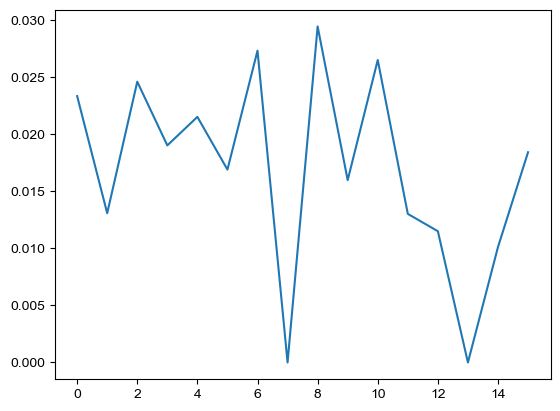

In [111]:

plt.plot((tmp[:,:,0]>0).sum(0)/50001)

In [ ]:
pddata

,frame,agent,x,y,z,rot_x,rot_y,rot_z,info
0,0,0,773.689514,1847.645874,25.125,0.0,3.405762,0.0,"{""num_frames"": 8}"
1,1,0,816.760620,1849.836548,25.125,0.0,20.302734,0.0,"{""num_frames"": 8}"
2,2,0,858.281372,1860.803223,25.125,0.0,37.194214,0.0,"{""num_frames"": 8}"
3,3,0,895.296265,1881.582153,25.125,0.0,54.091187,0.0,"{""num_frames"": 8}"
4,4,0,927.641785,1908.328247,25.125,0.0,37.194214,0.0,"{""num_frames"": 8}"
...,...,...,...,...,...,...,...,...,...
996,996,0,228.996994,1295.939819,25.125,0.0,-135.516357,0.0,"{""num_frames"": 8}"
997,997,0,205.689682,1262.456909,25.125,0.0,-118.619385,0.0,"{""num_frames"": 8}"
998,998,0,211.311356,1229.188965,25.125,0.0,-118.619385,0.0,"{""num_frames"": 8}"
999,999,0,218.156265,1187.197876,25.125,0.0,-101.727905,0.0,"{""num_frames"": 8}"


In [ ]:
import os
from tqdm import tqdm

In [115]:
import matplotlib.pyplot as plt

# from lib.visualization import plot_spatial_specificity
def set_arena(ax):
    xbound = np.array((100, 2000)) * 1.1
    ybound = np.array((100, 2000)) * 1.1
    goal_loc = (1550, 450)

    ax.set_xlim(*xbound)
    ax.set_ylim(*ybound)
    ax.scatter(*goal_loc, c='cyan', marker='D', zorder=3.1, s=100, alpha=0.5)
    return ax
def plot_spatial_specificity_base(ax0, ax1, xya, aedges, xbound, ybound, title='' ):
    ax0.quiver(xya[:, 0], xya[:, 1], np.cos(xya[:, 2]), np.sin(xya[:, 2]), scale=20,alpha=0.7)
    set_arena(ax0)
    ax0.set_title(title)
    abins ,_  = np.histogram(xya[:, 2], bins=aedges)
    ax1.bar(aedges[1:]/2 + aedges[:-1]/2, abins, width=aedges[1] -aedges[0], fill=False)
    ax1.scatter(0, 0, c='k')
    ax1.axis('off')
def plot_spatial_specificity(xya, aedges, xbound, ybound, title='', figsize=(8, 3)):
    fig = plt.figure(figsize=figsize)
    ax0 = fig.add_subplot(1, 2, 1)
    ax1 = fig.add_subplot(1, 2, 2, projection='polar')
    plot_spatial_specificity_base(ax0, ax1, xya, aedges, xbound, ybound, title=title)
    return fig, [ax0, ax1]
# unique_sids = np.unique(trajdf['sid'])
unique_sids = np.arange(16)
aedges = np.linspace(-np.pi, np.pi, 16)
xbound = ( 100 , 2000)
ybound = ( 100 , 2000)
jobname= 'trial'
save_imgs_dir = telemetry / ('state_specificity_'+jobname)
os.makedirs(save_imgs_dir, exist_ok=True)
for unique_sid in tqdm(unique_sids):
    if unique_sid==-1: continue
    subdf = pddata[sids[:,unique_sid]>0]
    xya = subdf[['x','y','rot_y']].to_numpy()
    xya[:,2] = xya[:,2]*np.pi/180
    title = f'Pattern{unique_sid+1}, frequency=%.1f%%'%(xya.shape[0]*100/sids.shape[0])
    fig, (ax0, ax1) = plot_spatial_specificity(xya, aedges, xbound, ybound, title=title, figsize=(3,2))#,xbound=arena_xlim,ybound=arena_ylim)
    # ax0.set_xlim(*arena_xlim*1.1)
    # ax0.set_ylim(*arena_ylim*1.1)
    ax0.set_xlabel('x (m)')
    ax0.set_ylabel('y (m)')
    plt.sca(ax0)
    # plt.axis('equal')
    ax0.spines[['top','right']].set_visible(False)
    fig.tight_layout()
    fig.savefig(save_imgs_dir/('%d.png'%unique_sid), dpi=300)
    plt.close(fig)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:02<00:00,  7.22it/s]


In [117]:
npmlp2=torch.cat(act_buffers['decoder.mlp.2'], dim=0).numpy() 

In [118]:
npmlp2.shape

(50001, 128)

In [ ]:
xbound=(100,2000)
ybound=(100,2000)

In [116]:
pddata['x'].min(),pddata['x'].max()

(116.125, 1983.875)

In [132]:
pddata

,frame,agent,x,y,z,rot_x,rot_y,rot_z,info
0,0,0,773.689514,1847.645874,25.125,0.0,3.405762,0.0,"{""num_frames"": 8}"
1,1,0,816.760620,1849.836548,25.125,0.0,20.302734,0.0,"{""num_frames"": 8}"
2,2,0,857.881470,1858.580200,25.125,0.0,20.302734,0.0,"{""num_frames"": 8}"
3,3,0,891.858276,1843.307983,25.125,0.0,20.302734,0.0,"{""num_frames"": 8}"
4,4,0,933.810974,1834.471802,25.125,0.0,37.194214,0.0,"{""num_frames"": 8}"
...,...,...,...,...,...,...,...,...,...
49996,49996,0,1498.356689,404.094879,25.125,0.0,47.691650,0.0,"{""num_frames"": 8}"
49997,49997,0,1526.027100,433.862946,25.125,0.0,47.691650,0.0,"{""num_frames"": 8}"
49998,49998,0,1554.350342,464.334869,25.125,0.0,47.691650,0.0,"{""num_frames"": 8}"
49999,49999,0,1580.779419,495.674347,25.125,0.0,64.588623,0.0,"{""num_frames"": 8}"


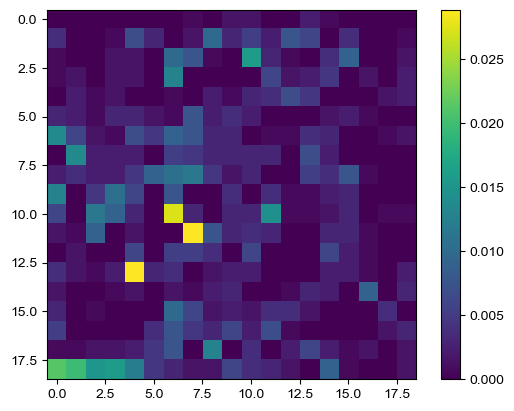

In [147]:
plt.imshow(occu_xya.sum(-1)/occu_xya[:].sum())
plt.colorbar()

(array([3647., 4473., 5115., 6472., 7280., 7641., 6113., 2822., 2859.,
        3579.]),
 array([-1.79956055e+02, -1.43962097e+02, -1.07968140e+02, -7.19741821e+01,
        -3.59802246e+01,  1.37329102e-02,  3.60076904e+01,  7.20016479e+01,
         1.07995605e+02,  1.43989563e+02,  1.79983521e+02]),
 <BarContainer object of 10 artists>)

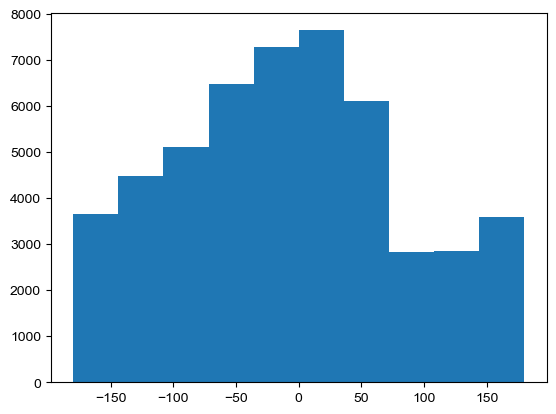

In [203]:
plt.hist(pddata['rot_y'])

### SI calculation and data formatting

In [204]:
pddata['rot_pi']=pddata['rot_y']*np.pi/180

In [205]:
def SpatialInformation(firing,occu):
    p_occu = occu/occu[:].sum()
    fr_x = firing/occu
    fr_mean = firing[:].sum()/occu[:].sum()
    out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
    return( out )
    

occu_xya=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),density=False)[0]

grain=19
hla_xya=np.zeros((grain,grain,12,128))
for i in range(128):
    hla_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=npmlp2[:,i]*(npmlp2[:,i]>0),density=False)[0]

sids=core_act[:,:-13:15]

grain=19
seq0_xya=np.zeros((grain,grain,12,16))
for i in range(16):
    seq0_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=sids[:,i],density=False)[0]

grain=19
seqall_xya=np.zeros((grain,grain,12,16*15))
for i in range(16*15):
    seqall_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=core_act[:,i],density=False)[0]

SI_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i],occu_xya) for i in range(128)])
SI_seq0=np.array([SpatialInformation(seq0_xya[:,:,:,i],occu_xya) for i in range(16)])
SI_seqall=np.array([SpatialInformation(seqall_xya[:,:,:,i],occu_xya) for i in range(16*15)])

/tmp/ipykernel_1267942/3602960732.py:3: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_1267942/3602960732.py:5: RuntimeWarning: divide by zero encountered in log
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/3602960732.py:5: RuntimeWarning: invalid value encountered in multiply
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/3602960732.py:5: RuntimeWarning: invalid value encountered in true_divide
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())


In [212]:
SI_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i],occu_xya) for i in range(128)])
SI_seq0=np.array([SpatialInformation(seq0_xya[:,:,:,i],occu_xya) for i in range(16)])
SI_seqall=np.array([SpatialInformation(seqall_xya[:,:,:,i],occu_xya) for i in range(16*15)])

/tmp/ipykernel_1267942/3602960732.py:3: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_1267942/3602960732.py:5: RuntimeWarning: divide by zero encountered in log
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/3602960732.py:5: RuntimeWarning: invalid value encountered in multiply
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/3602960732.py:5: RuntimeWarning: invalid value encountered in true_divide
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())


In [210]:
SI_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i].sum(-1),occu_xya.sum(-1)) for i in range(128)])
SI_seq0=np.array([SpatialInformation(seq0_xya[:,:,:,i].sum(-1),occu_xya.sum(-1)) for i in range(16)])
SI_seqall=np.array([SpatialInformation(seqall_xya[:,:,:,i].sum(-1),occu_xya.sum(-1)) for i in range(16*15)])

/tmp/ipykernel_1267942/3602960732.py:3: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_1267942/3602960732.py:5: RuntimeWarning: divide by zero encountered in log
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/3602960732.py:5: RuntimeWarning: invalid value encountered in multiply
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/3602960732.py:5: RuntimeWarning: invalid value encountered in true_divide
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())


In [136]:
occu_xya=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_y']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),density=True)[0]

In [143]:
def entropy(x):
    x=x.flatten()
    x/=x.sum()
    return(-(x*np.log(x+1e-7)).sum())

In [148]:
def SpatialInformation(firing,occu):
    p_occu = occu/occu[:].sum()
    fr_x = firing/occu
    fr_mean = firing[:].sum()/occu[:].sum()
    out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
    return( out )
    



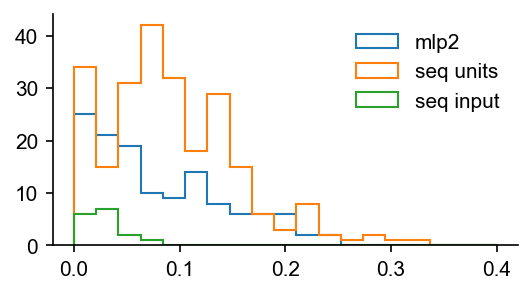

In [214]:
plt.figure(figsize=(4,2),dpi=150)
plt.hist(SI_mlp2,np.linspace(0,0.4,20),histtype='step',label='mlp2')
plt.hist(SI_seqall,np.linspace(0,0.4,20),histtype='step',label='seq units')
plt.hist(SI_seq0,np.linspace(0,0.4,20),histtype='step',label='seq input')
plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)

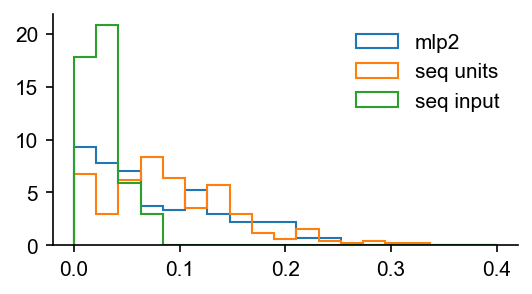

In [218]:
plt.figure(figsize=(4,2),dpi=150)
plt.hist(SI_mlp2,np.linspace(0,0.4,20),histtype='step',label='mlp2',density=True)
plt.hist(SI_seqall,np.linspace(0,0.4,20),histtype='step',label='seq units',density=True)
plt.hist(SI_seq0,np.linspace(0,0.4,20),histtype='step',label='seq input',density=True)
plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)

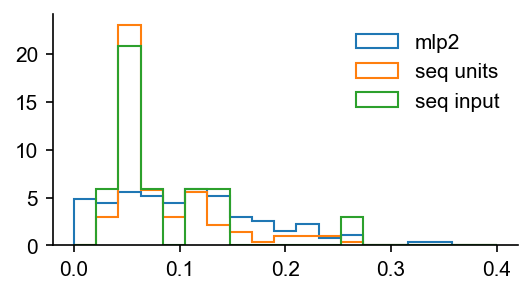

In [ ]:
plt.figure(figsize=(4,2),dpi=150)
plt.hist(SI_mlp2,np.linspace(0,0.4,20),histtype='step',label='mlp2',density=True)
plt.hist(SI_seqall,np.linspace(0,0.4,20),histtype='step',label='seq units',density=True)
plt.hist(SI_seq0,np.linspace(0,0.4,20),histtype='step',label='seq input',density=True)
plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)

In [150]:
SI_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i],occu_xya) for i in range(128)])

/tmp/ipykernel_1267942/4069575213.py:3: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_1267942/4069575213.py:5: RuntimeWarning: invalid value encountered in log
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())


(array([40., 41., 65., 29., 37., 11.,  9.,  4.,  2.,  2.]),
 array([0.        , 0.03227575, 0.0645515 , 0.09682725, 0.12910301,
        0.16137876, 0.19365451, 0.22593026, 0.25820601, 0.29048176,
        0.32275752]),
 <BarContainer object of 10 artists>)

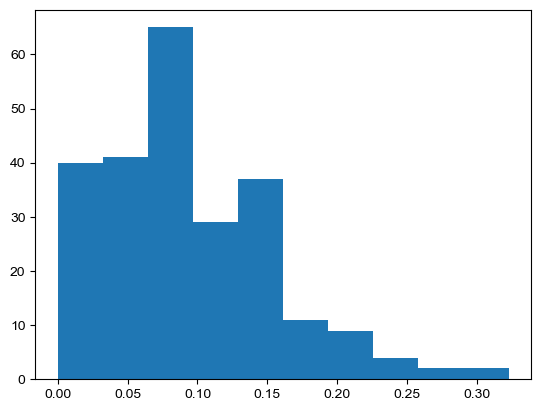

In [217]:
plt.hist(SI_seqall)

In [ ]:
arr=hla_xya[:,:,:,i].sum(-1)
max_coords = np.unravel_index(np.argmax(arr), arr.shape)

216

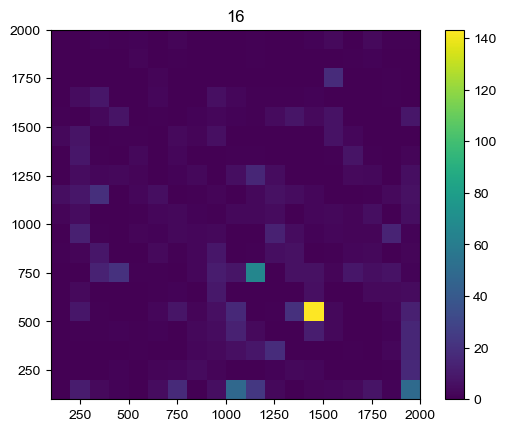

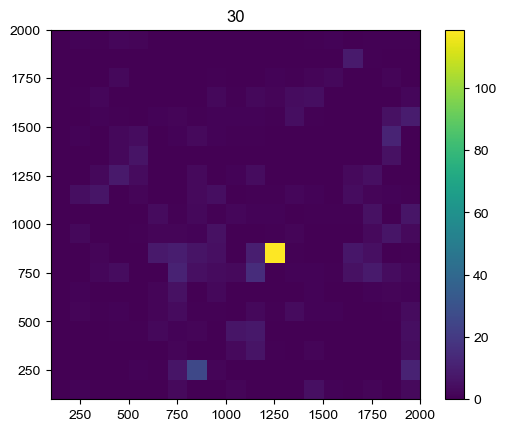

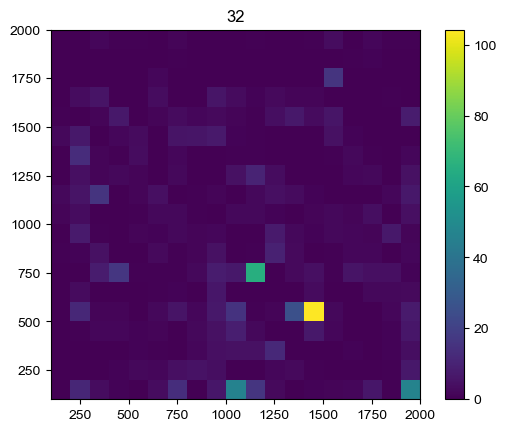

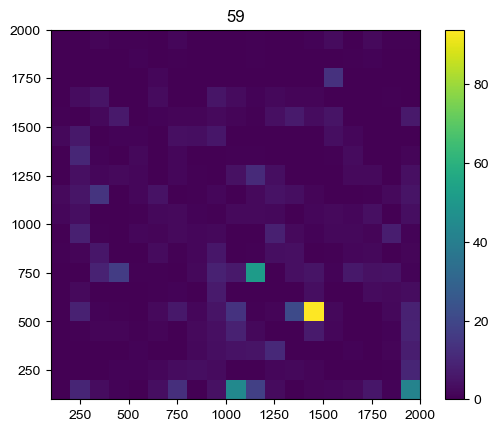

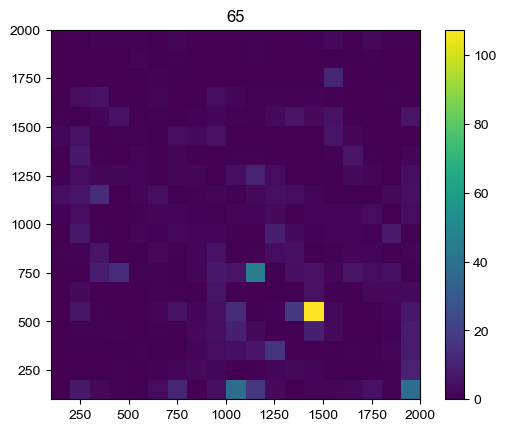

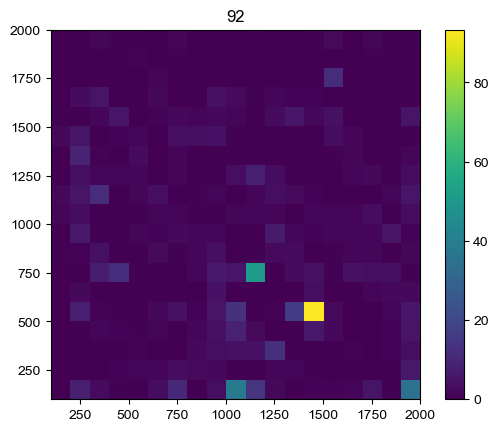

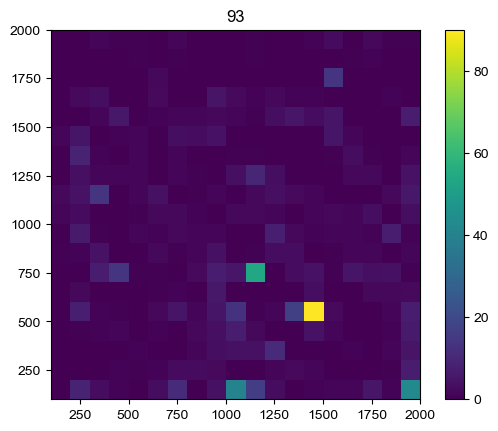

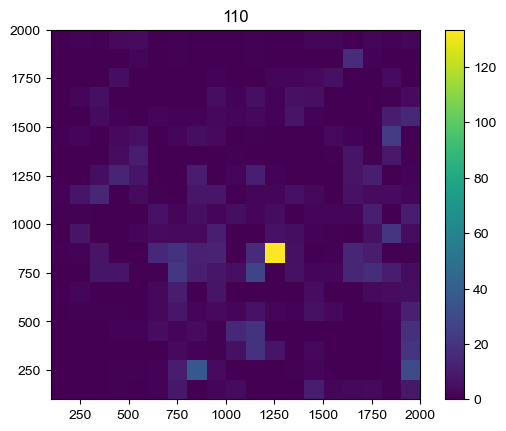

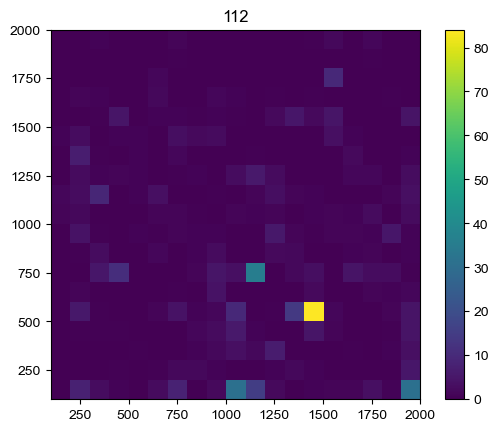

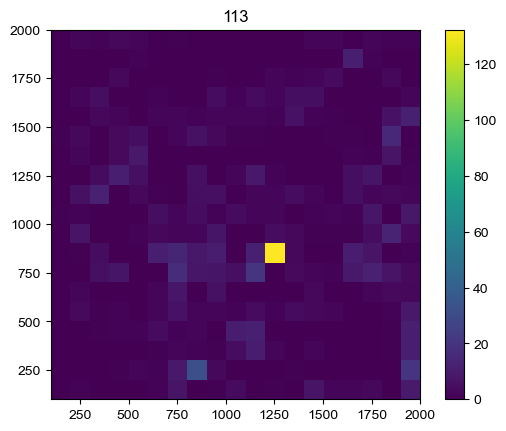

In [ ]:
for i in np.nonzero(SI_mlp2>0.28)[0]:
    plt.figure()
    plt.title(i)
    plt.imshow(hla_xya[:,:,:,i].sum(-1).T,vmin=0,extent=[100,2000,100,2000],origin='lower')
    plt.text()
        #     xedges,yedges=np.linspace(*arena_xlim,12),np.linspace(*arena_ylim,12)
        # xcoors,ycoors=(xedges[:-1]+xedges[1:])/2,(yedges[:-1]+yedges[1:])/2
        # xmesh,ymesh=np.meshgrid(xcoors,ycoors,indexing='ij')#use matrix instead of cartesian indexing to be compatible with np.histogram2d
        # xmesh,ymesh=xmesh.flatten(),ymesh.flatten()
        # ax[i].quiver(xmesh,ymesh,head_vec[:,:,0,seq_no,i*stepsize].flatten(),head_vec[:,:,1,seq_no,i*stepsize].flatten())
    plt.colorbar()

In [ ]:
hla_xya

(array([1.000e+00, 7.000e+00, 3.675e+03, 5.480e+02, 7.400e+01, 1.900e+01,
        2.000e+00, 3.000e+00, 2.000e+00, 1.000e+00]),
 array([-1.43904918e-06, -9.43539317e-07, -4.48029451e-07,  4.74804143e-08,
         5.42990280e-07,  1.03850015e-06,  1.53401001e-06,  2.02951988e-06,
         2.52502974e-06,  3.02053961e-06,  3.51604947e-06]),
 <BarContainer object of 10 artists>)

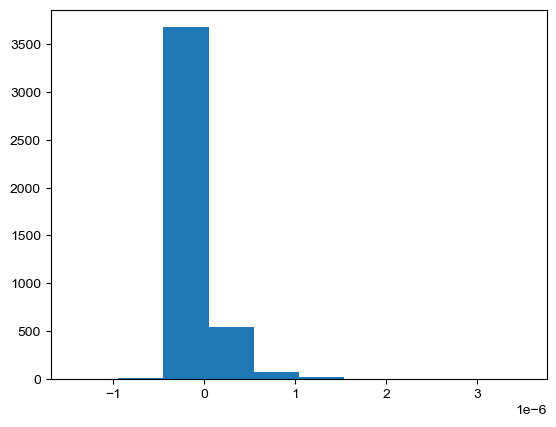

In [145]:
plt.hist(hla_xya[:,:,:,33].flatten())

In [144]:
entropy(hla_xya[:,:,:,33])

/tmp/ipykernel_1267942/750616159.py:4: RuntimeWarning: invalid value encountered in log
  return(-(x*np.log(x+1e-7)).sum())


nan

In [140]:
entropy(hla_xya[:,:,:,33])-entropy(hla_xya[:,:,:,33]/(occu_xya+1e-10))

/tmp/ipykernel_1267942/1239433561.py:4: RuntimeWarning: invalid value encountered in log
  return(-(x*np.log(x+1e-10)).sum())


nan

In [119]:
grain=19
hla_location=np.zeros((grain,grain,128))
for i in range(128):
    hla_location[:,:,i]=np.histogram2d(pddata['x'],pddata['y'],(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1)),weights=npmlp2[:,i],density=True)[0]

In [120]:
occu=np.histogram2d(pddata['x'],pddata['y'],(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1)),density=True)[0]

In [121]:
hla_location/=occu[:,:,None]

/tmp/ipykernel_1267942/1312213684.py:1: RuntimeWarning: invalid value encountered in true_divide
  hla_location/=occu[:,:,None]


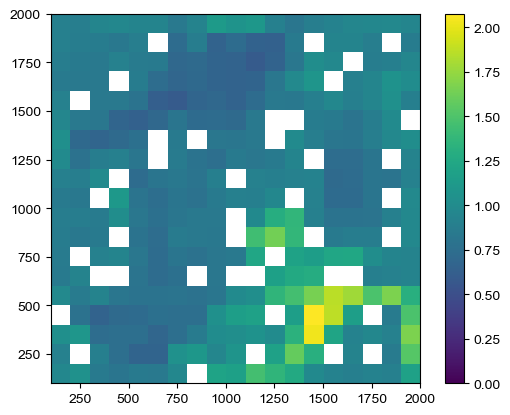

In [123]:
plt.imshow(hla_location[:,:,73].T,vmin=0,extent=[100,2000,100,2000],origin='lower')
plt.colorbar()

In [124]:
grain=19
seq0_location=np.zeros((grain,grain,16))
for i in range(16):
    seq0_location[:,:,i]=np.histogram2d(pddata['x'],pddata['y'],(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1)),weights=sids[:,i],density=True)[0]

/home/xiaoxiong/miniforge3/envs/dmlab/lib/python3.8/site-packages/numpy/lib/histograms.py:1124: RuntimeWarning: invalid value encountered in true_divide
  hist /= s


In [125]:
seq0_location/=occu[:,:,None]

/tmp/ipykernel_1267942/3147677844.py:1: RuntimeWarning: invalid value encountered in true_divide
  seq0_location/=occu[:,:,None]


In [196]:
a = np.array([[1, np.nan], [3, 4]])

In [201]:
seq0_xya.shape

(19, 19, 12, 16)

/tmp/ipykernel_1267942/2493835482.py:1: RuntimeWarning: invalid value encountered in true_divide
  tmp=np.nansum(seq0_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)


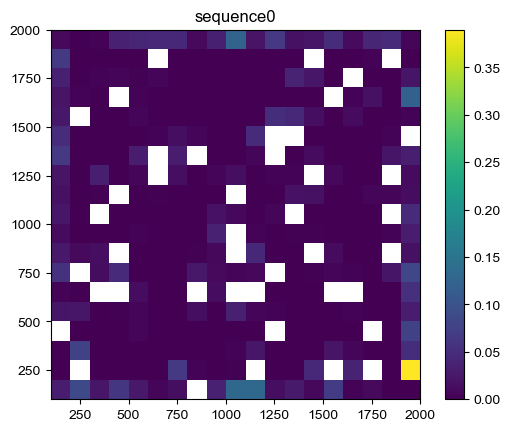

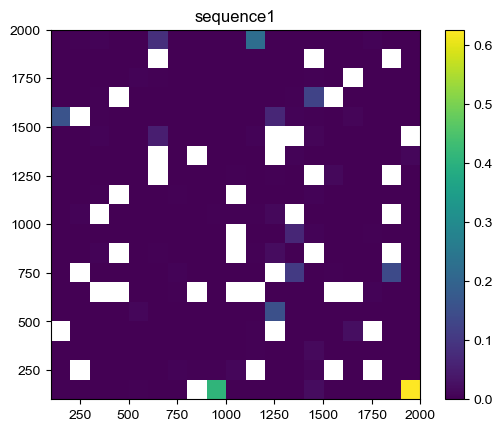

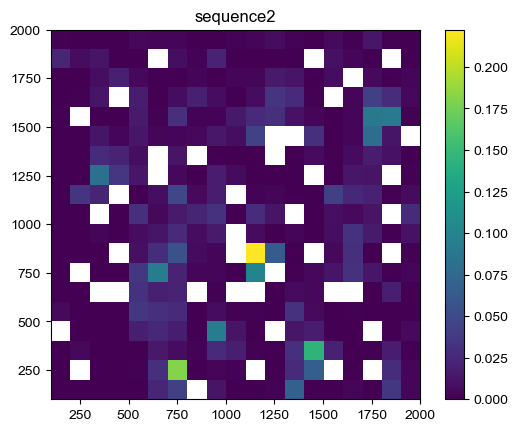

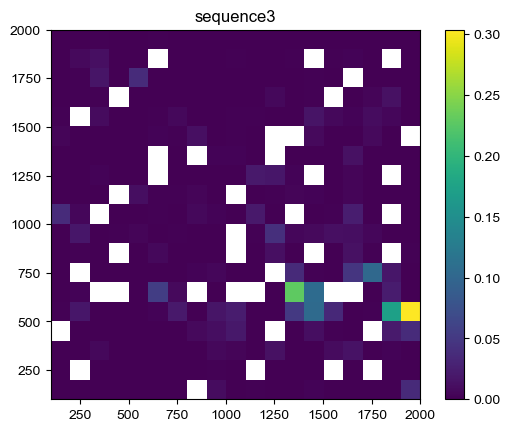

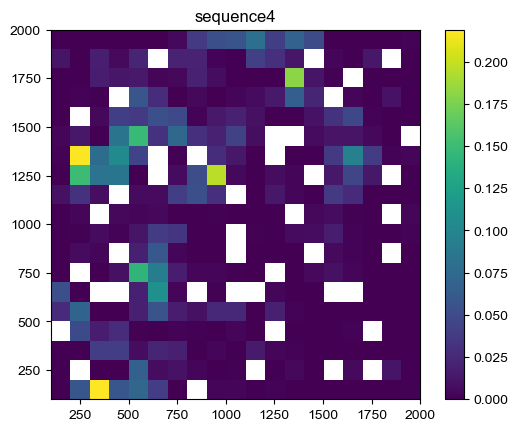

...

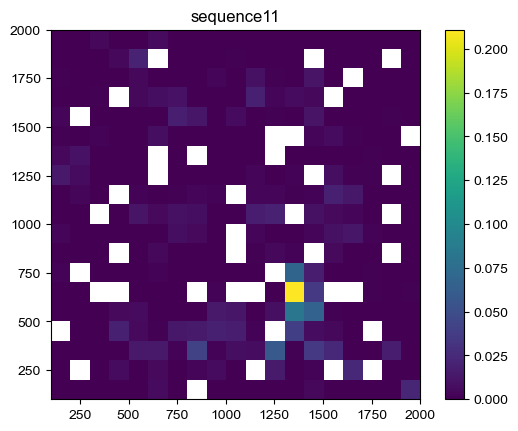

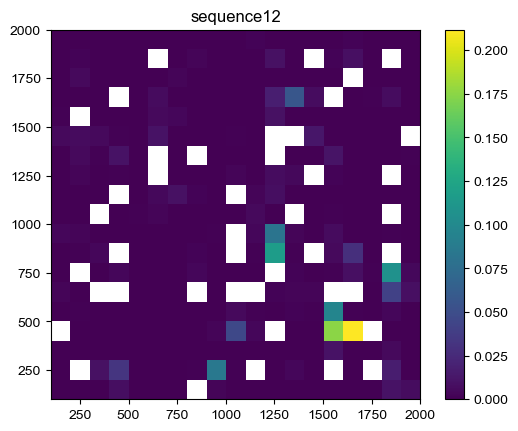

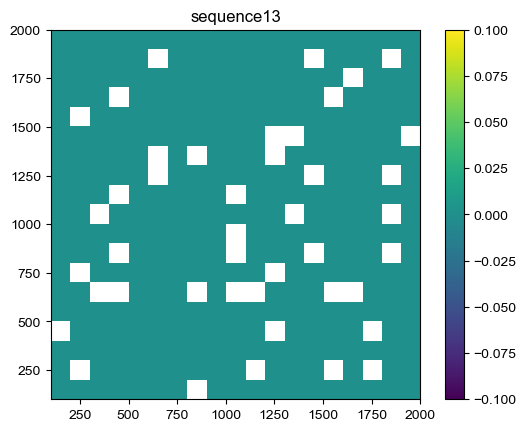

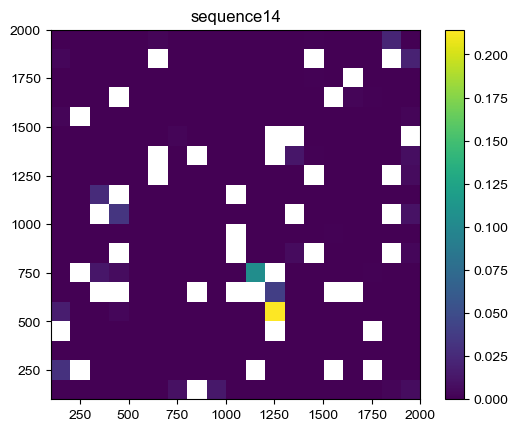

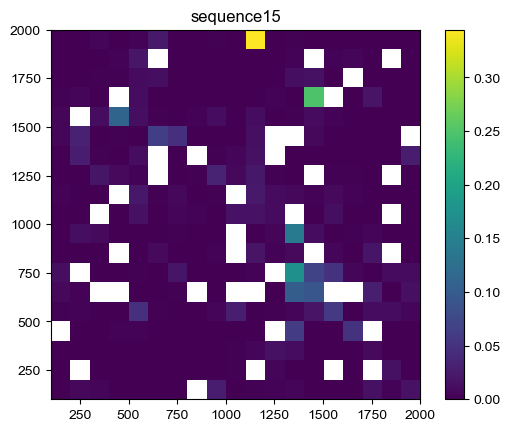

In [209]:
tmp=np.nansum(seq0_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
for i in range(16):
    plt.figure()
    plt.title(f"sequence{i}")
    plt.imshow(tmp[:,:,i].T,vmin=0,extent=[100,2000,100,2000],origin='lower')
    plt.colorbar()

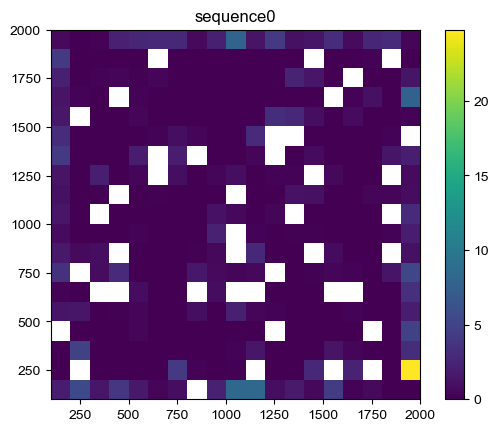

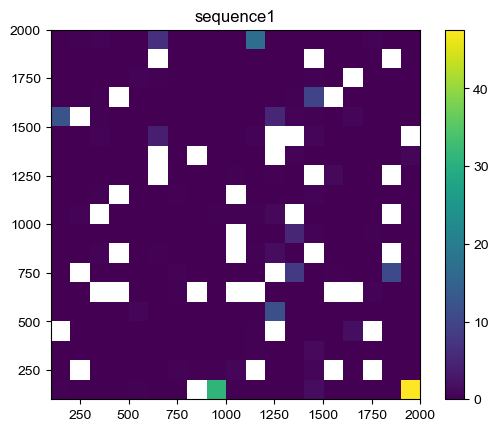

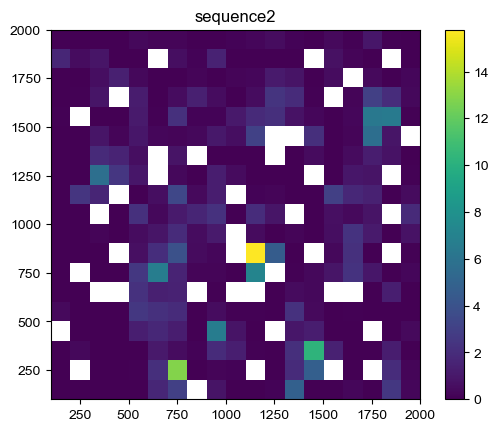

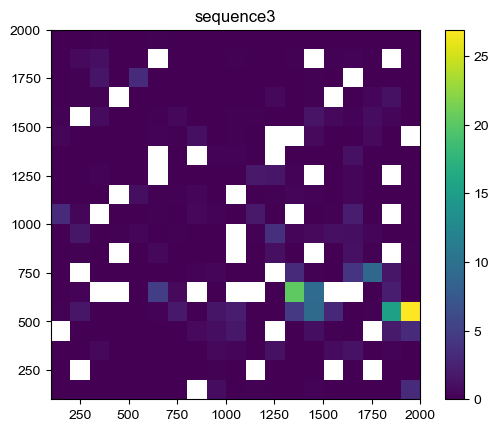

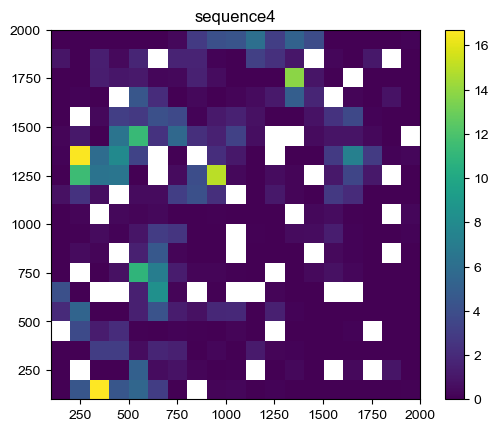

...

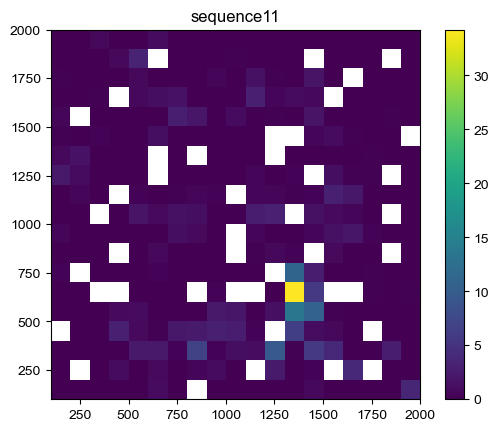

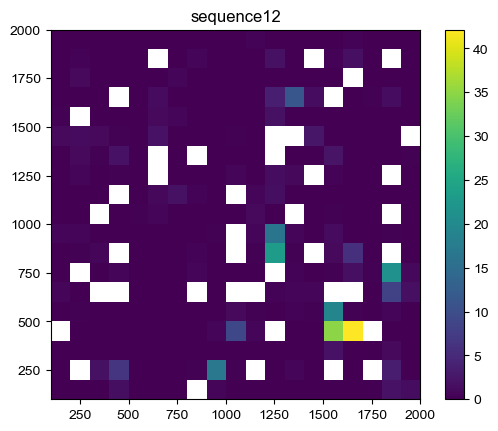

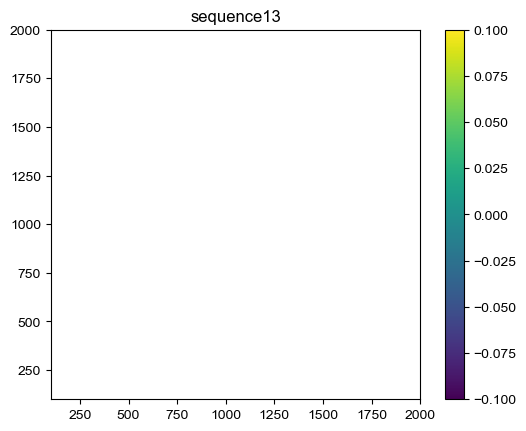

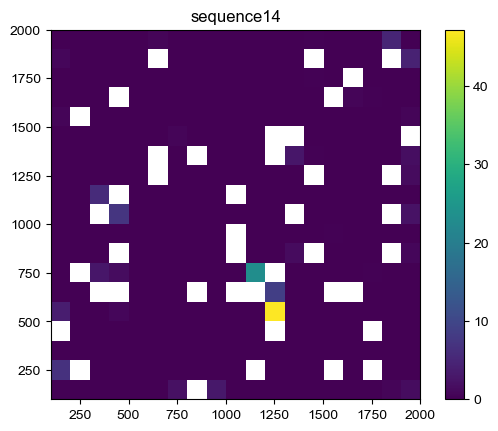

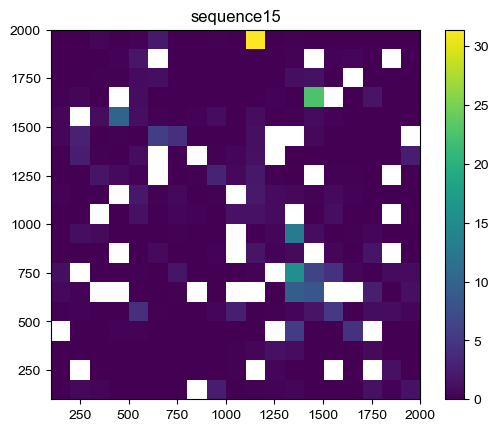

In [126]:
for i in range(16):
    plt.figure()
    plt.title(f"sequence{i}")
    plt.imshow(seq0_location[:,:,i].T,vmin=0,extent=[100,2000,100,2000],origin='lower')
    plt.colorbar()

## local L64 R8 env 8

In [730]:
%cd /home/xiaoxiong/try0120/

/home/xiaoxiong/try0120


In [ ]:
/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/checkpoint_000019136_112484352.pth

In [ ]:
Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2
ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2

In [ ]:
# from sample_factory.arguments import load_from_checkpoint
cfg_filename='train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/config.json'
with open(cfg_filename, "r") as json_file:
    json_params = json.load(json_file)
    log.warning("Loading existing experiment configuration from %s", cfg_filename)
    loaded_cfg = AttrDict(json_params)

# # override the parameters in config file with values passed from command line
# for key, value in cfg.cli_args.items():
#     if key in loaded_cfg and loaded_cfg[key] != value:
#         log.debug("Overriding arg %r with value %r passed from command line", key, value)
#         loaded_cfg[key] = value

# # incorporate extra CLI parameters that were not present in JSON file
# for key, value in vars(cfg).items():
#     if key not in loaded_cfg:
#         log.debug("Adding new argument %r=%r that is not in the saved config file!", key, value)
#         loaded_cfg[key] = value

[2025-05-08 05:48:40,512][1267942] Loading existing experiment configuration from train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/config.json


In [388]:
cfg=loaded_cfg

In [391]:
cfg.with_pos_obs = True
cli_dict={
#  'algo': 'APPO',
#  'env': 'openfield_map2_fixed_loc3',
#  'experiment': '26_hipposlam__e.fra_8_see_8888_n.pol_8_H.L_8_r.siz_253',
 'encoder_load_path': '/home/xiaoxiong/try0120/train_dir/Random3_openfield_new/checkpoint_p0/best_000025288_203030528_reward_94.185.pth',
 'train_dir': './train_dir',
 'max_num_frames': '50000',
#  'num_envs': '8',
#  'dmlab_level_cache_path': './.dmlab_cache',
 'load_checkpoint_kind': 'best',
 'no_render': True,
 'use_jit': False,
}


# tweak whatever you like *after* parsing
cfg.with_pos_obs = True
cfg.cli_args=cli_dict
register_dmlab_components()
cfg.evaluation=True

[2025-05-08 05:50:14,847][1267942] Environment test already registered, overwriting...
[2025-05-08 05:50:14,849][1267942] Environment openfield_map already registered, overwriting...
[2025-05-08 05:50:14,850][1267942] Environment openfield_map2 already registered, overwriting...
[2025-05-08 05:50:14,851][1267942] Environment openfield_map2_fixed_loc3 already registered, overwriting...
[2025-05-08 05:50:14,853][1267942] Environment openfield_map2_fixed_loc2 already registered, overwriting...
[2025-05-08 05:50:14,854][1267942] Environment openfield_map2_fixed_loc1 already registered, overwriting...
[2025-05-08 05:50:14,854][1267942] Environment openfield_map_episode already registered, overwriting...
[2025-05-08 05:50:14,855][1267942] Environment openfield_map_transparent already registered, overwriting...
[2025-05-08 05:50:14,855][1267942] Environment random_maze already registered, overwriting...
[2025-05-08 05:50:14,856][1267942] Environment dmlab_benchmark already registered, overwri

In [17]:
import sys

# from sample_factory.enjoy import enjoy
from sf_examples.dmlab.cumstom_enjoy import enjoy
from sf_examples.dmlab.train_hipposlam import parse_dmlab_args, register_dmlab_components

mapname="openfield_map2_fixed_loc3"
expname='Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2'

cli = [
    "--algo", "APPO",
    "--env", mapname ,         # pick any DM‑Lab level you have
    "--experiment", expname,
    "--encoder_load_path","/home/xiaoxiong/try0120/train_dir/Random3_openfield_new/checkpoint_p0/best_000025288_203030528_reward_94.185.pth",
    "--train_dir", "./train_dir", # anything writable
    "--max_num_frames", "50000",          # short rollout for the test
    "--num_envs", "8",
    "--dmlab_level_cache_path","./.dmlab_cache",
    "--load_checkpoint_kind","latest",
    "--use_jit","False",
    "--with_pos_obs","True",
    "--no_render",        # <-- skip human window; avoid X11 on servers
]

cli_dict={
 'algo': 'APPO',
 'env': mapname,
 'experiment': expname,
 'encoder_load_path': '/home/xiaoxiong/try0120/train_dir/Random3_openfield_new/checkpoint_p0/best_000025288_203030528_reward_94.185.pth',
 'train_dir': './train_dir',
 'max_num_frames': '50000',
 'num_envs': '8',
 'dmlab_level_cache_path': './.dmlab_cache',
 'load_checkpoint_kind': 'latest',
 'no_render': True,
 'use_jit': False,
 'with_pos_obs': True,
}
register_dmlab_components()
cfg = parse_dmlab_args(evaluation=True, argv=cli)

# tweak whatever you like *after* parsing
# cfg.with_pos_obs = True
cfg.cli_args=cli_dict
# status = enjoy(cfg)

[2025-05-15 23:12:05,824][06032] Environment test already registered, overwriting...
[2025-05-15 23:12:05,825][06032] Environment openfield_map already registered, overwriting...
[2025-05-15 23:12:05,825][06032] Environment openfield_map2 already registered, overwriting...
[2025-05-15 23:12:05,826][06032] Environment openfield_map2_fixed_loc3 already registered, overwriting...
[2025-05-15 23:12:05,826][06032] Environment openfield_map2_fixed_loc2 already registered, overwriting...
[2025-05-15 23:12:05,826][06032] Environment openfield_map2_fixed_loc1 already registered, overwriting...
[2025-05-15 23:12:05,827][06032] Environment openfield_map_episode already registered, overwriting...
[2025-05-15 23:12:05,827][06032] Environment openfield_map_transparent already registered, overwriting...
[2025-05-15 23:12:05,827][06032] Environment random_maze already registered, overwriting...
[2025-05-15 23:12:05,827][06032] Environment dmlab_benchmark already registered, overwriting...
[2025-05-15 

In [16]:
%cd ~/try0120/

/home/xiaoxiong/try0120


In [5]:
import time
from collections import deque
from typing import Dict, Tuple

import gymnasium as gym
import numpy as np
import torch
from torch import Tensor

from sample_factory.algo.learning.learner import Learner
from sample_factory.algo.sampling.batched_sampling import preprocess_actions
from sample_factory.algo.utils.action_distributions import argmax_actions
from sample_factory.algo.utils.env_info import extract_env_info
from sample_factory.algo.utils.make_env import make_env_func_batched
from sample_factory.algo.utils.misc import ExperimentStatus
from sample_factory.algo.utils.rl_utils import make_dones, prepare_and_normalize_obs
from sample_factory.algo.utils.tensor_utils import unsqueeze_tensor
from sample_factory.cfg.arguments import load_from_checkpoint
from sample_factory.huggingface.huggingface_utils import generate_model_card, generate_replay_video, push_to_hf
from sample_factory.model.actor_critic import create_actor_critic
from sample_factory.model.model_utils import get_rnn_size
from sample_factory.utils.attr_dict import AttrDict
from sample_factory.utils.typing import Config, StatusCode
from sample_factory.utils.utils import debug_log_every_n, experiment_dir, log

In [6]:
# ---------------------------------------------------------------------------
# logging helpers (put near the top of the file, after imports)
# ---------------------------------------------------------------------------
import datetime, pathlib, json, h5py, pandas as pd, torch

def _ensure_parent(path: pathlib.Path):
    path.parent.mkdir(parents=True, exist_ok=True)


In [392]:
cfg.save_video

AttributeError: 'AttrDict' object has no attribute 'save_video'

In [ ]:
%cd ~/from_NEMO/

/home/xiaoxiong/from_NEMO


In [19]:
cfg = load_from_checkpoint(cfg)

[2025-05-15 23:12:31,771][06032] Loading existing experiment configuration from ./train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/config.json
[2025-05-15 23:12:31,772][06032] Overriding arg 'train_dir' with value './train_dir' passed from command line
[2025-05-15 23:12:31,772][06032] Overriding arg 'dmlab_level_cache_path' with value './.dmlab_cache' passed from command line
[2025-05-15 23:12:31,772][06032] Overriding arg 'use_jit' with value False passed from command line
[2025-05-15 23:12:31,773][06032] Overriding arg 'with_pos_obs' with value True passed from command line
[2025-05-15 23:12:31,773][06032] Adding new argument 'fps'=0 that is not in the saved config file!
[2025-05-15 23:12:31,774][06032] Adding new argument 'eval_env_frameskip'=None that is not in the saved config file!
[2025-05-15 23:12:31,774][06032] Adding new argument 'no_render'=True that is not in the saved config file!
[2025-05-15 23:12:31,774][06032] Adding new ar

In [1001]:
    verbose = False

    cfg = load_from_checkpoint(cfg)

    eval_env_frameskip: int = cfg.env_frameskip if cfg.eval_env_frameskip is None else cfg.eval_env_frameskip
    assert (
        cfg.env_frameskip % eval_env_frameskip == 0
    ), f"{cfg.env_frameskip=} must be divisible by {eval_env_frameskip=}"
    render_action_repeat: int = cfg.env_frameskip // eval_env_frameskip
    cfg.env_frameskip = cfg.eval_env_frameskip = eval_env_frameskip
    log.debug(f"Using frameskip {cfg.env_frameskip} and {render_action_repeat=} for evaluation")

    cfg.num_envs = 1

    render_mode = "human"
    if cfg.save_video:
        render_mode = "rgb_array"
    elif cfg.no_render:
        render_mode = None

    env = make_env_func_batched(
        cfg, env_config=AttrDict(worker_index=0, vector_index=0, env_id=0), render_mode=render_mode
    )
    env_info = extract_env_info(env, cfg)

    if hasattr(env.unwrapped, "reset_on_init"):
        # reset call ruins the demo recording for VizDoom
        env.unwrapped.reset_on_init = False
    log.info(env.action_space)
    actor_critic = create_actor_critic(cfg, env.observation_space, env.action_space)
    actor_critic.eval()

[2025-05-14 22:27:31,916][1854092] Loading existing experiment configuration from ./train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/config.json
[2025-05-14 22:27:31,917][1854092] Overriding arg 'train_dir' with value './train_dir' passed from command line
[2025-05-14 22:27:31,917][1854092] Overriding arg 'dmlab_level_cache_path' with value './.dmlab_cache' passed from command line
[2025-05-14 22:27:31,917][1854092] Overriding arg 'use_jit' with value False passed from command line
[2025-05-14 22:27:31,917][1854092] Overriding arg 'with_pos_obs' with value True passed from command line
[2025-05-14 22:27:31,918][1854092] Adding new argument 'fps'=0 that is not in the saved config file!
[2025-05-14 22:27:31,918][1854092] Adding new argument 'eval_env_frameskip'=None that is not in the saved config file!
[2025-05-14 22:27:31,919][1854092] Adding new argument 'no_render'=True that is not in the saved config file!
[2025-05-14 22:27:31,919][1854

ActorCriticSharedWeights(
  (obs_normalizer): ObservationNormalizer(
    (running_mean_std): RunningMeanStdDictInPlace(
      (running_mean_std): ModuleDict(
        (obs): RunningMeanStdInPlace()
      )
    )
  )
  (returns_normalizer): RecursiveScriptModule(original_name=RunningMeanStdInPlace)
  (encoder): HipposlamEncoder(
    (depth_encoder): DepthEncoder(
      (downsample): Upsample(size=(1, 10), mode='nearest')
    )
    (basic_encoder): ResnetEncoder(
      (conv_head): Sequential(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
        (2): ResBlock(
          (res_block_core): Sequential(
            (0): ReLU()
            (1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (2): ReLU()
            (3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          )
        )
        (3): ResBlock(
          (res_b

In [ ]:
[x for x in dict(actor_critic.named_modules()).keys() if x.startswith('encoder.DG')]

['encoder.DG_projection',
 'encoder.DG_projection.linear',
 'encoder.DG_projection.batchnorm1d',
 'encoder.DG_projection.activation']

In [ ]:
[x for x in dict(actor_critic.named_modules()).keys() if x.startswith('deco')]

['decoder', 'decoder.mlp', 'decoder.mlp.0', 'decoder.mlp.1', 'decoder.mlp.2']

In [ ]:
cfg.env

'openfield_map2_fixed_loc3'

In [380]:
dict(actor_critic.named_modules()).keys()

dict_keys(['', 'obs_normalizer', 'returns_normalizer', 'encoder', 'encoder.depth_encoder', 'encoder.depth_encoder.downsample', 'encoder.basic_encoder', 'encoder.basic_encoder.conv_head', 'encoder.basic_encoder.conv_head.0', 'encoder.basic_encoder.conv_head.1', 'encoder.basic_encoder.conv_head.2', 'encoder.basic_encoder.conv_head.2.res_block_core', 'encoder.basic_encoder.conv_head.2.res_block_core.0', 'encoder.basic_encoder.conv_head.2.res_block_core.1', 'encoder.basic_encoder.conv_head.2.res_block_core.2', 'encoder.basic_encoder.conv_head.2.res_block_core.3', 'encoder.basic_encoder.conv_head.3', 'encoder.basic_encoder.conv_head.3.res_block_core', 'encoder.basic_encoder.conv_head.3.res_block_core.0', 'encoder.basic_encoder.conv_head.3.res_block_core.1', 'encoder.basic_encoder.conv_head.3.res_block_core.2', 'encoder.basic_encoder.conv_head.3.res_block_core.3', 'encoder.basic_encoder.conv_head.4', 'encoder.basic_encoder.conv_head.5', 'encoder.basic_encoder.conv_head.6', 'encoder.basic_enc

In [422]:
verbose = False

cfg = load_from_checkpoint(cfg)

eval_env_frameskip: int = cfg.env_frameskip 
assert (
    cfg.env_frameskip % eval_env_frameskip == 0
), f"{cfg.env_frameskip=} must be divisible by {eval_env_frameskip=}"
render_action_repeat: int = cfg.env_frameskip // eval_env_frameskip
cfg.env_frameskip = cfg.eval_env_frameskip = eval_env_frameskip
log.debug(f"Using frameskip {cfg.env_frameskip} and {render_action_repeat=} for evaluation")

cfg.num_envs = 1

# render_mode = "human"
# if cfg.save_video:
#     render_mode = "rgb_array"
# elif cfg.no_render:
render_mode = None

env = make_env_func_batched(
    cfg, env_config=AttrDict(worker_index=0, vector_index=0, env_id=0), render_mode=render_mode
)
env_info = extract_env_info(env, cfg)

if hasattr(env.unwrapped, "reset_on_init"):
    # reset call ruins the demo recording for VizDoom
    env.unwrapped.reset_on_init = False
log.info(env.action_space)
actor_critic = create_actor_critic(cfg, env.observation_space, env.action_space)
actor_critic.eval()



device = torch.device("cpu" if cfg.device == "cpu" else "cuda")
actor_critic.model_to_device(device)


#################### register hook
layers_to_log = [
    'encoder.basic_encoder.mlp_layers.0',
    "encoder.DG_projection.linear",
    "core",
    
    "decoder.mlp.0",
    "decoder.mlp.2"
]          # <- example; edit to taste

# 2B. activation buffer

import collections
act_buffers = collections.defaultdict(list)

def make_hook(layer_name):
    def _hook(_m, _inp, out):
        if isinstance(out, (tuple, list)):      # RNN returns (output, h_n)
            out = out[0]
        act_buffers[layer_name].append(out.detach().cpu())
    return _hook

# attach the hook once
for layer_to_log in layers_to_log:
    try:
        dict(actor_critic.named_modules())[layer_to_log].register_forward_hook(make_hook(layer_to_log))
        log.info("Activation hook registered on %s", layer_to_log)
    except KeyError:
        raise RuntimeError(f"Layer '{layer_to_log}' not found in the network!")

####################


policy_id = cfg.policy_index
# log.info(policy_id)
name_prefix = dict(latest="checkpoint", best="best")[cfg.load_checkpoint_kind]
# log.info(Learner.checkpoint_dir(cfg, policy_id))
checkpoints = Learner.get_checkpoints(Learner.checkpoint_dir(cfg, policy_id), f"{name_prefix}_*")
checkpoint_dict = Learner.load_checkpoint(checkpoints, device)
actor_critic.load_state_dict(checkpoint_dict["model"])

episode_rewards = [deque([], maxlen=100) for _ in range(env.num_agents)]
true_objectives = [deque([], maxlen=100) for _ in range(env.num_agents)]
num_frames = 0

last_render_start = time.time()

def max_frames_reached(frames):
    return cfg.max_num_frames is not None and frames > cfg.max_num_frames

reward_list = []

obs, infos = env.reset()
rnn_states = torch.zeros([env.num_agents, get_rnn_size(cfg)], dtype=torch.float32, device=device)
episode_reward = None
finished_episode = [False for _ in range(env.num_agents)]

video_frames = []
num_episodes = 0

# saved_data=dict()
pose_records = []

with torch.no_grad():
    while not max_frames_reached(num_frames):
        normalized_obs = prepare_and_normalize_obs(actor_critic, obs)

        # if not cfg.no_render:
        #     visualize_policy_inputs(normalized_obs)
        policy_outputs = actor_critic(normalized_obs, rnn_states)

        # sample actions from the distribution by default
        actions = policy_outputs["actions"]

        if cfg.eval_deterministic:
            action_distribution = actor_critic.action_distribution()
            actions = argmax_actions(action_distribution)

        # actions shape should be [num_agents, num_actions] even if it's [1, 1]
        if actions.ndim == 1:
            actions = unsqueeze_tensor(actions, dim=-1)
        actions = preprocess_actions(env_info, actions)

        rnn_states = policy_outputs["new_rnn_states"]

        for _ in range(render_action_repeat):
            # last_render_start = render_frame(cfg, env, video_frames, num_episodes, last_render_start)

            obs, rew, terminated, truncated, infos = env.step(actions)
            # log.info(obs['DEBUG.POS.TRANS'])
            # save info
            frame_idx = num_frames          # or use a wall‑clock timestamp
            pos = obs['DEBUG.POS.TRANS']    # (B,3)
            rot = obs['DEBUG.POS.ROT']      # (B,3) or (B,4) depending on env

            for agent_i in range(env.num_agents):
                pose_records.append({
                    "frame"  : frame_idx,
                    "agent"  : agent_i,
                    "x"      : float(pos[agent_i, 0]),
                    "y"      : float(pos[agent_i, 1]),
                    "z"      : float(pos[agent_i, 2]),
                    "rot_x"  : float(rot[agent_i, 0]),
                    "rot_y"  : float(rot[agent_i, 1]),
                    "rot_z"  : float(rot[agent_i, 2]),
                    # keep the whole info dict as a JSON string for convenience
                    "info"   : json.dumps(infos[agent_i], default=str),
                })



            dones = make_dones(terminated, truncated)
            infos = [{} for _ in range(env_info.num_agents)] if infos is None else infos

            if episode_reward is None:
                episode_reward = rew.float().clone()
            else:
                episode_reward += rew.float()

            num_frames += 1
            if num_frames % 100 == 0:
                log.debug(f"Num frames {num_frames}...")

            dones = dones.cpu().numpy()
            for agent_i, done_flag in enumerate(dones):
                if done_flag:
                    finished_episode[agent_i] = True
                    rew = episode_reward[agent_i].item()
                    episode_rewards[agent_i].append(rew)

                    true_objective = rew
                    if isinstance(infos, (list, tuple)):
                        true_objective = infos[agent_i].get("true_objective", rew)
                    true_objectives[agent_i].append(true_objective)

                    if verbose:
                        log.info(
                            "Episode finished for agent %d at %d frames. Reward: %.3f, true_objective: %.3f",
                            agent_i,
                            num_frames,
                            episode_reward[agent_i],
                            true_objectives[agent_i][-1],
                        )
                    rnn_states[agent_i] = torch.zeros([get_rnn_size(cfg)], dtype=torch.float32, device=device)
                    episode_reward[agent_i] = 0

                    if cfg.use_record_episode_statistics:
                        # we want the scores from the full episode not a single agent death (due to EpisodicLifeEnv wrapper)
                        if "episode" in infos[agent_i].keys():
                            num_episodes += 1
                            reward_list.append(infos[agent_i]["episode"]["r"])
                    else:
                        num_episodes += 1
                        reward_list.append(true_objective)

            # if episode terminated synchronously for all agents, pause a bit before starting a new one
            if all(dones):
                # render_frame(cfg, env, video_frames, num_episodes, last_render_start)
                time.sleep(0.05)

            if all(finished_episode):
                finished_episode = [False] * env.num_agents
                avg_episode_rewards_str, avg_true_objective_str = "", ""
                for agent_i in range(env.num_agents):
                    avg_rew = np.mean(episode_rewards[agent_i])
                    avg_true_obj = np.mean(true_objectives[agent_i])

                    if not np.isnan(avg_rew):
                        if avg_episode_rewards_str:
                            avg_episode_rewards_str += ", "
                        avg_episode_rewards_str += f"#{agent_i}: {avg_rew:.3f}"
                    if not np.isnan(avg_true_obj):
                        if avg_true_objective_str:
                            avg_true_objective_str += ", "
                        avg_true_objective_str += f"#{agent_i}: {avg_true_obj:.3f}"

                log.info(
                    "Avg episode rewards: %s, true rewards: %s", avg_episode_rewards_str, avg_true_objective_str
                )
                log.info(
                    "Avg episode reward: %.3f, avg true_objective: %.3f",
                    np.mean([np.mean(episode_rewards[i]) for i in range(env.num_agents)]),
                    np.mean([np.mean(true_objectives[i]) for i in range(env.num_agents)]),
                )

            # VizDoom multiplayer stuff
            # for player in [1, 2, 3, 4, 5, 6, 7, 8]:
            #     key = f'PLAYER{player}_FRAGCOUNT'
            #     if key in infos[0]:
            #         log.debug('Score for player %d: %r', player, infos[0][key])

        if num_episodes >= cfg.max_num_episodes:
            break

env.close()

[2025-05-08 15:13:15,318][1267942] Loading existing experiment configuration from ./train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/config.json


[2025-05-08 15:13:15,319][1267942] Overriding arg 'env' with value 'openfield_map2_fixed_loc3' passed from command line
[2025-05-08 15:13:15,319][1267942] Overriding arg 'train_dir' with value './train_dir' passed from command line
[2025-05-08 15:13:15,320][1267942] Overriding arg 'dmlab_level_cache_path' with value './.dmlab_cache' passed from command line
[2025-05-08 15:13:15,320][1267942] Adding new argument 'fps'=0 that is not in the saved config file!
[2025-05-08 15:13:15,321][1267942] Adding new argument 'eval_env_frameskip'=None that is not in the saved config file!
[2025-05-08 15:13:15,321][1267942] Adding new argument 'no_render'=True that is not in the saved config file!
[2025-05-08 15:13:15,322][1267942] Adding new argument 'save_video'=False that is not in the saved config file!
[2025-05-08 15:13:15,322][1267942] Adding new argument 'video_frames'=1000000000.0 that is not in the saved config file!
[2025-05-08 15:13:15,323][1267942] Adding new argument 'video_name'=None that

Map number:	3


[2025-05-08 15:13:40,507][1267942] Num frames 100...
[2025-05-08 15:13:41,263][1267942] Num frames 200...
[2025-05-08 15:13:41,903][1267942] Num frames 300...
[2025-05-08 15:13:42,537][1267942] Num frames 400...
[2025-05-08 15:13:44,085][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 15:13:44,085][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	66.383333333333
Map number:	3


[2025-05-08 15:13:44,788][1267942] Num frames 500...


Map number:	3


[2025-05-08 15:13:45,575][1267942] Num frames 600...
[2025-05-08 15:13:46,221][1267942] Num frames 700...
[2025-05-08 15:13:46,931][1267942] Num frames 800...
[2025-05-08 15:13:47,561][1267942] Num frames 900...
[2025-05-08 15:13:48,608][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 15:13:48,609][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	60.933333333333
Map number:	3
Map number:	3


[2025-05-08 15:13:49,506][1267942] Num frames 1000...
[2025-05-08 15:13:50,032][1267942] Num frames 1100...
[2025-05-08 15:13:50,624][1267942] Num frames 1200...
[2025-05-08 15:13:51,379][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 15:13:51,380][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	32.6
Map number:	3
Map number:	3


[2025-05-08 15:13:52,678][1267942] Num frames 1300...
[2025-05-08 15:13:53,303][1267942] Num frames 1400...
[2025-05-08 15:13:53,882][1267942] Num frames 1500...
[2025-05-08 15:13:54,376][1267942] Num frames 1600...
[2025-05-08 15:13:54,918][1267942] Num frames 1700...
[2025-05-08 15:13:55,641][1267942] Num frames 1800...
[2025-05-08 15:13:56,775][1267942] Num frames 1900...
[2025-05-08 15:13:56,828][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 15:13:56,829][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	93.066666666667
Map number:	3
Map number:	3


[2025-05-08 15:13:57,993][1267942] Num frames 2000...
[2025-05-08 15:13:58,646][1267942] Num frames 2100...
[2025-05-08 15:13:59,260][1267942] Num frames 2200...
[2025-05-08 15:14:00,181][1267942] Num frames 2300...
[2025-05-08 15:14:00,767][1267942] Num frames 2400...
[2025-05-08 15:14:01,399][1267942] Num frames 2500...
[2025-05-08 15:14:02,100][1267942] Num frames 2600...
[2025-05-08 15:14:02,863][1267942] Num frames 2700...
[2025-05-08 15:14:03,794][1267942] Num frames 2800...
[2025-05-08 15:14:03,845][1267942] Avg episode rewards: #0: 3.856, true rewards: #0: 3.856
[2025-05-08 15:14:03,847][1267942] Avg episode reward: 3.856, avg true_objective: 3.856


Map number:	3


[2025-05-08 15:14:04,588][1267942] Num frames 2900...
[2025-05-08 15:14:05,376][1267942] Num frames 3000...
[2025-05-08 15:14:06,031][1267942] Num frames 3100...
[2025-05-08 15:14:06,928][1267942] Num frames 3200...
[2025-05-08 15:14:07,440][1267942] Num frames 3300...
[2025-05-08 15:14:08,163][1267942] Num frames 3400...
[2025-05-08 15:14:08,806][1267942] Num frames 3500...
[2025-05-08 15:14:09,614][1267942] Num frames 3600...
[2025-05-08 15:14:10,684][1267942] Avg episode rewards: #0: 4.017, true rewards: #0: 4.017
[2025-05-08 15:14:10,685][1267942] Avg episode reward: 4.017, avg true_objective: 4.017


api:pickup:    	10	; Time: 	114.26666666667
Map number:	3
Map number:	3


[2025-05-08 15:14:11,715][1267942] Num frames 3700...
[2025-05-08 15:14:12,375][1267942] Num frames 3800...
[2025-05-08 15:14:12,947][1267942] Num frames 3900...
[2025-05-08 15:14:13,530][1267942] Num frames 4000...
[2025-05-08 15:14:14,432][1267942] Avg episode rewards: #0: 4.132, true rewards: #0: 4.132
[2025-05-08 15:14:14,433][1267942] Avg episode reward: 4.132, avg true_objective: 4.132


api:pickup:    	10	; Time: 	50.8
Map number:	3
Map number:	3


[2025-05-08 15:14:15,551][1267942] Num frames 4100...
[2025-05-08 15:14:16,550][1267942] Avg episode rewards: #0: 4.218, true rewards: #0: 4.218
[2025-05-08 15:14:16,554][1267942] Avg episode reward: 4.218, avg true_objective: 4.218


api:pickup:    	10	; Time: 	14.116666666667
Map number:	3
Map number:	3


[2025-05-08 15:14:17,628][1267942] Num frames 4200...
[2025-05-08 15:14:18,431][1267942] Num frames 4300...
[2025-05-08 15:14:19,224][1267942] Avg episode rewards: #0: 4.285, true rewards: #0: 4.285
[2025-05-08 15:14:19,225][1267942] Avg episode reward: 4.285, avg true_objective: 4.285


api:pickup:    	10	; Time: 	24.816666666667
Map number:	3
Map number:	3


[2025-05-08 15:14:20,238][1267942] Num frames 4400...
[2025-05-08 15:14:20,939][1267942] Num frames 4500...
[2025-05-08 15:14:21,776][1267942] Num frames 4600...
[2025-05-08 15:14:22,490][1267942] Num frames 4700...
[2025-05-08 15:14:23,153][1267942] Num frames 4800...
[2025-05-08 15:14:23,707][1267942] Avg episode rewards: #0: 4.338, true rewards: #0: 4.338
[2025-05-08 15:14:23,707][1267942] Avg episode reward: 4.338, avg true_objective: 4.338


api:pickup:    	10	; Time: 	63.9
Map number:	3
Map number:	3


[2025-05-08 15:14:24,974][1267942] Num frames 4900...
[2025-05-08 15:14:25,894][1267942] Avg episode rewards: #0: 4.382, true rewards: #0: 4.382
[2025-05-08 15:14:25,895][1267942] Avg episode reward: 4.382, avg true_objective: 4.382


api:pickup:    	10	; Time: 	14.783333333333
Map number:	3
Map number:	3


[2025-05-08 15:14:26,953][1267942] Num frames 5000...
[2025-05-08 15:14:27,810][1267942] Avg episode rewards: #0: 4.418, true rewards: #0: 4.418
[2025-05-08 15:14:27,811][1267942] Avg episode reward: 4.418, avg true_objective: 4.418


api:pickup:    	10	; Time: 	14.383333333333
Map number:	3
Map number:	3


[2025-05-08 15:14:28,837][1267942] Num frames 5100...
[2025-05-08 15:14:29,420][1267942] Num frames 5200...
[2025-05-08 15:14:30,239][1267942] Num frames 5300...
[2025-05-08 15:14:31,060][1267942] Num frames 5400...
[2025-05-08 15:14:32,245][1267942] Avg episode rewards: #0: 4.449, true rewards: #0: 4.449
[2025-05-08 15:14:32,246][1267942] Avg episode reward: 4.449, avg true_objective: 4.449


api:pickup:    	10	; Time: 	56.8
Map number:	3
Map number:	3


[2025-05-08 15:14:33,116][1267942] Num frames 5500...
[2025-05-08 15:14:33,799][1267942] Num frames 5600...
[2025-05-08 15:14:35,242][1267942] Avg episode rewards: #0: 4.476, true rewards: #0: 4.476
[2025-05-08 15:14:35,243][1267942] Avg episode reward: 4.476, avg true_objective: 4.476


api:pickup:    	10	; Time: 	30.216666666667
Map number:	3
Map number:	3


[2025-05-08 15:14:36,029][1267942] Num frames 5700...
[2025-05-08 15:14:36,750][1267942] Num frames 5800...
[2025-05-08 15:14:37,531][1267942] Avg episode rewards: #0: 4.499, true rewards: #0: 4.499
[2025-05-08 15:14:37,532][1267942] Avg episode reward: 4.499, avg true_objective: 4.499


api:pickup:    	10	; Time: 	19.766666666667
Map number:	3
Map number:	3


[2025-05-08 15:14:39,071][1267942] Avg episode rewards: #0: 4.519, true rewards: #0: 4.519
[2025-05-08 15:14:39,072][1267942] Avg episode reward: 4.519, avg true_objective: 4.519


api:pickup:    	10	; Time: 	3.8166666666667
Map number:	3
Map number:	3


[2025-05-08 15:14:39,962][1267942] Num frames 5900...
[2025-05-08 15:14:40,605][1267942] Num frames 6000...
[2025-05-08 15:14:41,224][1267942] Num frames 6100...
[2025-05-08 15:14:42,018][1267942] Num frames 6200...
[2025-05-08 15:14:42,764][1267942] Num frames 6300...
[2025-05-08 15:14:44,208][1267942] Avg episode rewards: #0: 4.537, true rewards: #0: 4.537
[2025-05-08 15:14:44,210][1267942] Avg episode reward: 4.537, avg true_objective: 4.537


api:pickup:    	10	; Time: 	70.8
Map number:	3


[2025-05-08 15:14:44,864][1267942] Num frames 6400...


Map number:	3


[2025-05-08 15:14:45,634][1267942] Num frames 6500...
[2025-05-08 15:14:46,306][1267942] Num frames 6600...
[2025-05-08 15:14:47,238][1267942] Num frames 6700...
[2025-05-08 15:14:47,902][1267942] Num frames 6800...
[2025-05-08 15:14:48,689][1267942] Num frames 6900...
[2025-05-08 15:14:49,606][1267942] Num frames 7000...
[2025-05-08 15:14:50,258][1267942] Num frames 7100...
[2025-05-08 15:14:51,055][1267942] Num frames 7200...
[2025-05-08 15:14:52,543][1267942] Avg episode rewards: #0: 4.285, true rewards: #0: 4.285
[2025-05-08 15:14:52,544][1267942] Avg episode reward: 4.285, avg true_objective: 4.285
[2025-05-08 15:14:52,575][1267942] Num frames 7300...


Map number:	3


[2025-05-08 15:14:54,177][1267942] Avg episode rewards: #0: 4.313, true rewards: #0: 4.313
[2025-05-08 15:14:54,178][1267942] Avg episode reward: 4.313, avg true_objective: 4.313


api:pickup:    	10	; Time: 	13.283333333333
Map number:	3


[2025-05-08 15:14:54,770][1267942] Num frames 7400...


Map number:	3


[2025-05-08 15:14:55,580][1267942] Num frames 7500...
[2025-05-08 15:14:56,590][1267942] Num frames 7600...
[2025-05-08 15:14:57,164][1267942] Num frames 7700...
[2025-05-08 15:14:57,712][1267942] Num frames 7800...
[2025-05-08 15:14:58,455][1267942] Num frames 7900...
[2025-05-08 15:14:59,001][1267942] Num frames 8000...
[2025-05-08 15:14:59,630][1267942] Num frames 8100...
[2025-05-08 15:15:00,384][1267942] Avg episode rewards: #0: 4.338, true rewards: #0: 4.338
[2025-05-08 15:15:00,385][1267942] Avg episode reward: 4.338, avg true_objective: 4.338


api:pickup:    	10	; Time: 	96.083333333333
Map number:	3
Map number:	3


[2025-05-08 15:15:01,517][1267942] Num frames 8200...
[2025-05-08 15:15:02,097][1267942] Num frames 8300...
[2025-05-08 15:15:03,230][1267942] Avg episode rewards: #0: 4.361, true rewards: #0: 4.361
[2025-05-08 15:15:03,231][1267942] Avg episode reward: 4.361, avg true_objective: 4.361


api:pickup:    	10	; Time: 	30.233333333333
Map number:	3
Map number:	3


[2025-05-08 15:15:04,558][1267942] Num frames 8400...
[2025-05-08 15:15:05,912][1267942] Avg episode rewards: #0: 4.382, true rewards: #0: 4.382
[2025-05-08 15:15:05,914][1267942] Avg episode reward: 4.382, avg true_objective: 4.382


api:pickup:    	10	; Time: 	20.65
Map number:	3


[2025-05-08 15:15:06,579][1267942] Num frames 8500...


Map number:	3


[2025-05-08 15:15:07,144][1267942] Num frames 8600...
[2025-05-08 15:15:07,834][1267942] Num frames 8700...
[2025-05-08 15:15:08,543][1267942] Avg episode rewards: #0: 4.401, true rewards: #0: 4.401
[2025-05-08 15:15:08,544][1267942] Avg episode reward: 4.401, avg true_objective: 4.401


api:pickup:    	10	; Time: 	27.383333333333
Map number:	3
Map number:	3


[2025-05-08 15:15:09,658][1267942] Num frames 8800...
[2025-05-08 15:15:10,391][1267942] Num frames 8900...
[2025-05-08 15:15:11,181][1267942] Num frames 9000...
[2025-05-08 15:15:11,957][1267942] Num frames 9100...
[2025-05-08 15:15:12,742][1267942] Num frames 9200...
[2025-05-08 15:15:13,459][1267942] Num frames 9300...
[2025-05-08 15:15:14,228][1267942] Num frames 9400...
[2025-05-08 15:15:14,768][1267942] Num frames 9500...
[2025-05-08 15:15:15,510][1267942] Num frames 9600...
[2025-05-08 15:15:16,175][1267942] Avg episode rewards: #0: 4.218, true rewards: #0: 4.218
[2025-05-08 15:15:16,176][1267942] Avg episode reward: 4.218, avg true_objective: 4.218


Map number:	3


[2025-05-08 15:15:16,780][1267942] Num frames 9700...
[2025-05-08 15:15:18,242][1267942] Avg episode rewards: #0: 4.242, true rewards: #0: 4.242
[2025-05-08 15:15:18,243][1267942] Avg episode reward: 4.242, avg true_objective: 4.242


api:pickup:    	10	; Time: 	23.95
Map number:	3


[2025-05-08 15:15:18,815][1267942] Num frames 9800...


Map number:	3


[2025-05-08 15:15:19,658][1267942] Num frames 9900...
[2025-05-08 15:15:20,359][1267942] Num frames 10000...
[2025-05-08 15:15:20,916][1267942] Num frames 10100...
[2025-05-08 15:15:21,650][1267942] Num frames 10200...
[2025-05-08 15:15:22,239][1267942] Num frames 10300...
[2025-05-08 15:15:22,863][1267942] Num frames 10400...
[2025-05-08 15:15:24,023][1267942] Avg episode rewards: #0: 4.264, true rewards: #0: 4.264
[2025-05-08 15:15:24,025][1267942] Avg episode reward: 4.264, avg true_objective: 4.264


api:pickup:    	10	; Time: 	88.866666666667
Map number:	3
Map number:	3


[2025-05-08 15:15:24,969][1267942] Num frames 10500...
[2025-05-08 15:15:26,194][1267942] Avg episode rewards: #0: 4.285, true rewards: #0: 4.285
[2025-05-08 15:15:26,195][1267942] Avg episode reward: 4.285, avg true_objective: 4.285


api:pickup:    	10	; Time: 	15.333333333333
Map number:	3
Map number:	3


[2025-05-08 15:15:27,182][1267942] Num frames 10600...
[2025-05-08 15:15:28,234][1267942] Avg episode rewards: #0: 4.304, true rewards: #0: 4.304
[2025-05-08 15:15:28,235][1267942] Avg episode reward: 4.304, avg true_objective: 4.304


api:pickup:    	10	; Time: 	8.6
Map number:	3
Map number:	3


[2025-05-08 15:15:29,252][1267942] Num frames 10700...
[2025-05-08 15:15:29,801][1267942] Num frames 10800...
[2025-05-08 15:15:30,526][1267942] Avg episode rewards: #0: 4.322, true rewards: #0: 4.322
[2025-05-08 15:15:30,528][1267942] Avg episode reward: 4.322, avg true_objective: 4.322


api:pickup:    	10	; Time: 	23.333333333333
Map number:	3
Map number:	3


[2025-05-08 15:15:31,748][1267942] Num frames 10900...
[2025-05-08 15:15:32,548][1267942] Num frames 11000...
[2025-05-08 15:15:33,300][1267942] Num frames 11100...
[2025-05-08 15:15:33,778][1267942] Num frames 11200...
[2025-05-08 15:15:35,122][1267942] Avg episode rewards: #0: 4.338, true rewards: #0: 4.338
[2025-05-08 15:15:35,124][1267942] Avg episode reward: 4.338, avg true_objective: 4.338


api:pickup:    	10	; Time: 	63.95
Map number:	3


[2025-05-08 15:15:36,061][1267942] Num frames 11300...


Map number:	3


[2025-05-08 15:15:36,677][1267942] Num frames 11400...
[2025-05-08 15:15:37,484][1267942] Avg episode rewards: #0: 4.354, true rewards: #0: 4.354
[2025-05-08 15:15:37,485][1267942] Avg episode reward: 4.354, avg true_objective: 4.354


api:pickup:    	10	; Time: 	23.533333333333
Map number:	3
Map number:	3


[2025-05-08 15:15:38,283][1267942] Num frames 11500...
[2025-05-08 15:15:39,039][1267942] Num frames 11600...
[2025-05-08 15:15:39,907][1267942] Num frames 11700...
[2025-05-08 15:15:40,555][1267942] Num frames 11800...
[2025-05-08 15:15:41,372][1267942] Num frames 11900...
[2025-05-08 15:15:42,055][1267942] Num frames 12000...
[2025-05-08 15:15:42,941][1267942] Num frames 12100...
[2025-05-08 15:15:43,504][1267942] Num frames 12200...
[2025-05-08 15:15:43,938][1267942] Num frames 12300...
[2025-05-08 15:15:44,951][1267942] Avg episode rewards: #0: 4.218, true rewards: #0: 4.218
[2025-05-08 15:15:44,952][1267942] Avg episode reward: 4.218, avg true_objective: 4.218


Map number:	3


[2025-05-08 15:15:45,231][1267942] Num frames 12400...
[2025-05-08 15:15:45,990][1267942] Num frames 12500...
[2025-05-08 15:15:46,726][1267942] Num frames 12600...
[2025-05-08 15:15:47,456][1267942] Num frames 12700...
[2025-05-08 15:15:48,315][1267942] Num frames 12800...
[2025-05-08 15:15:48,995][1267942] Num frames 12900...
[2025-05-08 15:15:49,640][1267942] Num frames 13000...
[2025-05-08 15:15:50,462][1267942] Num frames 13100...
[2025-05-08 15:15:51,172][1267942] Num frames 13200...
[2025-05-08 15:15:52,288][1267942] Avg episode rewards: #0: 4.090, true rewards: #0: 4.090
[2025-05-08 15:15:52,288][1267942] Avg episode reward: 4.090, avg true_objective: 4.090


Map number:	3


[2025-05-08 15:15:52,571][1267942] Num frames 13300...
[2025-05-08 15:15:53,197][1267942] Num frames 13400...
[2025-05-08 15:15:53,941][1267942] Num frames 13500...
[2025-05-08 15:15:55,003][1267942] Avg episode rewards: #0: 4.111, true rewards: #0: 4.111
[2025-05-08 15:15:55,004][1267942] Avg episode reward: 4.111, avg true_objective: 4.111


api:pickup:    	10	; Time: 	36.483333333333
Map number:	3
Map number:	3


[2025-05-08 15:15:55,952][1267942] Num frames 13600...
[2025-05-08 15:15:56,685][1267942] Num frames 13700...
[2025-05-08 15:15:57,908][1267942] Avg episode rewards: #0: 4.132, true rewards: #0: 4.132
[2025-05-08 15:15:57,909][1267942] Avg episode reward: 4.132, avg true_objective: 4.132


api:pickup:    	10	; Time: 	30.083333333333
Map number:	3
Map number:	3


[2025-05-08 15:15:58,894][1267942] Num frames 13800...
[2025-05-08 15:15:59,558][1267942] Num frames 13900...
[2025-05-08 15:16:00,256][1267942] Num frames 14000...
[2025-05-08 15:16:00,924][1267942] Num frames 14100...
[2025-05-08 15:16:01,730][1267942] Num frames 14200...
[2025-05-08 15:16:02,430][1267942] Num frames 14300...
[2025-05-08 15:16:02,985][1267942] Avg episode rewards: #0: 4.151, true rewards: #0: 4.151
[2025-05-08 15:16:02,986][1267942] Avg episode reward: 4.151, avg true_objective: 4.151


api:pickup:    	10	; Time: 	71.3
Map number:	3
Map number:	3


[2025-05-08 15:16:04,688][1267942] Avg episode rewards: #0: 4.169, true rewards: #0: 4.169
[2025-05-08 15:16:04,689][1267942] Avg episode reward: 4.169, avg true_objective: 4.169


api:pickup:    	10	; Time: 	7.4
Map number:	3
Map number:	3


[2025-05-08 15:16:05,507][1267942] Num frames 14400...
[2025-05-08 15:16:06,283][1267942] Num frames 14500...
[2025-05-08 15:16:07,152][1267942] Num frames 14600...
[2025-05-08 15:16:07,834][1267942] Avg episode rewards: #0: 4.186, true rewards: #0: 4.186
[2025-05-08 15:16:07,835][1267942] Avg episode reward: 4.186, avg true_objective: 4.186


api:pickup:    	10	; Time: 	32.783333333333
Map number:	3
Map number:	3


[2025-05-08 15:16:09,095][1267942] Num frames 14700...
[2025-05-08 15:16:09,991][1267942] Num frames 14800...
[2025-05-08 15:16:10,645][1267942] Num frames 14900...
[2025-05-08 15:16:11,251][1267942] Num frames 15000...
[2025-05-08 15:16:12,088][1267942] Avg episode rewards: #0: 4.202, true rewards: #0: 4.202
[2025-05-08 15:16:12,089][1267942] Avg episode reward: 4.202, avg true_objective: 4.202


api:pickup:    	10	; Time: 	63.066666666667
Map number:	3


[2025-05-08 15:16:12,874][1267942] Num frames 15100...


Map number:	3


[2025-05-08 15:16:13,505][1267942] Num frames 15200...
[2025-05-08 15:16:14,410][1267942] Num frames 15300...
[2025-05-08 15:16:14,887][1267942] Num frames 15400...
[2025-05-08 15:16:15,519][1267942] Num frames 15500...
[2025-05-08 15:16:16,462][1267942] Num frames 15600...
[2025-05-08 15:16:17,165][1267942] Num frames 15700...
[2025-05-08 15:16:17,784][1267942] Num frames 15800...
[2025-05-08 15:16:18,601][1267942] Num frames 15900...
[2025-05-08 15:16:19,887][1267942] Avg episode rewards: #0: 4.097, true rewards: #0: 4.097
[2025-05-08 15:16:19,888][1267942] Avg episode reward: 4.097, avg true_objective: 4.097


Map number:	3


[2025-05-08 15:16:20,088][1267942] Num frames 16000...
[2025-05-08 15:16:20,983][1267942] Num frames 16100...
[2025-05-08 15:16:21,465][1267942] Num frames 16200...
[2025-05-08 15:16:22,250][1267942] Num frames 16300...
[2025-05-08 15:16:23,037][1267942] Num frames 16400...
[2025-05-08 15:16:23,752][1267942] Num frames 16500...
[2025-05-08 15:16:24,455][1267942] Avg episode rewards: #0: 4.115, true rewards: #0: 4.115
[2025-05-08 15:16:24,458][1267942] Avg episode reward: 4.115, avg true_objective: 4.115


api:pickup:    	10	; Time: 	71.816666666667
Map number:	3
Map number:	3


[2025-05-08 15:16:25,847][1267942] Num frames 16600...
[2025-05-08 15:16:27,435][1267942] Avg episode rewards: #0: 4.132, true rewards: #0: 4.132
[2025-05-08 15:16:27,436][1267942] Avg episode reward: 4.132, avg true_objective: 4.132


api:pickup:    	10	; Time: 	23.616666666667
Map number:	3


[2025-05-08 15:16:28,181][1267942] Num frames 16700...


Map number:	3


[2025-05-08 15:16:28,992][1267942] Num frames 16800...
[2025-05-08 15:16:29,598][1267942] Num frames 16900...
[2025-05-08 15:16:30,132][1267942] Num frames 17000...
[2025-05-08 15:16:30,918][1267942] Avg episode rewards: #0: 4.148, true rewards: #0: 4.148
[2025-05-08 15:16:30,919][1267942] Avg episode reward: 4.148, avg true_objective: 4.148


api:pickup:    	10	; Time: 	42.633333333333
Map number:	3
Map number:	3


[2025-05-08 15:16:32,605][1267942] Avg episode rewards: #0: 4.163, true rewards: #0: 4.163
[2025-05-08 15:16:32,605][1267942] Avg episode reward: 4.163, avg true_objective: 4.163


api:pickup:    	10	; Time: 	8.1333333333333
Map number:	3


[2025-05-08 15:16:33,431][1267942] Num frames 17100...


Map number:	3


[2025-05-08 15:16:34,053][1267942] Num frames 17200...
[2025-05-08 15:16:34,855][1267942] Num frames 17300...
[2025-05-08 15:16:35,379][1267942] Num frames 17400...
[2025-05-08 15:16:36,384][1267942] Avg episode rewards: #0: 4.177, true rewards: #0: 4.177
[2025-05-08 15:16:36,385][1267942] Avg episode reward: 4.177, avg true_objective: 4.177


api:pickup:    	10	; Time: 	47.4
Map number:	3
Map number:	3


[2025-05-08 15:16:37,308][1267942] Num frames 17500...
[2025-05-08 15:16:37,958][1267942] Num frames 17600...
[2025-05-08 15:16:38,617][1267942] Num frames 17700...
[2025-05-08 15:16:39,229][1267942] Num frames 17800...
[2025-05-08 15:16:40,063][1267942] Num frames 17900...
[2025-05-08 15:16:40,859][1267942] Num frames 18000...
[2025-05-08 15:16:41,560][1267942] Num frames 18100...
[2025-05-08 15:16:42,342][1267942] Num frames 18200...
[2025-05-08 15:16:43,414][1267942] Avg episode rewards: #0: 4.191, true rewards: #0: 4.191
[2025-05-08 15:16:43,418][1267942] Avg episode reward: 4.191, avg true_objective: 4.191


api:pickup:    	10	; Time: 	106.85
Map number:	3
Map number:	3


[2025-05-08 15:16:44,654][1267942] Num frames 18300...
[2025-05-08 15:16:45,484][1267942] Num frames 18400...
[2025-05-08 15:16:46,367][1267942] Num frames 18500...
[2025-05-08 15:16:47,203][1267942] Num frames 18600...
[2025-05-08 15:16:47,852][1267942] Num frames 18700...
[2025-05-08 15:16:48,723][1267942] Num frames 18800...
[2025-05-08 15:16:49,633][1267942] Avg episode rewards: #0: 4.205, true rewards: #0: 4.205
[2025-05-08 15:16:49,634][1267942] Avg episode reward: 4.205, avg true_objective: 4.205


api:pickup:    	10	; Time: 	81.366666666667
Map number:	3
Map number:	3


[2025-05-08 15:16:50,768][1267942] Num frames 18900...
[2025-05-08 15:16:51,709][1267942] Num frames 19000...
[2025-05-08 15:16:52,617][1267942] Num frames 19100...
[2025-05-08 15:16:53,306][1267942] Num frames 19200...
[2025-05-08 15:16:54,211][1267942] Num frames 19300...
[2025-05-08 15:16:54,795][1267942] Num frames 19400...
[2025-05-08 15:16:55,390][1267942] Num frames 19500...
[2025-05-08 15:16:56,775][1267942] Avg episode rewards: #0: 4.218, true rewards: #0: 4.218
[2025-05-08 15:16:56,776][1267942] Avg episode reward: 4.218, avg true_objective: 4.218


api:pickup:    	10	; Time: 	97.466666666667
Map number:	3


[2025-05-08 15:16:57,655][1267942] Num frames 19600...


Map number:	3


[2025-05-08 15:16:58,819][1267942] Avg episode rewards: #0: 4.230, true rewards: #0: 4.230
[2025-05-08 15:16:58,821][1267942] Avg episode reward: 4.230, avg true_objective: 4.230


api:pickup:    	10	; Time: 	15.583333333333
Map number:	3


[2025-05-08 15:16:59,610][1267942] Num frames 19700...


Map number:	3


[2025-05-08 15:17:00,476][1267942] Num frames 19800...
[2025-05-08 15:17:01,124][1267942] Num frames 19900...
[2025-05-08 15:17:02,048][1267942] Avg episode rewards: #0: 4.242, true rewards: #0: 4.242
[2025-05-08 15:17:02,048][1267942] Avg episode reward: 4.242, avg true_objective: 4.242


api:pickup:    	10	; Time: 	31.133333333333
Map number:	3
Map number:	3


[2025-05-08 15:17:03,362][1267942] Num frames 20000...
[2025-05-08 15:17:04,046][1267942] Num frames 20100...
[2025-05-08 15:17:04,817][1267942] Num frames 20200...
[2025-05-08 15:17:05,365][1267942] Num frames 20300...
[2025-05-08 15:17:05,971][1267942] Num frames 20400...
[2025-05-08 15:17:06,960][1267942] Avg episode rewards: #0: 4.253, true rewards: #0: 4.253
[2025-05-08 15:17:06,962][1267942] Avg episode reward: 4.253, avg true_objective: 4.253


api:pickup:    	10	; Time: 	66.916666666667
Map number:	3
Map number:	3


[2025-05-08 15:17:08,202][1267942] Num frames 20500...
[2025-05-08 15:17:08,950][1267942] Num frames 20600...
[2025-05-08 15:17:09,728][1267942] Num frames 20700...
[2025-05-08 15:17:10,366][1267942] Num frames 20800...
[2025-05-08 15:17:11,157][1267942] Num frames 20900...
[2025-05-08 15:17:11,911][1267942] Num frames 21000...
[2025-05-08 15:17:12,638][1267942] Num frames 21100...
[2025-05-08 15:17:13,493][1267942] Num frames 21200...
[2025-05-08 15:17:14,619][1267942] Avg episode rewards: #0: 4.264, true rewards: #0: 4.264
[2025-05-08 15:17:14,620][1267942] Avg episode reward: 4.264, avg true_objective: 4.264


api:pickup:    	10	; Time: 	110.75
Map number:	3
Map number:	3


[2025-05-08 15:17:15,505][1267942] Num frames 21300...
[2025-05-08 15:17:16,833][1267942] Avg episode rewards: #0: 4.274, true rewards: #0: 4.274
[2025-05-08 15:17:16,835][1267942] Avg episode reward: 4.274, avg true_objective: 4.274


api:pickup:    	10	; Time: 	18.05
Map number:	3


[2025-05-08 15:17:17,398][1267942] Num frames 21400...


Map number:	3


[2025-05-08 15:17:18,158][1267942] Num frames 21500...
[2025-05-08 15:17:18,786][1267942] Num frames 21600...
[2025-05-08 15:17:19,563][1267942] Avg episode rewards: #0: 4.285, true rewards: #0: 4.285
[2025-05-08 15:17:19,564][1267942] Avg episode reward: 4.285, avg true_objective: 4.285


api:pickup:    	10	; Time: 	31.266666666667
Map number:	3
Map number:	3


[2025-05-08 15:17:20,685][1267942] Num frames 21700...
[2025-05-08 15:17:21,555][1267942] Num frames 21800...
[2025-05-08 15:17:23,034][1267942] Avg episode rewards: #0: 4.294, true rewards: #0: 4.294
[2025-05-08 15:17:23,035][1267942] Avg episode reward: 4.294, avg true_objective: 4.294


api:pickup:    	10	; Time: 	34.416666666667
Map number:	3
Map number:	3


[2025-05-08 15:17:23,724][1267942] Num frames 21900...
[2025-05-08 15:17:24,471][1267942] Num frames 22000...
[2025-05-08 15:17:25,174][1267942] Num frames 22100...
[2025-05-08 15:17:25,969][1267942] Avg episode rewards: #0: 4.304, true rewards: #0: 4.304
[2025-05-08 15:17:25,970][1267942] Avg episode reward: 4.304, avg true_objective: 4.304


api:pickup:    	10	; Time: 	31.15
Map number:	3
Map number:	3


[2025-05-08 15:17:27,073][1267942] Num frames 22200...
[2025-05-08 15:17:27,770][1267942] Num frames 22300...
[2025-05-08 15:17:28,483][1267942] Num frames 22400...
[2025-05-08 15:17:29,303][1267942] Avg episode rewards: #0: 4.313, true rewards: #0: 4.313
[2025-05-08 15:17:29,304][1267942] Avg episode reward: 4.313, avg true_objective: 4.313


api:pickup:    	10	; Time: 	38.883333333333
Map number:	3
Map number:	3


[2025-05-08 15:17:30,698][1267942] Num frames 22500...
[2025-05-08 15:17:31,531][1267942] Avg episode rewards: #0: 4.322, true rewards: #0: 4.322
[2025-05-08 15:17:31,532][1267942] Avg episode reward: 4.322, avg true_objective: 4.322


api:pickup:    	10	; Time: 	14.75
Map number:	3
Map number:	3


[2025-05-08 15:17:32,507][1267942] Num frames 22600...
[2025-05-08 15:17:33,255][1267942] Avg episode rewards: #0: 4.330, true rewards: #0: 4.330
[2025-05-08 15:17:33,256][1267942] Avg episode reward: 4.330, avg true_objective: 4.330


api:pickup:    	10	; Time: 	14.633333333333
Map number:	3
Map number:	3


[2025-05-08 15:17:34,078][1267942] Num frames 22700...
[2025-05-08 15:17:35,332][1267942] Avg episode rewards: #0: 4.338, true rewards: #0: 4.338
[2025-05-08 15:17:35,338][1267942] Avg episode reward: 4.338, avg true_objective: 4.338


api:pickup:    	10	; Time: 	20.583333333333
Map number:	3


[2025-05-08 15:17:35,984][1267942] Num frames 22800...


Map number:	3


[2025-05-08 15:17:36,742][1267942] Num frames 22900...
[2025-05-08 15:17:37,484][1267942] Avg episode rewards: #0: 4.346, true rewards: #0: 4.346
[2025-05-08 15:17:37,485][1267942] Avg episode reward: 4.346, avg true_objective: 4.346


api:pickup:    	10	; Time: 	16.016666666667
Map number:	3
Map number:	3


[2025-05-08 15:17:39,069][1267942] Avg episode rewards: #0: 4.354, true rewards: #0: 4.354
[2025-05-08 15:17:39,070][1267942] Avg episode reward: 4.354, avg true_objective: 4.354


api:pickup:    	10	; Time: 	3.7833333333333
Map number:	3
Map number:	3


[2025-05-08 15:17:40,707][1267942] Avg episode rewards: #0: 4.361, true rewards: #0: 4.361
[2025-05-08 15:17:40,707][1267942] Avg episode reward: 4.361, avg true_objective: 4.361


api:pickup:    	10	; Time: 	5.0666666666667
Map number:	3


[2025-05-08 15:17:41,434][1267942] Num frames 23000...


Map number:	3


[2025-05-08 15:17:42,243][1267942] Num frames 23100...
[2025-05-08 15:17:43,237][1267942] Num frames 23200...
[2025-05-08 15:17:44,010][1267942] Num frames 23300...
[2025-05-08 15:17:44,949][1267942] Avg episode rewards: #0: 4.368, true rewards: #0: 4.368
[2025-05-08 15:17:44,950][1267942] Avg episode reward: 4.368, avg true_objective: 4.368


api:pickup:    	10	; Time: 	45.466666666667
Map number:	3
Map number:	3


[2025-05-08 15:17:46,322][1267942] Num frames 23400...
[2025-05-08 15:17:47,114][1267942] Num frames 23500...
[2025-05-08 15:17:47,783][1267942] Num frames 23600...
[2025-05-08 15:17:48,755][1267942] Avg episode rewards: #0: 4.375, true rewards: #0: 4.375
[2025-05-08 15:17:48,757][1267942] Avg episode reward: 4.375, avg true_objective: 4.375


api:pickup:    	10	; Time: 	40.5
Map number:	3
Map number:	3


[2025-05-08 15:17:50,200][1267942] Num frames 23700...
[2025-05-08 15:17:50,973][1267942] Num frames 23800...
[2025-05-08 15:17:51,777][1267942] Avg episode rewards: #0: 4.382, true rewards: #0: 4.382
[2025-05-08 15:17:51,780][1267942] Avg episode reward: 4.382, avg true_objective: 4.382


api:pickup:    	10	; Time: 	25.016666666667
Map number:	3
Map number:	3


[2025-05-08 15:17:53,213][1267942] Num frames 23900...
[2025-05-08 15:17:53,953][1267942] Num frames 24000...
[2025-05-08 15:17:55,339][1267942] Num frames 24100...
[2025-05-08 15:17:55,390][1267942] Avg episode rewards: #0: 4.388, true rewards: #0: 4.388
[2025-05-08 15:17:55,391][1267942] Avg episode reward: 4.388, avg true_objective: 4.388


api:pickup:    	10	; Time: 	37.733333333333
Map number:	3
Map number:	3


[2025-05-08 15:17:56,664][1267942] Num frames 24200...
[2025-05-08 15:17:57,530][1267942] Num frames 24300...
[2025-05-08 15:17:58,049][1267942] Num frames 24400...
[2025-05-08 15:17:58,617][1267942] Num frames 24500...
[2025-05-08 15:17:59,612][1267942] Num frames 24600...
[2025-05-08 15:18:00,960][1267942] Avg episode rewards: #0: 4.395, true rewards: #0: 4.395
[2025-05-08 15:18:00,961][1267942] Avg episode reward: 4.395, avg true_objective: 4.395


api:pickup:    	10	; Time: 	77.333333333333
Map number:	3


[2025-05-08 15:18:01,709][1267942] Num frames 24700...


Map number:	3


[2025-05-08 15:18:02,276][1267942] Num frames 24800...
[2025-05-08 15:18:03,011][1267942] Num frames 24900...
[2025-05-08 15:18:03,908][1267942] Avg episode rewards: #0: 4.401, true rewards: #0: 4.401
[2025-05-08 15:18:03,908][1267942] Avg episode reward: 4.401, avg true_objective: 4.401


api:pickup:    	10	; Time: 	34.366666666667
Map number:	3
Map number:	3


[2025-05-08 15:18:04,978][1267942] Num frames 25000...
[2025-05-08 15:18:05,735][1267942] Num frames 25100...
[2025-05-08 15:18:06,374][1267942] Num frames 25200...
[2025-05-08 15:18:07,952][1267942] Avg episode rewards: #0: 4.407, true rewards: #0: 4.407
[2025-05-08 15:18:07,953][1267942] Avg episode reward: 4.407, avg true_objective: 4.407


api:pickup:    	10	; Time: 	47.85
Map number:	3


[2025-05-08 15:18:08,654][1267942] Num frames 25300...


Map number:	3


[2025-05-08 15:18:10,204][1267942] Avg episode rewards: #0: 4.413, true rewards: #0: 4.413
[2025-05-08 15:18:10,207][1267942] Avg episode reward: 4.413, avg true_objective: 4.413


api:pickup:    	10	; Time: 	13.016666666667
Map number:	3
Map number:	3


[2025-05-08 15:18:10,872][1267942] Num frames 25400...
[2025-05-08 15:18:12,013][1267942] Avg episode rewards: #0: 4.418, true rewards: #0: 4.418
[2025-05-08 15:18:12,014][1267942] Avg episode reward: 4.418, avg true_objective: 4.418


api:pickup:    	10	; Time: 	11.916666666667
Map number:	3


[2025-05-08 15:18:12,741][1267942] Num frames 25500...


Map number:	3


[2025-05-08 15:18:13,496][1267942] Avg episode rewards: #0: 4.424, true rewards: #0: 4.424
[2025-05-08 15:18:13,497][1267942] Avg episode reward: 4.424, avg true_objective: 4.424


api:pickup:    	10	; Time: 	7.6666666666667
Map number:	3
Map number:	3


[2025-05-08 15:18:14,428][1267942] Num frames 25600...
[2025-05-08 15:18:15,011][1267942] Num frames 25700...
[2025-05-08 15:18:15,714][1267942] Num frames 25800...
[2025-05-08 15:18:16,438][1267942] Avg episode rewards: #0: 4.429, true rewards: #0: 4.429
[2025-05-08 15:18:16,439][1267942] Avg episode reward: 4.429, avg true_objective: 4.429


api:pickup:    	10	; Time: 	35.15
Map number:	3
Map number:	3


[2025-05-08 15:18:17,552][1267942] Num frames 25900...
[2025-05-08 15:18:18,201][1267942] Num frames 26000...
[2025-05-08 15:18:19,587][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:18:19,588][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	35.066666666667
Map number:	3
Map number:	3


[2025-05-08 15:18:20,449][1267942] Num frames 26100...
[2025-05-08 15:18:21,235][1267942] Num frames 26200...
[2025-05-08 15:18:22,049][1267942] Num frames 26300...
[2025-05-08 15:18:22,798][1267942] Num frames 26400...
[2025-05-08 15:18:23,348][1267942] Num frames 26500...
[2025-05-08 15:18:24,121][1267942] Num frames 26600...
[2025-05-08 15:18:24,890][1267942] Num frames 26700...
[2025-05-08 15:18:25,617][1267942] Avg episode rewards: #0: 4.440, true rewards: #0: 4.440
[2025-05-08 15:18:25,617][1267942] Avg episode reward: 4.440, avg true_objective: 4.440


api:pickup:    	10	; Time: 	87.45
Map number:	3
Map number:	3


[2025-05-08 15:18:27,102][1267942] Avg episode rewards: #0: 4.445, true rewards: #0: 4.445
[2025-05-08 15:18:27,103][1267942] Avg episode reward: 4.445, avg true_objective: 4.445


api:pickup:    	10	; Time: 	8.35
Map number:	3


[2025-05-08 15:18:27,794][1267942] Num frames 26800...


Map number:	3


[2025-05-08 15:18:28,583][1267942] Avg episode rewards: #0: 4.449, true rewards: #0: 4.449
[2025-05-08 15:18:28,584][1267942] Avg episode reward: 4.449, avg true_objective: 4.449


api:pickup:    	10	; Time: 	8.2166666666667
Map number:	3
Map number:	3


[2025-05-08 15:18:29,358][1267942] Num frames 26900...
[2025-05-08 15:18:30,586][1267942] Avg episode rewards: #0: 4.454, true rewards: #0: 4.454
[2025-05-08 15:18:30,588][1267942] Avg episode reward: 4.454, avg true_objective: 4.454


api:pickup:    	10	; Time: 	17.316666666667
Map number:	3


[2025-05-08 15:18:31,417][1267942] Num frames 27000...


Map number:	3


[2025-05-08 15:18:32,065][1267942] Num frames 27100...
[2025-05-08 15:18:32,693][1267942] Num frames 27200...
[2025-05-08 15:18:33,540][1267942] Avg episode rewards: #0: 4.459, true rewards: #0: 4.459
[2025-05-08 15:18:33,540][1267942] Avg episode reward: 4.459, avg true_objective: 4.459


api:pickup:    	10	; Time: 	31.516666666667
Map number:	3
Map number:	3


[2025-05-08 15:18:34,789][1267942] Num frames 27300...
[2025-05-08 15:18:35,752][1267942] Avg episode rewards: #0: 4.463, true rewards: #0: 4.463
[2025-05-08 15:18:35,753][1267942] Avg episode reward: 4.463, avg true_objective: 4.463


api:pickup:    	10	; Time: 	16.283333333333
Map number:	3
Map number:	3


[2025-05-08 15:18:36,964][1267942] Num frames 27400...
[2025-05-08 15:18:38,208][1267942] Avg episode rewards: #0: 4.467, true rewards: #0: 4.467
[2025-05-08 15:18:38,209][1267942] Avg episode reward: 4.467, avg true_objective: 4.467


api:pickup:    	10	; Time: 	16.883333333333
Map number:	3


[2025-05-08 15:18:38,919][1267942] Num frames 27500...


Map number:	3


[2025-05-08 15:18:39,481][1267942] Num frames 27600...
[2025-05-08 15:18:40,096][1267942] Num frames 27700...
[2025-05-08 15:18:40,981][1267942] Num frames 27800...
[2025-05-08 15:18:41,853][1267942] Num frames 27900...
[2025-05-08 15:18:42,912][1267942] Avg episode rewards: #0: 4.472, true rewards: #0: 4.472
[2025-05-08 15:18:42,913][1267942] Avg episode reward: 4.472, avg true_objective: 4.472


api:pickup:    	10	; Time: 	68.566666666667
Map number:	3


[2025-05-08 15:18:43,508][1267942] Num frames 28000...


Map number:	3


[2025-05-08 15:18:44,141][1267942] Num frames 28100...
[2025-05-08 15:18:44,893][1267942] Num frames 28200...
[2025-05-08 15:18:45,600][1267942] Num frames 28300...
[2025-05-08 15:18:46,149][1267942] Avg episode rewards: #0: 4.476, true rewards: #0: 4.476
[2025-05-08 15:18:46,150][1267942] Avg episode reward: 4.476, avg true_objective: 4.476


api:pickup:    	10	; Time: 	42.05
Map number:	3
Map number:	3


[2025-05-08 15:18:47,399][1267942] Num frames 28400...
[2025-05-08 15:18:47,946][1267942] Num frames 28500...
[2025-05-08 15:18:48,645][1267942] Num frames 28600...
[2025-05-08 15:18:49,632][1267942] Avg episode rewards: #0: 4.480, true rewards: #0: 4.480
[2025-05-08 15:18:49,633][1267942] Avg episode reward: 4.480, avg true_objective: 4.480


api:pickup:    	10	; Time: 	46.366666666667
Map number:	3
Map number:	3


[2025-05-08 15:18:50,708][1267942] Num frames 28700...
[2025-05-08 15:18:51,439][1267942] Num frames 28800...
[2025-05-08 15:18:52,253][1267942] Avg episode rewards: #0: 4.484, true rewards: #0: 4.484
[2025-05-08 15:18:52,254][1267942] Avg episode reward: 4.484, avg true_objective: 4.484


api:pickup:    	10	; Time: 	24.216666666667
Map number:	3
Map number:	3


[2025-05-08 15:18:53,350][1267942] Num frames 28900...
[2025-05-08 15:18:54,279][1267942] Avg episode rewards: #0: 4.488, true rewards: #0: 4.488
[2025-05-08 15:18:54,280][1267942] Avg episode reward: 4.488, avg true_objective: 4.488


api:pickup:    	10	; Time: 	16.616666666667
Map number:	3
Map number:	3


[2025-05-08 15:18:55,220][1267942] Num frames 29000...
[2025-05-08 15:18:56,087][1267942] Avg episode rewards: #0: 4.491, true rewards: #0: 4.491
[2025-05-08 15:18:56,088][1267942] Avg episode reward: 4.491, avg true_objective: 4.491


api:pickup:    	10	; Time: 	11.716666666667
Map number:	3
Map number:	3


[2025-05-08 15:18:57,152][1267942] Num frames 29100...
[2025-05-08 15:18:57,700][1267942] Num frames 29200...
[2025-05-08 15:18:58,346][1267942] Num frames 29300...
[2025-05-08 15:18:59,007][1267942] Num frames 29400...
[2025-05-08 15:18:59,736][1267942] Num frames 29500...
[2025-05-08 15:19:00,295][1267942] Num frames 29600...
[2025-05-08 15:19:00,783][1267942] Num frames 29700...
[2025-05-08 15:19:01,261][1267942] Num frames 29800...
[2025-05-08 15:19:02,042][1267942] Num frames 29900...
[2025-05-08 15:19:02,908][1267942] Avg episode rewards: #0: 4.441, true rewards: #0: 4.441
[2025-05-08 15:19:02,909][1267942] Avg episode reward: 4.441, avg true_objective: 4.441


Map number:	3


[2025-05-08 15:19:03,303][1267942] Num frames 30000...
[2025-05-08 15:19:04,116][1267942] Num frames 30100...
[2025-05-08 15:19:05,145][1267942] Avg episode rewards: #0: 4.445, true rewards: #0: 4.445
[2025-05-08 15:19:05,146][1267942] Avg episode reward: 4.445, avg true_objective: 4.445


api:pickup:    	10	; Time: 	26.783333333333
Map number:	3
Map number:	3


[2025-05-08 15:19:06,181][1267942] Num frames 30200...
[2025-05-08 15:19:06,654][1267942] Num frames 30300...
[2025-05-08 15:19:07,276][1267942] Num frames 30400...
[2025-05-08 15:19:08,044][1267942] Num frames 30500...
[2025-05-08 15:19:08,672][1267942] Num frames 30600...
[2025-05-08 15:19:09,448][1267942] Avg episode rewards: #0: 4.449, true rewards: #0: 4.449
[2025-05-08 15:19:09,449][1267942] Avg episode reward: 4.449, avg true_objective: 4.449


api:pickup:    	10	; Time: 	61.533333333333
Map number:	3
Map number:	3


[2025-05-08 15:19:10,928][1267942] Num frames 30700...
[2025-05-08 15:19:11,923][1267942] Avg episode rewards: #0: 4.453, true rewards: #0: 4.453
[2025-05-08 15:19:11,924][1267942] Avg episode reward: 4.453, avg true_objective: 4.453


api:pickup:    	10	; Time: 	17.733333333333
Map number:	3
Map number:	3


[2025-05-08 15:19:13,282][1267942] Num frames 30800...
[2025-05-08 15:19:14,457][1267942] Avg episode rewards: #0: 4.457, true rewards: #0: 4.457
[2025-05-08 15:19:14,465][1267942] Avg episode reward: 4.457, avg true_objective: 4.457


api:pickup:    	10	; Time: 	17.45
Map number:	3
Map number:	3


[2025-05-08 15:19:15,326][1267942] Num frames 30900...
[2025-05-08 15:19:16,096][1267942] Num frames 31000...
[2025-05-08 15:19:16,723][1267942] Num frames 31100...
[2025-05-08 15:19:17,618][1267942] Avg episode rewards: #0: 4.461, true rewards: #0: 4.461
[2025-05-08 15:19:17,619][1267942] Avg episode reward: 4.461, avg true_objective: 4.461


api:pickup:    	10	; Time: 	33.283333333333
Map number:	3
Map number:	3


[2025-05-08 15:19:18,605][1267942] Num frames 31200...
[2025-05-08 15:19:19,159][1267942] Num frames 31300...
[2025-05-08 15:19:19,994][1267942] Num frames 31400...
[2025-05-08 15:19:21,467][1267942] Avg episode rewards: #0: 4.465, true rewards: #0: 4.465
[2025-05-08 15:19:21,468][1267942] Avg episode reward: 4.465, avg true_objective: 4.465


api:pickup:    	10	; Time: 	49.866666666667
Map number:	3


[2025-05-08 15:19:21,950][1267942] Num frames 31500...


Map number:	3


[2025-05-08 15:19:22,697][1267942] Num frames 31600...
[2025-05-08 15:19:23,348][1267942] Avg episode rewards: #0: 4.469, true rewards: #0: 4.469
[2025-05-08 15:19:23,348][1267942] Avg episode reward: 4.469, avg true_objective: 4.469


api:pickup:    	10	; Time: 	16.766666666667
Map number:	3
Map number:	3


[2025-05-08 15:19:24,563][1267942] Num frames 31700...
[2025-05-08 15:19:25,500][1267942] Avg episode rewards: #0: 4.472, true rewards: #0: 4.472
[2025-05-08 15:19:25,501][1267942] Avg episode reward: 4.472, avg true_objective: 4.472


api:pickup:    	10	; Time: 	15.9
Map number:	3
Map number:	3


[2025-05-08 15:19:26,572][1267942] Num frames 31800...
[2025-05-08 15:19:27,841][1267942] Avg episode rewards: #0: 4.476, true rewards: #0: 4.476
[2025-05-08 15:19:27,842][1267942] Avg episode reward: 4.476, avg true_objective: 4.476


api:pickup:    	10	; Time: 	17.316666666667
Map number:	3


[2025-05-08 15:19:28,538][1267942] Num frames 31900...


Map number:	3


[2025-05-08 15:19:29,072][1267942] Num frames 32000...
[2025-05-08 15:19:29,643][1267942] Num frames 32100...
[2025-05-08 15:19:30,323][1267942] Num frames 32200...
[2025-05-08 15:19:31,099][1267942] Num frames 32300...
[2025-05-08 15:19:31,934][1267942] Num frames 32400...
[2025-05-08 15:19:32,675][1267942] Num frames 32500...
[2025-05-08 15:19:33,366][1267942] Num frames 32600...
[2025-05-08 15:19:33,871][1267942] Num frames 32700...
[2025-05-08 15:19:35,153][1267942] Avg episode rewards: #0: 4.431, true rewards: #0: 4.431
[2025-05-08 15:19:35,155][1267942] Avg episode reward: 4.431, avg true_objective: 4.431


Map number:	3


[2025-05-08 15:19:35,367][1267942] Num frames 32800...
[2025-05-08 15:19:36,134][1267942] Num frames 32900...
[2025-05-08 15:19:36,767][1267942] Num frames 33000...
[2025-05-08 15:19:37,809][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:19:37,810][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	36.266666666667
Map number:	3
Map number:	3


[2025-05-08 15:19:39,161][1267942] Num frames 33100...
[2025-05-08 15:19:40,037][1267942] Num frames 33200...
[2025-05-08 15:19:40,613][1267942] Num frames 33300...
[2025-05-08 15:19:41,264][1267942] Num frames 33400...
[2025-05-08 15:19:42,034][1267942] Num frames 33500...
[2025-05-08 15:19:43,373][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:19:43,374][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	68.933333333333
Map number:	3
Map number:	3


[2025-05-08 15:19:44,232][1267942] Num frames 33600...
[2025-05-08 15:19:44,950][1267942] Num frames 33700...
[2025-05-08 15:19:45,666][1267942] Num frames 33800...
[2025-05-08 15:19:46,327][1267942] Num frames 33900...
[2025-05-08 15:19:47,344][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:19:47,345][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	52.633333333333
Map number:	3
Map number:	3


[2025-05-08 15:19:48,296][1267942] Num frames 34000...
[2025-05-08 15:19:49,632][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:19:49,633][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	14
Map number:	3
Map number:	3


[2025-05-08 15:19:50,397][1267942] Num frames 34100...
[2025-05-08 15:19:51,763][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:19:51,764][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	17.766666666667
Map number:	3


[2025-05-08 15:19:52,439][1267942] Num frames 34200...


Map number:	3


[2025-05-08 15:19:53,078][1267942] Num frames 34300...
[2025-05-08 15:19:53,941][1267942] Num frames 34400...
[2025-05-08 15:19:54,730][1267942] Num frames 34500...
[2025-05-08 15:19:55,433][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:19:55,434][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	44.45
Map number:	3
Map number:	3


[2025-05-08 15:19:56,526][1267942] Num frames 34600...
[2025-05-08 15:19:57,512][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:19:57,513][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	17.383333333333
Map number:	3
Map number:	3


[2025-05-08 15:19:58,412][1267942] Num frames 34700...
[2025-05-08 15:19:59,227][1267942] Num frames 34800...
[2025-05-08 15:19:59,887][1267942] Num frames 34900...
[2025-05-08 15:20:01,027][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:20:01,028][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	40.916666666667
Map number:	3


[2025-05-08 15:20:01,977][1267942] Num frames 35000...


Map number:	3


[2025-05-08 15:20:02,681][1267942] Num frames 35100...
[2025-05-08 15:20:03,430][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:20:03,431][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	20.216666666667
Map number:	3
Map number:	3


[2025-05-08 15:20:04,575][1267942] Num frames 35200...
[2025-05-08 15:20:05,413][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:20:05,414][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	14.2
Map number:	3
Map number:	3


[2025-05-08 15:20:06,533][1267942] Num frames 35300...
[2025-05-08 15:20:07,259][1267942] Num frames 35400...
[2025-05-08 15:20:07,914][1267942] Num frames 35500...
[2025-05-08 15:20:08,680][1267942] Num frames 35600...
[2025-05-08 15:20:09,487][1267942] Num frames 35700...
[2025-05-08 15:20:10,196][1267942] Num frames 35800...
[2025-05-08 15:20:10,803][1267942] Num frames 35900...
[2025-05-08 15:20:11,721][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:20:11,722][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	93.95
Map number:	3
Map number:	3


[2025-05-08 15:20:12,840][1267942] Num frames 36000...
[2025-05-08 15:20:13,358][1267942] Num frames 36100...
[2025-05-08 15:20:13,972][1267942] Num frames 36200...
[2025-05-08 15:20:14,648][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:20:14,649][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	37.683333333333
Map number:	3
Map number:	3


[2025-05-08 15:20:15,815][1267942] Num frames 36300...
[2025-05-08 15:20:17,050][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:20:17,052][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	18.166666666667
Map number:	3
Map number:	3


[2025-05-08 15:20:18,299][1267942] Num frames 36400...
[2025-05-08 15:20:18,970][1267942] Num frames 36500...
[2025-05-08 15:20:19,561][1267942] Num frames 36600...
[2025-05-08 15:20:20,368][1267942] Num frames 36700...
[2025-05-08 15:20:21,151][1267942] Num frames 36800...
[2025-05-08 15:20:21,809][1267942] Num frames 36900...
[2025-05-08 15:20:22,435][1267942] Num frames 37000...
[2025-05-08 15:20:23,270][1267942] Num frames 37100...
[2025-05-08 15:20:24,027][1267942] Num frames 37200...
[2025-05-08 15:20:24,781][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:20:24,782][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	117.2
Map number:	3
Map number:	3


[2025-05-08 15:20:26,155][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:20:26,156][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	7.0166666666667
Map number:	3


[2025-05-08 15:20:26,765][1267942] Num frames 37300...


Map number:	3


[2025-05-08 15:20:27,440][1267942] Num frames 37400...
[2025-05-08 15:20:28,203][1267942] Num frames 37500...
[2025-05-08 15:20:28,758][1267942] Num frames 37600...
[2025-05-08 15:20:29,622][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:20:29,622][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	44.35
Map number:	3
Map number:	3


[2025-05-08 15:20:30,743][1267942] Num frames 37700...
[2025-05-08 15:20:31,316][1267942] Num frames 37800...
[2025-05-08 15:20:32,012][1267942] Num frames 37900...
[2025-05-08 15:20:33,193][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:20:33,194][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	46.666666666667
Map number:	3


[2025-05-08 15:20:34,047][1267942] Num frames 38000...


Map number:	3


[2025-05-08 15:20:34,854][1267942] Num frames 38100...
[2025-05-08 15:20:36,002][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:20:36,004][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	29.183333333333
Map number:	3


[2025-05-08 15:20:36,613][1267942] Num frames 38200...


Map number:	3


[2025-05-08 15:20:37,296][1267942] Avg episode rewards: #0: 4.531, true rewards: #0: 4.531
[2025-05-08 15:20:37,297][1267942] Avg episode reward: 4.531, avg true_objective: 4.531


api:pickup:    	10	; Time: 	4.8333333333333
Map number:	3
Map number:	3


[2025-05-08 15:20:38,508][1267942] Num frames 38300...
[2025-05-08 15:20:39,193][1267942] Num frames 38400...
[2025-05-08 15:20:40,013][1267942] Avg episode rewards: #0: 4.531, true rewards: #0: 4.531
[2025-05-08 15:20:40,014][1267942] Avg episode reward: 4.531, avg true_objective: 4.531


api:pickup:    	10	; Time: 	26.466666666667
Map number:	3
Map number:	3


[2025-05-08 15:20:41,244][1267942] Num frames 38500...
[2025-05-08 15:20:41,957][1267942] Num frames 38600...
[2025-05-08 15:20:42,499][1267942] Num frames 38700...
[2025-05-08 15:20:43,178][1267942] Num frames 38800...
[2025-05-08 15:20:43,767][1267942] Num frames 38900...
[2025-05-08 15:20:44,936][1267942] Avg episode rewards: #0: 4.531, true rewards: #0: 4.531
[2025-05-08 15:20:44,937][1267942] Avg episode reward: 4.531, avg true_objective: 4.531


api:pickup:    	10	; Time: 	72.433333333333
Map number:	3


[2025-05-08 15:20:45,691][1267942] Num frames 39000...


Map number:	3


[2025-05-08 15:20:46,462][1267942] Num frames 39100...
[2025-05-08 15:20:47,160][1267942] Num frames 39200...
[2025-05-08 15:20:48,330][1267942] Avg episode rewards: #0: 4.531, true rewards: #0: 4.531
[2025-05-08 15:20:48,331][1267942] Avg episode reward: 4.531, avg true_objective: 4.531


api:pickup:    	10	; Time: 	38.45
Map number:	3
Map number:	3


[2025-05-08 15:20:49,355][1267942] Num frames 39300...
[2025-05-08 15:20:50,745][1267942] Avg episode rewards: #0: 4.531, true rewards: #0: 4.531
[2025-05-08 15:20:50,746][1267942] Avg episode reward: 4.531, avg true_objective: 4.531


api:pickup:    	10	; Time: 	17.616666666667
Map number:	3


[2025-05-08 15:20:51,279][1267942] Num frames 39400...


Map number:	3


[2025-05-08 15:20:51,934][1267942] Num frames 39500...
[2025-05-08 15:20:52,822][1267942] Avg episode rewards: #0: 4.531, true rewards: #0: 4.531
[2025-05-08 15:20:52,823][1267942] Avg episode reward: 4.531, avg true_objective: 4.531


api:pickup:    	10	; Time: 	18.916666666667
Map number:	3
Map number:	3


[2025-05-08 15:20:53,965][1267942] Num frames 39600...
[2025-05-08 15:20:55,021][1267942] Avg episode rewards: #0: 4.579, true rewards: #0: 4.579
[2025-05-08 15:20:55,024][1267942] Avg episode reward: 4.579, avg true_objective: 4.579


api:pickup:    	10	; Time: 	15.6
Map number:	3
Map number:	3


[2025-05-08 15:20:55,954][1267942] Num frames 39700...
[2025-05-08 15:20:56,556][1267942] Num frames 39800...
[2025-05-08 15:20:57,299][1267942] Avg episode rewards: #0: 4.579, true rewards: #0: 4.579
[2025-05-08 15:20:57,300][1267942] Avg episode reward: 4.579, avg true_objective: 4.579


api:pickup:    	10	; Time: 	19.783333333333
Map number:	3
Map number:	3


[2025-05-08 15:20:58,523][1267942] Num frames 39900...
[2025-05-08 15:20:59,182][1267942] Num frames 40000...
[2025-05-08 15:20:59,908][1267942] Num frames 40100...
[2025-05-08 15:21:00,526][1267942] Num frames 40200...
[2025-05-08 15:21:01,005][1267942] Num frames 40300...
[2025-05-08 15:21:01,702][1267942] Num frames 40400...
[2025-05-08 15:21:02,487][1267942] Num frames 40500...
[2025-05-08 15:21:03,194][1267942] Num frames 40600...
[2025-05-08 15:21:03,931][1267942] Num frames 40700...
[2025-05-08 15:21:04,508][1267942] Avg episode rewards: #0: 4.531, true rewards: #0: 4.531
[2025-05-08 15:21:04,509][1267942] Avg episode reward: 4.531, avg true_objective: 4.531


Map number:	3


[2025-05-08 15:21:05,139][1267942] Num frames 40800...
[2025-05-08 15:21:05,976][1267942] Num frames 40900...
[2025-05-08 15:21:06,734][1267942] Num frames 41000...
[2025-05-08 15:21:07,524][1267942] Avg episode rewards: #0: 4.531, true rewards: #0: 4.531
[2025-05-08 15:21:07,525][1267942] Avg episode reward: 4.531, avg true_objective: 4.531


api:pickup:    	10	; Time: 	40.9
Map number:	3
Map number:	3


[2025-05-08 15:21:08,651][1267942] Num frames 41100...
[2025-05-08 15:21:09,265][1267942] Num frames 41200...
[2025-05-08 15:21:10,199][1267942] Num frames 41300...
[2025-05-08 15:21:10,909][1267942] Num frames 41400...
[2025-05-08 15:21:11,546][1267942] Num frames 41500...
[2025-05-08 15:21:12,289][1267942] Num frames 41600...
[2025-05-08 15:21:13,211][1267942] Num frames 41700...
[2025-05-08 15:21:13,882][1267942] Num frames 41800...
[2025-05-08 15:21:14,706][1267942] Num frames 41900...
[2025-05-08 15:21:15,331][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:21:15,332][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


Map number:	3


[2025-05-08 15:21:15,998][1267942] Num frames 42000...
[2025-05-08 15:21:16,619][1267942] Num frames 42100...
[2025-05-08 15:21:17,830][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:21:17,834][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	34.866666666667
Map number:	3


[2025-05-08 15:21:18,641][1267942] Num frames 42200...


Map number:	3


[2025-05-08 15:21:19,504][1267942] Num frames 42300...
[2025-05-08 15:21:20,300][1267942] Num frames 42400...
[2025-05-08 15:21:21,203][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:21:21,204][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	33.45
Map number:	3
Map number:	3


[2025-05-08 15:21:22,357][1267942] Num frames 42500...
[2025-05-08 15:21:23,057][1267942] Num frames 42600...
[2025-05-08 15:21:23,740][1267942] Num frames 42700...
[2025-05-08 15:21:24,398][1267942] Num frames 42800...
[2025-05-08 15:21:25,075][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:21:25,076][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	51.55
Map number:	3
Map number:	3


[2025-05-08 15:21:26,054][1267942] Num frames 42900...
[2025-05-08 15:21:26,654][1267942] Num frames 43000...
[2025-05-08 15:21:27,529][1267942] Num frames 43100...
[2025-05-08 15:21:28,332][1267942] Num frames 43200...
[2025-05-08 15:21:28,830][1267942] Num frames 43300...
[2025-05-08 15:21:29,553][1267942] Num frames 43400...
[2025-05-08 15:21:30,224][1267942] Num frames 43500...
[2025-05-08 15:21:30,828][1267942] Num frames 43600...
[2025-05-08 15:21:31,771][1267942] Num frames 43700...
[2025-05-08 15:21:32,572][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:21:32,574][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


Map number:	3


[2025-05-08 15:21:33,223][1267942] Num frames 43800...
[2025-05-08 15:21:34,037][1267942] Num frames 43900...
[2025-05-08 15:21:34,751][1267942] Num frames 44000...
[2025-05-08 15:21:35,245][1267942] Num frames 44100...
[2025-05-08 15:21:35,963][1267942] Num frames 44200...
[2025-05-08 15:21:36,978][1267942] Num frames 44300...
[2025-05-08 15:21:37,873][1267942] Num frames 44400...
[2025-05-08 15:21:38,607][1267942] Num frames 44500...
[2025-05-08 15:21:39,194][1267942] Num frames 44600...
[2025-05-08 15:21:39,999][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:21:40,000][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


Map number:	3


[2025-05-08 15:21:40,813][1267942] Num frames 44700...
[2025-05-08 15:21:41,566][1267942] Num frames 44800...
[2025-05-08 15:21:42,300][1267942] Num frames 44900...
[2025-05-08 15:21:43,054][1267942] Num frames 45000...
[2025-05-08 15:21:43,932][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:21:43,933][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	56.5
Map number:	3
Map number:	3


[2025-05-08 15:21:45,091][1267942] Num frames 45100...
[2025-05-08 15:21:45,858][1267942] Num frames 45200...
[2025-05-08 15:21:46,600][1267942] Num frames 45300...
[2025-05-08 15:21:47,433][1267942] Num frames 45400...
[2025-05-08 15:21:48,204][1267942] Num frames 45500...
[2025-05-08 15:21:48,863][1267942] Num frames 45600...
[2025-05-08 15:21:49,715][1267942] Num frames 45700...
[2025-05-08 15:21:50,381][1267942] Num frames 45800...
[2025-05-08 15:21:50,877][1267942] Num frames 45900...
[2025-05-08 15:21:51,772][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:21:51,773][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


Map number:	3


[2025-05-08 15:21:52,272][1267942] Num frames 46000...
[2025-05-08 15:21:52,879][1267942] Num frames 46100...
[2025-05-08 15:21:53,382][1267942] Num frames 46200...
[2025-05-08 15:21:54,131][1267942] Num frames 46300...
[2025-05-08 15:21:54,951][1267942] Num frames 46400...
[2025-05-08 15:21:55,936][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:21:55,937][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	66.616666666667
Map number:	3
Map number:	3


[2025-05-08 15:21:57,076][1267942] Num frames 46500...
[2025-05-08 15:21:58,379][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:21:58,380][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	21
Map number:	3


[2025-05-08 15:21:59,382][1267942] Num frames 46600...


Map number:	3


[2025-05-08 15:22:00,360][1267942] Num frames 46700...
[2025-05-08 15:22:01,030][1267942] Num frames 46800...
[2025-05-08 15:22:02,214][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:22:02,215][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	37.25
Map number:	3


[2025-05-08 15:22:03,144][1267942] Num frames 46900...


Map number:	3


[2025-05-08 15:22:03,668][1267942] Num frames 47000...
[2025-05-08 15:22:04,710][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:22:04,713][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	25.266666666667
Map number:	3
Map number:	3


[2025-05-08 15:22:05,679][1267942] Num frames 47100...
[2025-05-08 15:22:06,243][1267942] Num frames 47200...
[2025-05-08 15:22:07,222][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:22:07,223][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	25.983333333333
Map number:	3
Map number:	3


[2025-05-08 15:22:08,858][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:22:08,858][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


api:pickup:    	10	; Time: 	5.4
Map number:	3


[2025-05-08 15:22:09,417][1267942] Num frames 47300...


Map number:	3
api:pickup:    	10	; Time: 	2.4833333333333
Map number:	3


[2025-05-08 15:22:10,320][1267942] Avg episode rewards: #0: 4.483, true rewards: #0: 4.483
[2025-05-08 15:22:10,321][1267942] Avg episode reward: 4.483, avg true_objective: 4.483


Map number:	3


[2025-05-08 15:22:11,603][1267942] Num frames 47400...
[2025-05-08 15:22:12,379][1267942] Num frames 47500...
[2025-05-08 15:22:13,106][1267942] Num frames 47600...
[2025-05-08 15:22:13,832][1267942] Num frames 47700...
[2025-05-08 15:22:14,444][1267942] Num frames 47800...
[2025-05-08 15:22:15,236][1267942] Num frames 47900...
[2025-05-08 15:22:15,869][1267942] Num frames 48000...
[2025-05-08 15:22:16,467][1267942] Num frames 48100...
[2025-05-08 15:22:17,233][1267942] Num frames 48200...
[2025-05-08 15:22:17,871][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:22:17,871][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


Map number:	3


[2025-05-08 15:22:18,611][1267942] Num frames 48300...
[2025-05-08 15:22:19,357][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:22:19,358][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	13.466666666667
Map number:	3
Map number:	3


[2025-05-08 15:22:20,646][1267942] Num frames 48400...
[2025-05-08 15:22:21,487][1267942] Num frames 48500...
[2025-05-08 15:22:22,280][1267942] Num frames 48600...
[2025-05-08 15:22:23,304][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:22:23,305][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	43.166666666667
Map number:	3
Map number:	3


[2025-05-08 15:22:24,520][1267942] Num frames 48700...
[2025-05-08 15:22:25,279][1267942] Num frames 48800...
[2025-05-08 15:22:25,792][1267942] Num frames 48900...
[2025-05-08 15:22:26,461][1267942] Num frames 49000...
[2025-05-08 15:22:27,135][1267942] Num frames 49100...
[2025-05-08 15:22:28,441][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:22:28,442][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	73.816666666667
Map number:	3


[2025-05-08 15:22:29,010][1267942] Num frames 49200...


Map number:	3


[2025-05-08 15:22:29,828][1267942] Num frames 49300...
[2025-05-08 15:22:30,654][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:22:30,655][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	15.366666666667
Map number:	3
Map number:	3


[2025-05-08 15:22:32,215][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:22:32,215][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	7.5833333333333
Map number:	3
Map number:	3


[2025-05-08 15:22:33,476][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:22:33,477][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	2
Map number:	3


[2025-05-08 15:22:34,218][1267942] Num frames 49400...


Map number:	3


[2025-05-08 15:22:34,840][1267942] Num frames 49500...
[2025-05-08 15:22:35,403][1267942] Num frames 49600...
[2025-05-08 15:22:36,250][1267942] Num frames 49700...
[2025-05-08 15:22:37,019][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:22:37,020][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	44.883333333333
Map number:	3
Map number:	3


[2025-05-08 15:22:38,535][1267942] Avg episode rewards: #0: 4.435, true rewards: #0: 4.435
[2025-05-08 15:22:38,536][1267942] Avg episode reward: 4.435, avg true_objective: 4.435


api:pickup:    	10	; Time: 	2.45
Map number:	3
Map number:	3


[2025-05-08 15:22:39,587][1267942] Num frames 49800...
[2025-05-08 15:22:40,306][1267942] Num frames 49900...
[2025-05-08 15:22:41,199][1267942] Num frames 50000...


In [ ]:
pose_records[0].keys()

dict_keys(['frame', 'agent', 'x', 'y', 'z', 'rot_x', 'rot_y', 'rot_z', 'info'])

In [ ]:

pddata=pd.DataFrame(pose_records)

In [ ]:
np.unique(pddata['agent'])

array([0])

In [424]:
telemetry = pathlib.Path(experiment_dir(cfg=cfg)) / "telemetry"
telemetry

PosixPath('train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry')

In [425]:
ts        = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
telemetry = pathlib.Path(experiment_dir(cfg=cfg)) / "telemetry"
_ensure_parent(telemetry)
pose_path = telemetry / f"pose_{ts}.parquet"

csv_path = pose_path.with_suffix(".csv")
_ensure_parent(csv_path)
pddata=pd.DataFrame(pose_records)
pddata.to_csv(csv_path, index=False)
log.info("Saved %d pose rows to %s", len(pose_records), csv_path)

# log.info("Saved %d pose rows to %s", len(pose_records), pose_path)

# 5B.  save activations to HDF5  ----------------------------------------
act_path = telemetry / f"activations_{ts}.h5"
with h5py.File(act_path, "w") as h5:
    for layer, lst in act_buffers.items():
        if not lst:            # nothing recorded for that layer
            continue
        data = torch.cat(lst, dim=0).numpy()   # (frames*agents, …)
        h5.create_dataset(layer, data=data, compression="gzip")
        log.info("Saved %-20s  shape=%r", layer, data.shape)

[2025-05-08 15:45:10,245][1267942] Saved 50001 pose rows to train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/pose_20250508_154509.csv
[2025-05-08 15:45:12,294][1267942] Saved encoder.basic_encoder.mlp_layers.0  shape=(50001, 256)
[2025-05-08 15:45:12,453][1267942] Saved encoder.DG_projection.linear  shape=(50001, 16)
[2025-05-08 15:45:13,792][1267942] Saved core                  shape=(50001, 1149)
[2025-05-08 15:45:14,691][1267942] Saved decoder.mlp.0         shape=(50001, 128)
[2025-05-08 15:45:15,555][1267942] Saved decoder.mlp.2         shape=(50001, 128)


In [432]:
sys.getsizeof(tmp_act)/(2<<20)

0.000110626220703125

### run multiple enjoys

In [402]:
from glob import glob

In [403]:
!pwd

/home/xiaoxiong/try0120


In [ ]:
glob('/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/*.pth')
# get the filename of the latest checkpoint


[]

In [725]:
root = pathlib.Path("/home/xiaoxiong/try0120/train_dir"
            "/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2"
            "/checkpoint_p0")

# all *.pth files under checkpoints_p0/milestones/
ckpt_files = list((root / "milestones").glob("*.pth"))

In [726]:
pth_paths = sorted((root / "milestones").glob("*.pth"))

# convert to the wanted relative strings: "milestones/xxx.pth"
pth_list = [f"milestones/{p.name}" for p in pth_paths]

In [727]:
pth_list

['milestones/checkpoint_000003314_19476480.pth',
 'milestones/checkpoint_000006746_38572032.pth',
 'milestones/checkpoint_000009540_54853632.pth',
 'milestones/checkpoint_000011838_68751360.pth',
 'milestones/checkpoint_000013486_78655488.pth',
 'milestones/checkpoint_000014962_87724032.pth',
 'milestones/checkpoint_000016432_96755712.pth']

In [728]:
checkpoints

['./train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/checkpoint_000018818_110530560.pth',
 './train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/checkpoint_000018862_110800896.pth',
 './train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/checkpoint_000018906_111071232.pth',
 './train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/checkpoint_000018956_111378432.pth',
 './train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/checkpoint_000018992_111599616.pth',
 './train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/checkpoint_000019042_111906816.pth',
 './train_dir/ResumeLoc2_Epi

In [729]:
ckpt_files

[PosixPath('/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/checkpoint_000014962_87724032.pth'),
 PosixPath('/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/checkpoint_000011838_68751360.pth'),
 PosixPath('/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/checkpoint_000013486_78655488.pth'),
 PosixPath('/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/checkpoint_000009540_54853632.pth'),
 PosixPath('/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/checkpoint_000006746_38572032.pth'),
 PosixPath('/home/xiaoxiong/tr

In [415]:
    cfg = load_from_checkpoint(cfg)

[2025-05-08 06:28:43,348][1267942] Loading existing experiment configuration from ./train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/config.json
[2025-05-08 06:28:43,349][1267942] Overriding arg 'train_dir' with value './train_dir' passed from command line
[2025-05-08 06:28:43,349][1267942] Overriding arg 'dmlab_level_cache_path' with value './.dmlab_cache' passed from command line
[2025-05-08 06:28:43,350][1267942] Overriding arg 'use_jit' with value False passed from command line
[2025-05-08 06:28:43,350][1267942] Overriding arg 'with_pos_obs' with value True passed from command line
[2025-05-08 06:28:43,352][1267942] Adding new argument 'fps'=0 that is not in the saved config file!
[2025-05-08 06:28:43,353][1267942] Adding new argument 'eval_env_frameskip'=None that is not in the saved config file!
[2025-05-08 06:28:43,354][1267942] Adding new argument 'no_render'=True that is not in the saved config file!
[2025-05-08 06:28:43,355][1267

In [419]:
str(pth_name)

'/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/checkpoint_000014962_87724032.pth'

In [418]:
Learner.load_checkpoint(str(pth_name), device)


[2025-05-08 06:35:15,164][1267942] Loading state from checkpoint h...
[2025-05-08 06:35:15,165][1267942] Could not load from checkpoint, attempt 0
Traceback (most recent call last):
  File "/home/xiaoxiong/miniforge3/envs/dmlab/lib/python3.8/site-packages/sample_factory/algo/learning/learner.py", line 281, in load_checkpoint
    checkpoint_dict = torch.load(latest_checkpoint, map_location=device)
  File "/home/xiaoxiong/miniforge3/envs/dmlab/lib/python3.8/site-packages/torch/serialization.py", line 791, in load
    with _open_file_like(f, 'rb') as opened_file:
  File "/home/xiaoxiong/miniforge3/envs/dmlab/lib/python3.8/site-packages/torch/serialization.py", line 271, in _open_file_like
    return _open_file(name_or_buffer, mode)
  File "/home/xiaoxiong/miniforge3/envs/dmlab/lib/python3.8/site-packages/torch/serialization.py", line 252, in __init__
    super().__init__(open(name, mode))
FileNotFoundError: [Errno 2] No such file or directory: 'h'
[2025-05-08 06:35:15,166][1267942] Loadin

In [ ]:
/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/checkpoint_000019136_112484352.pth

In [ ]:
for pth_name in ckpt_files:
    verbose = False



    eval_env_frameskip: int = cfg.env_frameskip 
    assert (
        cfg.env_frameskip % eval_env_frameskip == 0
    ), f"{cfg.env_frameskip=} must be divisible by {eval_env_frameskip=}"
    render_action_repeat: int = cfg.env_frameskip // eval_env_frameskip
    cfg.env_frameskip = cfg.eval_env_frameskip = eval_env_frameskip
    log.debug(f"Using frameskip {cfg.env_frameskip} and {render_action_repeat=} for evaluation")

    cfg.num_envs = 1

    # render_mode = "human"
    # if cfg.save_video:
    #     render_mode = "rgb_array"
    # elif cfg.no_render:
    render_mode = None

    env = make_env_func_batched(
        cfg, env_config=AttrDict(worker_index=0, vector_index=0, env_id=0), render_mode=render_mode
    )
    env_info = extract_env_info(env, cfg)

    if hasattr(env.unwrapped, "reset_on_init"):
        # reset call ruins the demo recording for VizDoom
        env.unwrapped.reset_on_init = False
    log.info(env.action_space)
    actor_critic = create_actor_critic(cfg, env.observation_space, env.action_space)
    actor_critic.eval()



    device = torch.device("cpu" if cfg.device == "cpu" else "cuda")
    actor_critic.model_to_device(device)


    #################### register hook
    layers_to_log = [
        'encoder.basic_encoder.mlp_layers.0',
        "encoder.DG_projection.linear",
        "core",
        
        "decoder.mlp.0",
        "decoder.mlp.2"
    ]          # <- example; edit to taste

    # 2B. activation buffer

    import collections
    act_buffers = collections.defaultdict(list)

    def make_hook(layer_name):
        def _hook(_m, _inp, out):
            if isinstance(out, (tuple, list)):      # RNN returns (output, h_n)
                out = out[0]
            act_buffers[layer_name].append(out.detach().cpu())
        return _hook

    # attach the hook once
    for layer_to_log in layers_to_log:
        try:
            dict(actor_critic.named_modules())[layer_to_log].register_forward_hook(make_hook(layer_to_log))
            log.info("Activation hook registered on %s", layer_to_log)
        except KeyError:
            raise RuntimeError(f"Layer '{layer_to_log}' not found in the network!")

    ####################


    policy_id = cfg.policy_index
    # log.info(policy_id)
    name_prefix = dict(latest="checkpoint", best="best")[cfg.load_checkpoint_kind]
    # log.info(Learner.checkpoint_dir(cfg, policy_id))
    # checkpoints = Learner.get_checkpoints(Learner.checkpoint_dir(cfg, policy_id), f"{name_prefix}_*")
    # checkpoint_dict = Learner.load_checkpoint(str(pth_name), device)
    checkpoint_dict = torch.load(str(pth_name), device)
    actor_critic.load_state_dict(checkpoint_dict["model"])

    episode_rewards = [deque([], maxlen=100) for _ in range(env.num_agents)]
    true_objectives = [deque([], maxlen=100) for _ in range(env.num_agents)]
    num_frames = 0

    last_render_start = time.time()

    def max_frames_reached(frames):
        return cfg.max_num_frames is not None and frames > cfg.max_num_frames

    reward_list = []

    obs, infos = env.reset()
    rnn_states = torch.zeros([env.num_agents, get_rnn_size(cfg)], dtype=torch.float32, device=device)
    episode_reward = None
    finished_episode = [False for _ in range(env.num_agents)]

    video_frames = []
    num_episodes = 0

    # saved_data=dict()
    pose_records = []

    with torch.no_grad():
        while not max_frames_reached(num_frames):
            normalized_obs = prepare_and_normalize_obs(actor_critic, obs)

            # if not cfg.no_render:
            #     visualize_policy_inputs(normalized_obs)
            policy_outputs = actor_critic(normalized_obs, rnn_states)

            # sample actions from the distribution by default
            actions = policy_outputs["actions"]

            if cfg.eval_deterministic:
                action_distribution = actor_critic.action_distribution()
                actions = argmax_actions(action_distribution)

            # actions shape should be [num_agents, num_actions] even if it's [1, 1]
            if actions.ndim == 1:
                actions = unsqueeze_tensor(actions, dim=-1)
            actions = preprocess_actions(env_info, actions)

            rnn_states = policy_outputs["new_rnn_states"]

            for _ in range(render_action_repeat):
                # last_render_start = render_frame(cfg, env, video_frames, num_episodes, last_render_start)

                obs, rew, terminated, truncated, infos = env.step(actions)
                # log.info(obs['DEBUG.POS.TRANS'])
                # save info
                frame_idx = num_frames          # or use a wall‑clock timestamp
                pos = obs['DEBUG.POS.TRANS']    # (B,3)
                rot = obs['DEBUG.POS.ROT']      # (B,3) or (B,4) depending on env

                for agent_i in range(env.num_agents):
                    pose_records.append({
                        "frame"  : frame_idx,
                        "agent"  : agent_i,
                        "x"      : float(pos[agent_i, 0]),
                        "y"      : float(pos[agent_i, 1]),
                        "z"      : float(pos[agent_i, 2]),
                        "rot_x"  : float(rot[agent_i, 0]),
                        "rot_y"  : float(rot[agent_i, 1]),
                        "rot_z"  : float(rot[agent_i, 2]),
                        # keep the whole info dict as a JSON string for convenience
                        "info"   : json.dumps(infos[agent_i], default=str),
                    })



                dones = make_dones(terminated, truncated)
                infos = [{} for _ in range(env_info.num_agents)] if infos is None else infos

                if episode_reward is None:
                    episode_reward = rew.float().clone()
                else:
                    episode_reward += rew.float()

                num_frames += 1
                if num_frames % 100 == 0:
                    log.debug(f"Num frames {num_frames}...")

                dones = dones.cpu().numpy()
                for agent_i, done_flag in enumerate(dones):
                    if done_flag:
                        finished_episode[agent_i] = True
                        rew = episode_reward[agent_i].item()
                        episode_rewards[agent_i].append(rew)

                        true_objective = rew
                        if isinstance(infos, (list, tuple)):
                            true_objective = infos[agent_i].get("true_objective", rew)
                        true_objectives[agent_i].append(true_objective)

                        if verbose:
                            log.info(
                                "Episode finished for agent %d at %d frames. Reward: %.3f, true_objective: %.3f",
                                agent_i,
                                num_frames,
                                episode_reward[agent_i],
                                true_objectives[agent_i][-1],
                            )
                        rnn_states[agent_i] = torch.zeros([get_rnn_size(cfg)], dtype=torch.float32, device=device)
                        episode_reward[agent_i] = 0

                        if cfg.use_record_episode_statistics:
                            # we want the scores from the full episode not a single agent death (due to EpisodicLifeEnv wrapper)
                            if "episode" in infos[agent_i].keys():
                                num_episodes += 1
                                reward_list.append(infos[agent_i]["episode"]["r"])
                        else:
                            num_episodes += 1
                            reward_list.append(true_objective)

                # if episode terminated synchronously for all agents, pause a bit before starting a new one
                if all(dones):
                    # render_frame(cfg, env, video_frames, num_episodes, last_render_start)
                    time.sleep(0.05)

                if all(finished_episode):
                    finished_episode = [False] * env.num_agents
                    avg_episode_rewards_str, avg_true_objective_str = "", ""
                    for agent_i in range(env.num_agents):
                        avg_rew = np.mean(episode_rewards[agent_i])
                        avg_true_obj = np.mean(true_objectives[agent_i])

                        if not np.isnan(avg_rew):
                            if avg_episode_rewards_str:
                                avg_episode_rewards_str += ", "
                            avg_episode_rewards_str += f"#{agent_i}: {avg_rew:.3f}"
                        if not np.isnan(avg_true_obj):
                            if avg_true_objective_str:
                                avg_true_objective_str += ", "
                            avg_true_objective_str += f"#{agent_i}: {avg_true_obj:.3f}"

                    log.info(
                        "Avg episode rewards: %s, true rewards: %s", avg_episode_rewards_str, avg_true_objective_str
                    )
                    log.info(
                        "Avg episode reward: %.3f, avg true_objective: %.3f",
                        np.mean([np.mean(episode_rewards[i]) for i in range(env.num_agents)]),
                        np.mean([np.mean(true_objectives[i]) for i in range(env.num_agents)]),
                    )

                # VizDoom multiplayer stuff
                # for player in [1, 2, 3, 4, 5, 6, 7, 8]:
                #     key = f'PLAYER{player}_FRAGCOUNT'
                #     if key in infos[0]:
                #         log.debug('Score for player %d: %r', player, infos[0][key])

            if num_episodes >= cfg.max_num_episodes:
                break

    env.close()

    ts        = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    telemetry = pathlib.Path(experiment_dir(cfg=cfg)) / "telemetry"
    _ensure_parent(telemetry)
    telemetry = telemetry / pth_name.name
    _ensure_parent(telemetry)
    pose_path = telemetry / f"pose_{ts}.parquet"

    csv_path = pose_path.with_suffix(".csv")
    _ensure_parent(csv_path)
    pddata=pd.DataFrame(pose_records)
    pddata.to_csv(csv_path, index=False)
    log.info("Saved %d pose rows to %s", len(pose_records), csv_path)

    # log.info("Saved %d pose rows to %s", len(pose_records), pose_path)

    # 5B.  save activations to HDF5  ----------------------------------------
    act_path = telemetry / f"activations_{ts}.h5"
    with h5py.File(act_path, "w") as h5:
        for layer, lst in act_buffers.items():
            if not lst:            # nothing recorded for that layer
                continue
            data = torch.cat(lst, dim=0).numpy()   # (frames*agents, …)
            h5.create_dataset(layer, data=data, compression="gzip")
            log.info("Saved %-20s  shape=%r", layer, data.shape)

[2025-05-08 06:37:31,133][1267942] Using frameskip 8 and render_action_repeat=1 for evaluation
[2025-05-08 06:37:31,134][1267942] Using GPU 0 for DMLab rendering!
[2025-05-08 06:37:31,134][1267942] {'worker_index': 0, 'vector_index': 0, 'env_id': 0} level openfield_map2_fixed_loc3 task id 0
[2025-05-08 06:37:31,134][1267942] True
[2025-05-08 06:37:31,135][1267942] True
[2025-05-08 06:37:31,136][1267942] depth_sensor  dmlab env True
[2025-05-08 06:37:53,343][1267942] using reduced action set!
[2025-05-08 06:37:53,350][1267942] Discrete(5)
[2025-05-08 06:37:53,354][1267942] RunningMeanStd input shape: (4, 72, 96)
[2025-05-08 06:37:53,355][1267942] RunningMeanStd input shape: (1,)
[2025-05-08 06:37:53,365][1267942] True
[2025-05-08 06:37:53,366][1267942] using depth sensor True
[2025-05-08 06:37:53,366][1267942] Num input channels for depth encoder: 1
[2025-05-08 06:37:53,367][1267942] original obs space: Box(0, 255, (4, 72, 96), uint8)
[2025-05-08 06:37:53,424][1267942] Num input channel

Map number:	3


[2025-05-08 06:37:55,240][1267942] Num frames 100...
[2025-05-08 06:37:56,118][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:37:56,120][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.916666666667
Map number:	3
Map number:	3


[2025-05-08 06:37:57,287][1267942] Num frames 200...
[2025-05-08 06:37:58,126][1267942] Num frames 300...
[2025-05-08 06:37:58,856][1267942] Num frames 400...
[2025-05-08 06:37:59,451][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:37:59,452][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	38.616666666667
Map number:	3
Map number:	3


[2025-05-08 06:38:01,302][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:01,303][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.9
Map number:	3


[2025-05-08 06:38:01,833][1267942] Num frames 500...


Map number:	3


[2025-05-08 06:38:02,802][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:02,803][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.2833333333333
Map number:	3
Map number:	3


[2025-05-08 06:38:03,894][1267942] Num frames 600...
[2025-05-08 06:38:05,163][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:05,163][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.533333333333
Map number:	3


[2025-05-08 06:38:05,839][1267942] Num frames 700...


Map number:	3


[2025-05-08 06:38:06,638][1267942] Num frames 800...
[2025-05-08 06:38:07,487][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:07,488][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.666666666667
Map number:	3
Map number:	3


[2025-05-08 06:38:09,091][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:09,092][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.25
Map number:	3


[2025-05-08 06:38:09,805][1267942] Num frames 900...


Map number:	3


[2025-05-08 06:38:10,637][1267942] Num frames 1000...
[2025-05-08 06:38:11,989][1267942] Num frames 1100...
[2025-05-08 06:38:12,041][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:12,043][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.966666666667
Map number:	3
Map number:	3


[2025-05-08 06:38:13,451][1267942] Num frames 1200...
[2025-05-08 06:38:14,039][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:14,040][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.416666666667
Map number:	3
Map number:	3


[2025-05-08 06:38:15,547][1267942] Num frames 1300...
[2025-05-08 06:38:16,611][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:16,612][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.133333333333
Map number:	3
Map number:	3


[2025-05-08 06:38:17,462][1267942] Num frames 1400...
[2025-05-08 06:38:19,071][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:19,072][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.533333333333
Map number:	3


[2025-05-08 06:38:19,711][1267942] Num frames 1500...


Map number:	3


[2025-05-08 06:38:20,191][1267942] Num frames 1600...
[2025-05-08 06:38:21,047][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:21,048][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.383333333333
Map number:	3
Map number:	3


[2025-05-08 06:38:22,119][1267942] Num frames 1700...
[2025-05-08 06:38:23,058][1267942] Num frames 1800...
[2025-05-08 06:38:23,987][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:23,988][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.933333333333
Map number:	3
Map number:	3


[2025-05-08 06:38:25,107][1267942] Num frames 1900...
[2025-05-08 06:38:25,899][1267942] Num frames 2000...
[2025-05-08 06:38:26,741][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:26,742][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.883333333333
Map number:	3
Map number:	3


[2025-05-08 06:38:28,025][1267942] Num frames 2100...
[2025-05-08 06:38:28,799][1267942] Num frames 2200...
[2025-05-08 06:38:29,459][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:29,460][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.5
Map number:	3
Map number:	3


[2025-05-08 06:38:30,990][1267942] Num frames 2300...
[2025-05-08 06:38:32,134][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:32,135][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.233333333333
Map number:	3
Map number:	3


[2025-05-08 06:38:33,064][1267942] Num frames 2400...
[2025-05-08 06:38:33,750][1267942] Num frames 2500...
[2025-05-08 06:38:34,899][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:34,899][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.866666666667
Map number:	3


[2025-05-08 06:38:35,578][1267942] Num frames 2600...


Map number:	3


[2025-05-08 06:38:36,257][1267942] Num frames 2700...
[2025-05-08 06:38:37,040][1267942] Num frames 2800...
[2025-05-08 06:38:37,822][1267942] Num frames 2900...
[2025-05-08 06:38:38,623][1267942] Num frames 3000...
[2025-05-08 06:38:39,466][1267942] Num frames 3100...
[2025-05-08 06:38:40,465][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:40,466][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	74.083333333333
Map number:	3
Map number:	3


[2025-05-08 06:38:41,806][1267942] Num frames 3200...
[2025-05-08 06:38:43,051][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:43,052][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.1
Map number:	3
Map number:	3


[2025-05-08 06:38:43,999][1267942] Num frames 3300...
[2025-05-08 06:38:44,697][1267942] Num frames 3400...
[2025-05-08 06:38:45,671][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:45,672][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.133333333333
Map number:	3
Map number:	3


[2025-05-08 06:38:46,642][1267942] Num frames 3500...
[2025-05-08 06:38:47,363][1267942] Num frames 3600...
[2025-05-08 06:38:48,640][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:48,642][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.1
Map number:	3
Map number:	3


[2025-05-08 06:38:49,493][1267942] Num frames 3700...
[2025-05-08 06:38:50,793][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:50,794][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.8
Map number:	3


[2025-05-08 06:38:51,472][1267942] Num frames 3800...


Map number:	3


[2025-05-08 06:38:52,295][1267942] Num frames 3900...
[2025-05-08 06:38:52,992][1267942] Num frames 4000...
[2025-05-08 06:38:53,672][1267942] Num frames 4100...
[2025-05-08 06:38:54,650][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:54,651][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	51.35
Map number:	3
Map number:	3


[2025-05-08 06:38:55,443][1267942] Num frames 4200...
[2025-05-08 06:38:56,147][1267942] Num frames 4300...
[2025-05-08 06:38:56,772][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:56,773][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.866666666667
Map number:	3
Map number:	3


[2025-05-08 06:38:58,812][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:58,813][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.216666666667
Map number:	3


[2025-05-08 06:38:59,335][1267942] Num frames 4400...


Map number:	3


[2025-05-08 06:39:00,140][1267942] Num frames 4500...
[2025-05-08 06:39:00,930][1267942] Num frames 4600...
[2025-05-08 06:39:01,652][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:01,652][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	29.466666666667
Map number:	3
Map number:	3


[2025-05-08 06:39:02,784][1267942] Num frames 4700...
[2025-05-08 06:39:03,993][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:03,994][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.4
Map number:	3
Map number:	3


[2025-05-08 06:39:04,825][1267942] Num frames 4800...
[2025-05-08 06:39:05,645][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:05,646][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.9
Map number:	3
Map number:	3


[2025-05-08 06:39:06,633][1267942] Num frames 4900...
[2025-05-08 06:39:07,455][1267942] Num frames 5000...
[2025-05-08 06:39:08,813][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:08,814][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	31.55
Map number:	3
Map number:	3


[2025-05-08 06:39:09,626][1267942] Num frames 5100...
[2025-05-08 06:39:10,519][1267942] Num frames 5200...
[2025-05-08 06:39:11,392][1267942] Num frames 5300...
[2025-05-08 06:39:12,226][1267942] Num frames 5400...
[2025-05-08 06:39:13,592][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:13,593][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	53.283333333333
Map number:	3


[2025-05-08 06:39:14,253][1267942] Num frames 5500...


Map number:	3


[2025-05-08 06:39:15,177][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:15,178][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.5333333333333
Map number:	3
Map number:	3


[2025-05-08 06:39:16,189][1267942] Num frames 5600...
[2025-05-08 06:39:17,209][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:17,210][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.166666666667
Map number:	3
Map number:	3


[2025-05-08 06:39:18,216][1267942] Num frames 5700...
[2025-05-08 06:39:18,979][1267942] Num frames 5800...
[2025-05-08 06:39:19,833][1267942] Num frames 5900...
[2025-05-08 06:39:20,902][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:20,902][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	39.983333333333
Map number:	3
Map number:	3


[2025-05-08 06:39:21,842][1267942] Num frames 6000...
[2025-05-08 06:39:22,750][1267942] Num frames 6100...
[2025-05-08 06:39:24,003][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:24,003][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	31.6
Map number:	3


[2025-05-08 06:39:24,464][1267942] Num frames 6200...


Map number:	3


[2025-05-08 06:39:25,226][1267942] Num frames 6300...
[2025-05-08 06:39:25,963][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:25,964][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.516666666667
Map number:	3
Map number:	3


[2025-05-08 06:39:27,225][1267942] Num frames 6400...
[2025-05-08 06:39:28,309][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:28,309][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.533333333333
Map number:	3
Map number:	3


[2025-05-08 06:39:29,139][1267942] Num frames 6500...
[2025-05-08 06:39:30,232][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:30,233][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.466666666667
Map number:	3


[2025-05-08 06:39:30,830][1267942] Num frames 6600...


Map number:	3


[2025-05-08 06:39:31,569][1267942] Num frames 6700...
[2025-05-08 06:39:32,382][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:32,383][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.983333333333
Map number:	3
Map number:	3


[2025-05-08 06:39:33,537][1267942] Num frames 6800...
[2025-05-08 06:39:34,415][1267942] Num frames 6900...
[2025-05-08 06:39:35,504][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:35,505][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	30.333333333333
Map number:	3
Map number:	3


[2025-05-08 06:39:36,453][1267942] Num frames 7000...
[2025-05-08 06:39:37,414][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:37,415][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.8
Map number:	3
Map number:	3


[2025-05-08 06:39:38,369][1267942] Num frames 7100...
[2025-05-08 06:39:39,264][1267942] Num frames 7200...
[2025-05-08 06:39:40,466][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:40,466][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.483333333333
Map number:	3
Map number:	3


[2025-05-08 06:39:41,467][1267942] Num frames 7300...
[2025-05-08 06:39:42,162][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:42,163][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.8333333333333
Map number:	3
Map number:	3


[2025-05-08 06:39:43,456][1267942] Num frames 7400...
[2025-05-08 06:39:44,128][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:44,129][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.4
Map number:	3
Map number:	3


[2025-05-08 06:39:45,791][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:45,792][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.45
Map number:	3
Map number:	3


[2025-05-08 06:39:46,580][1267942] Num frames 7500...
[2025-05-08 06:39:47,350][1267942] Num frames 7600...
[2025-05-08 06:39:48,666][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:48,666][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	29.7
Map number:	3


[2025-05-08 06:39:49,249][1267942] Num frames 7700...


Map number:	3


[2025-05-08 06:39:50,184][1267942] Num frames 7800...
[2025-05-08 06:39:51,224][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:51,225][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.616666666667
Map number:	3
Map number:	3


[2025-05-08 06:39:52,229][1267942] Num frames 7900...
[2025-05-08 06:39:53,038][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:53,039][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.9
Map number:	3
Map number:	3


[2025-05-08 06:39:54,328][1267942] Num frames 8000...
[2025-05-08 06:39:55,168][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:55,169][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.533333333333
Map number:	3
Map number:	3


[2025-05-08 06:39:56,531][1267942] Num frames 8100...
[2025-05-08 06:39:57,989][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:57,990][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.716666666667
Map number:	3


[2025-05-08 06:39:58,671][1267942] Num frames 8200...


Map number:	3


[2025-05-08 06:39:59,551][1267942] Num frames 8300...
[2025-05-08 06:40:00,562][1267942] Num frames 8400...
[2025-05-08 06:40:01,693][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:01,694][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	39.4
Map number:	3
Map number:	3


[2025-05-08 06:40:02,471][1267942] Num frames 8500...
[2025-05-08 06:40:03,647][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:03,648][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.716666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:04,514][1267942] Num frames 8600...
[2025-05-08 06:40:05,375][1267942] Num frames 8700...
[2025-05-08 06:40:06,223][1267942] Num frames 8800...
[2025-05-08 06:40:06,827][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:06,827][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	30.683333333333
Map number:	3
Map number:	3


[2025-05-08 06:40:08,365][1267942] Num frames 8900...
[2025-05-08 06:40:09,353][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:09,354][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.366666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:10,421][1267942] Num frames 9000...
[2025-05-08 06:40:11,242][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:11,243][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.8666666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:12,865][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:12,866][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.9833333333333
Map number:	3
Map number:	3


[2025-05-08 06:40:13,780][1267942] Num frames 9100...
[2025-05-08 06:40:14,913][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:14,914][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.016666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:15,737][1267942] Num frames 9200...
[2025-05-08 06:40:16,765][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:16,766][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.716666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:17,630][1267942] Num frames 9300...
[2025-05-08 06:40:18,513][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:18,514][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.683333333333
Map number:	3
Map number:	3


[2025-05-08 06:40:19,484][1267942] Num frames 9400...
[2025-05-08 06:40:20,373][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:20,375][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.633333333333
Map number:	3
Map number:	3


[2025-05-08 06:40:21,476][1267942] Num frames 9500...
[2025-05-08 06:40:22,215][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:22,216][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.5
Map number:	3
Map number:	3


[2025-05-08 06:40:23,295][1267942] Num frames 9600...
[2025-05-08 06:40:24,260][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:24,262][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.35
Map number:	3
Map number:	3


[2025-05-08 06:40:25,614][1267942] Num frames 9700...
[2025-05-08 06:40:26,581][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:26,582][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.8
Map number:	3
Map number:	3


[2025-05-08 06:40:27,871][1267942] Num frames 9800...
[2025-05-08 06:40:28,665][1267942] Num frames 9900...
[2025-05-08 06:40:29,737][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:29,738][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	27.916666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:30,797][1267942] Num frames 10000...
[2025-05-08 06:40:31,777][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:31,778][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.116666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:32,629][1267942] Num frames 10100...
[2025-05-08 06:40:33,467][1267942] Num frames 10200...
[2025-05-08 06:40:34,576][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:34,577][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	25.966666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:35,668][1267942] Num frames 10300...
[2025-05-08 06:40:36,651][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:36,652][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.35
Map number:	3
Map number:	3


[2025-05-08 06:40:37,542][1267942] Num frames 10400...
[2025-05-08 06:40:38,329][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:38,330][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.3
Map number:	3
Map number:	3


[2025-05-08 06:40:39,285][1267942] Num frames 10500...
[2025-05-08 06:40:39,925][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:39,926][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.2
Map number:	3
Map number:	3


[2025-05-08 06:40:41,353][1267942] Num frames 10600...
[2025-05-08 06:40:42,200][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:42,201][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.966666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:43,279][1267942] Num frames 10700...
[2025-05-08 06:40:44,106][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:44,107][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.65
Map number:	3
Map number:	3


[2025-05-08 06:40:45,529][1267942] Num frames 10800...
[2025-05-08 06:40:46,423][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:46,423][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.533333333333
Map number:	3
Map number:	3


[2025-05-08 06:40:47,434][1267942] Num frames 10900...
[2025-05-08 06:40:48,796][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:48,797][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.65
Map number:	3


[2025-05-08 06:40:49,466][1267942] Num frames 11000...


Map number:	3


[2025-05-08 06:40:50,202][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:50,203][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.2666666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:51,290][1267942] Num frames 11100...
[2025-05-08 06:40:51,971][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:51,971][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.633333333333
Map number:	3
Map number:	3


[2025-05-08 06:40:53,052][1267942] Num frames 11200...
[2025-05-08 06:40:53,976][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:53,977][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.883333333333
Map number:	3
Map number:	3


[2025-05-08 06:40:54,895][1267942] Num frames 11300...
[2025-05-08 06:40:56,216][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:56,217][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.116666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:56,946][1267942] Num frames 11400...
[2025-05-08 06:40:57,533][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:57,534][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.85
Map number:	3
Map number:	3


[2025-05-08 06:40:58,607][1267942] Num frames 11500...
[2025-05-08 06:40:59,246][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:59,247][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.1
Map number:	3
Map number:	3


[2025-05-08 06:41:00,375][1267942] Num frames 11600...
[2025-05-08 06:41:01,527][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:01,528][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.666666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:02,345][1267942] Num frames 11700...
[2025-05-08 06:41:03,253][1267942] Num frames 11800...
[2025-05-08 06:41:03,984][1267942] Num frames 11900...
[2025-05-08 06:41:04,660][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:04,660][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	34
Map number:	3
Map number:	3


[2025-05-08 06:41:05,809][1267942] Num frames 12000...
[2025-05-08 06:41:06,591][1267942] Num frames 12100...
[2025-05-08 06:41:07,336][1267942] Num frames 12200...
[2025-05-08 06:41:08,052][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:08,053][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	37.6
Map number:	3
Map number:	3


[2025-05-08 06:41:09,389][1267942] Num frames 12300...
[2025-05-08 06:41:10,049][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:10,050][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.516666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:11,447][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:11,448][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.55
Map number:	3
Map number:	3


[2025-05-08 06:41:12,197][1267942] Num frames 12400...
[2025-05-08 06:41:12,864][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:12,865][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	5.2833333333333
Map number:	3
Map number:	3


[2025-05-08 06:41:14,585][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:14,586][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.9666666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:15,653][1267942] Num frames 12500...
[2025-05-08 06:41:16,428][1267942] Num frames 12600...
[2025-05-08 06:41:17,420][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:17,421][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.566666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:18,455][1267942] Num frames 12700...
[2025-05-08 06:41:19,129][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:19,130][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.9166666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:20,977][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:20,977][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.016666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:21,635][1267942] Num frames 12800...
[2025-05-08 06:41:22,535][1267942] Num frames 12900...
[2025-05-08 06:41:23,394][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:23,394][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.25
Map number:	3
Map number:	3


[2025-05-08 06:41:24,506][1267942] Num frames 13000...
[2025-05-08 06:41:25,328][1267942] Num frames 13100...
[2025-05-08 06:41:26,089][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:26,090][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.983333333333
Map number:	3
Map number:	3


[2025-05-08 06:41:27,813][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:27,814][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.2333333333333
Map number:	3
Map number:	3


[2025-05-08 06:41:28,595][1267942] Num frames 13200...
[2025-05-08 06:41:29,989][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:29,990][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.766666666667
Map number:	3


[2025-05-08 06:41:30,592][1267942] Num frames 13300...


Map number:	3


[2025-05-08 06:41:31,955][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:31,956][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.783333333333
Map number:	3


[2025-05-08 06:41:32,571][1267942] Num frames 13400...


Map number:	3


[2025-05-08 06:41:33,381][1267942] Num frames 13500...
[2025-05-08 06:41:33,994][1267942] Num frames 13600...
[2025-05-08 06:41:35,104][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:35,105][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	36.733333333333
Map number:	3
Map number:	3


[2025-05-08 06:41:35,843][1267942] Num frames 13700...
[2025-05-08 06:41:36,568][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:36,570][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.95
Map number:	3
Map number:	3


[2025-05-08 06:41:37,713][1267942] Num frames 13800...
[2025-05-08 06:41:38,742][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:38,743][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.016666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:39,674][1267942] Num frames 13900...
[2025-05-08 06:41:40,575][1267942] Num frames 14000...
[2025-05-08 06:41:41,198][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:41,199][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.816666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:42,407][1267942] Num frames 14100...
[2025-05-08 06:41:43,272][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:43,272][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.25
Map number:	3
Map number:	3


[2025-05-08 06:41:44,279][1267942] Num frames 14200...
[2025-05-08 06:41:45,615][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:45,616][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.416666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:46,587][1267942] Num frames 14300...
[2025-05-08 06:41:47,716][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:47,717][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.0166666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:49,006][1267942] Num frames 14400...
[2025-05-08 06:41:49,989][1267942] Num frames 14500...
[2025-05-08 06:41:50,896][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:50,898][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.116666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:52,346][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:52,347][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	2.5666666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:53,278][1267942] Num frames 14600...
[2025-05-08 06:41:54,381][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:54,383][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.983333333333
Map number:	3
Map number:	3


[2025-05-08 06:41:55,309][1267942] Num frames 14700...
[2025-05-08 06:41:56,453][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:56,454][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.766666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:57,230][1267942] Num frames 14800...
[2025-05-08 06:41:58,705][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:58,706][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.016666666667
Map number:	3


[2025-05-08 06:41:59,437][1267942] Num frames 14900...


Map number:	3


[2025-05-08 06:42:00,385][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:00,386][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.4
Map number:	3
Map number:	3


[2025-05-08 06:42:01,411][1267942] Num frames 15000...
[2025-05-08 06:42:02,330][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:02,331][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.783333333333
Map number:	3
Map number:	3


[2025-05-08 06:42:03,643][1267942] Num frames 15100...
[2025-05-08 06:42:04,835][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:04,836][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.083333333333
Map number:	3
Map number:	3


[2025-05-08 06:42:05,734][1267942] Num frames 15200...
[2025-05-08 06:42:07,048][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:07,049][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.533333333333
Map number:	3
Map number:	3


[2025-05-08 06:42:08,029][1267942] Num frames 15300...
[2025-05-08 06:42:09,080][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:09,081][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.1
Map number:	3
Map number:	3


[2025-05-08 06:42:10,941][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:10,941][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.15
Map number:	3
Map number:	3


[2025-05-08 06:42:11,599][1267942] Num frames 15400...
[2025-05-08 06:42:12,644][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:12,645][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.3666666666667
Map number:	3
Map number:	3


[2025-05-08 06:42:13,639][1267942] Num frames 15500...
[2025-05-08 06:42:14,930][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:14,931][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.216666666667
Map number:	3
Map number:	3


[2025-05-08 06:42:15,798][1267942] Num frames 15600...
[2025-05-08 06:42:16,805][1267942] Num frames 15700...
[2025-05-08 06:42:17,982][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:17,983][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.966666666667
Map number:	3
Map number:	3


[2025-05-08 06:42:18,792][1267942] Num frames 15800...
[2025-05-08 06:42:19,715][1267942] Num frames 15900...
[2025-05-08 06:42:20,627][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:20,627][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.583333333333
Map number:	3
Map number:	3


[2025-05-08 06:42:21,702][1267942] Num frames 16000...
[2025-05-08 06:42:22,820][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:22,821][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.216666666667
Map number:	3
Map number:	3


### read data

In [437]:
rootpath="/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/"

In [438]:
glob(str(rootpath+"telemetry/*.csv"))

['/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/pose_20250508_154509.csv']

In [439]:
import pandas as pd, h5py, matplotlib.pyplot as plt

pddata = pd.read_csv(glob(str(rootpath+"telemetry/*.csv"))[0])
with h5py.File(glob(str(rootpath+"telemetry/*.h5"))[0]) as h5:
    activations = {k: h5[k][...] for k in h5}

In [442]:
pddata['rot_pi']=pddata['rot_y']*np.pi/180
# activations['core']=torch.cat(activations['core'], dim=0).numpy() 

### SI

In [443]:
def SpatialInformation(firing,occu):
    p_occu = occu/occu.flatten().sum()
    fr_x = firing/occu
    fr_mean = firing.flatten().sum()/occu[:].sum()
    out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
    return( out )
    

xbound=(100,2000)
ybound=(100,2000)
grain = 19
occu_xya=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),density=False)[0]

tmp_act=activations

grain=19
hla_xya=np.zeros((grain,grain,12,128))
for i in range(128):
    hla_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['decoder.mlp.2'][:,i]*(tmp_act['decoder.mlp.2'][:,i]>0),density=False)[0]
hla_xya=hla_xya[:,:,:,:]*(hla_xya[:,:,:,:]>0)


sids=tmp_act['core'][:,:-13:15]

grain=19
seq0_xya=np.zeros((grain,grain,12,16))
for i in range(16):
    seq0_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=sids[:,i],density=False)[0]

grain=19
seqall_xya=np.zeros((grain,grain,12,16*15))
for i in range(16*15):
    seqall_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['core'][:,i],density=False)[0]

SI_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i],occu_xya) for i in range(128)])
SI_seq0=np.array([SpatialInformation(seq0_xya[:,:,:,i],occu_xya) for i in range(16)])
SI_seqall=np.array([SpatialInformation(seqall_xya[:,:,:,i],occu_xya) for i in range(16*15)])

/tmp/ipykernel_1267942/847703216.py:3: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_1267942/847703216.py:5: RuntimeWarning: divide by zero encountered in log
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/847703216.py:5: RuntimeWarning: invalid value encountered in multiply
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/847703216.py:5: RuntimeWarning: invalid value encountered in true_divide
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())


In [ ]:
hla_xya_po=hla_xya[:,:,:,:]*(hla_xya[:,:,:,:]>0)
hla_positive = hla_xya_po.reshape(-1,128).sum(0)


In [ ]:
np.nonzero(hla_positive <1e-4)

(array([ 8, 96]),)

In [ ]:
hla_xya[:,:,:,59].sum()

10004.461905166507

In [ ]:
SI_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i]*(hla_xya[:,:,:,i]>0),occu_xya) for i in range(128)])


/tmp/ipykernel_1267942/1295001479.py:3: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_1267942/1295001479.py:5: RuntimeWarning: divide by zero encountered in log
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/1295001479.py:5: RuntimeWarning: invalid value encountered in multiply
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/1295001479.py:5: RuntimeWarning: invalid value encountered in true_divide
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())


([<matplotlib.axis.XTick at 0x7a0d91faf610>,
 [Text(1, 0, 'mlp2'), Text(2, 0, 'sequences'), Text(3, 0, 'sequence input')])

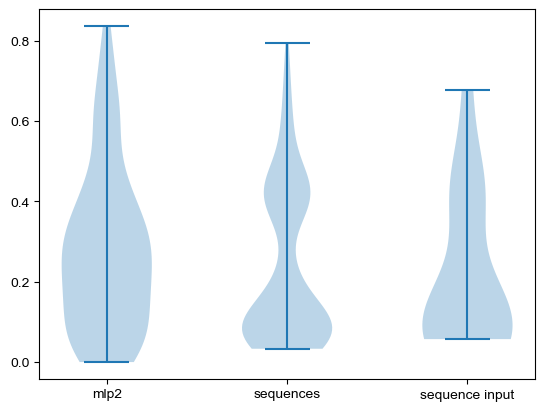

In [457]:
plt.violinplot([SI_mlp2,SI_seqall,SI_seq0])#,side='high')
plt.xticks(1+np.arange(3),['mlp2','sequences','sequence input'])

<Axes: ylabel='Density'>

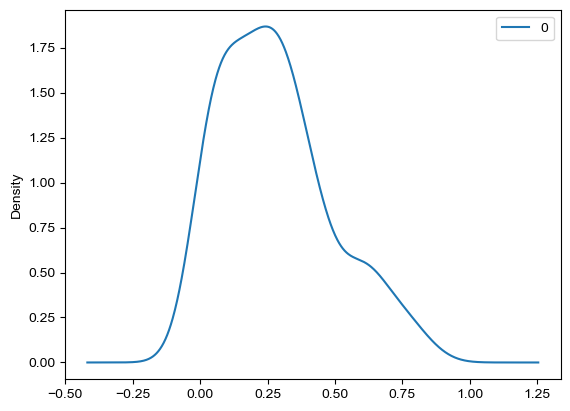

In [458]:
pd.DataFrame(SI_mlp2).plot.density()

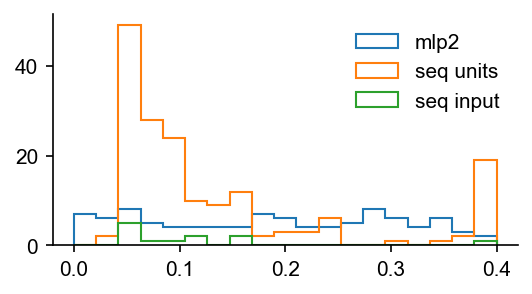

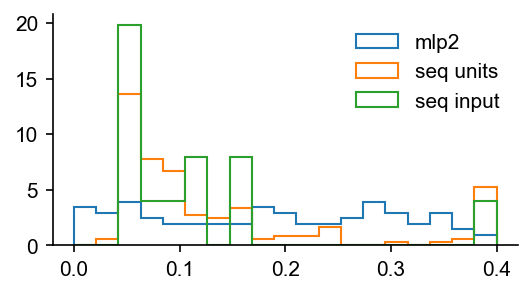

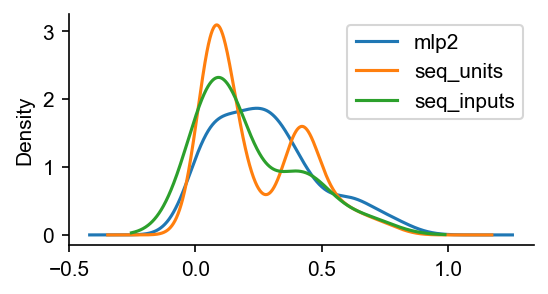

In [466]:
%matplotlib inline
plt.figure(figsize=(4,2),dpi=150)
plt.hist(SI_mlp2,np.linspace(0,0.4,20),histtype='step',label='mlp2')
plt.hist(SI_seqall,np.linspace(0,0.4,20),histtype='step',label='seq units')
plt.hist(SI_seq0,np.linspace(0,0.4,20),histtype='step',label='seq input')
plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)
plt.figure(figsize=(4,2),dpi=150)
plt.hist(SI_mlp2,np.linspace(0,0.4,20),histtype='step',label='mlp2',density=True)

plt.hist(SI_seqall,np.linspace(0,0.4,20),histtype='step',label='seq units',density=True)


plt.hist(SI_seq0,np.linspace(0,0.4,20),histtype='step',label='seq input',density=True)

plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)

fig,ax=plt.subplots(1,1,figsize=(4,2),dpi=150)
# SIs=pd.DataFrame({
#     "mlp2":SI_mlp2,
#     "sequence_units":SI_seqall,
#     "seq_input":SI_seq0
# })
# SIs.plot.density(ax=ax)
pd.DataFrame({"mlp2":SI_mlp2}).plot.density(ax=ax,label='mlp2')
pd.DataFrame({"seq_units":SI_seqall}).plot.density(ax=ax,label='seq units')
pd.DataFrame({"seq_inputs":SI_seq0}).plot.density(ax=ax,label='seq input')
ax.spines[['top','right']].set_visible(False)

In [ ]:
np.isnan(SI_mlp2).sum(),np.isnan(SI_seq0).sum(),np.isnan(SI_seqall).sum()

(0, 0, 0)

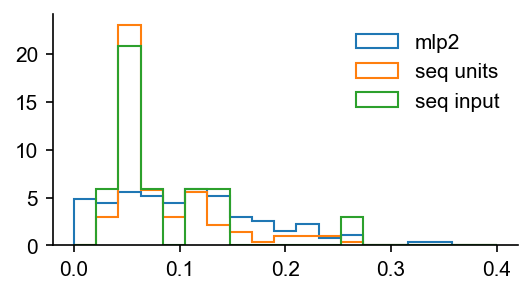

### place fields

In [474]:
cfg.experiment

'ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2'

/tmp/ipykernel_1267942/959428401.py:1: RuntimeWarning: invalid value encountered in true_divide
  tmp=np.nansum(seq0_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)


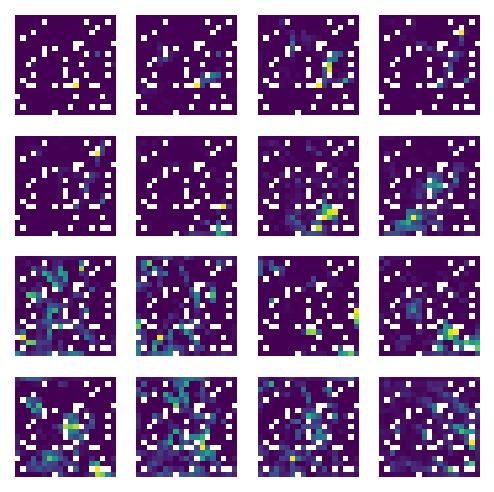

In [473]:
tmp=np.nansum(seq0_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
fig,ax = plt.subplots(4, 4, figsize=(4, 4), dpi=150)
ax = ax.flatten()
for i in range(16):#np.nonzero(SI_mlp2>0.2)[0]:
    # ax[i].set_title(f"sequence{i}")
    ax[i].imshow(tmp[:,:,i].T,extent=[100,2000,100,2000],origin='lower',cmap='viridis')
    ax[i].set_axis_off()


/tmp/ipykernel_1267942/2997137527.py:1: RuntimeWarning: invalid value encountered in true_divide
  tmp=np.nansum(hla_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)


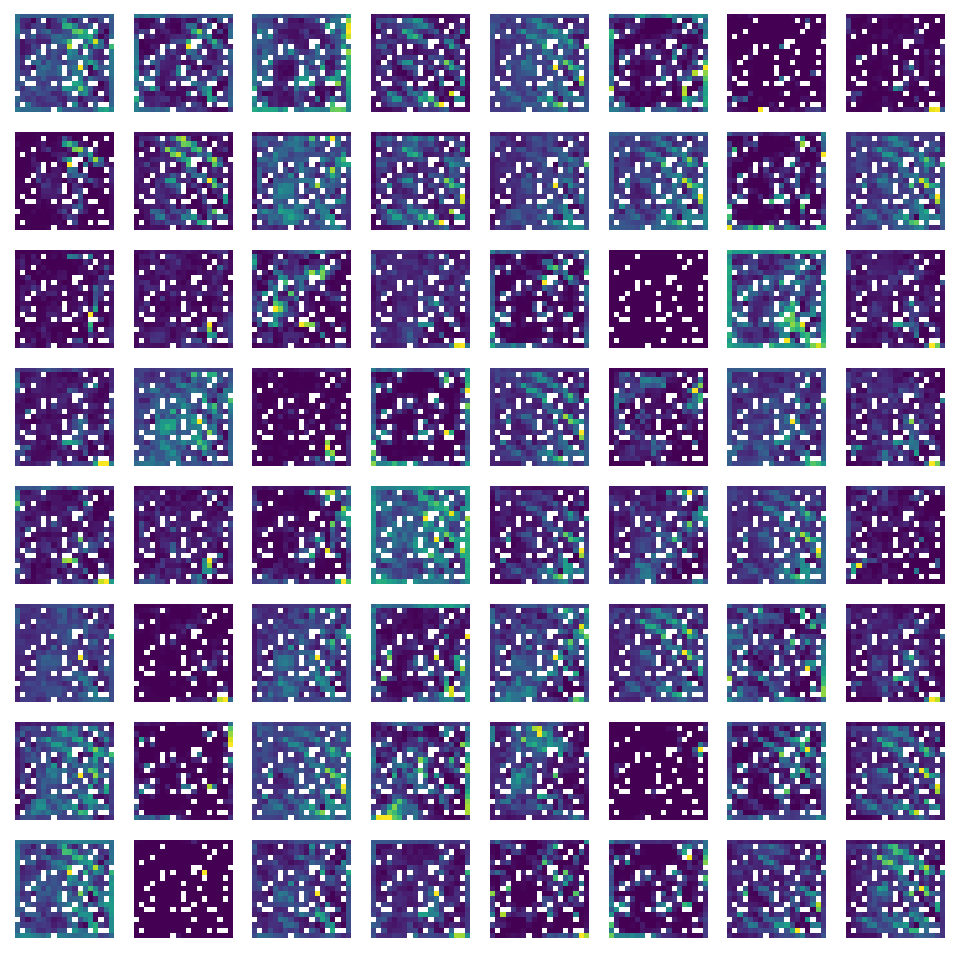

In [471]:
tmp=np.nansum(hla_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
fig,ax = plt.subplots(8, 8, figsize=(8, 8), dpi=150)
ax = ax.flatten()
for i in range(64):#np.nonzero(SI_mlp2>0.2)[0]:
    # ax[i].set_title(f"mlp2, unit {i}")
    ax[i].imshow(tmp[:,:,i].T,extent=[100,2000,100,2000],origin='lower',cmap='viridis')
    ax[i].set_axis_off()
    # ax[i].  a colorbar()

### batch in one enjoy

/tmp/ipykernel_1267942/2017893521.py:13: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_1267942/2017893521.py:15: RuntimeWarning: divide by zero encountered in log
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/2017893521.py:15: RuntimeWarning: invalid value encountered in multiply
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/2017893521.py:15: RuntimeWarning: invalid value encountered in true_divide
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/2017893521.py:93: RuntimeWarning: invalid value encountered in true_divide
  tmp=np.nansum(seq0_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
/tmp/ipykernel_1267942/2017893521.py:102: RuntimeWarning: invalid value encountered in true_divide
  tmp=np.nansum(hla_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)


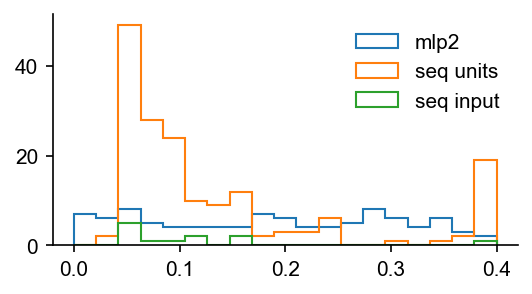

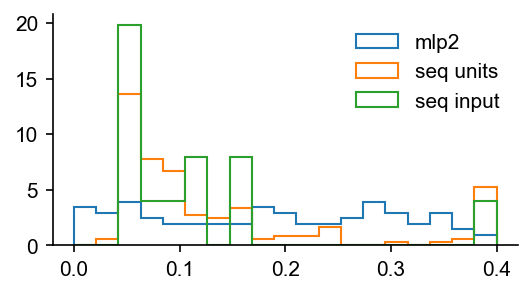

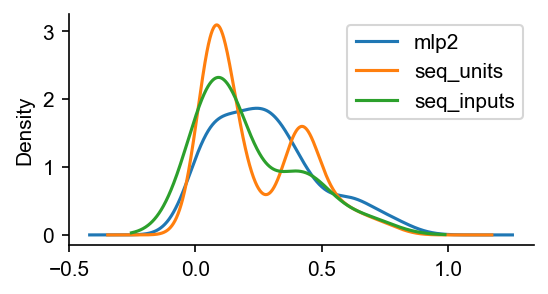

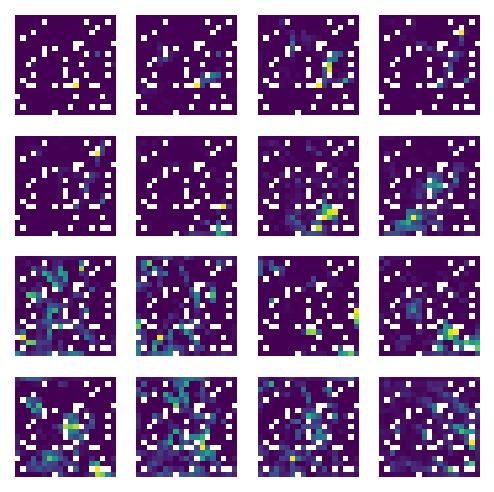

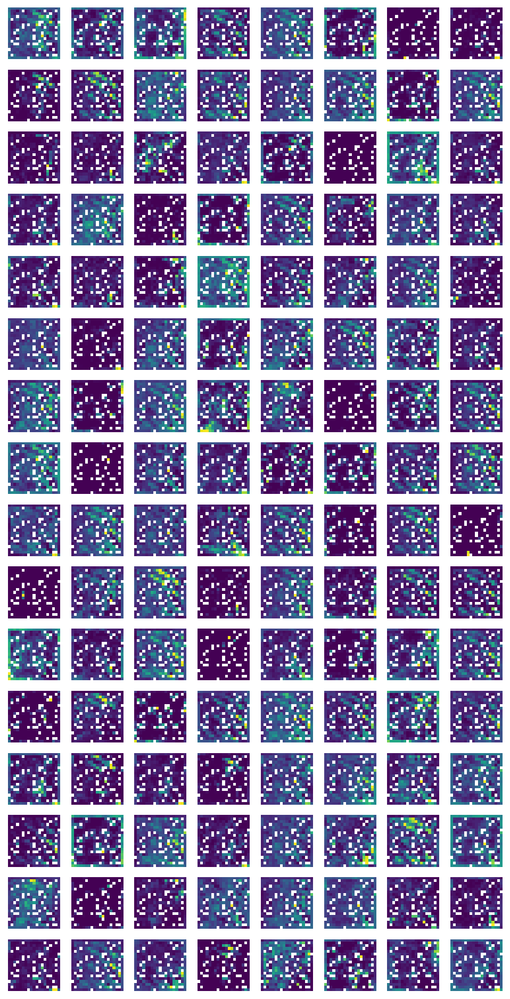

In [475]:
rootpath="/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2"
analysispath=rootpath+"/telemetry"
glob(str(analysispath+"/*.csv"))
import pandas as pd, h5py, matplotlib.pyplot as plt

pddata = pd.read_csv(glob(str(analysispath+"/*.csv"))[0])
with h5py.File(glob(str(analysispath+"/*.h5"))[0]) as h5:
    activations = {k: h5[k][...] for k in h5}
pddata['rot_pi']=pddata['rot_y']*np.pi/180
# activations['core']=torch.cat(activations['core'], dim=0).numpy() 
def SpatialInformation(firing,occu):
    p_occu = occu/occu.flatten().sum()
    fr_x = firing/occu
    fr_mean = firing.flatten().sum()/occu[:].sum()
    out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
    return( out )
    
## calculate SIs
xbound=(100,2000)
ybound=(100,2000)
grain = 19
occu_xya=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),density=False)[0]

tmp_act=activations

grain=19
hla_xya=np.zeros((grain,grain,12,128))
for i in range(128):
    hla_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['decoder.mlp.2'][:,i]*(tmp_act['decoder.mlp.2'][:,i]>0),density=False)[0]
hla_xya=hla_xya[:,:,:,:]*(hla_xya[:,:,:,:]>0)


sids=tmp_act['core'][:,:-13:15]

grain=19
seq0_xya=np.zeros((grain,grain,12,16))
for i in range(16):
    seq0_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=sids[:,i],density=False)[0]

grain=19
seqall_xya=np.zeros((grain,grain,12,16*15))
for i in range(16*15):
    seqall_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['core'][:,i],density=False)[0]

SI_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i],occu_xya) for i in range(128)])
SI_seq0=np.array([SpatialInformation(seq0_xya[:,:,:,i],occu_xya) for i in range(16)])
SI_seqall=np.array([SpatialInformation(seqall_xya[:,:,:,i],occu_xya) for i in range(16*15)])

# hla_xya_po=hla_xya[:,:,:,:]*(hla_xya[:,:,:,:]>0)
# hla_positive = hla_xya_po.reshape(-1,128).sum(0)

# np.nonzero(hla_positive <1e-4)
# hla_xya[:,:,:,59].sum()
# SI_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i]*(hla_xya[:,:,:,i]>0),occu_xya) for i in range(128)])

# plt.violinplot([SI_mlp2,SI_seqall,SI_seq0])#,side='high')
# plt.xticks(1+np.arange(3),['mlp2','sequences','sequence input'])
# pd.DataFrame(SI_mlp2).plot.density()
# %matplotlib inline
plt.figure(figsize=(4,2),dpi=150)
plt.hist(SI_mlp2,np.linspace(0,0.4,20),histtype='step',label='mlp2')
plt.hist(SI_seqall,np.linspace(0,0.4,20),histtype='step',label='seq units')
plt.hist(SI_seq0,np.linspace(0,0.4,20),histtype='step',label='seq input')
plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)
plt.savefig(analysispath+"/histogram.png",dpi=300)
plt.figure(figsize=(4,2),dpi=150)
plt.hist(SI_mlp2,np.linspace(0,0.4,20),histtype='step',label='mlp2',density=True)

plt.hist(SI_seqall,np.linspace(0,0.4,20),histtype='step',label='seq units',density=True)


plt.hist(SI_seq0,np.linspace(0,0.4,20),histtype='step',label='seq input',density=True)

plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)
plt.savefig(analysispath+"/histogram_density.png",dpi=300)

fig,ax=plt.subplots(1,1,figsize=(4,2),dpi=150)
# SIs=pd.DataFrame({
#     "mlp2":SI_mlp2,
#     "sequence_units":SI_seqall,
#     "seq_input":SI_seq0
# })
# SIs.plot.density(ax=ax)
pd.DataFrame({"mlp2":SI_mlp2}).plot.density(ax=ax,label='mlp2')
pd.DataFrame({"seq_units":SI_seqall}).plot.density(ax=ax,label='seq units')
pd.DataFrame({"seq_inputs":SI_seq0}).plot.density(ax=ax,label='seq input')
ax.spines[['top','right']].set_visible(False)
plt.savefig(analysispath+"/histogram_density_smooth.png",dpi=300)


tmp=np.nansum(seq0_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
fig,ax = plt.subplots(4, 4, figsize=(4, 4), dpi=150)
ax = ax.flatten()
for i in range(16):#np.nonzero(SI_mlp2>0.2)[0]:
    # ax[i].set_title(f"sequence{i}")
    ax[i].imshow(tmp[:,:,i].T,extent=[100,2000,100,2000],origin='lower',cmap='viridis')
    ax[i].set_axis_off()
fig.savefig(analysispath+"/sequence_input.png",dpi=300)

tmp=np.nansum(hla_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
fig,ax = plt.subplots(16, 8, figsize=(8, 16), dpi=150)
ax = ax.flatten()
for i in range(128):#np.nonzero(SI_mlp2>0.2)[0]:
    # ax[i].set_title(f"mlp2, unit {i}")
    ax[i].imshow(tmp[:,:,i].T,extent=[100,2000,100,2000],origin='lower',cmap='viridis')
    ax[i].set_axis_off()
    # ax[i].  a colorbar()
fig.savefig(analysispath+"/mlp2.png",dpi=300)

### batch many enjoys ---- aggregate data

In [9]:
folders_containing_data=glob("/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/*/")
folders_containing_data=sorted(folders_containing_data)
folders_containing_data


['/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000003314_19476480.pth/',
 '/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000006746_38572032.pth/',
 '/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000009540_54853632.pth/',
 '/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000011838_68751360.pth/',
 '/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000013486_78655488.pth/',
 '/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000014962_87

In [10]:
folders_containing_data= folders_containing_data+["/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/"]

In [11]:
folders_containing_data

['/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000003314_19476480.pth/',
 '/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000006746_38572032.pth/',
 '/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000009540_54853632.pth/',
 '/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000011838_68751360.pth/',
 '/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000013486_78655488.pth/',
 '/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000014962_87

In [20]:
(cfg.Hippo_L+cfg.Hippo_R-1)

71

In [24]:
## aggregating data
fields_enjoys=[]
PFs_enjoys=[]
SI_enjoys=[]
percent_active=[]
percent_active_all=[]
for analysispath in folders_containing_data:
    # rootpath="/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2"
    # analysispath=rootpath+"/telemetry"
    glob(str(analysispath+"/*.csv"))
    

    pddata = pd.read_csv(glob(str(analysispath+"/*.csv"))[0])
    with h5py.File(glob(str(analysispath+"/*.h5"))[0]) as h5:
        activations = {k: h5[k][...] for k in h5}
    pddata['rot_pi']=pddata['rot_y']*np.pi/180
    # activations['core']=torch.cat(activations['core'], dim=0).numpy() 
    def SpatialInformation(firing,occu,per_spike=False):
        p_occu = occu/occu.flatten().sum()
        fr_x = firing/occu
        fr_mean = firing.flatten().sum()/occu[:].sum()
        out = np.nansum((fr_x*p_occu*np.log2(fr_x/fr_mean)).flatten())
        if per_spike:
            out/=fr_mean
        return( out )
        
    ## calculate SIs
    xbound=(100,2000)
    ybound=(100,2000)
    grain = 19
    occu_xya=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),density=False)[0]

    tmp_act=activations

    grain=19
    hla_xya=np.zeros((grain,grain,12,128))
    for i in range(128):
        hla_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['decoder.mlp.2'][:,i]*(tmp_act['decoder.mlp.2'][:,i]>0),density=False)[0]
    hla_xya=hla_xya[:,:,:,:]*(hla_xya[:,:,:,:]>0)

    grain=19
    hla0_xya=np.zeros((grain,grain,12,128))
    for i in range(128):
        hla0_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['decoder.mlp.0'][:,i]*(tmp_act['decoder.mlp.0'][:,i]>0),density=False)[0]
    hla0_xya=hla0_xya[:,:,:,:]*(hla0_xya[:,:,:,:]>0)

    if tmp_act['core'].shape[1]-13 != 16*(cfg.Hippo_L+cfg.Hippo_R-1):
        print('size mismatch!!!!')
        break
    sids=tmp_act['core'][:,:-13:(cfg.Hippo_L+cfg.Hippo_R-1)]
    perc=(sids>0).mean(0)
    percent_active.append(perc)
    percent_active_all.append((sids.sum(1)>0).mean())
    
    grain=19
    seq0_xya=np.zeros((grain,grain,12,16))
    for i in range(16):
        seq0_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=sids[:,i],density=False)[0]

    grain=19
    seqall_xya=np.zeros((grain,grain,12,16*(cfg.Hippo_L+cfg.Hippo_R-1)))
    for i in range(16*(cfg.Hippo_L+cfg.Hippo_R-1)):
        seqall_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['core'][:,i],density=False)[0]

    fields = {"mlp0":hla0_xya,"mlp2":hla_xya,"seq0":seq0_xya,"seqall":seqall_xya,"occu":occu_xya}
    fields_enjoys.append(fields)

    SIs = dict()
    for key in fields:
        if key !="occu":
            SIs[key]= np.array([SpatialInformation(fields[key][:,:,:,i],fields["occu"]) for i in range(fields[key].shape[-1])])
    SI_enjoys.append(SIs)
    PFs = dict()
    for key in fields:
        if key !="occu":
            PFs[key]= np.nansum(fields[key],-2)/np.nansum(fields["occu"][:,:,:,None],-2)
    PFs_enjoys.append(PFs)
    # SI_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i],occu_xya) for i in range(128)])
    # SI_seq0=np.array([SpatialInformation(seq0_xya[:,:,:,i],occu_xya) for i in range(16)])
    # SI_seqall=np.array([SpatialInformation(seqall_xya[:,:,:,i],occu_xya) for i in range(16*15)])
    


/tmp/ipykernel_6032/1440077243.py:20: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_6032/1440077243.py:22: RuntimeWarning: divide by zero encountered in log2
  out = np.nansum((fr_x*p_occu*np.log2(fr_x/fr_mean)).flatten())
/tmp/ipykernel_6032/1440077243.py:22: RuntimeWarning: invalid value encountered in multiply
  out = np.nansum((fr_x*p_occu*np.log2(fr_x/fr_mean)).flatten())
/tmp/ipykernel_6032/1440077243.py:22: RuntimeWarning: invalid value encountered in true_divide
  out = np.nansum((fr_x*p_occu*np.log2(fr_x/fr_mean)).flatten())
/tmp/ipykernel_6032/1440077243.py:76: RuntimeWarning: invalid value encountered in true_divide
  PFs[key]= np.nansum(fields[key],-2)/np.nansum(fields["occu"][:,:,:,None],-2)
/tmp/ipykernel_6032/1440077243.py:20: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_6032/1440077243.py:22: RuntimeWarning: divide by zero encountered in log2
  out = np.nansum((fr_x*p_occu*np.

In [59]:
## aggregating data
corr_DGs=[]
for analysispath in folders_containing_data:
    # rootpath="/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2"
    # analysispath=rootpath+"/telemetry"
    glob(str(analysispath+"/*.csv"))
    

    pddata = pd.read_csv(glob(str(analysispath+"/*.csv"))[0])
    with h5py.File(glob(str(analysispath+"/*.h5"))[0]) as h5:
        activations = {k: h5[k][...] for k in h5}
    pddata['rot_pi']=pddata['rot_y']*np.pi/180
    # activations['core']=torch.cat(activations['core'], dim=0).numpy() 
    tmp_act=activations
    if tmp_act['core'].shape[1]-13 != 16*(cfg.Hippo_L+cfg.Hippo_R-1):
        print('size mismatch!!!!')
        break
    sids=tmp_act['core'][:,:-13:(cfg.Hippo_L+cfg.Hippo_R-1)]
    corr_DGs.append(pd.DataFrame(sids).corr().values)

In [821]:
ax.set_ax

AttributeError: 'numpy.ndarray' object has no attribute 'set_ax'

In [60]:
# import numpy as np
# import pandas as pd
# import h5py
# from glob import glob

# Containers for first vs. second half
fields_enjoys_first   = []
fields_enjoys_second  = []
SI_enjoys_first       = []
SI_enjoys_second      = []
PFs_enjoys_first      = []
PFs_enjoys_second     = []
percent_active_first  = []
percent_active_second = []
percent_active_all_first  = []
percent_active_all_second = []

for analysispath in folders_containing_data:
    # --- load data ---
    csv_path = glob(str(analysispath+"/*.csv"))[0]
    pddata   = pd.read_csv(csv_path)
    with h5py.File(glob(str(analysispath+"/*.h5"))[0], 'r') as h5:
        activations = {k: h5[k][...] for k in h5}

    # convert heading to radians
    pddata['rot_pi'] = pddata['rot_y'] * np.pi/180

    # determine split index
    N       = len(pddata)
    mid_idx = N // 2

    # helper for spatial information
    # def SpatialInformation(firing, occu):
    #     p_occu  = occu / occu.sum()
    #     fr_x    = firing / occu
    #     fr_mean = firing.sum() / occu.sum()
    #     return np.nansum(p_occu * fr_x * np.log(fr_x/fr_mean))

    # bin definitions
    xbound = (100,2000)
    ybound = (100,2000)
    grain  = 19
    theta_bins = np.linspace(-np.pi, np.pi, 13)

    # process each half separately
    for half, (start, end) in enumerate([(0, mid_idx), (mid_idx, N)]):
        subdata = pddata.iloc[start:end]
        subact  = {k: v[start:end] for k, v in activations.items()}

        # occupancy
        occu_xya = np.histogramdd(
            (subdata['x'], subdata['y'], subdata['rot_pi']),
            bins=(np.linspace(*xbound, grain+1),
                  np.linspace(*ybound, grain+1),
                  theta_bins),
            density=False
        )[0]

        # activations histograms
        hla2 = np.zeros((grain,grain,12,128))
        hla0 = np.zeros_like(hla2)
        for i in range(128):
            w2 = np.clip(subact['decoder.mlp.2'][:,i], 0, None)
            hla2[...,i] = np.histogramdd(
                (subdata['x'], subdata['y'], subdata['rot_pi']),
                bins=(np.linspace(*xbound, grain+1),
                      np.linspace(*ybound, grain+1),
                      theta_bins),
                weights=w2, density=False
            )[0]
            w0 = np.clip(subact['decoder.mlp.0'][:,i], 0, None)
            hla0[...,i] = np.histogramdd(
                (subdata['x'], subdata['y'], subdata['rot_pi']),
                bins=(np.linspace(*xbound, grain+1),
                      np.linspace(*ybound, grain+1),
                      theta_bins),
                weights=w0, density=False
            )[0]

        # core sequence units
        L = cfg.Hippo_L + cfg.Hippo_R - 1
        assert subact['core'].shape[1] - 13 == 16*L, "core size mismatch"
        sids = subact['core'][:,:-13:L]

        # percent‐active metrics
        perc = (sids>0).mean(0)
        perc_all = (sids.sum(1)>0).mean()

        # sequence histograms
        seq0    = np.zeros((grain,grain,12,16))
        seqall  = np.zeros((grain,grain,12,16*L))
        for i in range(16):
            seq0[...,i] = np.histogramdd(
                (subdata['x'], subdata['y'], subdata['rot_pi']),
                bins=(np.linspace(*xbound, grain+1),
                      np.linspace(*ybound, grain+1),
                      theta_bins),
                weights=sids[:,i], density=False
            )[0]
        for i in range(16*L):
            seqall[...,i] = np.histogramdd(
                (subdata['x'], subdata['y'], subdata['rot_pi']),
                bins=(np.linspace(*xbound, grain+1),
                      np.linspace(*ybound, grain+1),
                      theta_bins),
                weights=subact['core'][:,i], density=False
            )[0]

        # aggregate into dict
        fields = {
            "mlp0":   hla0,
            "mlp2":   hla2,
            "seq0":   seq0,
            "seqall": seqall,
            "occu":   occu_xya
        }

        # compute SIs & PFs
        SIs = {
            k: np.array([SpatialInformation(fields[k][...,i], occu_xya)
                         for i in range(fields[k].shape[-1])])
            for k in fields if k != "occu"
        }
        total_occu = occu_xya.sum(axis=2)[...,None]
        PFs = {
            k: fields[k].sum(axis=2) / total_occu
            for k in fields if k != "occu"
        }

        # stash into the correct half
        if half == 0:
            fields_enjoys_first.append(fields)
            SI_enjoys_first.append(SIs)
            PFs_enjoys_first.append(PFs)
            percent_active_first.append(perc)
            percent_active_all_first.append(perc_all)
        else:
            fields_enjoys_second.append(fields)
            SI_enjoys_second.append(SIs)
            PFs_enjoys_second.append(PFs)
            percent_active_second.append(perc)
            percent_active_all_second.append(perc_all)

# After this:
#   • fields_enjoys_first  / fields_enjoys_second  
#   • SI_enjoys_first      / SI_enjoys_second      
#   • PFs_enjoys_first     / PFs_enjoys_second     
#   • percent_active_first / percent_active_second 
#   • percent_active_all_first / percent_active_all_second
# all contain the separate stats for each half.


/tmp/ipykernel_6032/1440077243.py:20: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_6032/1440077243.py:22: RuntimeWarning: divide by zero encountered in log2
  out = np.nansum((fr_x*p_occu*np.log2(fr_x/fr_mean)).flatten())
/tmp/ipykernel_6032/1440077243.py:22: RuntimeWarning: invalid value encountered in multiply
  out = np.nansum((fr_x*p_occu*np.log2(fr_x/fr_mean)).flatten())
/tmp/ipykernel_6032/1440077243.py:22: RuntimeWarning: invalid value encountered in true_divide
  out = np.nansum((fr_x*p_occu*np.log2(fr_x/fr_mean)).flatten())
/tmp/ipykernel_6032/514366505.py:126: RuntimeWarning: invalid value encountered in true_divide
  k: fields[k].sum(axis=2) / total_occu
/tmp/ipykernel_6032/1440077243.py:20: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_6032/1440077243.py:22: RuntimeWarning: divide by zero encountered in log2
  out = np.nansum((fr_x*p_occu*np.log2(fr_x/fr_mean)).flatten())
/tmp/ipy

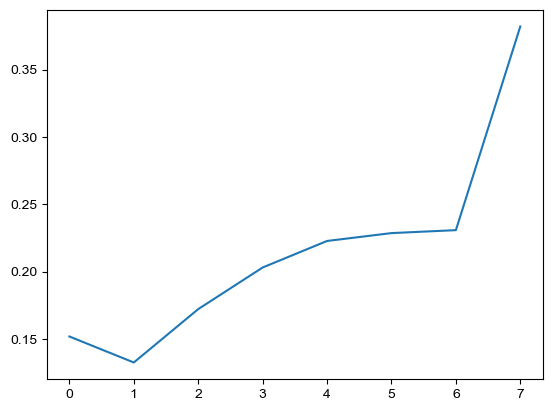

In [708]:
plt.plot(percent_active_all)

In [709]:
sids.shape

(50001, 16)

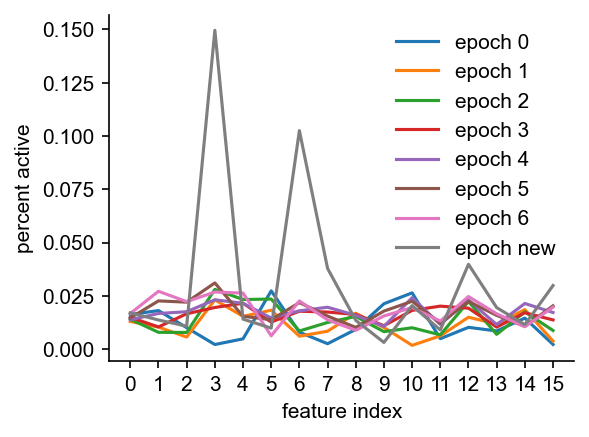

In [706]:
plt.figure(figsize=(4,3),dpi=150)
i = 0
for perc in percent_active:
    plt.plot(perc,label=f"epoch {i if i <7 else 'new'}")
    i+=1
plt.xlabel('feature index')
plt.xticks(np.arange(16))
plt.ylabel('percent active')
plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)

In [684]:
SI_enjoys

[]

In [633]:
np.nonzero(SI_enjoys[-2]["mlp2"]>0.4)[0].size

11

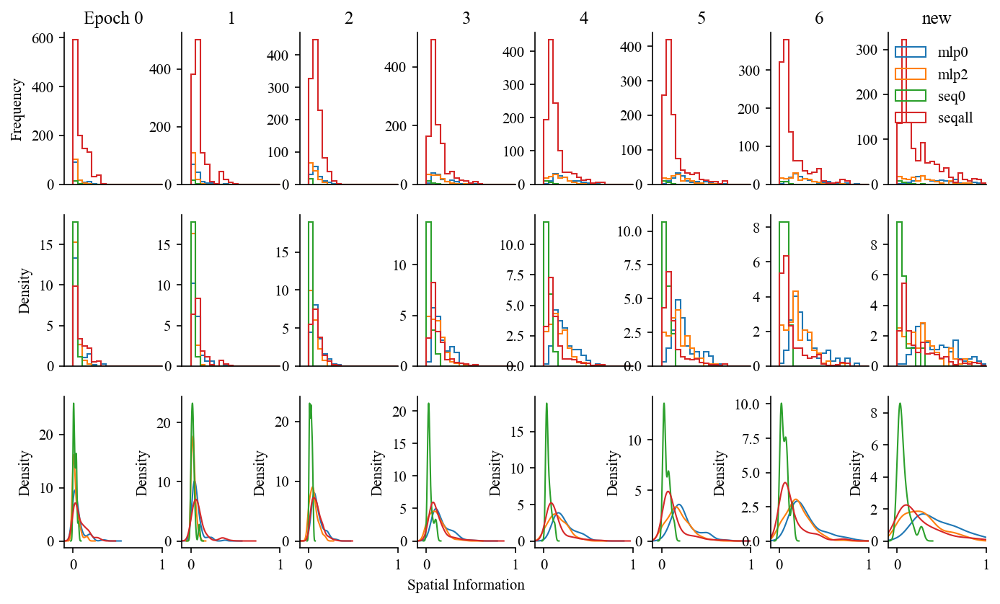

In [768]:



from cv2 import line
from matplotlib import legend


fig,ax=plt.subplots(3,8,figsize=(5.5*2,2*5.5/8*1.5*3),dpi=150)
for i in range(8):
    # j=0
    for key in SI_enjoys[0]:
        ax[0,i].hist(SI_enjoys[i][key],np.linspace(0,1,20),histtype='step',label=key)
        ax[0,i].set_xticks([])
        ax[1,i].hist(SI_enjoys[i][key],np.linspace(0,1,20),histtype='step',label=key,density=True)
        ax[1,i].set_xticks([])
        pd.DataFrame({key:SI_enjoys[i][key]}).plot.density(ax=ax[2,i],legend=False,ylabel=False,label=False,linewidth=1,bw_method=0.4)


ax[0,-1].legend(frameon=False)
for ax_single in ax.flatten():
    # ax_single.legend(frameon=False)
    # ax_single.set_xlabel('Spatial Information')
    # ax_single.set_ylabel('Density')
    ax_single.set_xlim(-0.1,1)
    # ax_single.set_ylim(0,10)
    ax_single.spines[['top','right']].set_visible(False)
# plt.gca().spines[['top','right']].set_visible(False)
ax[0,0].set_ylabel('Frequency')
ax[1,0].set_ylabel('Density')
# ax[i,0].set_ylim(0,10)
for i in range(8):
    ax[0,i].set_title(f"{i if i<7 else 'new'}")
ax[0,0].set_title("Epoch 0")
    # ax[2,i].set_xlabel('Spatial Information')
for i in range(1,8):
    ax[0,i].set_ylabel('')
ax[2,3].set_xlabel('Spatial Information')
fig.savefig(current_fig_path/"SI_epochs.svg",bbox_inches='tight',dpi=300)

/tmp/ipykernel_6032/2447225421.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  base_cmap = mpl.cm.get_cmap('cividis', 8)


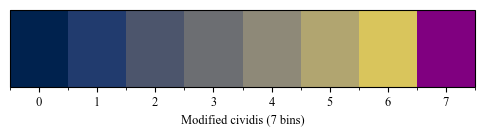

In [53]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np

# 1) Grab the 7 discrete colors from cividis
base_cmap = mpl.cm.get_cmap('cividis', 8)
colors = base_cmap(np.arange(8))   # shape (7,4) array of RGBA

# 2) Replace entry 3 with your own color, e.g. bright magenta
#    You can specify any valid Matplotlib color spec here:
colors[7] = mpl.colors.to_rgba('purple')

# 3) Build a new ListedColormap from your modified array
custom_cmap = mpl.colors.ListedColormap(colors, name='cividis_mod')

# 4) Plot a colorbar to show all 7 entries
fig, ax = plt.subplots(figsize=(6,1))
# create a ScalarMappable with your new cmap and discrete boundaries
norm = mpl.colors.BoundaryNorm(np.arange(9)-0.5, custom_cmap.N)
sm = mpl.cm.ScalarMappable(cmap=custom_cmap, norm=norm)
sm.set_array([])

# draw the colorbar with ticks at each integer
cbar = fig.colorbar(
    sm,
    cax=ax,
    orientation='horizontal',
    ticks=np.arange(8),
    boundaries=np.arange(9)-0.5
)
cbar.set_label('Modified cividis (7 bins)')
cbar.set_ticklabels([str(i) for i in range(8)])



In [454]:
layernames=['seq0', 'seqall','mlp0', 'mlp2' ]

In [463]:
displayname_dict={layernames[0]:'Seq. Input',layernames[1]:'Seq.',layernames[2]:'MLP1',layernames[3]:'MLP2'}

In [701]:
displayname_dict={'seq0':'Seq. Input','seqall':'Seq.','mlp0':'Decoder 1','mlp2':'Decoder 2'}

In [49]:
displayname_dict={'seq0':'DG','seqall':'CA3','mlp0':'Decoder 1','mlp2':'Decoder 2'}

#### SI across training

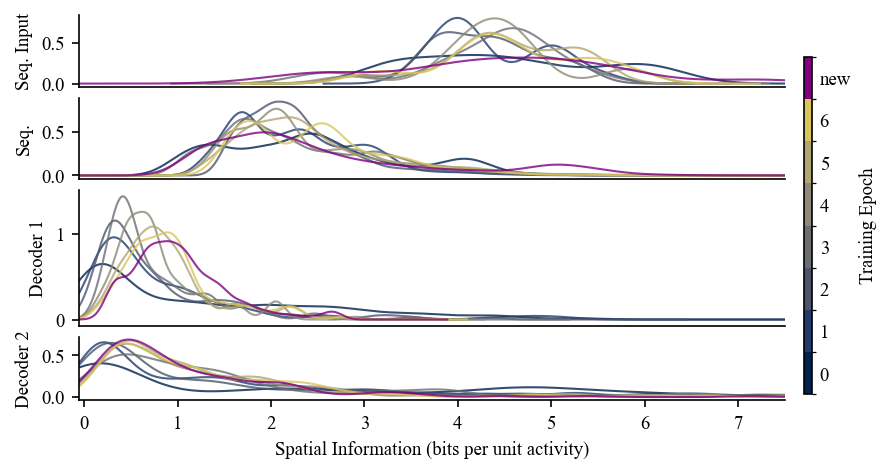

In [836]:

colormap=mpl.cm.get_cmap('cividis', 7)

from cv2 import line
from matplotlib import legend


fig,ax=plt.subplots(4,1,figsize=(5.5,3),dpi=150, gridspec_kw={'height_ratios': [0.8, 0.9, 1.5, 0.7]})

bw_kde=np.array([0.2,0.1,0.1,0.07])*2
displaynames=['']
for j,key in enumerate(layernames):
    for i in range(8):

        pd.DataFrame({key:SI_enjoys_perspike[i][key]}).plot.density(ax=ax[j],legend=False,ylabel=False,label=False,linewidth=1,bw_method=bw_kde[j],
                                                        color=colors[i],alpha=0.8)
    ax[j].set_ylabel(displayname_dict[key])
    if j<3:
        ax[j].set_xticks([])
        # ax[j].set_
ax[3].set_xlabel('Spatial Information (bits per unit activity)')

# ax[0].legend(frameon=False)
for ax_single in ax.flatten():
    # ax_single.legend(frameon=False)
    # ax_single.set_xlabel('Spatial Information')
    # ax_single.set_ylabel('Density')
    ax_single.set_xlim(-0.05,7.5)
    #set log scale
    # ax_single.set_xscale('log')
    # ax_single.set_ylim(0,10)
    ax_single.spines[['top','right']].set_visible(False)

cbar_ax = fig.add_axes([0.96, 0.15, 0.01, 0.75])  


cbar = fig.colorbar(
    sm,
    cax=cbar_ax,
    orientation='vertical',
    ticks=np.arange(8),
    boundaries=np.arange(9)-0.5
)
cbar.set_label('Training Epoch')
cbar.ax.tick_params(length=0)
cbar.set_ticklabels([str(i) for i in range(7)]+['new'])

fig.tight_layout(rect=[0,0,0.94,1],pad=0.15)  # leave space on the right for the colorbar

fig.savefig(current_fig_path/"SI_epochs_group_by_layer_per_spike.svg",bbox_inches='tight',dpi=300)

In [838]:
current_fig_path

PosixPath('/home/xiaoxiong/Neuripsfigs/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000023246_138178560.pth')

In [51]:
layernames=displayname_dict.keys()

/tmp/ipykernel_6032/4215932271.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap=mpl.cm.get_cmap('cividis', 7)


31.343833203816096
13.149383150922198
13.21057154972489
32.244216868077295


/tmp/ipykernel_6032/4215932271.py:50: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0,0,0.94,1],pad=0.15)  # leave space on the right for the colorbar


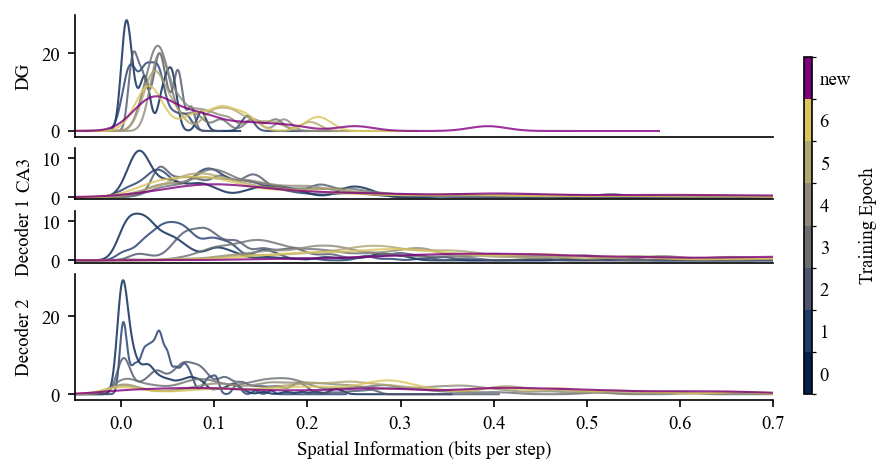

In [57]:

colormap=mpl.cm.get_cmap('cividis', 7)




fig,ax=plt.subplots(4,1,figsize=(5.5,3),dpi=150, gridspec_kw={'height_ratios': [31.343833203816096,
                                                                                13.149383150922198,
                                                                                13.21057154972489,
                                                                                32.244216868077295]})

bw_kde=np.array([0.2,0.1,0.1,0.1])
displaynames=['']
for j,key in enumerate(layernames):
    for i in range(8):

        pd.DataFrame({key:SI_enjoys[i][key]}).plot.density(ax=ax[j],legend=False,ylabel=False,label=False,linewidth=1,bw_method=bw_kde[j],
                                                        color=colors[i],alpha=0.8)
    ax[j].set_ylabel(displayname_dict[key])
    if j<3:
        ax[j].set_xticks([])
        # ax[j].set_
ax[3].set_xlabel('Spatial Information (bits per step)')

# ax[0].legend(frameon=False)
for ax_single in ax.flatten():
    # ax_single.legend(frameon=False)
    # ax_single.set_xlabel('Spatial Information')
    # ax_single.set_ylabel('Density')
    ax_single.set_xlim(-0.05,0.7)
    #set log scale
    print(ax_single.get_ylim()[1]-ax_single.get_ylim()[0])
    # ax_single.set_xscale('log')
    # ax_single.set_ylim(0,10)
    ax_single.spines[['top','right']].set_visible(False)

cbar_ax = fig.add_axes([0.96, 0.15, 0.01, 0.75])  


cbar = fig.colorbar(
    sm,
    cax=cbar_ax,
    orientation='vertical',
    ticks=np.arange(8),
    boundaries=np.arange(9)-0.5
)
cbar.set_label('Training Epoch')
cbar.ax.tick_params(length=0)
cbar.set_ticklabels([str(i) for i in range(7)]+['new'])

fig.tight_layout(rect=[0,0,0.94,1],pad=0.15)  # leave space on the right for the colorbar

fig.savefig(current_fig_path/"SI_epochs_group_by_layer.pdf",bbox_inches='tight',dpi=300)

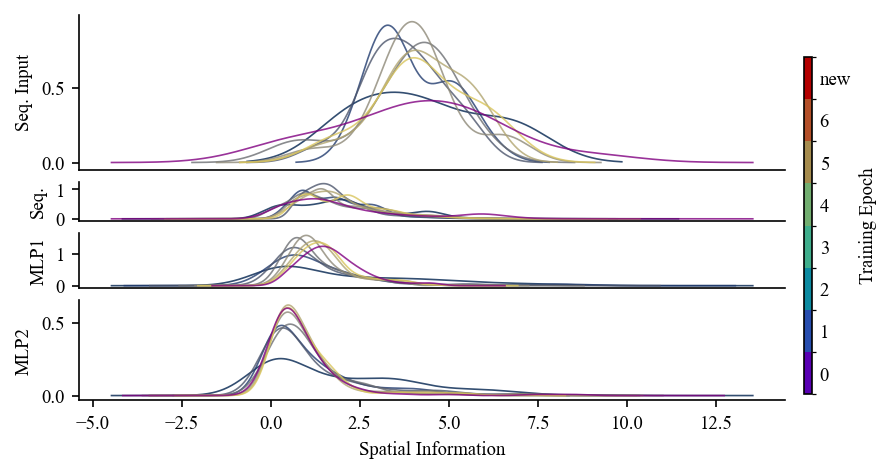

In [683]:

colormap=mpl.cm.get_cmap('cividis', 7)

from cv2 import line
from matplotlib import legend


fig,ax=plt.subplots(4,1,figsize=(5.5,3),dpi=150, gridspec_kw={'height_ratios': [28, 7, 10, 18]})

for j,key in enumerate(layernames):
    for i in range(8):

        pd.DataFrame({key:SI_enjoys[i][key]}).plot.density(ax=ax[j],legend=False,ylabel=False,label=False,linewidth=0.8,#bw_method=0.1,
                                                        color=colors[i],alpha=0.8)
    ax[j].set_ylabel(displayname_dict[key])
    if j<3:
        ax[j].set_xticks([])
        # ax[j].set_
ax[3].set_xlabel('Spatial Information')

# ax[0].legend(frameon=False)
for ax_single in ax.flatten():
    # ax_single.legend(frameon=False)
    # ax_single.set_xlabel('Spatial Information')
    # ax_single.set_ylabel('Density')
    # ax_single.set_xlim(-0.5,1.5)
    # ax_single.set_ylim(0,10)
    ax_single.spines[['top','right']].set_visible(False)
# # plt.gca().spines[['top','right']].set_visible(False)
# ax[0,0].set_ylabel('Frequency')
# ax[1,0].set_ylabel('Density')
# # ax[i,0].set_ylim(0,10)
# for i in range(8):
#     ax[0,i].set_title(f"{i if i<7 else 'new'}")
# ax[0,0].set_title("Epoch 0")
#     # ax[2,i].set_xlabel('Spatial Information')
# for i in range(1,8):
#     ax[0,i].set_ylabel('')
# ax[2,3].set_xlabel('Spatial Information')
cbar_ax = fig.add_axes([0.96, 0.15, 0.01, 0.75])  
#    [left, bottom, width, height] in fractions of figure size

# 2) draw the colorbar based on the last 'im' (they’re all the same scale)
# fig.colorbar(im, cax=cbar_ax, label='Epoch colorbar')

# tidy up and save
# draw the colorbar with ticks at each integer
cbar = fig.colorbar(
    sm,
    cax=cbar_ax,
    orientation='vertical',
    ticks=np.arange(8),
    boundaries=np.arange(9)-0.5
)
cbar.set_label('Training Epoch')
cbar.ax.tick_params(length=0)
cbar.set_ticklabels([str(i) for i in range(7)]+['new'])

fig.tight_layout(rect=[0,0,0.94,1],pad=0.15)  # leave space on the right for the colorbar

# fig.savefig(current_fig_path/"SI_epochs_group_by_layer.svg",bbox_inches='tight',dpi=300)

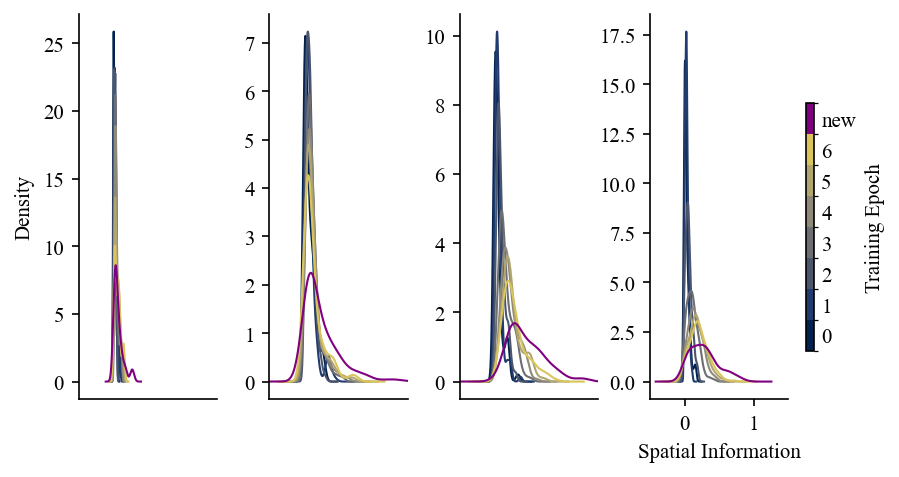

In [461]:

colormap=mpl.cm.get_cmap('cividis', 7)

from cv2 import line
from matplotlib import legend


fig,ax=plt.subplots(1,4,figsize=(5.5,3),dpi=150)#, gridspec_kw={'width_ratios': [2.5, 0.8, 1, 1]})

for j,key in enumerate(layernames):
    for i in range(8):

        pd.DataFrame({key:SI_enjoys[i][key]}).plot.density(ax=ax[j],legend=False,ylabel=False,label=False,linewidth=1,bw_method=0.4,
                                                        color=colors[i])
    # ax[j].set_ylabel(key)
    if j<3:
        ax[j].set_xticks([])
        # ax[j].set_
    if j>0:
        ax[j].set_ylabel('')
ax[3].set_xlabel('Spatial Information')

# ax[0].legend(frameon=False)
for ax_single in ax.flatten():
    # ax_single.legend(frameon=False)
    # ax_single.set_xlabel('Spatial Information')
    # ax_single.set_ylabel('Density')
    ax_single.set_xlim(-0.5,1.5)
    # ax_single.set_ylim(0,10)
    ax_single.spines[['top','right']].set_visible(False)
# # plt.gca().spines[['top','right']].set_visible(False)
# ax[0,0].set_ylabel('Frequency')
# ax[1,0].set_ylabel('Density')
# # ax[i,0].set_ylim(0,10)
# for i in range(8):
#     ax[0,i].set_title(f"{i if i<7 else 'new'}")
# ax[0,0].set_title("Epoch 0")
#     # ax[2,i].set_xlabel('Spatial Information')
# for i in range(1,8):
#     ax[0,i].set_ylabel('')
# ax[2,3].set_xlabel('Spatial Information')
cbar_ax = fig.add_axes([0.96, 0.25, 0.01, 0.55])  
#    [left, bottom, width, height] in fractions of figure size

# 2) draw the colorbar based on the last 'im' (they’re all the same scale)
# fig.colorbar(im, cax=cbar_ax, label='Epoch colorbar')

# tidy up and save
# draw the colorbar with ticks at each integer
cbar = fig.colorbar(
    sm,
    cax=cbar_ax,
    orientation='vertical',
    ticks=np.arange(8),
    boundaries=np.arange(9)-0.5
)
cbar.set_label('Training Epoch')
cbar.ax.tick_params(length=0)
cbar.set_ticklabels([str(i) for i in range(7)]+['new'])

fig.tight_layout(rect=[0,0,0.94,1],pad=0.05)  # leave space on the right for the colorbar

fig.savefig(current_fig_path/"SI_epochs_group_by_layer_horizontal.svg",bbox_inches='tight',dpi=300)

In [720]:
len(PFs_enjoys)

8

In [858]:
PFs_enjoys[0]['mlp0'].shape

(19, 19, 128)

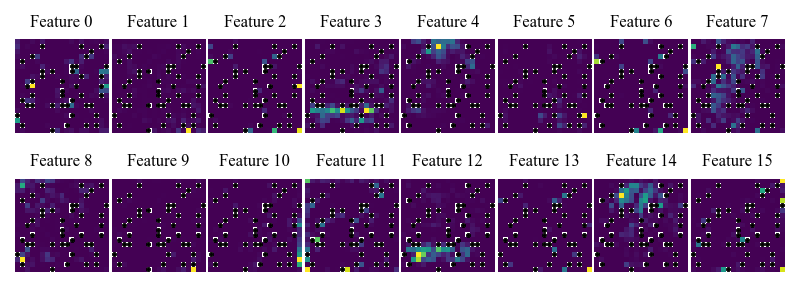

In [ ]:
cmap = mpl.colormaps.get_cmap('viridis')  # viridis is the default colormap for imshow
# cmap.set_bad(color='C3')

fig,ax=plt.subplots(2,8,figsize=(5.5, 2), dpi=150)
best
ax = ax.flatten()
for i in range(16):
    im=ax[i].imshow(PFs_enjoys[6]['mlp0'][:,:,i].T,origin='lower',cmap=cmap)#,vmax=1,vmin=0)
    for x in range(19):
        for y in range(19):
            if np.isnan(PFs_enjoys[6]['seq0'][x,y,i]):
                ax[i].scatter(x,y+0.1,marker='P',color='k',s=5,lw=0.4)#'X',ha='center',va='center',color='k')
                # ax[i].scatter(x+0.5,y+0.5,marker='x',color='k',s=5)#'X',ha='center',va='center',color='k')
    ax[i].set_axis_off()
    ax[i].set_title(f"Feature {i }",fontsize=8)
# Label just one of them (optional)
ax[8].set_xlabel('x')
ax[8].set_ylabel('y')

# --- add a single colorbar on the right ---
# # 1) create a new axes to the right of all subplots
# cbar_ax = fig.add_axes([0.96, 0.25, 0.01, 0.55])  
# #    [left, bottom, width, height] in fractions of figure size

# # 2) draw the colorbar based on the last 'im' (they’re all the same scale)
# fig.colorbar(im, cax=cbar_ax, label='Correlation')

# tidy up and save
fig.tight_layout(rect=[0,0,0.94,1],pad=0.15)  # leave space on the right for the colorbar
# current_fig_path = Path('.')  # set this to wherever you want to save
fig.savefig(current_fig_path/"PFs_MLP.svg",
            bbox_inches='tight', dpi=500)

In [492]:
SI_enjoys[6]['seqall'].shape

(1136,)

#### Place fields CA3

In [22]:
current_fig_path = pathlib.Path('/home/xiaoxiong/Neuripsfigs')

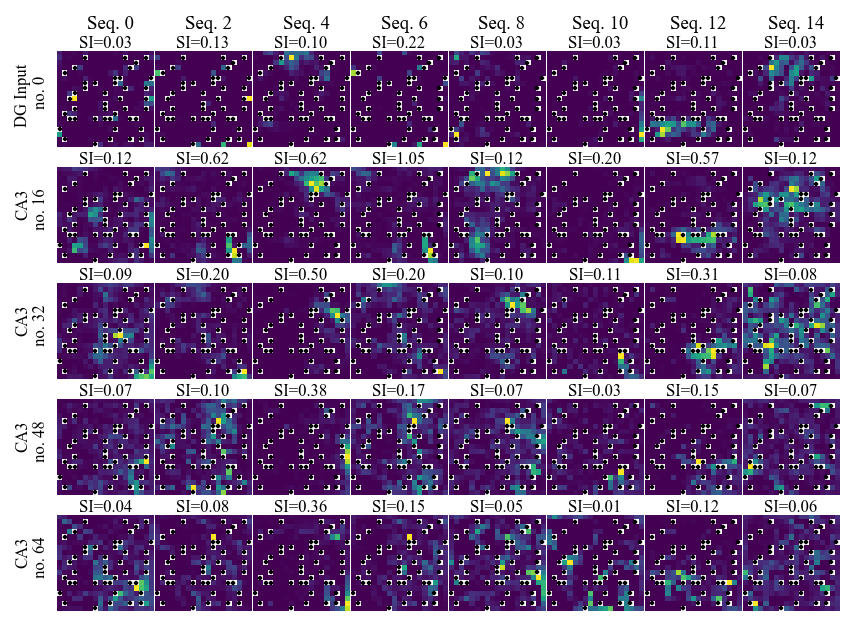

In [80]:
cmap = mpl.colormaps.get_cmap('viridis')  # viridis is the default colormap for imshow
# cmap.set_bad(color='C3')

num_rows_per_feature = 5
fig,ax=plt.subplots(num_rows_per_feature,8,figsize=(5.5, 4), dpi=150)#, gridspec_kw={'height_ratios': [1.3, 1, 1, 1,1, 1.3, 1, 1, 1,1]})#,'hspace':[0.2,0.1,0.1,0.1,0.2,0.1,0.1,0.1]})
# ax = ax.flatten()
for i in range(0,16,2):

    idx_y = 0
    idx_x = i//2
    for j in range(num_rows_per_feature):
        tmpax=ax[idx_y*num_rows_per_feature+j,idx_x]
        im=tmpax.imshow(PFs_enjoys[6]['seqall'].reshape(19,19,16,-1)[:,:,i,16*j].T,origin='lower',cmap=cmap,vmin=0)#,vmax=1,vmin=0)
        for x in range(19):
            for y in range(19):
                if np.isnan(PFs_enjoys[6]['seq0'][x,y,i]):
                    tmpax.scatter(x,y+0.1,marker='P',color='k',s=3,lw=0.2)#'X',ha='center',va='center',color='k')
                    # ax[i].scatter(x+0.5,y+0.5,marker='x',color='k',s=5)#'X',ha='center',va='center',color='k')
        tmpax.set_axis_off()
        tmpax.set_title(f"SI={SI_enjoys[6]['seqall'].reshape(16,-1)[i,16*j]:.2f}",fontsize=8,pad=0.1)
    # ax[idx_y*num_rows_per_feature,idx_x].set_title(f"Seq. {i }\nSI={SI_enjoys[6]['seqall'].reshape(16,-1)[i,0]:.2f}",fontsize=8,pad=0.1)
    ax[idx_y*num_rows_per_feature,idx_x].text(10,24,f"Seq. {i }",ha='center',va='center',fontsize=9)
for i in range(num_rows_per_feature):
    ax[i,0].text(-2,10,f'CA3\n no. {i*16}'if i>0 else 'DG Input\nno. 0   ',ha='right',va='center', rotation=90,fontsize=8)
    # ax[i+num_rows_per_feature,0].text(-7,10,f'l={i*16}',rotation=90)
# Label just one of them (optional)
# ax[8].set_xlabel('x')
# ax[8].set_ylabel('y')

# # --- add a single colorbar on the right ---
# # # 1) create a new axes to the right of all subplots
# # cbar_ax = fig.add_axes([0.96, 0.25, 0.01, 0.55])  
# # #    [left, bottom, width, height] in fractions of figure size

# # # 2) draw the colorbar based on the last 'im' (they’re all the same scale)
# # fig.colorbar(im, cax=cbar_ax, label='Correlation')

# # tidy up and save
# fig.tight_layout(pad=0.15)  # leave space on the right for the colorbarrect=[0,0,0.94,1],
# # current_fig_path = Path('.')  # set this to wherever you want to save
fig.tight_layout(pad=0.09)
fig.savefig(current_fig_path/"PFs_seqall_including0_epoch6_mark_obstacle_withSI_half.pdf",
            bbox_inches='tight', dpi=200)

#### CA3 place field half

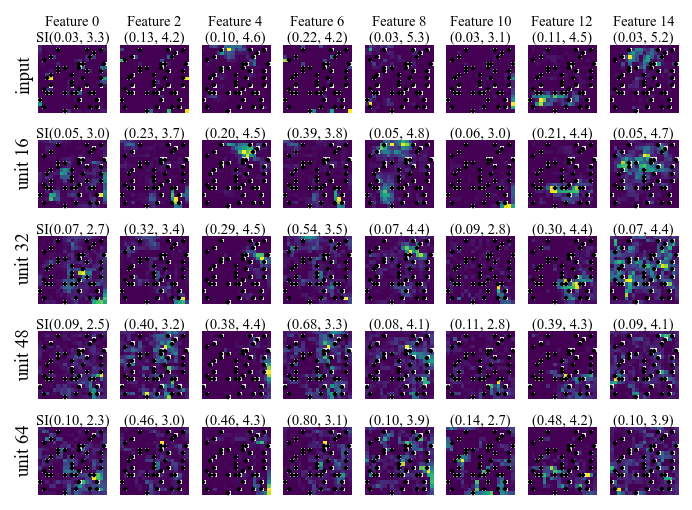

In [857]:
cmap = mpl.colormaps.get_cmap('viridis')  # viridis is the default colormap for imshow
# cmap.set_bad(color='C3')

num_rows_per_feature = 5
fig,ax=plt.subplots(num_rows_per_feature,8,figsize=(5.5, 4), dpi=150)#, gridspec_kw={'height_ratios': [1.3, 1, 1, 1,1, 1.3, 1, 1, 1,1]})#,'hspace':[0.2,0.1,0.1,0.1,0.2,0.1,0.1,0.1]})
# ax = ax.flatten()
for i in range(0,16,2):

    idx_y = 0
    idx_x = i//2
    for j in range(num_rows_per_feature):
        tmpax=ax[idx_y*num_rows_per_feature+j,idx_x]
        im=tmpax.imshow(PFs_enjoys[6]['seqall'].reshape(19,19,16,-1)[:,:,i,16*j].T,origin='lower',cmap=cmap,vmin=0)#,vmax=1,vmin=0)
        for x in range(19):
            for y in range(19):
                if np.isnan(PFs_enjoys[6]['seq0'][x,y,i]):
                    tmpax.scatter(x,y+0.1,marker='P',color='k',s=3,lw=0.2)#'X',ha='center',va='center',color='k')
                    # ax[i].scatter(x+0.5,y+0.5,marker='x',color='k',s=5)#'X',ha='center',va='center',color='k')
        tmpax.set_axis_off()
        tmpax.set_title(f"{'SI'if idx_x==0 else ''}({SI_enjoys[6]['seqall'].reshape(16,-1)[i,j]:.2f}, {SI_enjoys_perspike[6]['seqall'].reshape(16,-1)[i,j]:.1f})",fontsize=7,pad=0.1)
    ax[idx_y*num_rows_per_feature,idx_x].set_title(f"Feature {i }\n{'SI'if idx_x==0 else ''}({SI_enjoys[6]['seqall'].reshape(16,-1)[i,0]:.2f}, {SI_enjoys_perspike[6]['seqall'].reshape(16,-1)[i,0]:.1f})",fontsize=7,pad=0.1)
for i in range(num_rows_per_feature):
    ax[i,0].text(-7,6,f'unit {i*16}'if i>0 else 'input',rotation=90)
    # ax[i+num_rows_per_feature,0].text(-7,10,f'l={i*16}',rotation=90)
# Label just one of them (optional)
# ax[8].set_xlabel('x')
# ax[8].set_ylabel('y')

# # --- add a single colorbar on the right ---
# # # 1) create a new axes to the right of all subplots
# # cbar_ax = fig.add_axes([0.96, 0.25, 0.01, 0.55])  
# # #    [left, bottom, width, height] in fractions of figure size

# # # 2) draw the colorbar based on the last 'im' (they’re all the same scale)
# # fig.colorbar(im, cax=cbar_ax, label='Correlation')

# # tidy up and save
# fig.tight_layout(pad=0.15)  # leave space on the right for the colorbarrect=[0,0,0.94,1],
# # current_fig_path = Path('.')  # set this to wherever you want to save
fig.savefig(current_fig_path/"PFs_seqall_including0_epoch6_mark_obstacle_with_bothSI_half.svg",
            bbox_inches='tight', dpi=200)

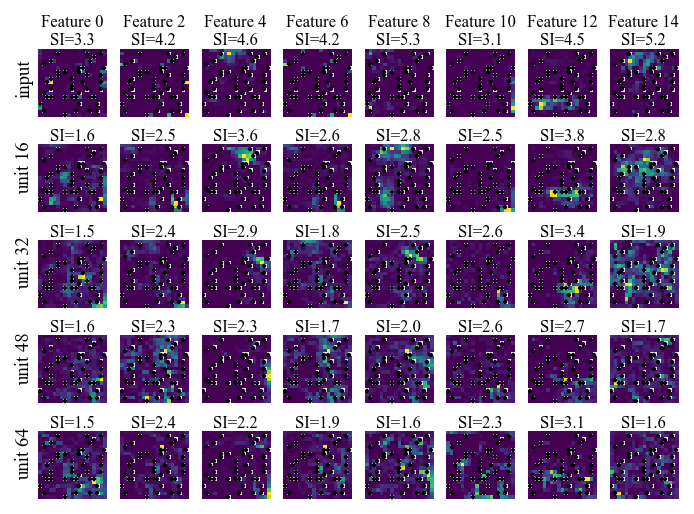

In [851]:
cmap = mpl.colormaps.get_cmap('viridis')  # viridis is the default colormap for imshow
# cmap.set_bad(color='C3')

num_rows_per_feature = 5
fig,ax=plt.subplots(num_rows_per_feature,8,figsize=(5.5, 4), dpi=150)#, gridspec_kw={'height_ratios': [1.3, 1, 1, 1,1, 1.3, 1, 1, 1,1]})#,'hspace':[0.2,0.1,0.1,0.1,0.2,0.1,0.1,0.1]})
# ax = ax.flatten()
for i in range(0,16,2):

    idx_y = 0
    idx_x = i//2
    for j in range(num_rows_per_feature):
        tmpax=ax[idx_y*num_rows_per_feature+j,idx_x]
        im=tmpax.imshow(PFs_enjoys[6]['seqall'].reshape(19,19,16,-1)[:,:,i,16*j].T,origin='lower',cmap=cmap,vmin=0)#,vmax=1,vmin=0)
        for x in range(19):
            for y in range(19):
                if np.isnan(PFs_enjoys[6]['seq0'][x,y,i]):
                    tmpax.scatter(x,y+0.1,marker='P',color='k',s=3,lw=0.2)#'X',ha='center',va='center',color='k')
                    # ax[i].scatter(x+0.5,y+0.5,marker='x',color='k',s=5)#'X',ha='center',va='center',color='k')
        tmpax.set_axis_off()
        tmpax.set_title(f"SI={SI_enjoys_perspike[6]['seqall'].reshape(16,-1)[i,16*j]:.1f}",fontsize=8,pad=0.1)
    ax[idx_y*num_rows_per_feature,idx_x].set_title(f"Feature {i }\nSI={SI_enjoys_perspike[6]['seqall'].reshape(16,-1)[i,0]:.1f}",fontsize=8,pad=0.1)
for i in range(num_rows_per_feature):
    ax[i,0].text(-7,6,f'unit {i*16}'if i>0 else 'input',rotation=90)
# Label just one of them (optional)
# ax[8].set_xlabel('x')
# ax[8].set_ylabel('y')

# # --- add a single colorbar on the right ---
# # # 1) create a new axes to the right of all subplots
# # cbar_ax = fig.add_axes([0.96, 0.25, 0.01, 0.55])  
# # #    [left, bottom, width, height] in fractions of figure size

# # # 2) draw the colorbar based on the last 'im' (they’re all the same scale)
# # fig.colorbar(im, cax=cbar_ax, label='Correlation')

# # tidy up and save
# fig.tight_layout(pad=0.15)  # leave space on the right for the colorbarrect=[0,0,0.94,1],
# # current_fig_path = Path('.')  # set this to wherever you want to save
fig.savefig(current_fig_path/"PFs_seqall_including0_epoch6_mark_obstacle_withSI_perspike_half.svg",
            bbox_inches='tight', dpi=200)

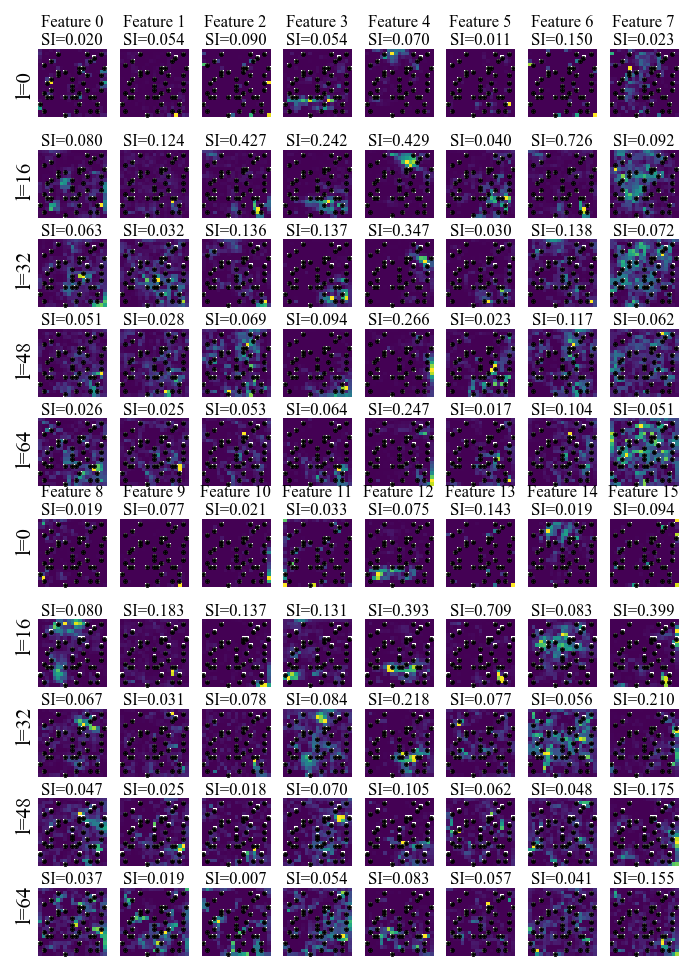

In [498]:
from numpy import pad


cmap = mpl.colormaps.get_cmap('viridis')  # viridis is the default colormap for imshow
# cmap.set_bad(color='C3')

num_rows_per_feature = 5
fig,ax=plt.subplots(num_rows_per_feature*2,8,figsize=(5.5, 8), dpi=150, gridspec_kw={'height_ratios': [1.3, 1, 1, 1,1, 1.3, 1, 1, 1,1]})#,'hspace':[0.2,0.1,0.1,0.1,0.2,0.1,0.1,0.1]})
# ax = ax.flatten()
for i in range(16):
    idx_y = i//8
    idx_x = i%8
    for j in range(num_rows_per_feature):
        tmpax=ax[idx_y*num_rows_per_feature+j,idx_x]
        im=tmpax.imshow(PFs_enjoys[6]['seqall'].reshape(19,19,16,-1)[:,:,i,16*j].T,origin='lower',cmap=cmap,vmin=0)#,vmax=1,vmin=0)
        for x in range(19):
            for y in range(19):
                if np.isnan(PFs_enjoys[6]['seq0'][x,y,i]):
                    tmpax.scatter(x,y+0.1,marker='P',color='k',s=4,lw=0.3)#'X',ha='center',va='center',color='k')
                    # ax[i].scatter(x+0.5,y+0.5,marker='x',color='k',s=5)#'X',ha='center',va='center',color='k')
        tmpax.set_axis_off()
        tmpax.set_title(f"SI={SI_enjoys[6]['seqall'].reshape(16,-1)[i,16*j]:.3f}",fontsize=8,pad=0.1)
    ax[idx_y*num_rows_per_feature,idx_x].set_title(f"Feature {i }\nSI={SI_enjoys[6]['seqall'].reshape(16,-1)[i,0]:.3f}",fontsize=8,pad=0.1)
for i in range(num_rows_per_feature):
    ax[i,0].text(-7,6,f'l={i*16}',rotation=90)
    ax[i+num_rows_per_feature,0].text(-7,10,f'l={i*16}',rotation=90)
# Label just one of them (optional)
# ax[8].set_xlabel('x')
# ax[8].set_ylabel('y')

# # --- add a single colorbar on the right ---
# # # 1) create a new axes to the right of all subplots
# # cbar_ax = fig.add_axes([0.96, 0.25, 0.01, 0.55])  
# # #    [left, bottom, width, height] in fractions of figure size

# # # 2) draw the colorbar based on the last 'im' (they’re all the same scale)
# # fig.colorbar(im, cax=cbar_ax, label='Correlation')

# # tidy up and save
# fig.tight_layout(pad=0.15)  # leave space on the right for the colorbarrect=[0,0,0.94,1],
# # current_fig_path = Path('.')  # set this to wherever you want to save
fig.savefig(current_fig_path/"PFs_seqall_including0_epoch6_mark_obstacle_withSI.svg",
            bbox_inches='tight', dpi=200)

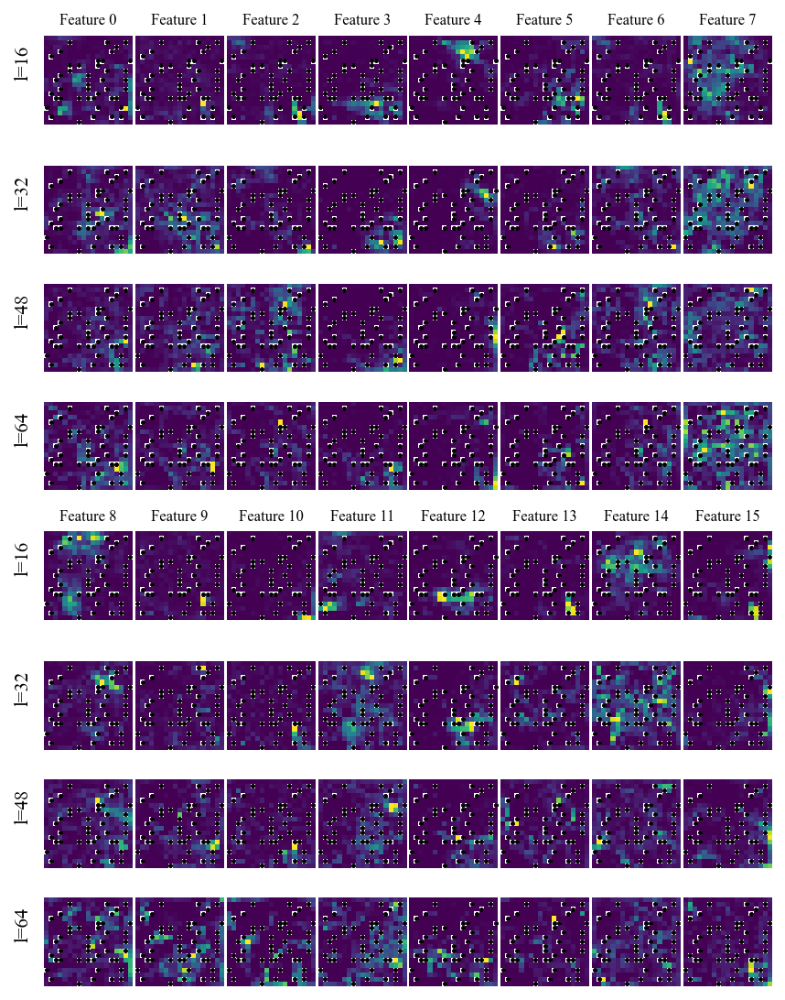

In [488]:
cmap = mpl.colormaps.get_cmap('viridis')  # viridis is the default colormap for imshow
# cmap.set_bad(color='C3')

fig,ax=plt.subplots(8,8,figsize=(5.5, 7.3), dpi=150, gridspec_kw={'height_ratios': [1.2, 1, 1, 1, 1.2, 1, 1, 1]})#,'hspace':[0.2,0.1,0.1,0.1,0.2,0.1,0.1,0.1]})
# ax = ax.flatten()
for i in range(16):
    idx_y = i//8
    idx_x = i%8
    for j in range(4):
        tmpax=ax[idx_y*4+j,idx_x]
        im=tmpax.imshow(PFs_enjoys[6]['seqall'].reshape(19,19,16,-1)[:,:,i,16*j+16].T,origin='lower',cmap=cmap)#,vmax=1,vmin=0)
        for x in range(19):
            for y in range(19):
                if np.isnan(PFs_enjoys[6]['seq0'][x,y,i]):
                    tmpax.scatter(x,y+0.1,marker='P',color='k',s=5,lw=0.4)#'X',ha='center',va='center',color='k')
                    # ax[i].scatter(x+0.5,y+0.5,marker='x',color='k',s=5)#'X',ha='center',va='center',color='k')
        tmpax.set_axis_off()
    ax[idx_y*4,idx_x].set_title(f"Feature {i }",fontsize=8)
for i in range(4):
    ax[i,0].text(-7,10,f'l={i*16+16}',rotation=90)
    ax[i+4,0].text(-7,10,f'l={i*16+16}',rotation=90)
# Label just one of them (optional)
# ax[8].set_xlabel('x')
# ax[8].set_ylabel('y')

# # --- add a single colorbar on the right ---
# # # 1) create a new axes to the right of all subplots
# # cbar_ax = fig.add_axes([0.96, 0.25, 0.01, 0.55])  
# # #    [left, bottom, width, height] in fractions of figure size

# # # 2) draw the colorbar based on the last 'im' (they’re all the same scale)
# # fig.colorbar(im, cax=cbar_ax, label='Correlation')

# # tidy up and save
fig.tight_layout(pad=0.15)  # leave space on the right for the colorbarrect=[0,0,0.94,1],
# # current_fig_path = Path('.')  # set this to wherever you want to save
fig.savefig(current_fig_path/"PFs_seqall_epoch6_mark_obstacle.svg",
            bbox_inches='tight', dpi=500)

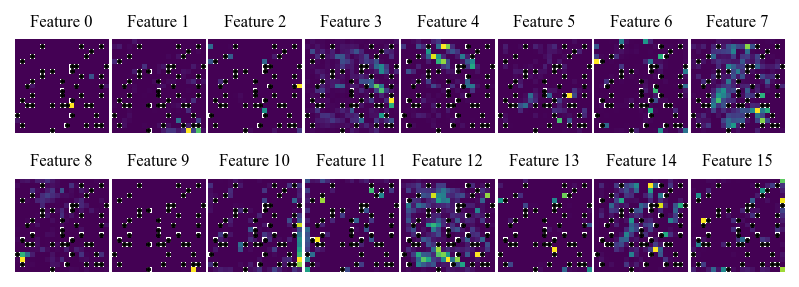

In [433]:
cmap = mpl.colormaps.get_cmap('viridis')  # viridis is the default colormap for imshow
# cmap.set_bad(color='C3')

fig,ax=plt.subplots(2,8,figsize=(5.5, 2), dpi=150)
ax = ax.flatten()
for i in range(16):
    im=ax[i].imshow(PFs_enjoys[-1]['seq0'][:,:,i].T,origin='lower',cmap=cmap)#,vmax=1,vmin=0)
    for x in range(19):
        for y in range(19):
            if np.isnan(PFs_enjoys[-1]['seq0'][x,y,i]):
                ax[i].scatter(x,y+0.1,marker='P',color='k',s=5,lw=0.4)#'X',ha='center',va='center',color='k')
                # ax[i].scatter(x+0.5,y+0.5,marker='x',color='k',s=5)#'X',ha='center',va='center',color='k')
    ax[i].set_axis_off()
    ax[i].set_title(f"Feature {i }",fontsize=8)
# Label just one of them (optional)
ax[8].set_xlabel('x')
ax[8].set_ylabel('y')

# --- add a single colorbar on the right ---
# # 1) create a new axes to the right of all subplots
# cbar_ax = fig.add_axes([0.96, 0.25, 0.01, 0.55])  
# #    [left, bottom, width, height] in fractions of figure size

# # 2) draw the colorbar based on the last 'im' (they’re all the same scale)
# fig.colorbar(im, cax=cbar_ax, label='Correlation')

# tidy up and save
fig.tight_layout(rect=[0,0,0.94,1],pad=0.15)  # leave space on the right for the colorbar
# current_fig_path = Path('.')  # set this to wherever you want to save
fig.savefig(current_fig_path/"PFs_seq0_epochnew_mark_obstacle.svg",
            bbox_inches='tight', dpi=500)

In [404]:
current_fig_path

PosixPath('/home/xiaoxiong/Neuripsfigs')

/tmp/ipykernel_1854092/3557429492.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0,0,0.94,1],pad=0.15)  # leave space on the right for the colorbar


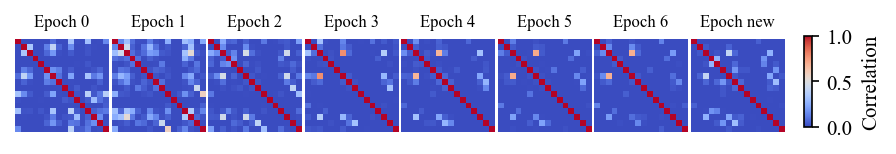

In [408]:
fig,ax=plt.subplots(1,8,figsize=(5.5, 1.1), dpi=150)
for i,corr in enumerate(corr_DGs):
    im=ax[i].imshow(corr,cmap='coolwarm',vmax=1,vmin=0)
    ax[i].set_axis_off()
    ax[i].set_title(f"Epoch {i if i<7 else 'new'}",fontsize=8)
# Label just one of them (optional)
ax[0].set_xlabel('DG feature index')
ax[0].set_ylabel('DG feature index')

# --- add a single colorbar on the right ---
# 1) create a new axes to the right of all subplots
cbar_ax = fig.add_axes([0.96, 0.25, 0.01, 0.55])  
#    [left, bottom, width, height] in fractions of figure size

# 2) draw the colorbar based on the last 'im' (they’re all the same scale)
fig.colorbar(im, cax=cbar_ax, label='Correlation')

# tidy up and save
fig.tight_layout(rect=[0,0,0.94,1],pad=0.15)  # leave space on the right for the colorbar
# current_fig_path = Path('.')  # set this to wherever you want to save
fig.savefig(current_fig_path/"SpikeTrain_corr_DGbyDG_epoch_all_timepoints_coolwarm.svg",
            bbox_inches='tight', dpi=300)

In [716]:
# correlation of PFs between enjoys for each layer
corrs_features=[]
for tmpPF in PFs_enjoys:
    corrs_features.append(pd.DataFrame(tmpPF['seq0'].reshape(-1,16)).corr())

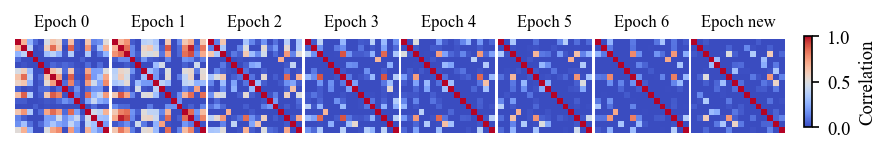

In [ ]:
fig,ax=plt.subplots(1,8,figsize=(5.5, 1.1), dpi=150)
for i,corr in enumerate(corrs_features):
    im=ax[i].imshow(corr,cmap='coolwarm',vmax=1,vmin=0)
    ax[i].set_axis_off()
    ax[i].set_title(f"Epoch {i if i<7 else 'new'}",fontsize=8)
# Label just one of them (optional)
ax[0].set_xlabel('DG feature index')
ax[0].set_ylabel('DG feature index')

# --- add a single colorbar on the right ---
# 1) create a new axes to the right of all subplots
cbar_ax = fig.add_axes([0.96, 0.25, 0.01, 0.55])  
#    [left, bottom, width, height] in fractions of figure size

# 2) draw the colorbar based on the last 'im' (they’re all the same scale)
fig.colorbar(im, cax=cbar_ax, label='Correlation')

ax[0].set_xlabel('DG feature index')
ax[0].set_ylabel('DG feature index')
# tidy up and save
fig.tight_layout(rect=[0,0,0.94,1],pad=0.15)  # leave space on the right for the colorbar
# current_fig_path = Path('.')  # set this to wherever you want to save
fig.savefig(current_fig_path/"PF_corr_DGbyDG_epoch_coolwarm.svg",
            bbox_inches='tight', dpi=300)

In [714]:
# correlation of PFs between enjoys for each layer
corrs_features_CV=[]
for i in range(len(PFs_enjoys_first)):
    corrs_features_CV.append(pd.DataFrame(np.hstack([PFs_enjoys_first[i]['seq0'].reshape(-1,16),PFs_enjoys_second[i]['seq0'].reshape(-1,16)])).corr().iloc[:16,16:])

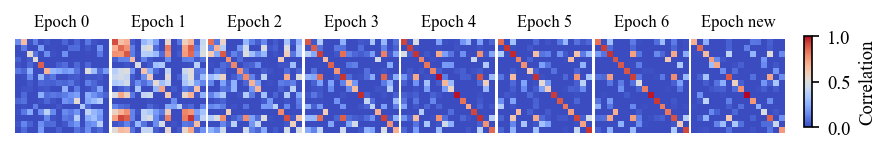

In [715]:
fig,ax=plt.subplots(1,8,figsize=(5.5, 1.1), dpi=150)
for i,corr in enumerate(corrs_features_CV):
    im=ax[i].imshow(corr,cmap='coolwarm',vmax=1,vmin=0)
    ax[i].set_axis_off()
    ax[i].set_title(f"Epoch {i if i<7 else 'new'}",fontsize=8)
# Label just one of them (optional)
ax[0].set_xlabel('DG feature index')
ax[0].set_ylabel('DG feature index')

# --- add a single colorbar on the right ---
# 1) create a new axes to the right of all subplots
cbar_ax = fig.add_axes([0.96, 0.25, 0.01, 0.55])  
#    [left, bottom, width, height] in fractions of figure size

# 2) draw the colorbar based on the last 'im' (they’re all the same scale)
fig.colorbar(im, cax=cbar_ax, label='Correlation')

# tidy up and save
fig.tight_layout(rect=[0,0,0.94,1],pad=0.15)  # leave space on the right for the colorbar
# current_fig_path = Path('.')  # set this to wherever you want to save
fig.savefig(current_fig_path/"PF_corr_CV_DGbyDG_epoch_coolwarm.svg",
            bbox_inches='tight', dpi=300)

/tmp/ipykernel_1267942/1435416950.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0,0,0.9,1])  # leave space on the right for the colorbar


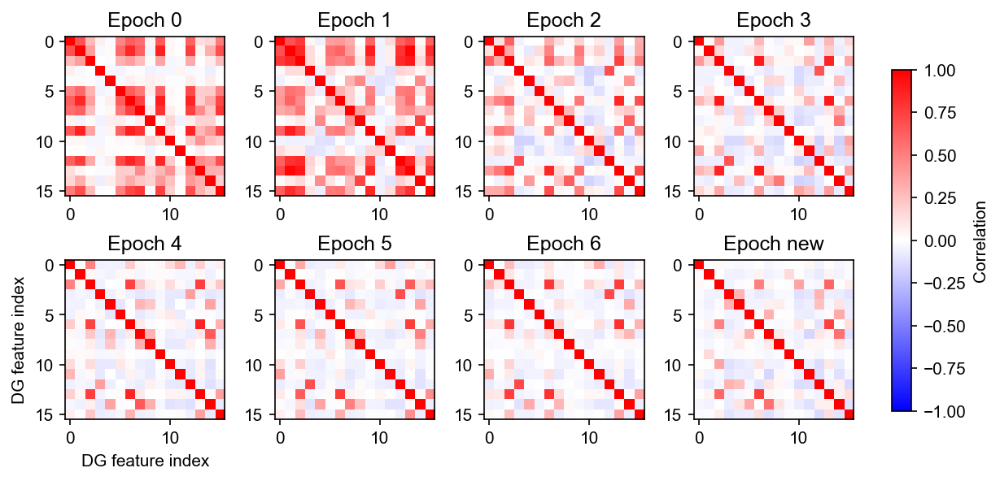

In [736]:
num_epochs = len(corrs_features)

# Create the grid of subplots
fig, ax = plt.subplots(num_epochs//4, 4,
                       figsize=(4*2, (num_epochs//4)*2),
                       dpi=150,
                       constrained_layout=False)

ax = ax.flatten()

# Plot each matrix and keep a reference to the last image
for i in range(num_epochs):
    im = ax[i].imshow(corrs_features[i],
                      cmap='bwr',
                      vmin=-1, vmax=1)
    ax[i].set_title(f"Epoch {i if i < 7 else 'new'}")

# Label just one of them (optional)
ax[4].set_xlabel('DG feature index')
ax[4].set_ylabel('DG feature index')

# --- add a single colorbar on the right ---
# 1) create a new axes to the right of all subplots
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  
#    [left, bottom, width, height] in fractions of figure size

# 2) draw the colorbar based on the last 'im' (they’re all the same scale)
fig.colorbar(im, cax=cbar_ax, label='Correlation')

# tidy up and save
fig.tight_layout(rect=[0,0,0.9,1])  # leave space on the right for the colorbar
# current_fig_path = Path('.')  # set this to wherever you want to save
fig.savefig(current_fig_path/"PF_corr_DGbyDG_epoch.svg",
            bbox_inches='tight', dpi=300)

In [384]:
PFs_enjoys[0]['seq0'].shape

(19, 19, 16)

In [540]:
# correlation of PFs between enjoys for each layer
corrs=dict()
for key in PFs_enjoys[0]:
    tmpPFs_enjoys=np.array([x[key] for x in PFs_enjoys])
    tmpPFs_enjoys=tmpPFs_enjoys.reshape(tmpPFs_enjoys.shape[0],-1,tmpPFs_enjoys.shape[-1])
    corrs[key]=np.array([pd.DataFrame(tmpPFs_enjoys[:,:,i].T).corr() for i in range(tmpPFs_enjoys.shape[-1])])


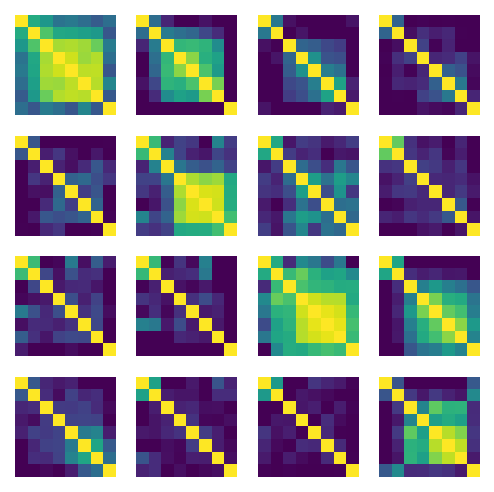

In [541]:
fig,ax = plt.subplots(4, 4, figsize=(4, 4), dpi=150)
ax = ax.flatten()
for i in range(16):#np.nonzero(SI_mlp2>0.2)[0]:
    # ax[i].set_title(f"sequence{i}")
    ax[i].imshow(corrs['seq0'][i],vmin=0,vmax=1)
    ax[i].set_axis_off()

#### PV corr

In [528]:
tmpPFs_enjoys.shape

(7, 361, 240)

In [1065]:
# correlation of PFs between enjoys for each layer
PV_corrs=dict()
for key in PFs_enjoys[0]:
    tmpPFs_enjoys=np.array([x[key] for x in PFs_enjoys])
    tmpPFs_enjoys=tmpPFs_enjoys.reshape(tmpPFs_enjoys.shape[0],-1,tmpPFs_enjoys.shape[-1])
    PV_corrs[key]=np.array([pd.DataFrame(tmpPFs_enjoys[:,i,:].T).corr() for i in range(tmpPFs_enjoys.shape[1])])

In [567]:
PV_corrs['mlp2'].shape

(361, 8, 8)

In [557]:
path_obj=pathlib.Path(analysispath)
figure_path=pathlib.Path('/home/xiaoxiong/Neuripsfigs/')
figure_path.mkdir(exist_ok=True)
path_obj.relative_to('/home/xiaoxiong/try0120/train_dir/')
current_fig_path=figure_path/path_obj.relative_to('/home/xiaoxiong/try0120/train_dir/')
_ensure_parent(current_fig_path/"PV_corrs.svg")

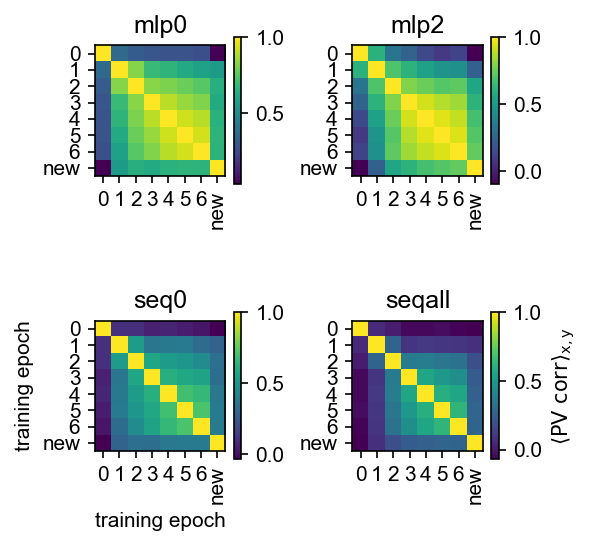

In [711]:
fig,ax=plt.subplots(2,2,figsize=(4,4),dpi=150)
ax=ax.flatten()
i=0
for key in PV_corrs:
    im = ax[i].imshow(np.nanmean(PV_corrs[key], axis=0), label=key)
    ax[i].set_title(key)
    ax[i].set_yticks(np.arange(8))
    ax[i].set_yticklabels(["0","1","2","3","4","5","6","new"])
    ax[i].set_xticks(np.arange(8))
    tmp=ax[i].set_xticklabels(["0","1","2","3","4","5","6","new"])
    tmp[-1].set_rotation(90)
    cbar=plt.colorbar(im, ax=ax[i],shrink=0.7)
    i+=1
ax[2].set_ylabel('training epoch')
ax[2].set_xlabel('training epoch')
cbar.set_label(r'$\langle \mathrm{PV\ corr} \rangle_{\mathrm{x,y}}$')
fig.tight_layout()
_ensure_parent(current_fig_path/"PV_corrs.svg")
fig.savefig(current_fig_path/"PV_corrs.svg",dpi=300,bbox_inches='tight')
# plt.ylabel(r'$<PV corr>_{loc}$')
# plt.xlabel(r'$\Delta t (h)$')
# plt.legend(frameon=False)
# plt.gca().spines[['top','right']].set_visible(False)
# plt.title('representation drift across training epochs in different layers')
# plt.savefig(analysispath+"/PV_corrs.svg",dpi=300,bbox_inches='tight')

In [712]:
AC_PV_corrs=dict()
n_enjoys=7
for key in PFs_enjoys[0]:
    tmp=np.zeros((PV_corrs[key].shape[0],n_enjoys))
    for j in range(n_enjoys):
        tmp[:,j]=np.array([ PV_corrs[key][:,i,i+j] for i in range(0,n_enjoys-j)]).mean(0)
    AC_PV_corrs[key]=tmp

In [611]:
plt.rcParams['text.usetex'] = False


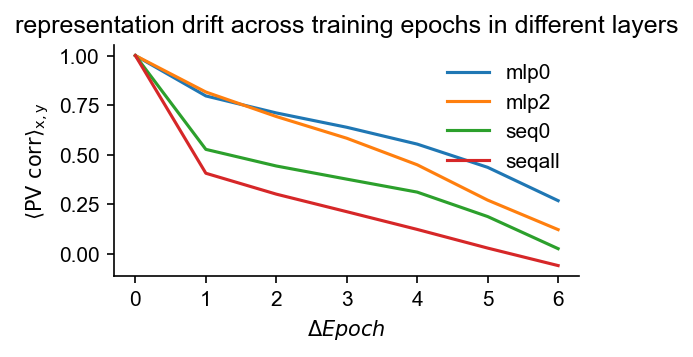

In [713]:
plt.figure(figsize=(4,2),dpi=150)
plt.title('')
for key in AC_PV_corrs:
    plt.plot(np.nanmean(AC_PV_corrs[key],axis=0),label=key)
plt.ylabel(r'$\langle \mathrm{PV\ corr} \rangle_{\mathrm{x,y}}$')
plt.xlabel(r'$\Delta Epoch$')
plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)
plt.title('representation drift across training epochs in different layers')
plt.savefig(current_fig_path/"AC_PV_corrs.svg",dpi=300,bbox_inches='tight')

In [64]:
num_epochs=8

In [65]:
# correlation of PFs between enjoys for each layer
PV_corrs_CV=dict()
for key in PFs_enjoys[0]:
    tmpPFs_enjoys1=np.array([x[key] for x in PFs_enjoys_first])
    tmpPFs_enjoys2=np.array([x[key] for x in PFs_enjoys_second])
    tmpPFs_enjoys1=tmpPFs_enjoys1.reshape(tmpPFs_enjoys1.shape[0],-1,tmpPFs_enjoys1.shape[-1])
    tmpPFs_enjoys2=tmpPFs_enjoys2.reshape(tmpPFs_enjoys2.shape[0],-1,tmpPFs_enjoys2.shape[-1])
    PV_corrs_CV[key]=np.array([pd.DataFrame(np.vstack([tmpPFs_enjoys1[:,i,:],tmpPFs_enjoys2[:,i,:]]).T).corr().to_numpy()[:num_epochs,num_epochs:] for i in range(tmpPFs_enjoys1.shape[1])])

/tmp/ipykernel_6032/3190392354.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0,0,0.9,1],pad=0.2)


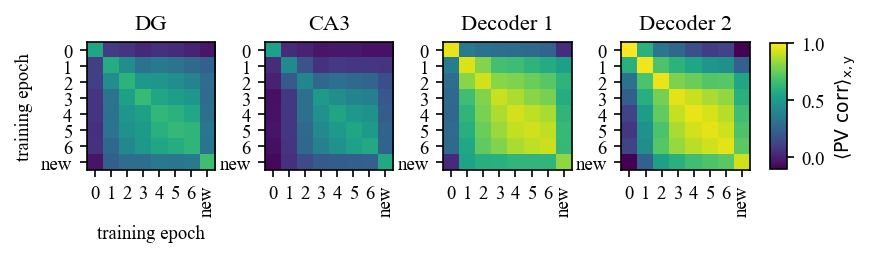

In [70]:
from zstandard import frame_content_size


fig,ax=plt.subplots(1,4,figsize=(5.5,2.8),dpi=150)
ax=ax.flatten()
i=0
for key in layernames:
    im = ax[i].imshow(np.nanmean(PV_corrs_CV[key], axis=0), label=key,vmin=-0.1,vmax=1)#,cmap='bwr',vmin=-1,vmax=1) cmap='coolwarm',
    ax[i].set_title(displayname_dict[key])
    ax[i].set_yticks(np.arange(8))
    ax[i].set_yticklabels(["0","1","2","3","4","5","6","new"])
    ax[i].set_xticks(np.arange(8))
    tmp=ax[i].set_xticklabels(["0","1","2","3","4","5","6","new"])
    tmp[-1].set_rotation(90)
    # cbar=plt.colorbar(im, ax=ax[i],shrink=0.7)
    i+=1
ax[0].set_ylabel('training epoch')
ax[0].set_xlabel('training epoch')


cbar_ax = fig.add_axes([0.92, 0.35, 0.02, 0.3])  
#    [left, bottom, width, height] in fractions of figure size

# # 2) draw the colorbar based on the last 'im' (they’re all the same scale)
cbar=fig.colorbar(im, cax=cbar_ax, label='Correlation')

# # tidy up and save
fig.tight_layout(rect=[0,0,0.9,1],pad=0.2)

cbar.set_label(r'$\langle \mathrm{PV\ corr} \rangle_{\mathrm{x,y}}$')
# fig.tight_layout(pad=0.1)
_ensure_parent(current_fig_path/"PV_corrs_drift_CV.svg")
fig.savefig(current_fig_path/"PV_corrs_CV.pdf",dpi=300,bbox_inches='tight')
# plt.ylabel(r'$<PV corr>_{loc}$')
# plt.xlabel(r'$\Delta t (h)$')
# plt.legend(frameon=False)
# plt.gca().spines[['top','right']].set_visible(False)
# plt.title('representation drift across training epochs in different layers')
# plt.savefig(analysispath+"/PV_corrs.svg",dpi=300,bbox_inches='tight')

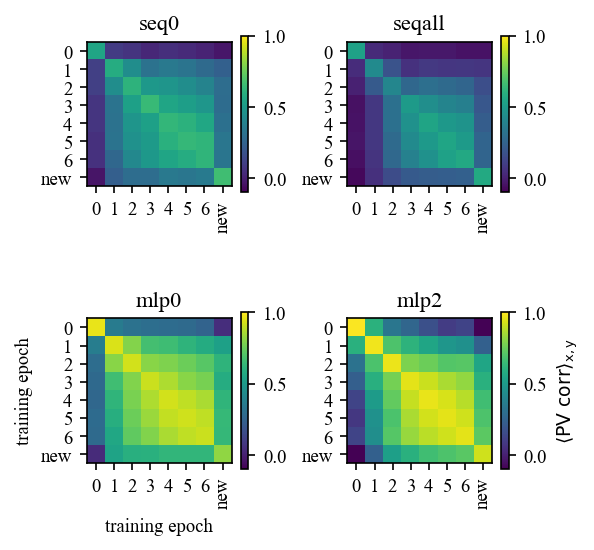

In [1079]:
fig,ax=plt.subplots(2,2,figsize=(4,4),dpi=150)
ax=ax.flatten()
i=0
for key in layernames:
    im = ax[i].imshow(np.nanmean(PV_corrs_CV[key], axis=0), label=key,vmin=-0.1,vmax=1)#,cmap='bwr',vmin=-1,vmax=1)
    ax[i].set_title(key)
    ax[i].set_yticks(np.arange(8))
    ax[i].set_yticklabels(["0","1","2","3","4","5","6","new"])
    ax[i].set_xticks(np.arange(8))
    tmp=ax[i].set_xticklabels(["0","1","2","3","4","5","6","new"])
    tmp[-1].set_rotation(90)
    cbar=plt.colorbar(im, ax=ax[i],shrink=0.7)
    i+=1
ax[2].set_ylabel('training epoch')
ax[2].set_xlabel('training epoch')
cbar.set_label(r'$\langle \mathrm{PV\ corr} \rangle_{\mathrm{x,y}}$')
fig.tight_layout()
_ensure_parent(current_fig_path/"PV_corrs_CV.svg")
fig.savefig(current_fig_path/"PV_corrs_CV.svg",dpi=300,bbox_inches='tight')
# plt.ylabel(r'$<PV corr>_{loc}$')
# plt.xlabel(r'$\Delta t (h)$')
# plt.legend(frameon=False)
# plt.gca().spines[['top','right']].set_visible(False)
# plt.title('representation drift across training epochs in different layers')
# plt.savefig(analysispath+"/PV_corrs.svg",dpi=300,bbox_inches='tight')

In [1076]:
AC_PV_corrs_CV=dict()
n_enjoys=7
for key in PFs_enjoys[0]:
    tmp=np.zeros((PV_corrs_CV[key].shape[0],n_enjoys))
    for j in range(n_enjoys):
        tmp[:,j]=np.array([ PV_corrs_CV[key][:,i,i+j] for i in range(0,n_enjoys-j)]).mean(0)
    AC_PV_corrs_CV[key]=tmp

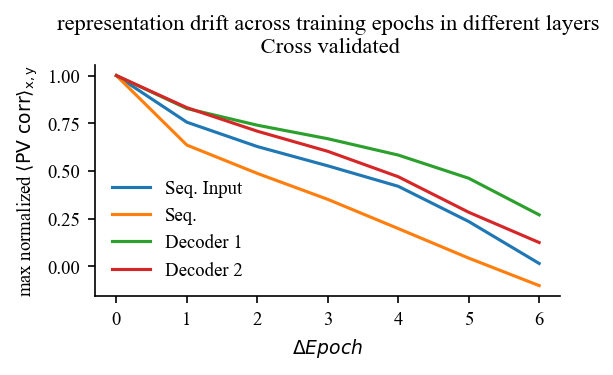

In [1078]:
plt.figure(figsize=(4,2),dpi=150)
plt.title('')
for key in layernames:
    tmp=np.nanmean(AC_PV_corrs_CV[key],axis=0)
    plt.plot(tmp/tmp[0],label=displayname_dict[key])
plt.ylabel(r'max normalized $\langle \mathrm{PV\ corr} \rangle_{\mathrm{x,y}}$')
plt.xlabel(r'$\Delta Epoch$')
plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)
plt.title('representation drift across training epochs in different layers\n Cross validated')
plt.savefig(current_fig_path/"AC_PV_corrs_CV.pdf",dpi=300,bbox_inches='tight')

#### PF corr

In [889]:
tmpPFs_enjoys.shape

(6, 361, 1136)

In [891]:
# correlation of PFs between enjoys for each layer
PF_corrs=dict()
for key in PFs_enjoys[0]:
    tmpPFs_enjoys=np.array([x[key] for x in PFs_enjoys])
    tmpPFs_enjoys=tmpPFs_enjoys.reshape(tmpPFs_enjoys.shape[0],-1,tmpPFs_enjoys.shape[-1])
    PF_corrs[key]=np.array([pd.DataFrame(tmpPFs_enjoys[:,:,i].T).corr() for i in range(tmpPFs_enjoys.shape[-1])])

In [ ]:
PF

In [893]:
PF_corrs['mlp2'].shape

(128, 8, 8)

In [908]:
np.linalg.svd(PF_corrs[key][i][:7,:7])[1]

array([4.01675824, 1.08058601, 0.95897417, 0.4035312 , 0.29909742,
       0.15069014, 0.09036282])

In [912]:
i,key

(15, 'mlp2')

In [913]:
svs_dict=dict()
for key in layernames:
    svs_dict[key]=np.array([np.linalg.svd(PF_corrs[key][i][:7,:7],compute_uv=False)[1] for i in range(PF_corrs[key].shape[0])])
    

LinAlgError: SVD did not converge

In [ ]:
# plt hist step fill
plt.figure(figsize=(4,2),dpi=150)
plt.hist()

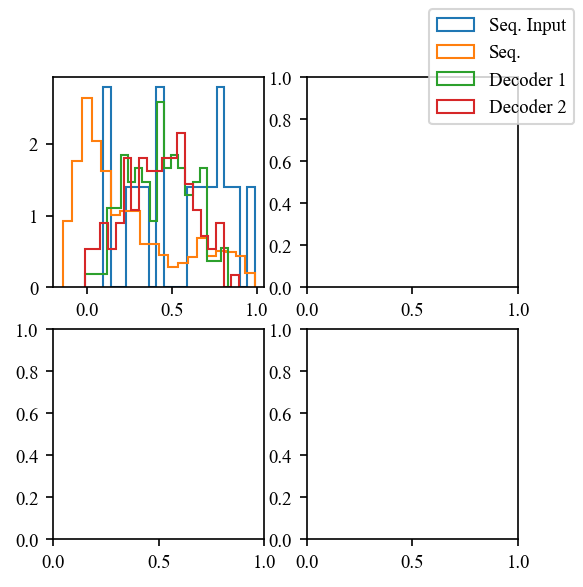

In [902]:
fig,ax=plt.subplots(2,2,figsize=(4,4),dpi=150)
for key in layernames:
    ax[0,0].hist(PF_corrs[key][:,-1,-2],label=displayname_dict[key],density=True,histtype='step',bins=20)
fig.legend()

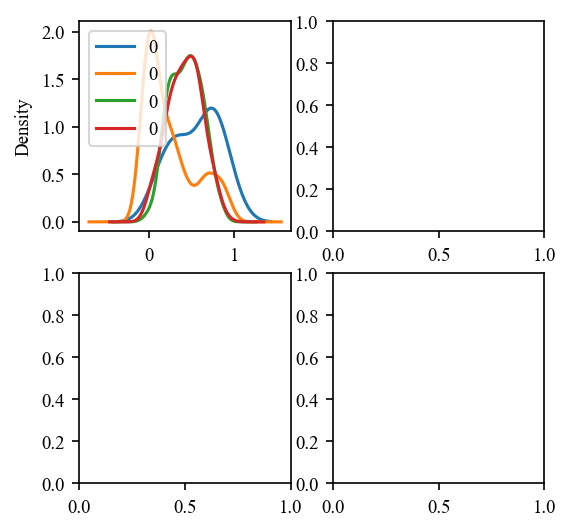

In [898]:
fig,ax=plt.subplots(2,2,figsize=(4,4),dpi=150)
for key in layernames:
    pd.DataFrame(PF_corrs[key][:,-1,-2]).plot.density(label=displayname_dict[key],ax=ax[0,0])

In [ ]:
path_obj=pathlib.Path(analysispath)
figure_path=pathlib.Path('/home/xiaoxiong/Neuripsfigs/')
figure_path.mkdir(exist_ok=True)
path_obj.relative_to('/home/xiaoxiong/try0120/train_dir/')
current_fig_path=figure_path/path_obj.relative_to('/home/xiaoxiong/try0120/train_dir/')
_ensure_parent(current_fig_path/"PV_corrs.svg")

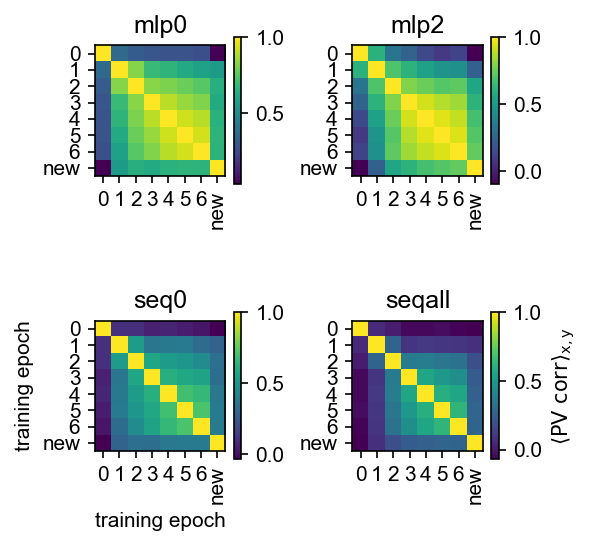

In [ ]:
fig,ax=plt.subplots(2,2,figsize=(4,4),dpi=150)
ax=ax.flatten()
i=0
for key in PV_corrs:
    im = ax[i].imshow(np.nanmean(PV_corrs[key], axis=0), label=key)
    ax[i].set_title(key)
    ax[i].set_yticks(np.arange(8))
    ax[i].set_yticklabels(["0","1","2","3","4","5","6","new"])
    ax[i].set_xticks(np.arange(8))
    tmp=ax[i].set_xticklabels(["0","1","2","3","4","5","6","new"])
    tmp[-1].set_rotation(90)
    cbar=plt.colorbar(im, ax=ax[i],shrink=0.7)
    i+=1
ax[2].set_ylabel('training epoch')
ax[2].set_xlabel('training epoch')
cbar.set_label(r'$\langle \mathrm{PV\ corr} \rangle_{\mathrm{x,y}}$')
fig.tight_layout()
_ensure_parent(current_fig_path/"PV_corrs.svg")
fig.savefig(current_fig_path/"PV_corrs.svg",dpi=300,bbox_inches='tight')
# plt.ylabel(r'$<PV corr>_{loc}$')
# plt.xlabel(r'$\Delta t (h)$')
# plt.legend(frameon=False)
# plt.gca().spines[['top','right']].set_visible(False)
# plt.title('representation drift across training epochs in different layers')
# plt.savefig(analysispath+"/PV_corrs.svg",dpi=300,bbox_inches='tight')

#### kernel

In [71]:
import numpy as np

def compute_correlation_kernel(X, max_dx=5, max_dy=5, demean=True):
    """
    Computes a spatial correlation kernel from a 3D array X (H, W, F).
    
    Parameters:
        X: ndarray of shape (H, W, F)
        max_dx, max_dy: maximum spatial shifts in x and y
        demean: if True, subtract mean and normalize variance (z-score)
        
    Returns:
        kernel: 2D array of shape (2*max_dx+1, 2*max_dy+1) containing average correlation.
    """
    H, W, F = X.shape
    kernel = np.full((2 * max_dx + 1, 2 * max_dy + 1), np.nan)

    if demean:
        X = (X - X.mean(axis=2, keepdims=True)) / (X.std(axis=2, keepdims=True) + 1e-8)
    
    for dx in range(-max_dx, max_dx + 1):
        for dy in range(-max_dy, max_dy + 1):
            x1s, x1e = max(0, -dx), min(H, H - dx)
            y1s, y1e = max(0, -dy), min(W, W - dy)

            A = X[x1s:x1e, y1s:y1e]
            B = X[x1s + dx:x1e + dx, y1s + dy:y1e + dy]

            if demean:
                # z-scored → Pearson correlation is just dot product
                corr = np.sum(A * B, axis=-1) / F
            else:
                # use cosine similarity: (A·B) / (||A|| * ||B||)
                A_norm = np.linalg.norm(A, axis=-1)
                B_norm = np.linalg.norm(B, axis=-1)
                dot = np.sum(A * B, axis=-1)
                corr = dot / (A_norm * B_norm + 1e-8)

            kernel[dx + max_dx, dy + max_dy] = np.nanmean(corr)

    return kernel


In [73]:
xygrain=19

In [74]:
Spatial_kernel=dict()
for key in PFs_enjoys[0]:
    tmpPFs_enjoys=np.array([x[key] for x in PFs_enjoys])
    # tmpPFs_enjoys=tmpPFs_enjoys.reshape(tmpPFs_enjoys.shape[0],-1,tmpPFs_enjoys.shape[-1])
    tmp_kernels=np.zeros((8,2*xygrain-1,2*xygrain-1))
    for epoch in range(8):
        tmp=tmpPFs_enjoys[epoch,:,:,:]

        tmp_kernels[epoch,:,:]=compute_correlation_kernel(tmp, max_dx=xygrain-1, max_dy=xygrain-1)
    Spatial_kernel[key]=tmp_kernels
    #     for i in range(xygrain):
    #         for j in range(xygrain):
    #             tmp_kernels[epoch,i,j]=np.array([pd.DataFrame(tmp[i,j]).corr()

    # np.array([pd.DataFrame(tmpPFs_enjoys[:,i,:].T).corr() for i in range(tmpPFs_enjoys.shape[1])])

/tmp/ipykernel_6032/1861193432.py:39: RuntimeWarning: Mean of empty slice
  kernel[dx + max_dx, dy + max_dy] = np.nanmean(corr)


In [75]:
mpl.rcParams['pdf.fonttype'] = 42

/tmp/ipykernel_6032/3955090053.py:64: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 0.96, 1],pad=0.01)


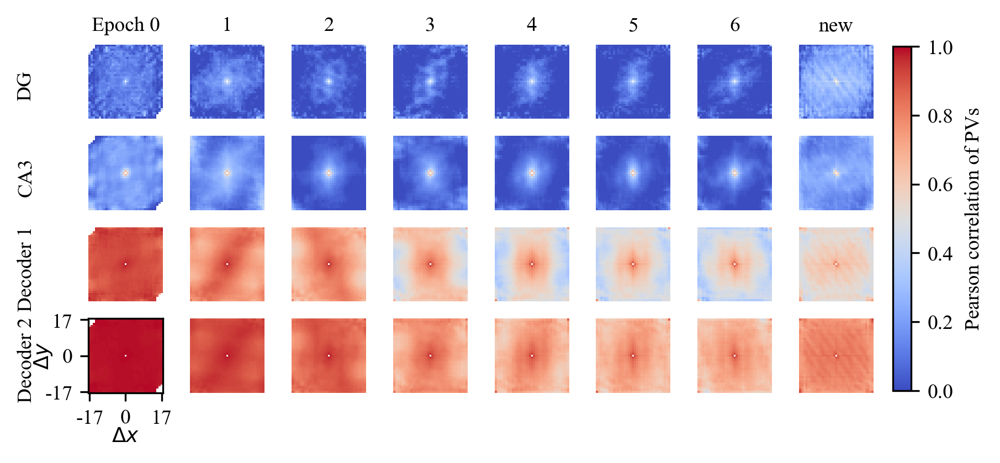

In [78]:
import numpy as np
import matplotlib.pyplot as plt

layer_names = list(Spatial_kernel.keys())
n_layers = len(layer_names)
n_epochs = 8

# Create the grid of axes
fig, ax = plt.subplots(n_layers, n_epochs,
                       figsize=(5.5, n_layers * 0.65),
                       dpi=300,
                       constrained_layout=False)

# Loop through layers (rows) and epochs (cols)
for i, key in enumerate(layernames):
    for j in range(n_epochs):
        tmp = Spatial_kernel[key][j].copy()
        tmp[xygrain-1, xygrain-1] = np.nan
        im = ax[i, j].imshow(
            tmp[1:-1, 1:-1],
            origin='lower',
            vmin=0, vmax=1,
            cmap='coolwarm'
        )
        ax[i, j].set_axis_off()
    ax[i,0].text(-30,15,displayname_dict[key],rotation=90,va='center',ha='center',fontsize=9)
    # # Left‐side row label
    # ax[i, 0].set_axis_on()
    # ax[i, 0].set_ylabel(key, rotation=0, labelpad=40, va='center')

# Bottom‐left only: set tick‐labels and axis on
ax[-1, 0].set_axis_on()
ticks = np.arange(0, xygrain*2-3, xygrain-2)
labels = ticks - xygrain + 2
ax[-1, 0].set_xticks(ticks)
ax[-1, 0].set_xticklabels(labels)
ax[-1, 0].set_yticks(ticks)
ax[-1, 0].set_yticklabels(labels)
ax[-1, 0].set_xlabel(r'$\Delta x$',labelpad=0)
ax[-1, 0].set_ylabel(r'$\Delta y$',labelpad=-4)

# Column titles
for j in range(n_epochs):
    # title = f"Epoch {j}" if j < n_epochs-1 else "Epoch new"
    title = j
    ax[0, j].set_title(title, pad=6, fontsize=9)
ax[0,0].set_title('Epoch 0', pad=6, fontsize=9)
ax[0,-1].set_title('new', pad=6, fontsize=9)

# Add a single horizontal colorbar below all subplots
# Use the last image handle 'im' for the color mapping
cax=fig.add_axes([0.97, 0.13, 0.02, 0.80])  # [left, bottom, width, height]
cbar = fig.colorbar(
    im,
    cax=cax,
    ax=ax,
    orientation='vertical',
    fraction=0.05,  # width of colorbar as fraction of total width
    pad=0.08        # space between subplots and colorbar
)
cbar.set_label('Pearson correlation of PVs', labelpad=5)

# Adjust layout so labels/colorbar aren't clipped
fig.tight_layout(rect=[0, 0, 0.96, 1],pad=0.01)
# fig.tight_layout(pad=0.2)
# Save
fig.savefig(current_fig_path/"correlation_kernel.pdf",
            dpi=300,
            bbox_inches='tight')


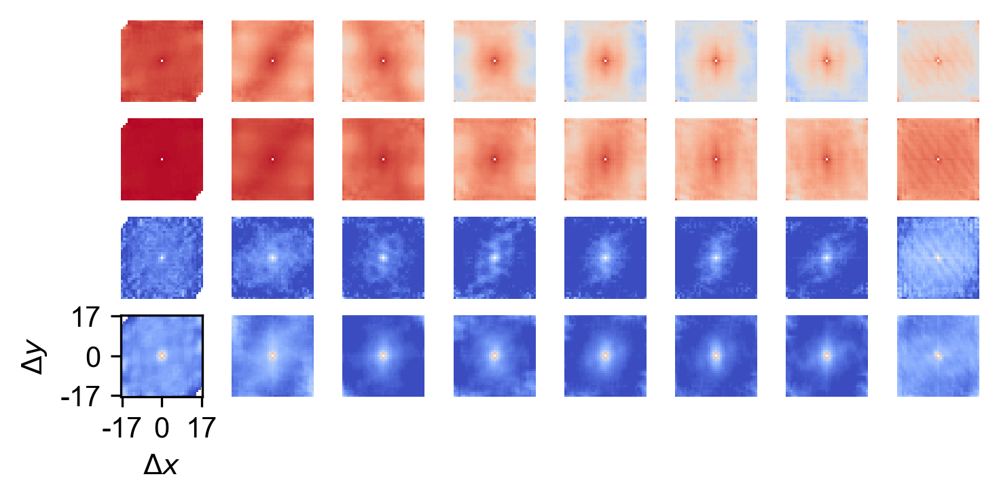

In [755]:
len_keys = len(Spatial_kernel.keys())
fig,ax=plt.subplots(len_keys,8,figsize=(5.5,len_keys*0.6),dpi=300)
i=0
for key in Spatial_kernel:
    for j in range(8):
        tmp=Spatial_kernel[key][j].copy()
        tmp[xygrain-1,xygrain-1]=np.nan
        im=ax[i,j].imshow(tmp[1:-1,1:-1],origin='lower',vmin=0,vmax=1,cmap='coolwarm')
        ax[i,j].set_axis_off()

        # ax[i,j].set_title(f"{key} epoch {j if j < 7 else 'new'}")
        # tmpcbar=plt.colorbar(im, ax=ax[i,j],shrink=0.8)
        # if i==2 and j==7:
        #     tmpcbar.set_label('Pearson correlation of PVs')
    i+=1
ax[-1,0].set_axis_on()

ax[-1,0].set_xticks(np.arange(0,xygrain*2-3,xygrain-2))
ax[-1,0].set_xticklabels(np.arange(0,xygrain*2-3,xygrain-2)-xygrain+2)
ax[-1,0].set_yticks(np.arange(0,xygrain*2-3,xygrain-2))
ax[-1,0].set_yticklabels(np.arange(0,xygrain*2-3,xygrain-2)-xygrain+2)
ax[-1,0].set_xlabel(r'$\Delta x$')
ax[-1,0].set_ylabel(r'$\Delta y$')
# fig.tight_layout()
fig.savefig(current_fig_path/"correlation_kernel.svg",dpi=300,bbox_inches='tight')

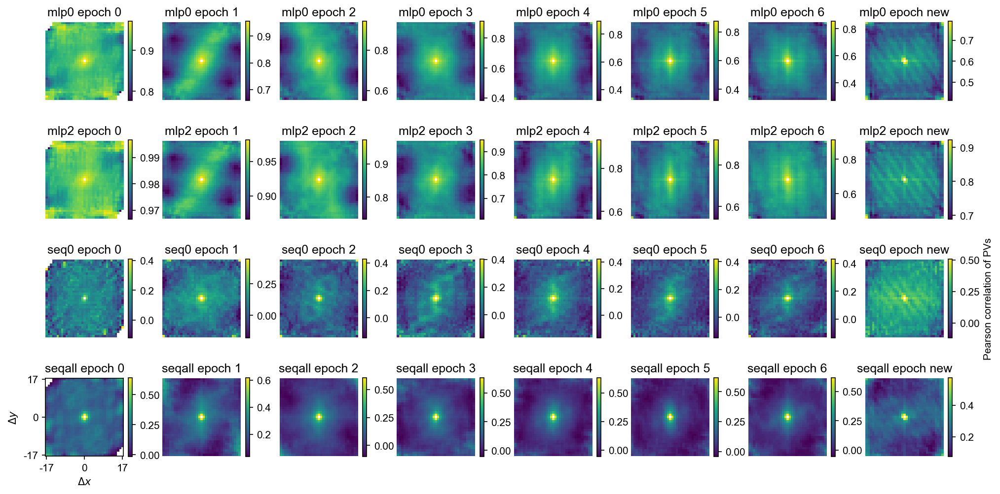

In [715]:
len_keys = len(Spatial_kernel.keys())
fig,ax=plt.subplots(len_keys,8,figsize=(8*2,len_keys*2),dpi=150)
i=0
for key in Spatial_kernel:
    for j in range(8):
        tmp=Spatial_kernel[key][j].copy()
        tmp[xygrain-1,xygrain-1]=np.nan
        im=ax[i,j].imshow(tmp[1:-1,1:-1],origin='lower')#,vmin=-1,vmax=1,cmap='coolwarm')
        ax[i,j].set_axis_off()

        ax[i,j].set_title(f"{key} epoch {j if j < 7 else 'new'}")
        tmpcbar=plt.colorbar(im, ax=ax[i,j],shrink=0.8)
        if i==2 and j==7:
            tmpcbar.set_label('Pearson correlation of PVs')
    i+=1
ax[-1,0].set_axis_on()

ax[-1,0].set_xticks(np.arange(0,xygrain*2-3,xygrain-2))
ax[-1,0].set_xticklabels(np.arange(0,xygrain*2-3,xygrain-2)-xygrain+2)
ax[-1,0].set_yticks(np.arange(0,xygrain*2-3,xygrain-2))
ax[-1,0].set_yticklabels(np.arange(0,xygrain*2-3,xygrain-2)-xygrain+2)
ax[-1,0].set_xlabel(r'$\Delta x$')
ax[-1,0].set_ylabel(r'$\Delta y$')
fig.savefig(current_fig_path/"correlation_kernel.svg",dpi=300,bbox_inches='tight')

In [ ]:
AC_Spatial_kernels=dict()
n_enjoys=8
for key in Spatial_kernel:
    tmp=np.zeros((n_enjoys,xygrain-1))
    for j in range(n_enjoys):
        tmp[:,j]=np.array([ PV_corrs[key][:,i,i+j] for i in range(0,n_enjoys-j)]).mean(0)
    AC_PV_corrs[key]=tmp

In [590]:

def compute_distance_kernel(X, max_dx=5, max_dy=5):
    """
    Computes a spatial kernel of average Euclidean distances between feature vectors at spatial offsets.

    Parameters:
        X: ndarray of shape (H, W, F)
        max_dx, max_dy: maximum spatial shifts in x and y

    Returns:
        kernel: 2D array of shape (2*max_dx+1, 2*max_dy+1) with average Euclidean distances.
    """
    H, W, F = X.shape
    kernel = np.full((2 * max_dx + 1, 2 * max_dy + 1), np.nan)

    for dx in range(-max_dx, max_dx + 1):
        for dy in range(-max_dy, max_dy + 1):
            x1s, x1e = max(0, -dx), min(H, H - dx)
            y1s, y1e = max(0, -dy), min(W, W - dy)

            A = X[x1s:x1e, y1s:y1e]  # shape (h, w, F)
            B = X[x1s + dx:x1e + dx, y1s + dy:y1e + dy]

            diff = A - B
            dist = np.linalg.norm(diff, axis=-1)  # shape (h, w)

            kernel[dx + max_dx, dy + max_dy] = np.nanmean(dist)

    return kernel


In [716]:
Spatial_kernel_dist=dict()
for key in PFs_enjoys[0]:
    tmpPFs_enjoys=np.array([x[key] for x in PFs_enjoys])
    # tmpPFs_enjoys=tmpPFs_enjoys.reshape(tmpPFs_enjoys.shape[0],-1,tmpPFs_enjoys.shape[-1])
    tmp_kernels=np.zeros((8,2*xygrain-1,2*xygrain-1))
    for epoch in range(8):
        tmp=tmpPFs_enjoys[epoch,:,:,:]

        tmp_kernels[epoch,:,:]=compute_distance_kernel(tmp, max_dx=xygrain-1, max_dy=xygrain-1)
    Spatial_kernel_dist[key]=tmp_kernels
    #     for i in range(xygrain):
    #         for j in range(xygrain):
    #             tmp_kernels[epoch,i,j]=np.array([pd.DataFrame(tmp[i,j]).corr()

    # np.array([pd.DataFrame(tmpPFs_enjoys[:,i,:].T).corr() for i in range(tmpPFs_enjoys.shape[1])])

/tmp/ipykernel_1267942/3379685106.py:26: RuntimeWarning: Mean of empty slice
  kernel[dx + max_dx, dy + max_dy] = np.nanmean(dist)


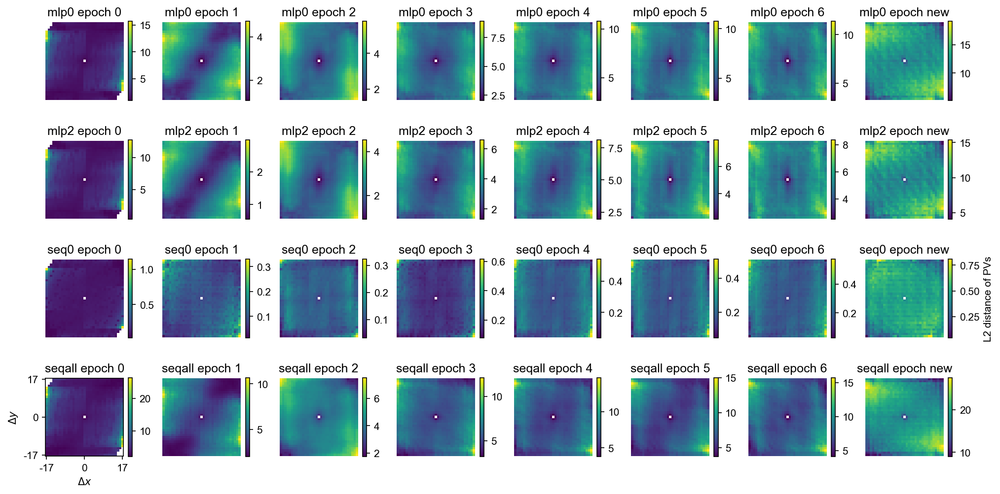

In [717]:
len_keys = len(Spatial_kernel_dist.keys())
fig,ax=plt.subplots(len_keys,8,figsize=(8*2,len_keys*2),dpi=150)
i=0
for key in Spatial_kernel_dist:
    for j in range(8):
        tmp=Spatial_kernel_dist[key][j].copy()
        tmp[xygrain-1,xygrain-1]=np.nan
        im=ax[i,j].imshow(tmp[1:-1,1:-1],origin='lower')#,vmin=-1,vmax=1,cmap='coolwarm')
        ax[i,j].set_axis_off()
        
        ax[i,j].set_title(f"{key} epoch {j if j < 7 else 'new'}")
        tmpcbar=plt.colorbar(im, ax=ax[i,j],shrink=0.8)
        if i==2 and j==7:
            tmpcbar.set_label('L2 distance of PVs')
    i+=1


ax[-1,0].set_axis_on()

ax[-1,0].set_xticks(np.arange(0,xygrain*2-3,xygrain-2))
ax[-1,0].set_xticklabels(np.arange(0,xygrain*2-3,xygrain-2)-xygrain+2)
ax[-1,0].set_yticks(np.arange(0,xygrain*2-3,xygrain-2))
ax[-1,0].set_yticklabels(np.arange(0,xygrain*2-3,xygrain-2)-xygrain+2)
ax[-1,0].set_xlabel(r'$\Delta x$')
ax[-1,0].set_ylabel(r'$\Delta y$')
fig.savefig(current_fig_path/"distance_kernel.svg",dpi=300,bbox_inches='tight')

### batch many enjoys ---- generating figures

In [ ]:
path_obj=pathlib.Path(analysispath)
figure_path=pathlib.Path('/home/xiaoxiong/Neuripsfigs/')
figure_path.mkdir(exist_ok=True)
path_obj.relative_to('/home/xiaoxiong/try0120/train_dir/')
current_fig_path=figure_path/path_obj.relative_to('/home/xiaoxiong/try0120/train_dir/')
_ensure_parent(current_fig_path/"PV_corrs.svg")

/tmp/ipykernel_1267942/996931616.py:15: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_1267942/996931616.py:17: RuntimeWarning: divide by zero encountered in log
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/996931616.py:17: RuntimeWarning: invalid value encountered in multiply
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/996931616.py:17: RuntimeWarning: invalid value encountered in true_divide
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/996931616.py:95: RuntimeWarning: invalid value encountered in true_divide
  tmp=np.nansum(seq0_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
/tmp/ipykernel_1267942/996931616.py:104: RuntimeWarning: invalid value encountered in true_divide
  tmp=np.nansum(hla_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
/tmp/ipykernel_1267942/996931616.py:15: RuntimeWarning: invalid value encountered in tr

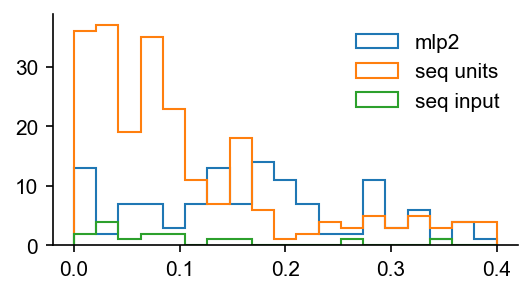

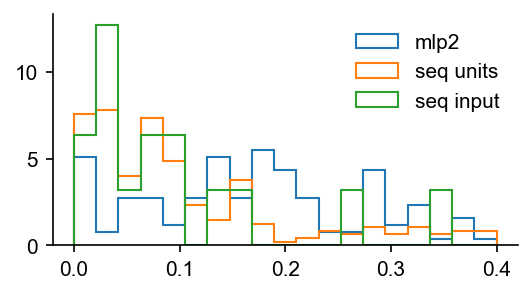

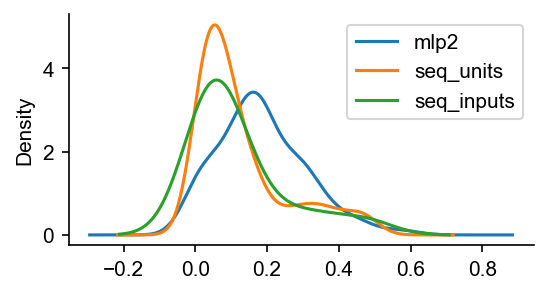

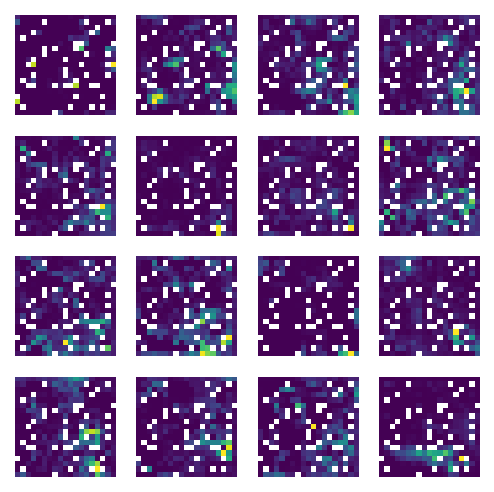

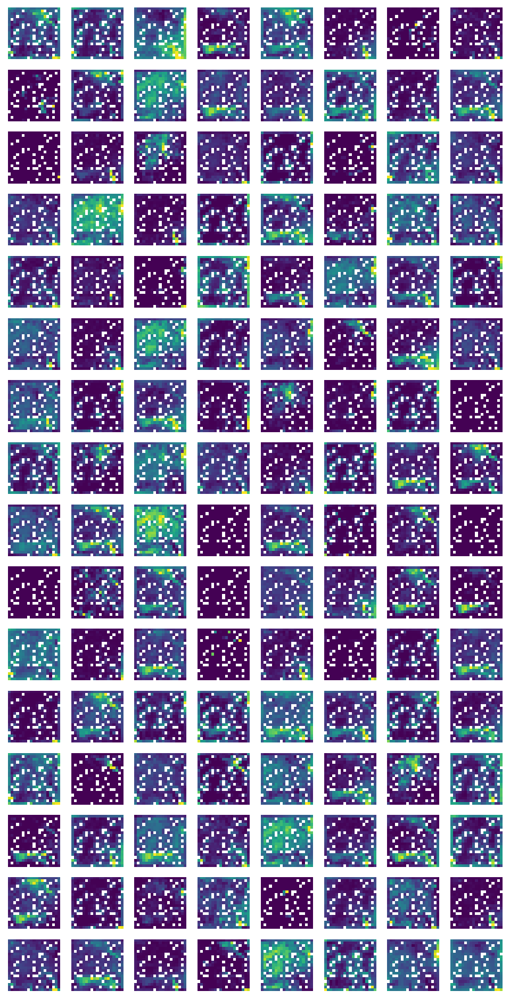

...

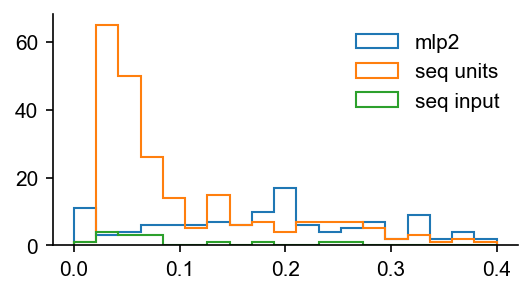

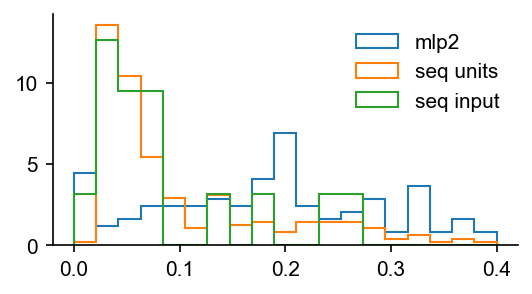

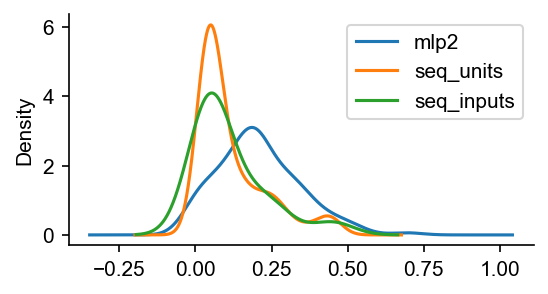

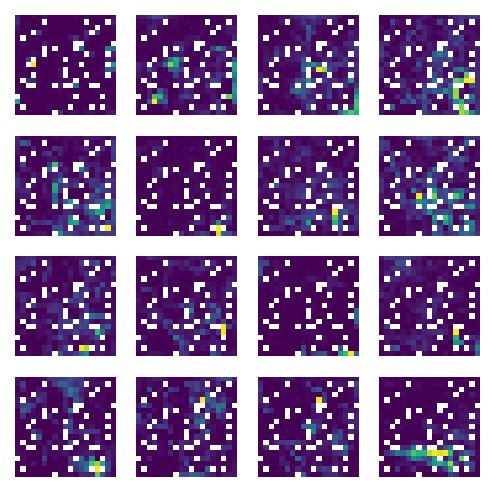

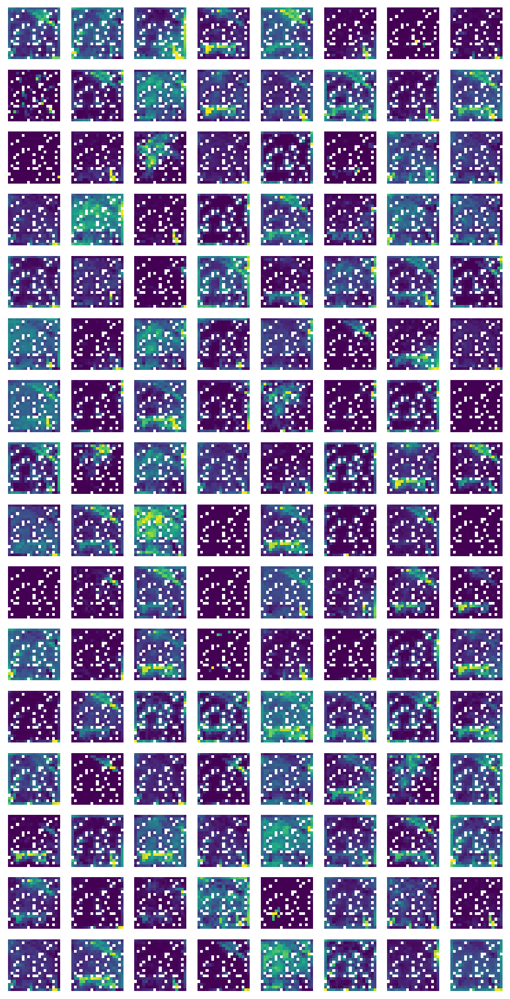

In [ ]:
%matplotlib agg
import pandas as pd, h5py, matplotlib.pyplot as plt
for analysispath in folders_containing_data:
    # rootpath="/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2"
    # analysispath=rootpath+"/telemetry"

    path_obj=pathlib.Path(analysispath)
    figure_path=pathlib.Path('/home/xiaoxiong/Neuripsfigs/')
    # figure_path.mkdir(exist_ok=True)
    current_fig_path=figure_path/path_obj.relative_to('/home/xiaoxiong/try0120/train_dir/')
    current_fig_path.mkdir(exist_ok=True)

    glob(str(analysispath+"/*.csv"))
    

    pddata = pd.read_csv(glob(str(analysispath+"/*.csv"))[0])
    with h5py.File(glob(str(analysispath+"/*.h5"))[0]) as h5:
        activations = {k: h5[k][...] for k in h5}
    pddata['rot_pi']=pddata['rot_y']*np.pi/180
    # activations['core']=torch.cat(activations['core'], dim=0).numpy() 
    def SpatialInformation(firing,occu):
        p_occu = occu/occu.flatten().sum()
        fr_x = firing/occu
        fr_mean = firing.flatten().sum()/occu[:].sum()
        out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
        return( out )
        
    ## calculate SIs
    xbound=(100,2000)
    ybound=(100,2000)
    grain = 19
    occu_xya=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),density=False)[0]

    tmp_act=activations

    grain=19
    hla_xya=np.zeros((grain,grain,12,128))
    for i in range(128):
        hla_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['decoder.mlp.2'][:,i]*(tmp_act['decoder.mlp.2'][:,i]>0),density=False)[0]
    hla_xya=hla_xya[:,:,:,:]*(hla_xya[:,:,:,:]>0)


    sids=tmp_act['core'][:,:-13:(cfg.Hippo_L+cfg.Hippo_R-1)]

    grain=19
    seq0_xya=np.zeros((grain,grain,12,16))
    for i in range(16):
        seq0_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=sids[:,i],density=False)[0]

    grain=19
    seqall_xya=np.zeros((grain,grain,12,16*15))
    for i in range(16*15):
        seqall_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['core'][:,i],density=False)[0]

    SI_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i],occu_xya) for i in range(128)])
    SI_seq0=np.array([SpatialInformation(seq0_xya[:,:,:,i],occu_xya) for i in range(16)])
    SI_seqall=np.array([SpatialInformation(seqall_xya[:,:,:,i],occu_xya) for i in range(16*15)])

    # hla_xya_po=hla_xya[:,:,:,:]*(hla_xya[:,:,:,:]>0)
    # hla_positive = hla_xya_po.reshape(-1,128).sum(0)

    # np.nonzero(hla_positive <1e-4)
    # hla_xya[:,:,:,59].sum()
    # SI_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i]*(hla_xya[:,:,:,i]>0),occu_xya) for i in range(128)])

    # plt.violinplot([SI_mlp2,SI_seqall,SI_seq0])#,side='high')
    # plt.xticks(1+np.arange(3),['mlp2','sequences','sequence input'])
    # pd.DataFrame(SI_mlp2).plot.density()
    # %matplotlib inline
    plt.figure(figsize=(4,2),dpi=150)
    plt.hist(SI_mlp2,np.linspace(0,0.4,20),histtype='step',label='mlp2')
    plt.hist(SI_seqall,np.linspace(0,0.4,20),histtype='step',label='seq units')
    plt.hist(SI_seq0,np.linspace(0,0.4,20),histtype='step',label='seq input')
    plt.legend(frameon=False)
    plt.gca().spines[['top','right']].set_visible(False)
    plt.savefig(current_fig_path/"histogram.svg",dpi=300)


    plt.figure(figsize=(4,2),dpi=150)
    plt.hist(SI_mlp2,np.linspace(0,0.4,20),histtype='step',label='mlp2',density=True)

    plt.hist(SI_seqall,np.linspace(0,0.4,20),histtype='step',label='seq units',density=True)


    plt.hist(SI_seq0,np.linspace(0,0.4,20),histtype='step',label='seq input',density=True)

    plt.legend(frameon=False)
    plt.gca().spines[['top','right']].set_visible(False)
    plt.savefig(current_fig_path/"histogram_density.svg",dpi=300)

    fig,ax=plt.subplots(1,1,figsize=(4,2),dpi=150)
    # SIs=pd.DataFrame({
    #     "mlp2":SI_mlp2,
    #     "sequence_units":SI_seqall,
    #     "seq_input":SI_seq0
    # })
    # SIs.plot.density(ax=ax)
    pd.DataFrame({"mlp2":SI_mlp2}).plot.density(ax=ax,label='mlp2')
    pd.DataFrame({"seq_units":SI_seqall}).plot.density(ax=ax,label='seq units')
    pd.DataFrame({"seq_inputs":SI_seq0}).plot.density(ax=ax,label='seq input')
    ax.spines[['top','right']].set_visible(False)
    plt.savefig(current_fig_path/"histogram_density_smooth.svg",dpi=300)


    tmp=np.nansum(seq0_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
    fig,ax = plt.subplots(4, 4, figsize=(4, 4), dpi=150)
    ax = ax.flatten()
    for i in range(16):#np.nonzero(SI_mlp2>0.2)[0]:
        # ax[i].set_title(f"sequence{i}")
        ax[i].imshow(tmp[:,:,i].T,extent=[100,2000,100,2000],origin='lower',cmap='viridis')
        ax[i].set_axis_off()
    fig.savefig(current_fig_path/"sequence_input.svg",dpi=300)

    tmp=np.nansum(hla_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
    fig,ax = plt.subplots(16, 8, figsize=(8, 16), dpi=150)
    ax = ax.flatten()
    for i in range(128):#np.nonzero(SI_mlp2>0.2)[0]:
        # ax[i].set_title(f"mlp2, unit {i}")
        ax[i].imshow(tmp[:,:,i].T,extent=[100,2000,100,2000],origin='lower',cmap='viridis')
        ax[i].set_axis_off()
        # ax[i].  a colorbar()
    fig.savefig(current_fig_path/"mlp2.svg",dpi=300)

In [636]:
PFs_enjoys[-2].keys()

dict_keys(['mlp0', 'mlp2', 'seq0', 'seqall'])

In [634]:
PFs_enjoys[-2]['mlp2'].shape

(19, 19, 128)

### MLP place field

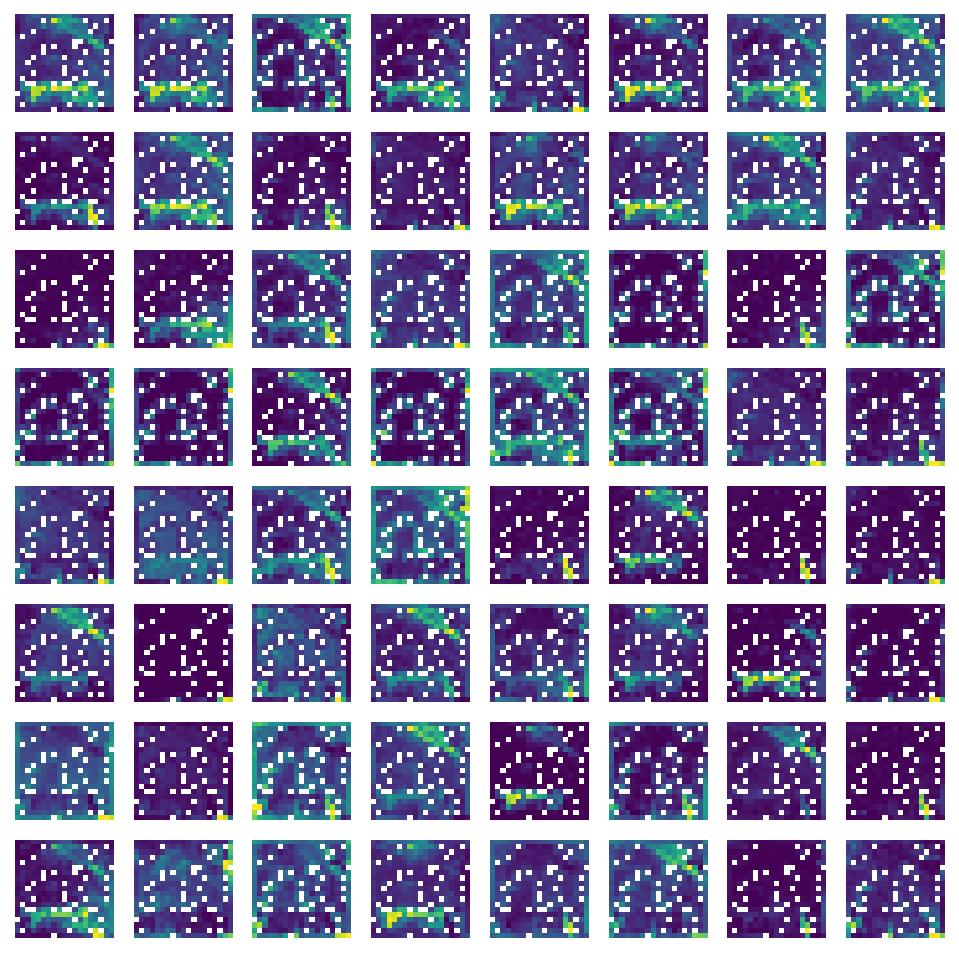

In [860]:
idxs_sorted=SI_enjoys[-2]['mlp2'].argsort()[::-1]
idxs=np.nonzero(SI_enjoys[-2]['mlp2']>0.4)[0]
idxs.size
# tmp=np.nansum(hla_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
fig,ax = plt.subplots(8, 8, figsize=(8, 8), dpi=150)
ax = ax.flatten()
idxs=np.nonzero(SI_enjoys[-2]['mlp2']>0.4)[0]
for i in range(64):
    # ax[i].set_title(f"mlp2, unit {i}")
    ax[i].imshow(PFs_enjoys[-2]['mlp2'][:,:,idxs_sorted[i]].T,extent=[100,2000,100,2000],origin='lower',cmap='viridis')
    ax[i].set_axis_off()
    # ax[i].  a colorbar()
fig.savefig(current_fig_path/"mlp2_best_64.svg",dpi=300)

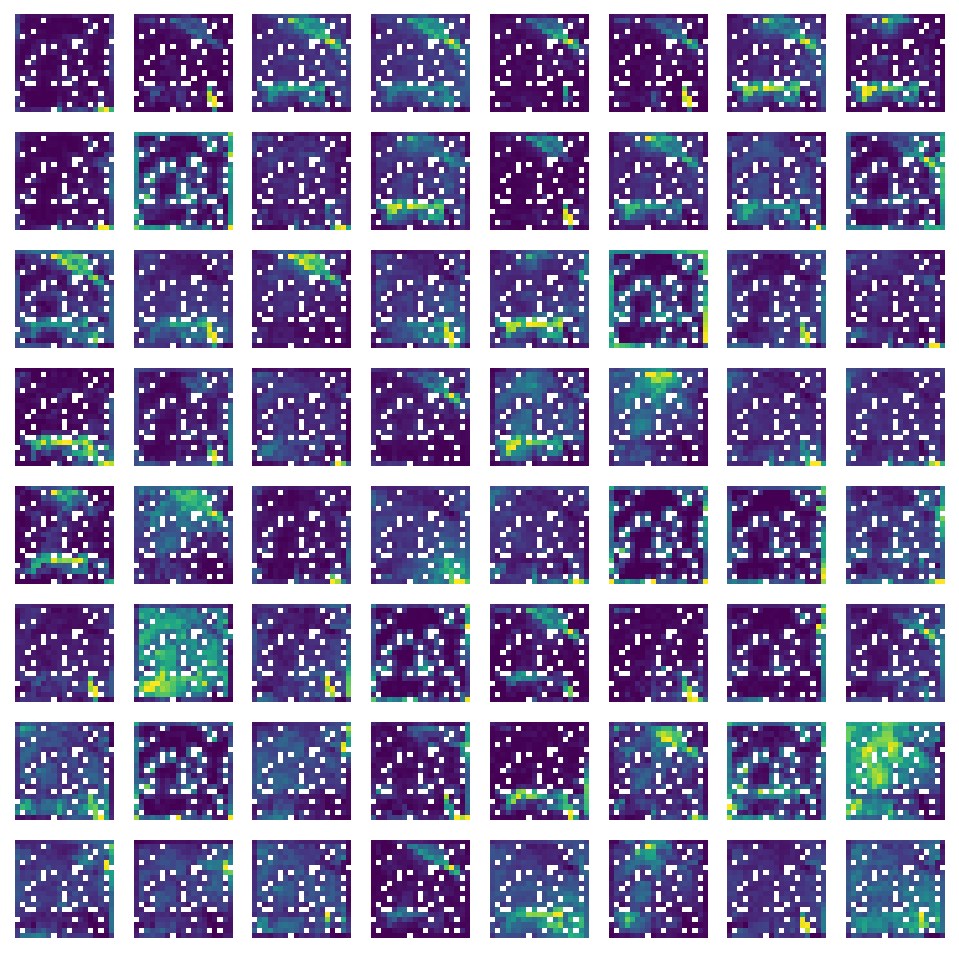

In [861]:
key='mlp0'
idxs_sorted=SI_enjoys[-2][key].argsort()[::-1]
idxs=np.nonzero(SI_enjoys[-2][key]>0.4)[0]
idxs.size
# tmp=np.nansum(hla_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
fig,ax = plt.subplots(8, 8, figsize=(8, 8), dpi=150)
ax = ax.flatten()
idxs=np.nonzero(SI_enjoys[-2][key]>0.4)[0]
for i in range(64):
    # ax[i].set_title(f"mlp2, unit {i}")
    ax[i].imshow(PFs_enjoys[-2][key][:,:,idxs_sorted[i]].T,extent=[100,2000,100,2000],origin='lower',cmap='viridis')
    ax[i].set_axis_off()
    # ax[i].  a colorbar()
fig.savefig(current_fig_path/"mlp0_best_64.svg",dpi=300)

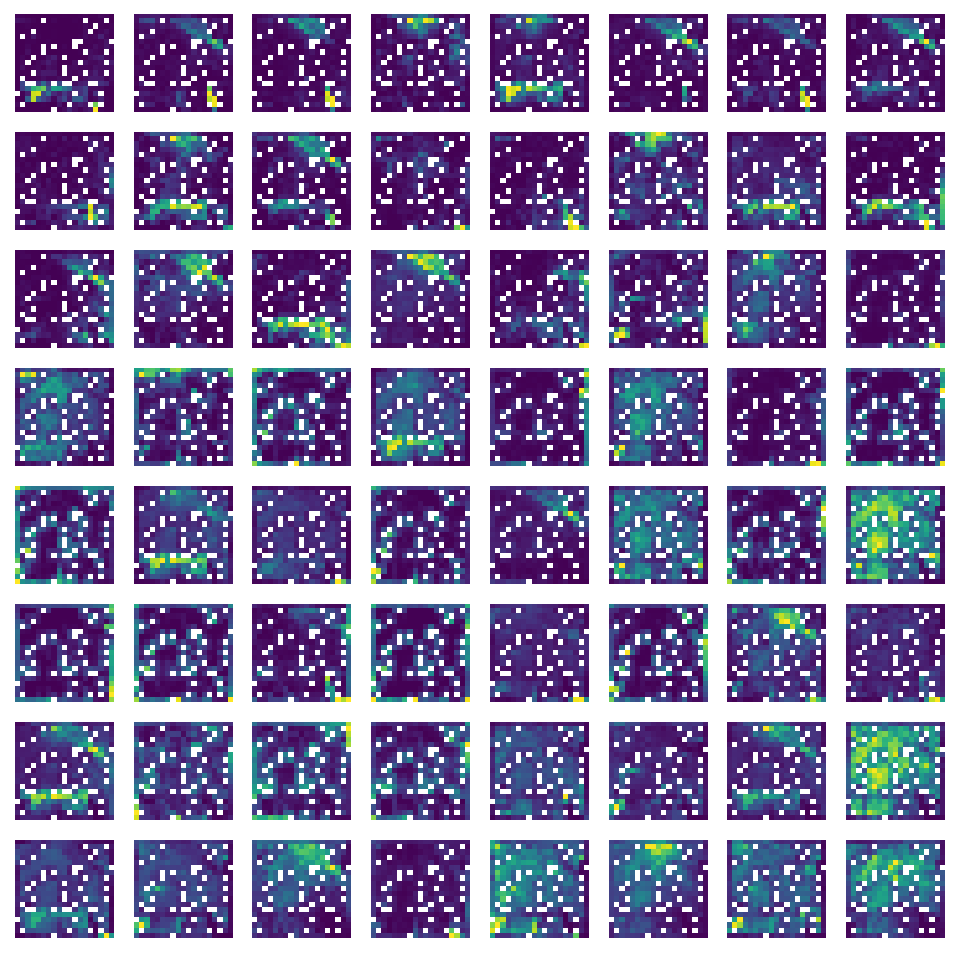

In [862]:
key='mlp0'
idxs_sorted=SI_enjoys_perspike[-2][key].argsort()[::-1]
idxs=np.nonzero(SI_enjoys_perspike[-2][key]>0.4)[0]
idxs.size
# tmp=np.nansum(hla_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
fig,ax = plt.subplots(8, 8, figsize=(8, 8), dpi=150)
ax = ax.flatten()
idxs=np.nonzero(SI_enjoys[-2][key]>0.4)[0]
for i in range(64):
    # ax[i].set_title(f"mlp2, unit {i}")
    ax[i].imshow(PFs_enjoys[-2][key][:,:,idxs_sorted[i]].T,extent=[100,2000,100,2000],origin='lower',cmap='viridis')
    ax[i].set_axis_off()
    # ax[i].  a colorbar()
fig.savefig(current_fig_path/"mlp0_best_64_perspike.svg",dpi=300)

In [863]:
idxs.size

53

In [864]:
np.random.permutation(10)

array([7, 1, 3, 8, 6, 0, 5, 2, 4, 9])

In [ ]:
tmp=idxs_sorted[np.random.permutation(50)]
idxs_rand=tmp[:16]


In [871]:
idxs_rand

array([ 33,  65, 123,  22,  32,  53,  78,  25, 108, 117,  39,  91,  95,
         9,  99, 114])

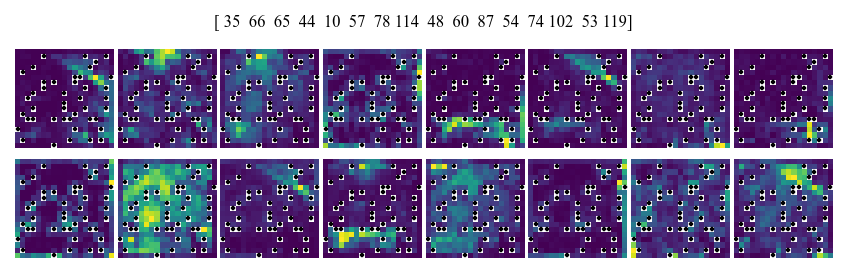

In [887]:
from tkinter import font


key='mlp0'
idxs_sorted=SI_enjoys_perspike[-2][key].argsort()[::-1]
tmp=idxs_sorted[np.random.permutation(50)]
idxs_rand=tmp[:16]

# tmp=np.nansum(hla_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
fig,ax = plt.subplots(2, 8, figsize=(5.5, 1.8), dpi=150)
ax = ax.flatten()
idxs=np.nonzero(SI_enjoys[-2][key]>0.4)[0]
for i in range(16):
    # ax[i].set_title(f"mlp2, unit {i}")
    data=PFs_enjoys[-2][key][:,:,idxs_rand[i]]
    ax[i].imshow(data.T,origin='lower',cmap='viridis')#extent=[100,2000,100,2000],
    for x in range(19):
        for y in range(19):
            if np.isnan(data[x,y]):
                ax[i].scatter(x,y+0.1,marker='P',color='k',s=4,lw=0.2)#'X',ha='center',va='center',color='k')
    ax[i].set_axis_off()
    # ax[i].  a colorbar()
fig.suptitle(idxs_rand,fontsize=8)
fig.tight_layout(pad=0.2)
fig.savefig(current_fig_path/"mlp0_best_64_perspike_rand_16.pdf",dpi=300)

In [883]:
SI_enjoys_perspike[-2][key][72]

nan

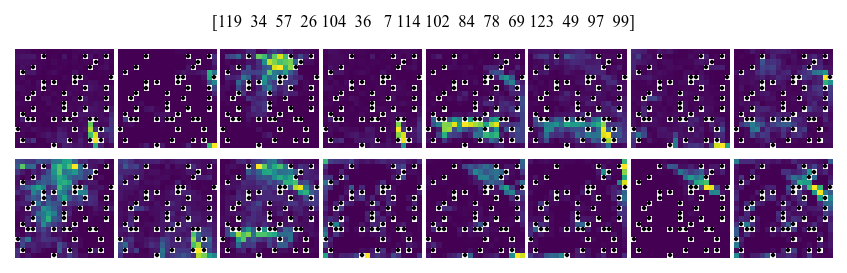

In [888]:



key='mlp2'
tmp=SI_enjoys_perspike[-2][key]
tmp[np.isnan(tmp)]=0
idxs_sorted=tmp.argsort()[::-1]
tmp=idxs_sorted[np.random.permutation(40)]
idxs_rand=tmp[:16]

# tmp=np.nansum(hla_xya,-2)/np.nansum(occu_xya[:,:,:,None],-2)
fig,ax = plt.subplots(2, 8, figsize=(5.5, 1.8), dpi=150)
ax = ax.flatten()
for i in range(16):
    # ax[i].set_title(f"mlp2, unit {i}")
    data=PFs_enjoys[-2][key][:,:,idxs_rand[i]]
    ax[i].imshow(data.T,origin='lower',cmap='viridis')#extent=[100,2000,100,2000],
    for x in range(19):
        for y in range(19):
            if np.isnan(data[x,y]):
                ax[i].scatter(x,y+0.1,marker='P',color='k',s=4,lw=0.2)#'X',ha='center',va='center',color='k')
    ax[i].set_axis_off()
    # ax[i].  a colorbar()
fig.suptitle(idxs_rand,fontsize=8)
fig.tight_layout(pad=0.2)
fig.savefig(current_fig_path/f"{key}_best_64_perspike_rand_16.pdf",dpi=300)

## Resume same location

### run multiple enjoys

In [ ]:
from glob import glob

In [560]:
!pwd

/home/xiaoxiong/try0120


In [ ]:
pth_paths=glob('/home/xiaoxiong/try0120/train_dir/ResumeLoc3*/checkpoint_p0/milestones/*.pth')
# get the filename of the latest checkpoint


['/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/checkpoint_000018964_111869952.pth',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/checkpoint_000023246_138178560.pth',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/checkpoint_000014962_87724032.pth',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/checkpoint_000022230_131936256.pth',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/checkpoint_000011838_68751360.pth

In [563]:
root = pathlib.Path("/home/xiaoxiong/try0120/train_dir"
            "/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2"
            "/checkpoint_p0")

# all *.pth files under checkpoints_p0/milestones/
ckpt_files = list((root / "milestones").glob("*.pth"))

In [564]:
pth_paths = sorted((root / "milestones").glob("*.pth"))

# convert to the wanted relative strings: "milestones/xxx.pth"
pth_list = [f"milestones/{p.name}" for p in pth_paths]

In [565]:
pth_list

['milestones/checkpoint_000003314_19476480.pth',
 'milestones/checkpoint_000006746_38572032.pth',
 'milestones/checkpoint_000009540_54853632.pth',
 'milestones/checkpoint_000011838_68751360.pth',
 'milestones/checkpoint_000013486_78655488.pth',
 'milestones/checkpoint_000014962_87724032.pth',
 'milestones/checkpoint_000016432_96755712.pth',
 'milestones/checkpoint_000017766_104509440.pth',
 'milestones/checkpoint_000018964_111869952.pth',
 'milestones/checkpoint_000020086_118763520.pth',
 'milestones/checkpoint_000021164_125386752.pth',
 'milestones/checkpoint_000022230_131936256.pth',
 'milestones/checkpoint_000023246_138178560.pth']

In [791]:
import sys

# from sample_factory.enjoy import enjoy
from sf_examples.dmlab.cumstom_enjoy import enjoy
from sf_examples.dmlab.train_hipposlam import parse_dmlab_args, register_dmlab_components

mapname="openfield_map2_fixed_loc3"
expname='ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2'

cli = [
    "--algo", "APPO",
    "--env", mapname ,         # pick any DM‑Lab level you have
    "--experiment", expname,
    "--encoder_load_path","/home/xiaoxiong/try0120/train_dir/Random3_openfield_new/checkpoint_p0/best_000025288_203030528_reward_94.185.pth",
    "--train_dir", "./train_dir", # anything writable
    "--max_num_frames", "50000",          # short rollout for the test
    "--num_envs", "8",
    "--dmlab_level_cache_path","./.dmlab_cache",
    "--load_checkpoint_kind","latest",
    "--use_jit","False",
    "--with_pos_obs","True",
    "--no_render",        # <-- skip human window; avoid X11 on servers
]

cli_dict={
 'algo': 'APPO',
 'env': mapname,
 'experiment': expname,
 'encoder_load_path': '/home/xiaoxiong/try0120/train_dir/Random3_openfield_new/checkpoint_p0/best_000025288_203030528_reward_94.185.pth',
 'train_dir': './train_dir',
 'max_num_frames': '50000',
 'num_envs': '8',
 'dmlab_level_cache_path': './.dmlab_cache',
 'load_checkpoint_kind': 'latest',
 'no_render': True,
 'use_jit': False,
 'with_pos_obs': True,
}
register_dmlab_components()
cfg = parse_dmlab_args(evaluation=True, argv=cli)

# tweak whatever you like *after* parsing
# cfg.with_pos_obs = True
cfg.cli_args=cli_dict
# status = enjoy(cfg)

[2025-05-14 18:14:17,219][1854092] Environment test already registered, overwriting...
[2025-05-14 18:14:17,220][1854092] Environment openfield_map already registered, overwriting...
[2025-05-14 18:14:17,221][1854092] Environment openfield_map2 already registered, overwriting...
[2025-05-14 18:14:17,221][1854092] Environment openfield_map2_fixed_loc3 already registered, overwriting...
[2025-05-14 18:14:17,221][1854092] Environment openfield_map2_fixed_loc2 already registered, overwriting...
[2025-05-14 18:14:17,221][1854092] Environment openfield_map2_fixed_loc1 already registered, overwriting...
[2025-05-14 18:14:17,221][1854092] Environment openfield_map_episode already registered, overwriting...
[2025-05-14 18:14:17,221][1854092] Environment openfield_map_transparent already registered, overwriting...
[2025-05-14 18:14:17,222][1854092] Environment random_maze already registered, overwriting...
[2025-05-14 18:14:17,222][1854092] Environment dmlab_benchmark already registered, overwri

In [792]:
    cfg = load_from_checkpoint(cfg)

[2025-05-14 18:14:19,502][1854092] Loading existing experiment configuration from ./train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/config.json
[2025-05-14 18:14:19,503][1854092] Overriding arg 'train_dir' with value './train_dir' passed from command line
[2025-05-14 18:14:19,503][1854092] Overriding arg 'dmlab_level_cache_path' with value './.dmlab_cache' passed from command line
[2025-05-14 18:14:19,504][1854092] Overriding arg 'use_jit' with value False passed from command line
[2025-05-14 18:14:19,504][1854092] Overriding arg 'with_pos_obs' with value True passed from command line
[2025-05-14 18:14:19,504][1854092] Adding new argument 'fps'=0 that is not in the saved config file!
[2025-05-14 18:14:19,505][1854092] Adding new argument 'eval_env_frameskip'=None that is not in the saved config file!
[2025-05-14 18:14:19,505][1854092] Adding new argument 'no_render'=True that is not in the saved config file!
[2025-05-14 1

In [794]:
    verbose = False



    eval_env_frameskip: int = cfg.env_frameskip 
    assert (
        cfg.env_frameskip % eval_env_frameskip == 0
    ), f"{cfg.env_frameskip=} must be divisible by {eval_env_frameskip=}"
    render_action_repeat: int = cfg.env_frameskip // eval_env_frameskip
    cfg.env_frameskip = cfg.eval_env_frameskip = eval_env_frameskip
    log.debug(f"Using frameskip {cfg.env_frameskip} and {render_action_repeat=} for evaluation")

    cfg.num_envs = 1

    # render_mode = "human"
    # if cfg.save_video:
    #     render_mode = "rgb_array"
    # elif cfg.no_render:
    render_mode = None

    env = make_env_func_batched(
        cfg, env_config=AttrDict(worker_index=0, vector_index=0, env_id=0), render_mode=render_mode
    )
    env_info = extract_env_info(env, cfg)

    if hasattr(env.unwrapped, "reset_on_init"):
        # reset call ruins the demo recording for VizDoom
        env.unwrapped.reset_on_init = False
    log.info(env.action_space)
    actor_critic = create_actor_critic(cfg, env.observation_space, env.action_space)


[2025-05-14 18:14:58,892][1854092] Using frameskip 8 and render_action_repeat=1 for evaluation
[2025-05-14 18:14:58,892][1854092] Using GPU 0 for DMLab rendering!
[2025-05-14 18:14:58,893][1854092] {'worker_index': 0, 'vector_index': 0, 'env_id': 0} level openfield_map2_fixed_loc3 task id 0
[2025-05-14 18:14:58,893][1854092] True
[2025-05-14 18:14:58,893][1854092] True
[2025-05-14 18:14:58,894][1854092] depth_sensor  dmlab env True
[2025-05-14 18:15:17,882][1854092] using reduced action set!
[2025-05-14 18:15:17,886][1854092] Discrete(5)
[2025-05-14 18:15:17,886][1854092] RunningMeanStd input shape: (4, 72, 96)
[2025-05-14 18:15:17,887][1854092] RunningMeanStd input shape: (1,)
[2025-05-14 18:15:17,893][1854092] True
[2025-05-14 18:15:17,894][1854092] using depth sensor True
[2025-05-14 18:15:17,895][1854092] Num input channels for depth encoder: 1
[2025-05-14 18:15:17,895][1854092] original obs space: Box(0, 255, (4, 72, 96), uint8)
[2025-05-14 18:15:17,921][1854092] Num input channel

In [809]:
    checkpoint_dict = torch.load(str(pth_name), device)
    actor_critic.load_state_dict(checkpoint_dict["model"])

<All keys matched successfully>

In [808]:
for param in actor_critic.encoder.DG_projection.parameters():
    print(param.requires_grad)

True
True


In [ ]:
actor_critic.encoder.DG_projection.linear..requires_grad

TypeError: 'method' object is not subscriptable

In [ ]:
for pth_name in ckpt_files:
    verbose = False



    eval_env_frameskip: int = cfg.env_frameskip 
    assert (
        cfg.env_frameskip % eval_env_frameskip == 0
    ), f"{cfg.env_frameskip=} must be divisible by {eval_env_frameskip=}"
    render_action_repeat: int = cfg.env_frameskip // eval_env_frameskip
    cfg.env_frameskip = cfg.eval_env_frameskip = eval_env_frameskip
    log.debug(f"Using frameskip {cfg.env_frameskip} and {render_action_repeat=} for evaluation")

    cfg.num_envs = 1

    # render_mode = "human"
    # if cfg.save_video:
    #     render_mode = "rgb_array"
    # elif cfg.no_render:
    render_mode = None

    env = make_env_func_batched(
        cfg, env_config=AttrDict(worker_index=0, vector_index=0, env_id=0), render_mode=render_mode
    )
    env_info = extract_env_info(env, cfg)

    if hasattr(env.unwrapped, "reset_on_init"):
        # reset call ruins the demo recording for VizDoom
        env.unwrapped.reset_on_init = False
    log.info(env.action_space)
    actor_critic = create_actor_critic(cfg, env.observation_space, env.action_space)
    actor_critic.eval()



    device = torch.device("cpu" if cfg.device == "cpu" else "cuda")
    actor_critic.model_to_device(device)


    #################### register hook
    layers_to_log = [
        'encoder.basic_encoder.mlp_layers.0',
        "encoder.DG_projection.linear",
        "core",
        
        "decoder.mlp.0",
        "decoder.mlp.2"
    ]          # <- example; edit to taste

    # 2B. activation buffer

    import collections
    act_buffers = collections.defaultdict(list)

    def make_hook(layer_name):
        def _hook(_m, _inp, out):
            if isinstance(out, (tuple, list)):      # RNN returns (output, h_n)
                out = out[0]
            act_buffers[layer_name].append(out.detach().cpu())
        return _hook

    # attach the hook once
    for layer_to_log in layers_to_log:
        try:
            dict(actor_critic.named_modules())[layer_to_log].register_forward_hook(make_hook(layer_to_log))
            log.info("Activation hook registered on %s", layer_to_log)
        except KeyError:
            raise RuntimeError(f"Layer '{layer_to_log}' not found in the network!")

    ####################


    policy_id = cfg.policy_index
    # log.info(policy_id)
    name_prefix = dict(latest="checkpoint", best="best")[cfg.load_checkpoint_kind]
    # log.info(Learner.checkpoint_dir(cfg, policy_id))
    # checkpoints = Learner.get_checkpoints(Learner.checkpoint_dir(cfg, policy_id), f"{name_prefix}_*")
    # checkpoint_dict = Learner.load_checkpoint(str(pth_name), device)
    checkpoint_dict = torch.load(str(pth_name), device)
    actor_critic.load_state_dict(checkpoint_dict["model"])

    episode_rewards = [deque([], maxlen=100) for _ in range(env.num_agents)]
    true_objectives = [deque([], maxlen=100) for _ in range(env.num_agents)]
    num_frames = 0

    last_render_start = time.time()

    def max_frames_reached(frames):
        return cfg.max_num_frames is not None and frames > cfg.max_num_frames

    reward_list = []

    obs, infos = env.reset()
    rnn_states = torch.zeros([env.num_agents, get_rnn_size(cfg)], dtype=torch.float32, device=device)
    episode_reward = None
    finished_episode = [False for _ in range(env.num_agents)]

    video_frames = []
    num_episodes = 0

    # saved_data=dict()
    pose_records = []

    with torch.no_grad():
        while not max_frames_reached(num_frames):
            normalized_obs = prepare_and_normalize_obs(actor_critic, obs)

            # if not cfg.no_render:
            #     visualize_policy_inputs(normalized_obs)
            policy_outputs = actor_critic(normalized_obs, rnn_states)

            # sample actions from the distribution by default
            actions = policy_outputs["actions"]

            if cfg.eval_deterministic:
                action_distribution = actor_critic.action_distribution()
                actions = argmax_actions(action_distribution)

            # actions shape should be [num_agents, num_actions] even if it's [1, 1]
            if actions.ndim == 1:
                actions = unsqueeze_tensor(actions, dim=-1)
            actions = preprocess_actions(env_info, actions)

            rnn_states = policy_outputs["new_rnn_states"]

            for _ in range(render_action_repeat):
                # last_render_start = render_frame(cfg, env, video_frames, num_episodes, last_render_start)

                obs, rew, terminated, truncated, infos = env.step(actions)
                # log.info(obs['DEBUG.POS.TRANS'])
                # save info
                frame_idx = num_frames          # or use a wall‑clock timestamp
                pos = obs['DEBUG.POS.TRANS']    # (B,3)
                rot = obs['DEBUG.POS.ROT']      # (B,3) or (B,4) depending on env

                for agent_i in range(env.num_agents):
                    pose_records.append({
                        "frame"  : frame_idx,
                        "agent"  : agent_i,
                        "x"      : float(pos[agent_i, 0]),
                        "y"      : float(pos[agent_i, 1]),
                        "z"      : float(pos[agent_i, 2]),
                        "rot_x"  : float(rot[agent_i, 0]),
                        "rot_y"  : float(rot[agent_i, 1]),
                        "rot_z"  : float(rot[agent_i, 2]),
                        # keep the whole info dict as a JSON string for convenience
                        "info"   : json.dumps(infos[agent_i], default=str),
                    })



                dones = make_dones(terminated, truncated)
                infos = [{} for _ in range(env_info.num_agents)] if infos is None else infos

                if episode_reward is None:
                    episode_reward = rew.float().clone()
                else:
                    episode_reward += rew.float()

                num_frames += 1
                if num_frames % 100 == 0:
                    log.debug(f"Num frames {num_frames}...")

                dones = dones.cpu().numpy()
                for agent_i, done_flag in enumerate(dones):
                    if done_flag:
                        finished_episode[agent_i] = True
                        rew = episode_reward[agent_i].item()
                        episode_rewards[agent_i].append(rew)

                        true_objective = rew
                        if isinstance(infos, (list, tuple)):
                            true_objective = infos[agent_i].get("true_objective", rew)
                        true_objectives[agent_i].append(true_objective)

                        if verbose:
                            log.info(
                                "Episode finished for agent %d at %d frames. Reward: %.3f, true_objective: %.3f",
                                agent_i,
                                num_frames,
                                episode_reward[agent_i],
                                true_objectives[agent_i][-1],
                            )
                        rnn_states[agent_i] = torch.zeros([get_rnn_size(cfg)], dtype=torch.float32, device=device)
                        episode_reward[agent_i] = 0

                        if cfg.use_record_episode_statistics:
                            # we want the scores from the full episode not a single agent death (due to EpisodicLifeEnv wrapper)
                            if "episode" in infos[agent_i].keys():
                                num_episodes += 1
                                reward_list.append(infos[agent_i]["episode"]["r"])
                        else:
                            num_episodes += 1
                            reward_list.append(true_objective)

                # if episode terminated synchronously for all agents, pause a bit before starting a new one
                if all(dones):
                    # render_frame(cfg, env, video_frames, num_episodes, last_render_start)
                    time.sleep(0.05)

                if all(finished_episode):
                    finished_episode = [False] * env.num_agents
                    avg_episode_rewards_str, avg_true_objective_str = "", ""
                    for agent_i in range(env.num_agents):
                        avg_rew = np.mean(episode_rewards[agent_i])
                        avg_true_obj = np.mean(true_objectives[agent_i])

                        if not np.isnan(avg_rew):
                            if avg_episode_rewards_str:
                                avg_episode_rewards_str += ", "
                            avg_episode_rewards_str += f"#{agent_i}: {avg_rew:.3f}"
                        if not np.isnan(avg_true_obj):
                            if avg_true_objective_str:
                                avg_true_objective_str += ", "
                            avg_true_objective_str += f"#{agent_i}: {avg_true_obj:.3f}"

                    log.info(
                        "Avg episode rewards: %s, true rewards: %s", avg_episode_rewards_str, avg_true_objective_str
                    )
                    log.info(
                        "Avg episode reward: %.3f, avg true_objective: %.3f",
                        np.mean([np.mean(episode_rewards[i]) for i in range(env.num_agents)]),
                        np.mean([np.mean(true_objectives[i]) for i in range(env.num_agents)]),
                    )

                # VizDoom multiplayer stuff
                # for player in [1, 2, 3, 4, 5, 6, 7, 8]:
                #     key = f'PLAYER{player}_FRAGCOUNT'
                #     if key in infos[0]:
                #         log.debug('Score for player %d: %r', player, infos[0][key])

            if num_episodes >= cfg.max_num_episodes:
                break

    env.close()

    ts        = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    telemetry = pathlib.Path(experiment_dir(cfg=cfg)) / "telemetry"
    _ensure_parent(telemetry)
    telemetry = telemetry / pth_name.name
    _ensure_parent(telemetry)
    pose_path = telemetry / f"pose_{ts}.parquet"

    csv_path = pose_path.with_suffix(".csv")
    _ensure_parent(csv_path)
    pddata=pd.DataFrame(pose_records)
    pddata.to_csv(csv_path, index=False)
    log.info("Saved %d pose rows to %s", len(pose_records), csv_path)

    # log.info("Saved %d pose rows to %s", len(pose_records), pose_path)

    # 5B.  save activations to HDF5  ----------------------------------------
    act_path = telemetry / f"activations_{ts}.h5"
    with h5py.File(act_path, "w") as h5:
        for layer, lst in act_buffers.items():
            if not lst:            # nothing recorded for that layer
                continue
            data = torch.cat(lst, dim=0).numpy()   # (frames*agents, …)
            h5.create_dataset(layer, data=data, compression="gzip")
            log.info("Saved %-20s  shape=%r", layer, data.shape)
    

    break

blabla

In [ ]:
from glob import glob
pth_paths=glob('/home/xiaoxiong/try0120/train_dir/ResumeLoc3*/checkpoint_p0/milestones/*.pth')
# get the filename of the latest checkpoint


root = pathlib.Path("/home/xiaoxiong/try0120/train_dir"
            "/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2"
            "/checkpoint_p0")

# all *.pth files under checkpoints_p0/milestones/
ckpt_files = list((root / "milestones").glob("*.pth"))
pth_paths = sorted((root / "milestones").glob("*.pth"))

# convert to the wanted relative strings: "milestones/xxx.pth"
pth_list = [f"milestones/{p.name}" for p in pth_paths]


# from sample_factory.enjoy import enjoy
from sf_examples.dmlab.cumstom_enjoy import enjoy
from sf_examples.dmlab.train_hipposlam import parse_dmlab_args, register_dmlab_components

mapname="openfield_map2_fixed_loc3"
expname='ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2'

cli = [
    "--algo", "APPO",
    "--env", mapname ,         # pick any DM‑Lab level you have
    "--experiment", expname,
    "--encoder_load_path","/home/xiaoxiong/try0120/train_dir/Random3_openfield_new/checkpoint_p0/best_000025288_203030528_reward_94.185.pth",
    "--train_dir", "./train_dir", # anything writable
    "--max_num_frames", "50000",          # short rollout for the test
    "--num_envs", "8",
    "--dmlab_level_cache_path","./.dmlab_cache",
    "--load_checkpoint_kind","latest",
    "--use_jit","False",
    "--with_pos_obs","True",
    "--no_render",        # <-- skip human window; avoid X11 on servers
]

cli_dict={
 'algo': 'APPO',
 'env': mapname,
 'experiment': expname,
 'encoder_load_path': '/home/xiaoxiong/try0120/train_dir/Random3_openfield_new/checkpoint_p0/best_000025288_203030528_reward_94.185.pth',
 'train_dir': './train_dir',
 'max_num_frames': '50000',
 'num_envs': '8',
 'dmlab_level_cache_path': './.dmlab_cache',
 'load_checkpoint_kind': 'latest',
 'no_render': True,
 'use_jit': False,
 'with_pos_obs': True,
}
register_dmlab_components()
cfg = parse_dmlab_args(evaluation=True, argv=cli)

# tweak whatever you like *after* parsing
# cfg.with_pos_obs = True
cfg.cli_args=cli_dict
# status = enjoy(cfg)

cfg = load_from_checkpoint(cfg)

for pth_name in ckpt_files:
    verbose = False



    eval_env_frameskip: int = cfg.env_frameskip 
    assert (
        cfg.env_frameskip % eval_env_frameskip == 0
    ), f"{cfg.env_frameskip=} must be divisible by {eval_env_frameskip=}"
    render_action_repeat: int = cfg.env_frameskip // eval_env_frameskip
    cfg.env_frameskip = cfg.eval_env_frameskip = eval_env_frameskip
    log.debug(f"Using frameskip {cfg.env_frameskip} and {render_action_repeat=} for evaluation")

    cfg.num_envs = 1

    # render_mode = "human"
    # if cfg.save_video:
    #     render_mode = "rgb_array"
    # elif cfg.no_render:
    render_mode = None

    env = make_env_func_batched(
        cfg, env_config=AttrDict(worker_index=0, vector_index=0, env_id=0), render_mode=render_mode
    )
    env_info = extract_env_info(env, cfg)

    if hasattr(env.unwrapped, "reset_on_init"):
        # reset call ruins the demo recording for VizDoom
        env.unwrapped.reset_on_init = False
    log.info(env.action_space)
    actor_critic = create_actor_critic(cfg, env.observation_space, env.action_space)
    actor_critic.eval()



    device = torch.device("cpu" if cfg.device == "cpu" else "cuda")
    actor_critic.model_to_device(device)


    #################### register hook
    layers_to_log = [
        'encoder.basic_encoder.mlp_layers.0',
        "encoder.DG_projection.linear",
        "core",
        
        "decoder.mlp.0",
        "decoder.mlp.2"
    ]          # <- example; edit to taste

    # 2B. activation buffer

    import collections
    act_buffers = collections.defaultdict(list)

    def make_hook(layer_name):
        def _hook(_m, _inp, out):
            if isinstance(out, (tuple, list)):      # RNN returns (output, h_n)
                out = out[0]
            act_buffers[layer_name].append(out.detach().cpu())
        return _hook

    # attach the hook once
    for layer_to_log in layers_to_log:
        try:
            dict(actor_critic.named_modules())[layer_to_log].register_forward_hook(make_hook(layer_to_log))
            log.info("Activation hook registered on %s", layer_to_log)
        except KeyError:
            raise RuntimeError(f"Layer '{layer_to_log}' not found in the network!")

    ####################


    policy_id = cfg.policy_index
    # log.info(policy_id)
    name_prefix = dict(latest="checkpoint", best="best")[cfg.load_checkpoint_kind]
    # log.info(Learner.checkpoint_dir(cfg, policy_id))
    # checkpoints = Learner.get_checkpoints(Learner.checkpoint_dir(cfg, policy_id), f"{name_prefix}_*")
    # checkpoint_dict = Learner.load_checkpoint(str(pth_name), device)
    checkpoint_dict = torch.load(str(pth_name), device)
    actor_critic.load_state_dict(checkpoint_dict["model"])

    episode_rewards = [deque([], maxlen=100) for _ in range(env.num_agents)]
    true_objectives = [deque([], maxlen=100) for _ in range(env.num_agents)]
    num_frames = 0

    last_render_start = time.time()

    def max_frames_reached(frames):
        return cfg.max_num_frames is not None and frames > cfg.max_num_frames

    reward_list = []

    obs, infos = env.reset()
    rnn_states = torch.zeros([env.num_agents, get_rnn_size(cfg)], dtype=torch.float32, device=device)
    episode_reward = None
    finished_episode = [False for _ in range(env.num_agents)]

    video_frames = []
    num_episodes = 0

    # saved_data=dict()
    pose_records = []

    with torch.no_grad():
        while not max_frames_reached(num_frames):
            normalized_obs = prepare_and_normalize_obs(actor_critic, obs)

            # if not cfg.no_render:
            #     visualize_policy_inputs(normalized_obs)
            policy_outputs = actor_critic(normalized_obs, rnn_states)

            # sample actions from the distribution by default
            actions = policy_outputs["actions"]

            if cfg.eval_deterministic:
                action_distribution = actor_critic.action_distribution()
                actions = argmax_actions(action_distribution)

            # actions shape should be [num_agents, num_actions] even if it's [1, 1]
            if actions.ndim == 1:
                actions = unsqueeze_tensor(actions, dim=-1)
            actions = preprocess_actions(env_info, actions)

            rnn_states = policy_outputs["new_rnn_states"]

            for _ in range(render_action_repeat):
                # last_render_start = render_frame(cfg, env, video_frames, num_episodes, last_render_start)

                obs, rew, terminated, truncated, infos = env.step(actions)
                # log.info(obs['DEBUG.POS.TRANS'])
                # save info
                frame_idx = num_frames          # or use a wall‑clock timestamp
                pos = obs['DEBUG.POS.TRANS']    # (B,3)
                rot = obs['DEBUG.POS.ROT']      # (B,3) or (B,4) depending on env

                for agent_i in range(env.num_agents):
                    pose_records.append({
                        "frame"  : frame_idx,
                        "agent"  : agent_i,
                        "x"      : float(pos[agent_i, 0]),
                        "y"      : float(pos[agent_i, 1]),
                        "z"      : float(pos[agent_i, 2]),
                        "rot_x"  : float(rot[agent_i, 0]),
                        "rot_y"  : float(rot[agent_i, 1]),
                        "rot_z"  : float(rot[agent_i, 2]),
                        # keep the whole info dict as a JSON string for convenience
                        "info"   : json.dumps(infos[agent_i], default=str),
                    })



                dones = make_dones(terminated, truncated)
                infos = [{} for _ in range(env_info.num_agents)] if infos is None else infos

                if episode_reward is None:
                    episode_reward = rew.float().clone()
                else:
                    episode_reward += rew.float()

                num_frames += 1
                if num_frames % 100 == 0:
                    log.debug(f"Num frames {num_frames}...")

                dones = dones.cpu().numpy()
                for agent_i, done_flag in enumerate(dones):
                    if done_flag:
                        finished_episode[agent_i] = True
                        rew = episode_reward[agent_i].item()
                        episode_rewards[agent_i].append(rew)

                        true_objective = rew
                        if isinstance(infos, (list, tuple)):
                            true_objective = infos[agent_i].get("true_objective", rew)
                        true_objectives[agent_i].append(true_objective)

                        if verbose:
                            log.info(
                                "Episode finished for agent %d at %d frames. Reward: %.3f, true_objective: %.3f",
                                agent_i,
                                num_frames,
                                episode_reward[agent_i],
                                true_objectives[agent_i][-1],
                            )
                        rnn_states[agent_i] = torch.zeros([get_rnn_size(cfg)], dtype=torch.float32, device=device)
                        episode_reward[agent_i] = 0

                        if cfg.use_record_episode_statistics:
                            # we want the scores from the full episode not a single agent death (due to EpisodicLifeEnv wrapper)
                            if "episode" in infos[agent_i].keys():
                                num_episodes += 1
                                reward_list.append(infos[agent_i]["episode"]["r"])
                        else:
                            num_episodes += 1
                            reward_list.append(true_objective)

                # if episode terminated synchronously for all agents, pause a bit before starting a new one
                if all(dones):
                    # render_frame(cfg, env, video_frames, num_episodes, last_render_start)
                    time.sleep(0.05)

                if all(finished_episode):
                    finished_episode = [False] * env.num_agents
                    avg_episode_rewards_str, avg_true_objective_str = "", ""
                    for agent_i in range(env.num_agents):
                        avg_rew = np.mean(episode_rewards[agent_i])
                        avg_true_obj = np.mean(true_objectives[agent_i])

                        if not np.isnan(avg_rew):
                            if avg_episode_rewards_str:
                                avg_episode_rewards_str += ", "
                            avg_episode_rewards_str += f"#{agent_i}: {avg_rew:.3f}"
                        if not np.isnan(avg_true_obj):
                            if avg_true_objective_str:
                                avg_true_objective_str += ", "
                            avg_true_objective_str += f"#{agent_i}: {avg_true_obj:.3f}"

                    log.info(
                        "Avg episode rewards: %s, true rewards: %s", avg_episode_rewards_str, avg_true_objective_str
                    )
                    log.info(
                        "Avg episode reward: %.3f, avg true_objective: %.3f",
                        np.mean([np.mean(episode_rewards[i]) for i in range(env.num_agents)]),
                        np.mean([np.mean(true_objectives[i]) for i in range(env.num_agents)]),
                    )

                # VizDoom multiplayer stuff
                # for player in [1, 2, 3, 4, 5, 6, 7, 8]:
                #     key = f'PLAYER{player}_FRAGCOUNT'
                #     if key in infos[0]:
                #         log.debug('Score for player %d: %r', player, infos[0][key])

            if num_episodes >= cfg.max_num_episodes:
                break

    env.close()

    ts        = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    telemetry = pathlib.Path(experiment_dir(cfg=cfg)) / "telemetry"
    _ensure_parent(telemetry)
    telemetry = telemetry / pth_name.name
    _ensure_parent(telemetry)
    pose_path = telemetry / f"pose_{ts}.parquet"

    csv_path = pose_path.with_suffix(".csv")
    _ensure_parent(csv_path)
    pddata=pd.DataFrame(pose_records)
    pddata.to_csv(csv_path, index=False)
    log.info("Saved %d pose rows to %s", len(pose_records), csv_path)

    # log.info("Saved %d pose rows to %s", len(pose_records), pose_path)

    # 5B.  save activations to HDF5  ----------------------------------------
    act_path = telemetry / f"activations_{ts}.h5"
    with h5py.File(act_path, "w") as h5:
        for layer, lst in act_buffers.items():
            if not lst:            # nothing recorded for that layer
                continue
            data = torch.cat(lst, dim=0).numpy()   # (frames*agents, …)
            h5.create_dataset(layer, data=data, compression="gzip")
            log.info("Saved %-20s  shape=%r", layer, data.shape)
    

    break

### get weights

In [811]:
weights=[]
for pth_name in ckpt_files:
    verbose = False



    eval_env_frameskip: int = cfg.env_frameskip 
    assert (
        cfg.env_frameskip % eval_env_frameskip == 0
    ), f"{cfg.env_frameskip=} must be divisible by {eval_env_frameskip=}"
    render_action_repeat: int = cfg.env_frameskip // eval_env_frameskip
    cfg.env_frameskip = cfg.eval_env_frameskip = eval_env_frameskip
    log.debug(f"Using frameskip {cfg.env_frameskip} and {render_action_repeat=} for evaluation")

    cfg.num_envs = 1

    # render_mode = "human"
    # if cfg.save_video:
    #     render_mode = "rgb_array"
    # elif cfg.no_render:
    render_mode = None

    env = make_env_func_batched(
        cfg, env_config=AttrDict(worker_index=0, vector_index=0, env_id=0), render_mode=render_mode
    )
    env_info = extract_env_info(env, cfg)

    if hasattr(env.unwrapped, "reset_on_init"):
        # reset call ruins the demo recording for VizDoom
        env.unwrapped.reset_on_init = False
    log.info(env.action_space)
    actor_critic = create_actor_critic(cfg, env.observation_space, env.action_space)
    actor_critic.eval()



    device = torch.device("cpu" if cfg.device == "cpu" else "cuda")
    actor_critic.model_to_device(device)


    #################### register hook
    layers_to_log = [
        'encoder.basic_encoder.mlp_layers.0',
        "encoder.DG_projection.linear",
        "core",
        
        "decoder.mlp.0",
        "decoder.mlp.2"
    ]          # <- example; edit to taste

    # 2B. activation buffer


    ####################


    policy_id = cfg.policy_index
    # log.info(policy_id)
    name_prefix = dict(latest="checkpoint", best="best")[cfg.load_checkpoint_kind]
    # log.info(Learner.checkpoint_dir(cfg, policy_id))
    # checkpoints = Learner.get_checkpoints(Learner.checkpoint_dir(cfg, policy_id), f"{name_prefix}_*")
    # checkpoint_dict = Learner.load_checkpoint(str(pth_name), device)
    checkpoint_dict = torch.load(str(pth_name), device)
    actor_critic.load_state_dict(checkpoint_dict["model"])
    weights.append(actor_critic.encoder.DG_projection)



[2025-05-14 18:24:18,889][1854092] Using frameskip 8 and render_action_repeat=1 for evaluation
[2025-05-14 18:24:18,889][1854092] Using GPU 0 for DMLab rendering!
[2025-05-14 18:24:18,890][1854092] {'worker_index': 0, 'vector_index': 0, 'env_id': 0} level openfield_map2_fixed_loc3 task id 0
[2025-05-14 18:24:18,890][1854092] True
[2025-05-14 18:24:18,890][1854092] True
[2025-05-14 18:24:18,891][1854092] depth_sensor  dmlab env True
[2025-05-14 18:24:36,085][1854092] using reduced action set!
[2025-05-14 18:24:36,087][1854092] Discrete(5)
[2025-05-14 18:24:36,087][1854092] RunningMeanStd input shape: (4, 72, 96)
[2025-05-14 18:24:36,088][1854092] RunningMeanStd input shape: (1,)
[2025-05-14 18:24:36,094][1854092] True
[2025-05-14 18:24:36,095][1854092] using depth sensor True
[2025-05-14 18:24:36,095][1854092] Num input channels for depth encoder: 1
[2025-05-14 18:24:36,095][1854092] original obs space: Box(0, 255, (4, 72, 96), uint8)
[2025-05-14 18:24:36,118][1854092] Num input channel

In [812]:
len(weights)

13

In [813]:
weights[-1].linear.weight

Parameter containing:
tensor([[ 0.0200, -0.0559, -0.0023,  ...,  0.0021,  0.0385, -0.0032],
        [ 0.0458, -0.0161,  0.0151,  ..., -0.0766, -0.0299, -0.0187],
        [ 0.0079,  0.1007,  0.0458,  ..., -0.0942,  0.0771, -0.0136],
        ...,
        [-0.0236, -0.0035,  0.0318,  ..., -0.0824,  0.0152,  0.0480],
        [-0.1195,  0.0214, -0.0036,  ..., -0.0157,  0.0390,  0.0390],
        [ 0.1019, -0.0443,  0.0803,  ..., -0.1329, -0.0327,  0.0035]],
       device='cuda:0', requires_grad=True)

In [814]:
weights[-2].linear.weight

Parameter containing:
tensor([[-0.0143, -0.0360, -0.0122,  ...,  0.0021,  0.0385, -0.0040],
        [ 0.0235, -0.0392,  0.0146,  ..., -0.0766, -0.0299, -0.0199],
        [ 0.0110,  0.0818,  0.0474,  ..., -0.0942,  0.0771, -0.0140],
        ...,
        [-0.0201, -0.0141,  0.0342,  ..., -0.0824,  0.0152,  0.0479],
        [-0.1026,  0.0424,  0.0175,  ..., -0.0157,  0.0390,  0.0391],
        [ 0.1046, -0.0717,  0.0845,  ..., -0.1329, -0.0327,  0.0026]],
       device='cuda:0', requires_grad=True)

### aggregate data

In [946]:
root = pathlib.Path("/home/xiaoxiong/try0120/train_dir"
            "/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2"
            "/checkpoint_p0")

In [947]:
folders_containing_data=glob(str(root.parent)+"/telemetry/*/")
folders_containing_data=sorted(folders_containing_data)
folders_containing_data


['/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000003314_19476480.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000006746_38572032.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000009540_54853632.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000011838_68751360.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000013486_78655488.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fi

In [ ]:
# folders_containing_data= folders_containing_data+["/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/"]

In [722]:
(cfg.Hippo_L+cfg.Hippo_R-1)

71

In [949]:
folders_containing_data=folders_containing_data[-6:]

In [1021]:
folders_containing_data

['/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000017766_104509440.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000018964_111869952.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000020086_118763520.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000021164_125386752.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000022230_131936256.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Dep

In [ ]:
folders_containing_data=folders_containing_data[]

In [961]:
## aggregating data
fields_enjoys=[]
PFs_enjoys=[]
SI_enjoys=[]
SIxy_enjoys=[]
percent_active=[]
percent_active_all=[]
for analysispath in folders_containing_data:
    # rootpath="/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2"
    # analysispath=rootpath+"/telemetry"
    glob(str(analysispath+"/*.csv"))
    

    pddata = pd.read_csv(glob(str(analysispath+"/*.csv"))[0])
    with h5py.File(glob(str(analysispath+"/*.h5"))[0]) as h5:
        activations = {k: h5[k][...] for k in h5}
    pddata['rot_pi']=pddata['rot_y']*np.pi/180
    # activations['core']=torch.cat(activations['core'], dim=0).numpy() 
    def SpatialInformation(firing,occu,per_spike=False):
        p_occu = occu/occu.flatten().sum()
        fr_x = firing/occu
        fr_mean = firing.flatten().sum()/occu[:].sum()
        out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
        if per_spike:
            out/=fr_mean
        return( out )
        
    ## calculate SIs
    xbound=(100,2000)
    ybound=(100,2000)
    grain = 19
    occu_xya=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),density=False)[0]

    tmp_act=activations

    grain=19
    hla_xya=np.zeros((grain,grain,12,128))
    for i in range(128):
        hla_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['decoder.mlp.2'][:,i]*(tmp_act['decoder.mlp.2'][:,i]>0),density=False)[0]
    hla_xya=hla_xya[:,:,:,:]*(hla_xya[:,:,:,:]>0)

    grain=19
    hla0_xya=np.zeros((grain,grain,12,128))
    for i in range(128):
        hla0_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['decoder.mlp.0'][:,i]*(tmp_act['decoder.mlp.0'][:,i]>0),density=False)[0]
    hla0_xya=hla0_xya[:,:,:,:]*(hla0_xya[:,:,:,:]>0)

    if tmp_act['core'].shape[1]-13 != 16*(cfg.Hippo_L+cfg.Hippo_R-1):
        print('size mismatch!!!!')
        break
    sids=tmp_act['core'][:,:-13:(cfg.Hippo_L+cfg.Hippo_R-1)]
    perc=(sids>0).mean(0)
    percent_active.append(perc)
    percent_active_all.append((sids.sum(1)>0).mean())
    
    grain=19
    seq0_xya=np.zeros((grain,grain,12,16))
    for i in range(16):
        seq0_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=sids[:,i],density=False)[0]

    grain=19
    seqall_xya=np.zeros((grain,grain,12,16*(cfg.Hippo_L+cfg.Hippo_R-1)))
    for i in range(16*(cfg.Hippo_L+cfg.Hippo_R-1)):
        seqall_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['core'][:,i],density=False)[0]

    fields = {"mlp0":hla0_xya,"mlp2":hla_xya,"seq0":seq0_xya,"seqall":seqall_xya,"occu":occu_xya}
    fields_enjoys.append(fields)

    SIs = dict()
    for key in fields:
        if key !="occu":
            SIs[key]= np.array([SpatialInformation(fields[key][:,:,:,i],fields["occu"]) for i in range(fields[key].shape[-1])])
    SI_enjoys.append(SIs)
    PFs = dict()
    for key in fields:
        if key !="occu":
            PFs[key]= np.nansum(fields[key],-2)/np.nansum(fields["occu"][:,:,:,None],-2)
    PFs_enjoys.append(PFs)


    SIxys = dict()
    for key in fields:
        if key !="occu":
            SIs[key]= np.array([SpatialInformation(fields[key][:,:,:,i].sum(-1),fields["occu"].sum(-1)) for i in range(fields[key].shape[-1])])
    SIxy_enjoys.append(SIxys)
    # SI_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i],occu_xya) for i in range(128)])
    # SI_seq0=np.array([SpatialInformation(seq0_xya[:,:,:,i],occu_xya) for i in range(16)])
    # SI_seqall=np.array([SpatialInformation(seqall_xya[:,:,:,i],occu_xya) for i in range(16*15)])
    


In [756]:
## aggregating data
corr_DGs=[]
for analysispath in folders_containing_data:
    # rootpath="/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2"
    # analysispath=rootpath+"/telemetry"
    glob(str(analysispath+"/*.csv"))
    

    pddata = pd.read_csv(glob(str(analysispath+"/*.csv"))[0])
    with h5py.File(glob(str(analysispath+"/*.h5"))[0]) as h5:
        activations = {k: h5[k][...] for k in h5}
    pddata['rot_pi']=pddata['rot_y']*np.pi/180
    # activations['core']=torch.cat(activations['core'], dim=0).numpy() 
    tmp_act=activations
    if tmp_act['core'].shape[1]-13 != 16*(cfg.Hippo_L+cfg.Hippo_R-1):
        print('size mismatch!!!!')
        break
    sids=tmp_act['core'][:,:-13:(cfg.Hippo_L+cfg.Hippo_R-1)]
    corr_DGs.append(pd.DataFrame(sids).corr().values)

In [ ]:
ax.set_ax

In [963]:
# import numpy as np
# import pandas as pd
# import h5py
# from glob import glob

# Containers for first vs. second half
fields_enjoys_first   = []
fields_enjoys_second  = []
SI_enjoys_first       = []
SI_enjoys_second      = []
PFs_enjoys_first      = []
PFs_enjoys_second     = []
percent_active_first  = []
percent_active_second = []
percent_active_all_first  = []
percent_active_all_second = []

for analysispath in folders_containing_data:
    # --- load data ---
    csv_path = glob(str(analysispath+"/*.csv"))[0]
    pddata   = pd.read_csv(csv_path)
    with h5py.File(glob(str(analysispath+"/*.h5"))[0], 'r') as h5:
        activations = {k: h5[k][...] for k in h5}

    # convert heading to radians
    pddata['rot_pi'] = pddata['rot_y'] * np.pi/180

    # determine split index
    N       = len(pddata)
    mid_idx = N // 2

    # helper for spatial information
    # def SpatialInformation(firing, occu):
    #     p_occu  = occu / occu.sum()
    #     fr_x    = firing / occu
    #     fr_mean = firing.sum() / occu.sum()
    #     return np.nansum(p_occu * fr_x * np.log(fr_x/fr_mean))

    # bin definitions
    xbound = (100,2000)
    ybound = (100,2000)
    grain  = 19
    theta_bins = np.linspace(-np.pi, np.pi, 13)

    # process each half separately
    for half, (start, end) in enumerate([(0, mid_idx), (mid_idx, N)]):
        subdata = pddata.iloc[start:end]
        subact  = {k: v[start:end] for k, v in activations.items()}

        # occupancy
        occu_xya = np.histogramdd(
            (subdata['x'], subdata['y'], subdata['rot_pi']),
            bins=(np.linspace(*xbound, grain+1),
                  np.linspace(*ybound, grain+1),
                  theta_bins),
            density=False
        )[0]

        # activations histograms
        hla2 = np.zeros((grain,grain,12,128))
        hla0 = np.zeros_like(hla2)
        for i in range(128):
            w2 = np.clip(subact['decoder.mlp.2'][:,i], 0, None)
            hla2[...,i] = np.histogramdd(
                (subdata['x'], subdata['y'], subdata['rot_pi']),
                bins=(np.linspace(*xbound, grain+1),
                      np.linspace(*ybound, grain+1),
                      theta_bins),
                weights=w2, density=False
            )[0]
            w0 = np.clip(subact['decoder.mlp.0'][:,i], 0, None)
            hla0[...,i] = np.histogramdd(
                (subdata['x'], subdata['y'], subdata['rot_pi']),
                bins=(np.linspace(*xbound, grain+1),
                      np.linspace(*ybound, grain+1),
                      theta_bins),
                weights=w0, density=False
            )[0]

        # core sequence units
        L = cfg.Hippo_L + cfg.Hippo_R - 1
        assert subact['core'].shape[1] - 13 == 16*L, "core size mismatch"
        sids = subact['core'][:,:-13:L]

        # percent‐active metrics
        perc = (sids>0).mean(0)
        perc_all = (sids.sum(1)>0).mean()

        # sequence histograms
        seq0    = np.zeros((grain,grain,12,16))
        seqall  = np.zeros((grain,grain,12,16*L))
        for i in range(16):
            seq0[...,i] = np.histogramdd(
                (subdata['x'], subdata['y'], subdata['rot_pi']),
                bins=(np.linspace(*xbound, grain+1),
                      np.linspace(*ybound, grain+1),
                      theta_bins),
                weights=sids[:,i], density=False
            )[0]
        for i in range(16*L):
            seqall[...,i] = np.histogramdd(
                (subdata['x'], subdata['y'], subdata['rot_pi']),
                bins=(np.linspace(*xbound, grain+1),
                      np.linspace(*ybound, grain+1),
                      theta_bins),
                weights=subact['core'][:,i], density=False
            )[0]

        # aggregate into dict
        fields = {
            "mlp0":   hla0,
            "mlp2":   hla2,
            "seq0":   seq0,
            "seqall": seqall,
            "occu":   occu_xya
        }

        # compute SIs & PFs
        SIs = {
            k: np.array([SpatialInformation(fields[k][...,i], occu_xya)
                         for i in range(fields[k].shape[-1])])
            for k in fields if k != "occu"
        }

        # SIs = {
        #     k: np.array([SpatialInformation(fields[k][...,i], occu_xya)
        #                  for i in range(fields[k].shape[-1])])
        #     for k in fields if k != "occu"
        # }

        total_occu = occu_xya.sum(axis=2)[...,None]
        PFs = {
            k : np.nansum(fields[k],-2)/np.nansum(fields["occu"][:,:,:,None],-2)
            for k in fields if k != "occu"
        }

        # PFs[key]= np.nansum(fields[key],-2)/np.nansum(fields["occu"][:,:,:,None],-2)
        # stash into the correct half
        if half == 0:
            fields_enjoys_first.append(fields)
            SI_enjoys_first.append(SIs)
            PFs_enjoys_first.append(PFs)
            percent_active_first.append(perc)
            percent_active_all_first.append(perc_all)
        else:
            fields_enjoys_second.append(fields)
            SI_enjoys_second.append(SIs)
            PFs_enjoys_second.append(PFs)
            percent_active_second.append(perc)
            percent_active_all_second.append(perc_all)

# After this:
#   • fields_enjoys_first  / fields_enjoys_second  
#   • SI_enjoys_first      / SI_enjoys_second      
#   • PFs_enjoys_first     / PFs_enjoys_second     
#   • percent_active_first / percent_active_second 
#   • percent_active_all_first / percent_active_all_second
# all contain the separate stats for each half.


In [1022]:
n_reps=20
results = []
for rep in range(n_reps):
    # prepare containers for this repetition
    rep_dict = {
        'fields_first':   [], 'fields_second':   [],
        'SI_first':       [], 'SI_second':       [],
        'PFs_first':      [], 'PFs_second':      [],
        'pct_active_first':  [], 'pct_active_second':  [],
        'pct_active_all_first': [], 'pct_active_all_second': []
    }

    for analysispath in folders_containing_data:
        # --- load data ---
        analysispath= pathlib.Path(analysispath)
        csv_path = glob(str(analysispath/"*.csv"))[0]
        pddata   = pd.read_csv(csv_path)
        with h5py.File(glob(str(analysispath/"*.h5"))[0], 'r') as h5:
            activations = {k: h5[k][...] for k in h5}

        # convert heading to radians
        pddata['rot_pi'] = pddata['rot_y'] * np.pi/180

        # create a random permutation of indices
        N = len(pddata)
        perm = np.random.permutation(N)

        # split permuted indices into two halves
        mid = N // 2
        idx_first  = perm[:mid]
        idx_second = perm[mid:]

        # process each half
        for which, idxs in zip(['first','second'], [idx_first, idx_second]):
            subdata = pddata.iloc[idxs]
            subact  = {k: v[idxs] for k,v in activations.items()}

            # occupancy
            occu = np.histogramdd(
                (subdata['x'], subdata['y'], subdata['rot_pi']),
                bins=(np.linspace(100,2000,20),
                      np.linspace(100,2000,20),
                      np.linspace(-np.pi, np.pi, 13)),
                density=False
            )[0]

            # activations histograms
            grain = 19
            hla2 = np.zeros((grain,grain,12,128))
            hla0 = np.zeros_like(hla2)
            for i in range(128):
                w2 = np.clip(subact['decoder.mlp.2'][:,i], 0, None)
                w0 = np.clip(subact['decoder.mlp.0'][:,i], 0, None)
                hla2[...,i] = np.histogramdd(
                    (subdata['x'], subdata['y'], subdata['rot_pi']),
                    bins=(np.linspace(100,2000,20),
                          np.linspace(100,2000,20),
                          np.linspace(-np.pi, np.pi, 13)),
                    weights=w2
                )[0]
                hla0[...,i] = np.histogramdd(
                    (subdata['x'], subdata['y'], subdata['rot_pi']),
                    bins=(np.linspace(100,2000,20),
                          np.linspace(100,2000,20),
                          np.linspace(-np.pi, np.pi, 13)),
                    weights=w0
                )[0]

            # core sequence units
            L = cfg.Hippo_L + cfg.Hippo_R - 1
            sids = subact['core'][:,:-13:L]

            # percent-active
            perc     = (sids>0).mean(0)
            perc_all = (sids.sum(1)>0).mean()

            # sequence histograms
            seq0   = np.zeros((grain,grain,12,16))
            seqall = np.zeros((grain,grain,12,16*L))
            for i in range(16):
                seq0[...,i] = np.histogramdd(
                    (subdata['x'], subdata['y'], subdata['rot_pi']),
                    bins=(np.linspace(100,2000,20),
                          np.linspace(100,2000,20),
                          np.linspace(-np.pi, np.pi, 13)),
                    weights=sids[:,i]
                )[0]
            for i in range(16*L):
                seqall[...,i] = np.histogramdd(
                    (subdata['x'], subdata['y'], subdata['rot_pi']),
                    bins=(np.linspace(100,2000,20),
                          np.linspace(100,2000,20),
                          np.linspace(-np.pi, np.pi, 13)),
                    weights=subact['core'][:,i]
                )[0]

            # aggregate fields
            fields = {
                "mlp0": hla0,
                "mlp2": hla2,
                "seq0": seq0,
                "seqall": seqall,
                "occu": occu
            }

            # spatial information function
            def SpatialInformation(firing, occu):
                p = occu/occu.sum()
                fr = firing/occu
                m  = firing.sum()/occu.sum()
                return np.nansum(p * fr * np.log(fr/m))

            # compute SIs
            SIs = {
                k: np.array([SpatialInformation(fields[k][...,i], occu)
                             for i in range(fields[k].shape[-1])])
                for k in fields if k!="occu"
            }

            # compute PFs
            PFs = {
                k: np.nansum(fields[k],-2)/np.nansum(occu[...,None],-2)
                for k in fields if k!="occu"
            }

            # store into the repetition dict
            rep_dict[f'fields_{which}'  ].append(fields)
            rep_dict[f'SI_{which}'      ].append(SIs)
            rep_dict[f'PFs_{which}'     ].append(PFs)
            rep_dict[f'pct_active_{which}'].append(perc)
            rep_dict[f'pct_active_all_{which}'].append(perc_all)

    # finish this repetition
    results.append(rep_dict)

# After running, `results` is a list of length `n_reps`, and
# results[r]['SI_first'] is the list of SI‐dicts for rep r, first half, etc.

#### drift

In [758]:
# correlation of PFs between enjoys for each layer
PV_corrs=dict()
for key in PFs_enjoys[0]:
    tmpPFs_enjoys=np.array([x[key] for x in PFs_enjoys])
    tmpPFs_enjoys=tmpPFs_enjoys.reshape(tmpPFs_enjoys.shape[0],-1,tmpPFs_enjoys.shape[-1])
    PV_corrs[key]=np.array([pd.DataFrame(tmpPFs_enjoys[:,i,:].T).corr() for i in range(tmpPFs_enjoys.shape[1])])

In [759]:
PV_corrs['mlp2'].shape

(361, 6, 6)

In [965]:
path_obj=pathlib.Path(analysispath)
figure_path=pathlib.Path('/home/xiaoxiong/Neuripsfigs/')
figure_path.mkdir(exist_ok=True)
path_obj.relative_to('/home/xiaoxiong/try0120/train_dir/')
current_fig_path=figure_path/path_obj.relative_to('/home/xiaoxiong/try0120/train_dir/')
_ensure_parent(current_fig_path/"PV_corrs.svg")

In [967]:
current_fig_path=current_fig_path.parent.parent.parent

In [968]:
current_fig_path

PosixPath('/home/xiaoxiong/Neuripsfigs')

In [760]:
num_epochs_drift=len(folders_containing_data)

In [761]:
num_epochs_drift

6

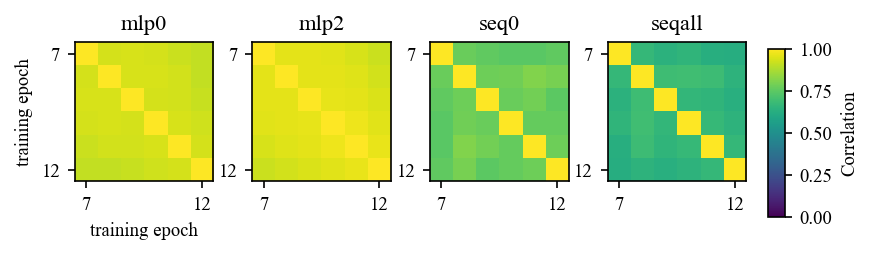

In [969]:
fig,ax=plt.subplots(1,4,figsize=(5.5,2.8),dpi=150)
ax=ax.flatten()
i=0
for key in PV_corrs:
    im = ax[i].imshow(np.nanmean(PV_corrs[key], axis=0), label=key,vmax=1,vmin=0)
    ax[i].set_title(key)
    tickpos=np.arange(0,num_epochs_drift,5)
    ax[i].set_yticks(tickpos)
    ax[i].set_yticklabels(tickpos+7)
    ax[i].set_xticks(tickpos)
    ax[i].set_xticklabels(tickpos+7)
    # ax[i].set_xticks(np.arange(num_epochs_drift))
    # tmp=ax[i].set_xticklabels(["0","1","2","3","4","5","6","new"])
    # tmp[-1].set_rotation(90)
    # cbar=plt.colorbar(im, ax=ax[i],shrink=0.7)
    i+=1
ax[0].set_ylabel('training epoch')
ax[0].set_xlabel('training epoch')


cbar_ax = fig.add_axes([0.92, 0.25, 0.02, 0.4])  
#    [left, bottom, width, height] in fractions of figure size

# 2) draw the colorbar based on the last 'im' (they’re all the same scale)
fig.colorbar(im, cax=cbar_ax, label='Correlation')

# tidy up and save
fig.tight_layout(rect=[0,0,0.9,1],pad=0.3)

cbar.set_label(r'$\langle \mathrm{PV\ corr} \rangle_{\mathrm{x,y}}$')
# fig.tight_layout()
_ensure_parent(current_fig_path/"PV_corrs_drift.svg")
fig.savefig(current_fig_path/"PV_corrs_drift.svg",dpi=300,bbox_inches='tight')
# plt.ylabel(r'$<PV corr>_{loc}$')
# plt.xlabel(r'$\Delta t (h)$')
# plt.legend(frameon=False)
# plt.gca().spines[['top','right']].set_visible(False)
# plt.title('representation drift across training epochs in different layers')
# plt.savefig(analysispath+"/PV_corrs.svg",dpi=300,bbox_inches='tight')

In [970]:
AC_PV_corrs=dict()
n_enjoys=num_epochs_drift
for key in PFs_enjoys[0]:
    tmp=np.zeros((PV_corrs[key].shape[0],n_enjoys))
    for j in range(n_enjoys):
        tmp[:,j]=np.array([ PV_corrs[key][:,i,i+j] for i in range(0,n_enjoys-j)]).mean(0)
    AC_PV_corrs[key]=tmp

In [ ]:
plt.rcParams['text.usetex'] = False


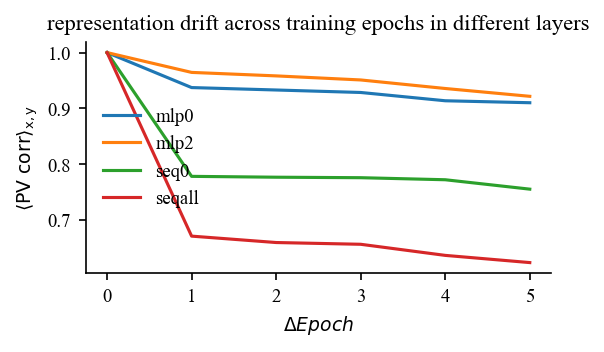

In [971]:
plt.figure(figsize=(4,2),dpi=150)
plt.title('')
for key in AC_PV_corrs:
    plt.plot(np.nanmean(AC_PV_corrs[key],axis=0),label=key)
plt.ylabel(r'$\langle \mathrm{PV\ corr} \rangle_{\mathrm{x,y}}$')
plt.xlabel(r'$\Delta Epoch$')
plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)
plt.title('representation drift across training epochs in different layers')
plt.savefig(current_fig_path/"AC_PV_corrs_drift.svg",dpi=300,bbox_inches='tight')

In [972]:
# correlation of PFs between enjoys for each layer
PV_corrs_CV=dict()
for key in PFs_enjoys[0]:
    tmpPFs_enjoys1=np.array([x[key] for x in PFs_enjoys_first])
    tmpPFs_enjoys2=np.array([x[key] for x in PFs_enjoys_second])
    tmpPFs_enjoys1=tmpPFs_enjoys1.reshape(tmpPFs_enjoys1.shape[0],-1,tmpPFs_enjoys1.shape[-1])
    tmpPFs_enjoys2=tmpPFs_enjoys2.reshape(tmpPFs_enjoys2.shape[0],-1,tmpPFs_enjoys2.shape[-1])
    PV_corrs_CV[key]=np.array([pd.DataFrame(np.vstack([tmpPFs_enjoys1[:,i,:],tmpPFs_enjoys2[:,i,:]]).T).corr().to_numpy()[:num_epochs_drift,num_epochs_drift:] for i in range(tmpPFs_enjoys1.shape[1])])

In [ ]:
displayname_dict={'seq0':'Seq. Input','seqall':'Seq.','mlp0':'Decoder 1','mlp2':'Decoder 2'}

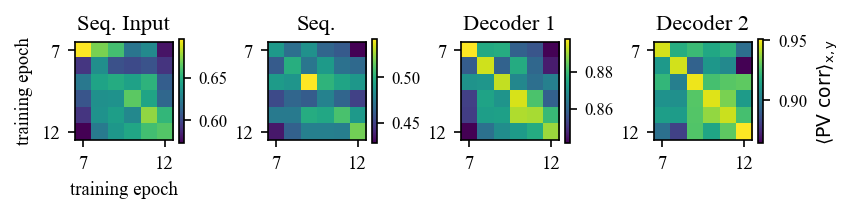

In [973]:
from zstandard import frame_content_size


fig,ax=plt.subplots(1,4,figsize=(5.5,2.8),dpi=150)
ax=ax.flatten()
i=0
for key in layernames:
    im = ax[i].imshow(np.nanmean(PV_corrs_CV[key], axis=0), label=displayname_dict[key],cmap='viridis')#,vmax=1,vmin=0.4)
    ax[i].set_title(displayname_dict[key])
    tickpos=np.arange(0,num_epochs_drift,5)
    ax[i].set_yticks(tickpos)
    ax[i].set_yticklabels(tickpos+7)
    ax[i].set_xticks(tickpos)
    ax[i].set_xticklabels(tickpos+7)
    # ax[i].set_xticks(np.arange(num_epochs_drift))
    # tmp=ax[i].set_xticklabels(["0","1","2","3","4","5","6","new"])
    # tmp[-1].set_rotation(90)
    cbar=plt.colorbar(im, ax=ax[i],shrink=0.25)
    cbar.ax.yaxis.set_tick_params(labelsize=8)
    i+=1
ax[0].set_ylabel('training epoch')
ax[0].set_xlabel('training epoch')


# cbar_ax = fig.add_axes([0.92, 0.25, 0.02, 0.4])  
# #    [left, bottom, width, height] in fractions of figure size

# # 2) draw the colorbar based on the last 'im' (they’re all the same scale)
# cbar=fig.colorbar(im, cax=cbar_ax, label='Correlation')

# # tidy up and save
# fig.tight_layout(rect=[0,0,0.9,1],pad=0.3)

cbar.set_label(r'$\langle \mathrm{PV\ corr} \rangle_{\mathrm{x,y}}$')
fig.tight_layout(pad=0.1)
_ensure_parent(current_fig_path/"PV_corrs_drift_CV.svg")
fig.savefig(current_fig_path/"PV_corrs_drift_CV.pdf",dpi=300,bbox_inches='tight')
# plt.ylabel(r'$<PV corr>_{loc}$')
# plt.xlabel(r'$\Delta t (h)$')
# plt.legend(frameon=False)
# plt.gca().spines[['top','right']].set_visible(False)
# plt.title('representation drift across training epochs in different layers')
# plt.savefig(analysispath+"/PV_corrs.svg",dpi=300,bbox_inches='tight')

In [974]:
AC_PV_corrs_CV=dict()
n_enjoys=num_epochs_drift
for key in PFs_enjoys[0]:
    tmp=np.zeros((PV_corrs_CV[key].shape[0],n_enjoys))
    for j in range(n_enjoys):
        tmp[:,j]=np.array([ PV_corrs_CV[key][:,i,i+j] for i in range(0,n_enjoys-j)]).mean(0)
    AC_PV_corrs_CV[key]=tmp

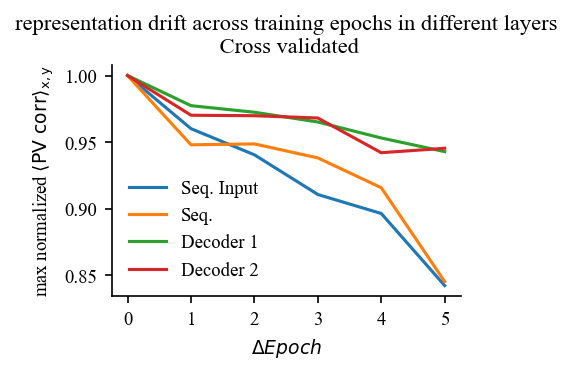

In [975]:
plt.figure(figsize=(3,2),dpi=150)
plt.title('')
for key in layernames:
    tmp=np.nanmean(AC_PV_corrs_CV[key],axis=0)
    cut=0
    plt.plot(tmp[cut:]/tmp[cut],label=displayname_dict[key])
plt.ylabel(r'max normalized $\langle \mathrm{PV\ corr} \rangle_{\mathrm{x,y}}$')
plt.xlabel(r'$\Delta Epoch$')
plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)
plt.title('representation drift across training epochs in different layers\n Cross validated')
plt.savefig(current_fig_path/"AC_PV_corrs_drift_CV.pdf",dpi=300,bbox_inches='tight')

In [1025]:
# correlation of PFs between enjoys for each layer
PV_corrs_CV_rep=dict()
for key in PFs_enjoys[0]:
    tmpPVcorrs_rep=[]
    for i in range(n_reps):
        tmpPFs_enjoys1=np.array([x[key] for x in results[i]['PFs_first']])
        tmpPFs_enjoys2=np.array([x[key] for x in results[i]['PFs_second']])
        tmpPFs_enjoys1=tmpPFs_enjoys1.reshape(tmpPFs_enjoys1.shape[0],-1,tmpPFs_enjoys1.shape[-1])
        tmpPFs_enjoys2=tmpPFs_enjoys2.reshape(tmpPFs_enjoys2.shape[0],-1,tmpPFs_enjoys2.shape[-1])
        tmp=np.array([pd.DataFrame(np.vstack([tmpPFs_enjoys1[:,i,:],tmpPFs_enjoys2[:,i,:]]).T).corr().to_numpy()[:num_epochs_drift,num_epochs_drift:] for i in range(tmpPFs_enjoys1.shape[1])])
        tmpPVcorrs_rep.append(tmp)
    PV_corrs_CV_rep[key]=np.array(tmpPVcorrs_rep)

In [ ]:
displayname_dict={'seq0':'Seq. Input','seqall':'Seq.','mlp0':'Decoder 1','mlp2':'Decoder 2'}

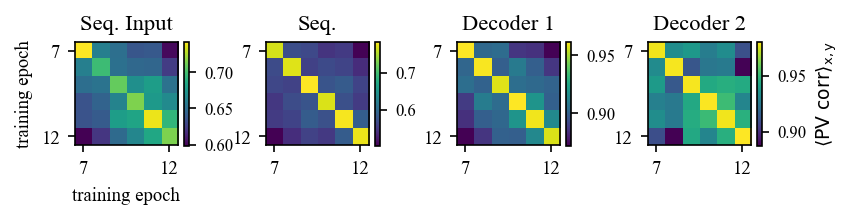

In [1027]:
from zstandard import frame_content_size


fig,ax=plt.subplots(1,4,figsize=(5.5,2.8),dpi=150)
ax=ax.flatten()
i=0
for key in layernames:
    im = ax[i].imshow(np.nanmean(PV_corrs_CV_rep[key], axis=1).mean(0), label=displayname_dict[key],cmap='viridis')#,vmax=1,vmin=0.4)
    ax[i].set_title(displayname_dict[key])
    tickpos=np.arange(0,num_epochs_drift,5)
    ax[i].set_yticks(tickpos)
    ax[i].set_yticklabels(tickpos+7)
    ax[i].set_xticks(tickpos)
    ax[i].set_xticklabels(tickpos+7)
    # ax[i].set_xticks(np.arange(num_epochs_drift))
    # tmp=ax[i].set_xticklabels(["0","1","2","3","4","5","6","new"])
    # tmp[-1].set_rotation(90)
    cbar=plt.colorbar(im, ax=ax[i],shrink=0.25)
    cbar.ax.yaxis.set_tick_params(labelsize=8)
    i+=1
ax[0].set_ylabel('training epoch')
ax[0].set_xlabel('training epoch')


# cbar_ax = fig.add_axes([0.92, 0.25, 0.02, 0.4])  
# #    [left, bottom, width, height] in fractions of figure size

# # 2) draw the colorbar based on the last 'im' (they’re all the same scale)
# cbar=fig.colorbar(im, cax=cbar_ax, label='Correlation')

# # tidy up and save
# fig.tight_layout(rect=[0,0,0.9,1],pad=0.3)

cbar.set_label(r'$\langle \mathrm{PV\ corr} \rangle_{\mathrm{x,y}}$')
fig.tight_layout(pad=0.1)
_ensure_parent(current_fig_path/"PV_corrs_drift_CV.svg")
# fig.savefig(current_fig_path/"PV_corrs_drift_CV.pdf",dpi=300,bbox_inches='tight')
# plt.ylabel(r'$<PV corr>_{loc}$')
# plt.xlabel(r'$\Delta t (h)$')
# plt.legend(frameon=False)
# plt.gca().spines[['top','right']].set_visible(False)
# plt.title('representation drift across training epochs in different layers')
# plt.savefig(analysispath+"/PV_corrs.svg",dpi=300,bbox_inches='tight')

In [1028]:
PV_corrs_CV_rep[key].shape

(20, 361, 6, 6)

In [1032]:
AC_PV_corrs_CV_rep=dict()
n_enjoys=num_epochs_drift
for key in PFs_enjoys[0]:
    tmp=np.zeros((n_reps,PV_corrs_CV_rep[key].shape[1],n_enjoys))
    for j in range(n_enjoys):
        tmp[:,:,j]=np.array([ PV_corrs_CV_rep[key][:,:,i,i+j] for i in range(0,n_enjoys-j)]).mean(0)
    AC_PV_corrs_CV_rep[key]=tmp

In [1033]:
tmp.shape

(20, 361, 6)

Text(0.5, 1.0, 'representation drift across training epochs in different layers\n Cross validated')

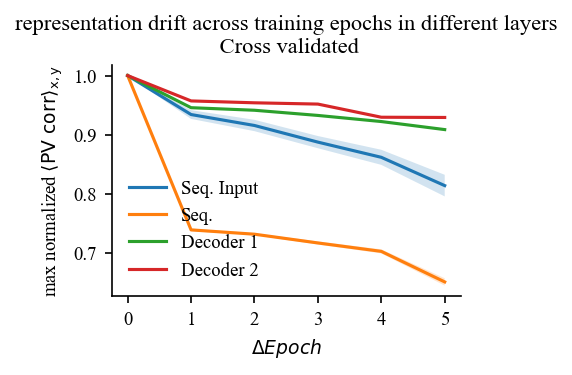

In [1037]:
plt.figure(figsize=(3,2),dpi=150)
plt.title('')
for key in layernames:
    tmp=np.nanmean(AC_PV_corrs_CV_rep[key],axis=1)
    cut=0
    means=(tmp[:,cut:]/tmp[:,[cut]]).mean(0)
    stds=(tmp[:,cut:]/tmp[:,[cut]]).std(0)
    plt.plot(means,label=displayname_dict[key])
    plt.fill_between(np.arange(len(means)),means-stds,means+stds,alpha=0.2)
plt.ylabel(r'max normalized $\langle \mathrm{PV\ corr} \rangle_{\mathrm{x,y}}$')
plt.xlabel(r'$\Delta Epoch$')
plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)
plt.title('representation drift across training epochs in different layers\n Cross validated')
# plt.savefig(current_fig_path/"AC_PV_corrs_drift_CV.pdf",dpi=300,bbox_inches='tight')

In [1038]:
stds

array([0.        , 0.00050107, 0.00063906, 0.00062772, 0.00083194,
       0.00133124])

## Resume same location Fix DG



In [918]:
root = pathlib.Path(
            "/home/xiaoxiong/try0120/train_dir/ResumeLoc3_RealFixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2"
            "/checkpoint_p0")

In [919]:
folders_containing_data=glob(str(root.parent)+"/telemetry/*/")
folders_containing_data=sorted(folders_containing_data)
folders_containing_data


['/home/xiaoxiong/try0120/train_dir/ResumeLoc3_RealFixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000017398_102469632.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_RealFixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000018268_107814912.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_RealFixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000019144_113197056.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_RealFixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000020006_118493184.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_RealFixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000020844_123641856.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc

In [ ]:
# folders_containing_data= folders_containing_data+["/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/"]

In [ ]:
(cfg.Hippo_L+cfg.Hippo_R-1)

71

In [ ]:
folders_containing_data

['/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000017766_104509440.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000018964_111869952.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000020086_118763520.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000021164_125386752.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000022230_131936256.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_FixDG_Epi_Ins9_Dep

In [ ]:
folders_containing_data=folders_containing_data[]

In [920]:
## aggregating data
fields_enjoys=[]
PFs_enjoys=[]
SI_enjoys=[]
percent_active=[]
percent_active_all=[]
for analysispath in folders_containing_data:
    # rootpath="/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2"
    # analysispath=rootpath+"/telemetry"
    glob(str(analysispath+"/*.csv"))
    

    pddata = pd.read_csv(glob(str(analysispath+"/*.csv"))[0])
    with h5py.File(glob(str(analysispath+"/*.h5"))[0]) as h5:
        activations = {k: h5[k][...] for k in h5}
    pddata['rot_pi']=pddata['rot_y']*np.pi/180
    # activations['core']=torch.cat(activations['core'], dim=0).numpy() 
    def SpatialInformation(firing,occu,per_spike=False):
        p_occu = occu/occu.flatten().sum()
        fr_x = firing/occu
        fr_mean = firing.flatten().sum()/occu[:].sum()
        out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
        if per_spike:
            out/=fr_mean
        return( out )
        
    ## calculate SIs
    xbound=(100,2000)
    ybound=(100,2000)
    grain = 19
    occu_xya=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),density=False)[0]

    tmp_act=activations

    grain=19
    hla_xya=np.zeros((grain,grain,12,128))
    for i in range(128):
        hla_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['decoder.mlp.2'][:,i]*(tmp_act['decoder.mlp.2'][:,i]>0),density=False)[0]
    hla_xya=hla_xya[:,:,:,:]*(hla_xya[:,:,:,:]>0)

    grain=19
    hla0_xya=np.zeros((grain,grain,12,128))
    for i in range(128):
        hla0_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['decoder.mlp.0'][:,i]*(tmp_act['decoder.mlp.0'][:,i]>0),density=False)[0]
    hla0_xya=hla0_xya[:,:,:,:]*(hla0_xya[:,:,:,:]>0)

    if tmp_act['core'].shape[1]-13 != 16*(cfg.Hippo_L+cfg.Hippo_R-1):
        print('size mismatch!!!!')
        break
    sids=tmp_act['core'][:,:-13:(cfg.Hippo_L+cfg.Hippo_R-1)]
    perc=(sids>0).mean(0)
    percent_active.append(perc)
    percent_active_all.append((sids.sum(1)>0).mean())
    
    grain=19
    seq0_xya=np.zeros((grain,grain,12,16))
    for i in range(16):
        seq0_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=sids[:,i],density=False)[0]

    grain=19
    seqall_xya=np.zeros((grain,grain,12,16*(cfg.Hippo_L+cfg.Hippo_R-1)))
    for i in range(16*(cfg.Hippo_L+cfg.Hippo_R-1)):
        seqall_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['core'][:,i],density=False)[0]

    fields = {"mlp0":hla0_xya,"mlp2":hla_xya,"seq0":seq0_xya,"seqall":seqall_xya,"occu":occu_xya}
    fields_enjoys.append(fields)

    SIs = dict()
    for key in fields:
        if key !="occu":
            SIs[key]= np.array([SpatialInformation(fields[key][:,:,:,i],fields["occu"]) for i in range(fields[key].shape[-1])])
    SI_enjoys.append(SIs)
    PFs = dict()
    for key in fields:
        if key !="occu":
            PFs[key]= np.nansum(fields[key],-2)/np.nansum(fields["occu"][:,:,:,None],-2)
    PFs_enjoys.append(PFs)
    # SI_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i],occu_xya) for i in range(128)])
    # SI_seq0=np.array([SpatialInformation(seq0_xya[:,:,:,i],occu_xya) for i in range(16)])
    # SI_seqall=np.array([SpatialInformation(seqall_xya[:,:,:,i],occu_xya) for i in range(16*15)])
    


In [921]:
## aggregating data
corr_DGs=[]
for analysispath in folders_containing_data:
    # rootpath="/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2"
    # analysispath=rootpath+"/telemetry"
    glob(str(analysispath+"/*.csv"))
    

    pddata = pd.read_csv(glob(str(analysispath+"/*.csv"))[0])
    with h5py.File(glob(str(analysispath+"/*.h5"))[0]) as h5:
        activations = {k: h5[k][...] for k in h5}
    pddata['rot_pi']=pddata['rot_y']*np.pi/180
    # activations['core']=torch.cat(activations['core'], dim=0).numpy() 
    tmp_act=activations
    if tmp_act['core'].shape[1]-13 != 16*(cfg.Hippo_L+cfg.Hippo_R-1):
        print('size mismatch!!!!')
        break
    sids=tmp_act['core'][:,:-13:(cfg.Hippo_L+cfg.Hippo_R-1)]
    corr_DGs.append(pd.DataFrame(sids).corr().values)

In [ ]:
ax.set_ax

In [922]:
# import numpy as np
# import pandas as pd
# import h5py
# from glob import glob

# Containers for first vs. second half
fields_enjoys_first   = []
fields_enjoys_second  = []
SI_enjoys_first       = []
SI_enjoys_second      = []
PFs_enjoys_first      = []
PFs_enjoys_second     = []
percent_active_first  = []
percent_active_second = []
percent_active_all_first  = []
percent_active_all_second = []

for analysispath in folders_containing_data:
    # --- load data ---
    csv_path = glob(str(analysispath+"/*.csv"))[0]
    pddata   = pd.read_csv(csv_path)
    with h5py.File(glob(str(analysispath+"/*.h5"))[0], 'r') as h5:
        activations = {k: h5[k][...] for k in h5}

    # convert heading to radians
    pddata['rot_pi'] = pddata['rot_y'] * np.pi/180

    # determine split index
    N       = len(pddata)
    mid_idx = N // 2

    # helper for spatial information
    # def SpatialInformation(firing, occu):
    #     p_occu  = occu / occu.sum()
    #     fr_x    = firing / occu
    #     fr_mean = firing.sum() / occu.sum()
    #     return np.nansum(p_occu * fr_x * np.log(fr_x/fr_mean))

    # bin definitions
    xbound = (100,2000)
    ybound = (100,2000)
    grain  = 19
    theta_bins = np.linspace(-np.pi, np.pi, 13)

    # process each half separately
    for half, (start, end) in enumerate([(0, mid_idx), (mid_idx, N)]):
        subdata = pddata.iloc[start:end]
        subact  = {k: v[start:end] for k, v in activations.items()}

        # occupancy
        occu_xya = np.histogramdd(
            (subdata['x'], subdata['y'], subdata['rot_pi']),
            bins=(np.linspace(*xbound, grain+1),
                  np.linspace(*ybound, grain+1),
                  theta_bins),
            density=False
        )[0]

        # activations histograms
        hla2 = np.zeros((grain,grain,12,128))
        hla0 = np.zeros_like(hla2)
        for i in range(128):
            w2 = np.clip(subact['decoder.mlp.2'][:,i], 0, None)
            hla2[...,i] = np.histogramdd(
                (subdata['x'], subdata['y'], subdata['rot_pi']),
                bins=(np.linspace(*xbound, grain+1),
                      np.linspace(*ybound, grain+1),
                      theta_bins),
                weights=w2, density=False
            )[0]
            w0 = np.clip(subact['decoder.mlp.0'][:,i], 0, None)
            hla0[...,i] = np.histogramdd(
                (subdata['x'], subdata['y'], subdata['rot_pi']),
                bins=(np.linspace(*xbound, grain+1),
                      np.linspace(*ybound, grain+1),
                      theta_bins),
                weights=w0, density=False
            )[0]

        # core sequence units
        L = cfg.Hippo_L + cfg.Hippo_R - 1
        assert subact['core'].shape[1] - 13 == 16*L, "core size mismatch"
        sids = subact['core'][:,:-13:L]

        # percent‐active metrics
        perc = (sids>0).mean(0)
        perc_all = (sids.sum(1)>0).mean()

        # sequence histograms
        seq0    = np.zeros((grain,grain,12,16))
        seqall  = np.zeros((grain,grain,12,16*L))
        for i in range(16):
            seq0[...,i] = np.histogramdd(
                (subdata['x'], subdata['y'], subdata['rot_pi']),
                bins=(np.linspace(*xbound, grain+1),
                      np.linspace(*ybound, grain+1),
                      theta_bins),
                weights=sids[:,i], density=False
            )[0]
        for i in range(16*L):
            seqall[...,i] = np.histogramdd(
                (subdata['x'], subdata['y'], subdata['rot_pi']),
                bins=(np.linspace(*xbound, grain+1),
                      np.linspace(*ybound, grain+1),
                      theta_bins),
                weights=subact['core'][:,i], density=False
            )[0]

        # aggregate into dict
        fields = {
            "mlp0":   hla0,
            "mlp2":   hla2,
            "seq0":   seq0,
            "seqall": seqall,
            "occu":   occu_xya
        }

        # compute SIs & PFs
        SIs = {
            k: np.array([SpatialInformation(fields[k][...,i], occu_xya)
                         for i in range(fields[k].shape[-1])])
            for k in fields if k != "occu"
        }
        total_occu = occu_xya.sum(axis=2)[...,None]
        PFs = {
            k: fields[k].sum(axis=2) / total_occu
            for k in fields if k != "occu"
        }

        # stash into the correct half
        if half == 0:
            fields_enjoys_first.append(fields)
            SI_enjoys_first.append(SIs)
            PFs_enjoys_first.append(PFs)
            percent_active_first.append(perc)
            percent_active_all_first.append(perc_all)
        else:
            fields_enjoys_second.append(fields)
            SI_enjoys_second.append(SIs)
            PFs_enjoys_second.append(PFs)
            percent_active_second.append(perc)
            percent_active_all_second.append(perc_all)

# After this:
#   • fields_enjoys_first  / fields_enjoys_second  
#   • SI_enjoys_first      / SI_enjoys_second      
#   • PFs_enjoys_first     / PFs_enjoys_second     
#   • percent_active_first / percent_active_second 
#   • percent_active_all_first / percent_active_all_second
# all contain the separate stats for each half.


#### drift

In [923]:
# correlation of PFs between enjoys for each layer
PV_corrs=dict()
for key in PFs_enjoys[0]:
    tmpPFs_enjoys=np.array([x[key] for x in PFs_enjoys])
    tmpPFs_enjoys=tmpPFs_enjoys.reshape(tmpPFs_enjoys.shape[0],-1,tmpPFs_enjoys.shape[-1])
    PV_corrs[key]=np.array([pd.DataFrame(tmpPFs_enjoys[:,i,:].T).corr() for i in range(tmpPFs_enjoys.shape[1])])

In [930]:
len(PFs_enjoys)

6

In [929]:
folders_containing_data

['/home/xiaoxiong/try0120/train_dir/ResumeLoc3_RealFixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000017398_102469632.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_RealFixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000018268_107814912.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_RealFixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000019144_113197056.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_RealFixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000020006_118493184.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc3_RealFixDG_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000020844_123641856.pth/',
 '/home/xiaoxiong/try0120/train_dir/ResumeLoc

In [ ]:
PV_corrs['mlp2'].shape

(361, 6, 6)

In [924]:
path_obj=pathlib.Path(analysispath)
figure_path=pathlib.Path('/home/xiaoxiong/Neuripsfigs/')
figure_path.mkdir(exist_ok=True)
path_obj.relative_to('/home/xiaoxiong/try0120/train_dir/')
current_fig_path=figure_path/path_obj.relative_to('/home/xiaoxiong/try0120/train_dir/')
_ensure_parent(current_fig_path/"PV_corrs.svg")

In [925]:
num_epochs_drift=len(folders_containing_data)

In [ ]:
num_epochs_drift

6

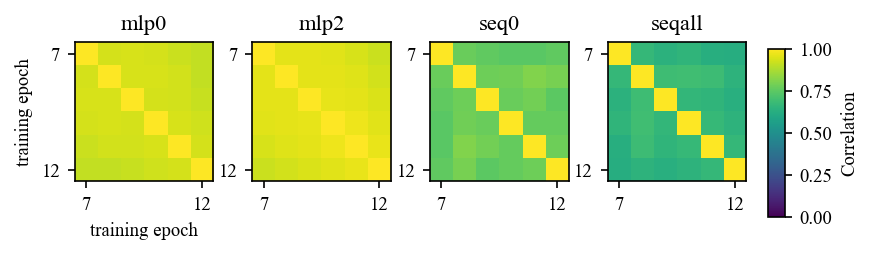

In [931]:
fig,ax=plt.subplots(1,4,figsize=(5.5,2.8),dpi=150)
ax=ax.flatten()
i=0
for key in PV_corrs:
    im = ax[i].imshow(np.nanmean(PV_corrs[key], axis=0), label=key,vmax=1,vmin=0)
    ax[i].set_title(key)
    tickpos=np.arange(0,num_epochs_drift,5)
    ax[i].set_yticks(tickpos)
    ax[i].set_yticklabels(tickpos+7)
    ax[i].set_xticks(tickpos)
    ax[i].set_xticklabels(tickpos+7)
    # ax[i].set_xticks(np.arange(num_epochs_drift))
    # tmp=ax[i].set_xticklabels(["0","1","2","3","4","5","6","new"])
    # tmp[-1].set_rotation(90)
    # cbar=plt.colorbar(im, ax=ax[i],shrink=0.7)
    i+=1
ax[0].set_ylabel('training epoch')
ax[0].set_xlabel('training epoch')


cbar_ax = fig.add_axes([0.92, 0.25, 0.02, 0.4])  
#    [left, bottom, width, height] in fractions of figure size

# 2) draw the colorbar based on the last 'im' (they’re all the same scale)
fig.colorbar(im, cax=cbar_ax, label='Correlation')

# tidy up and save
fig.tight_layout(rect=[0,0,0.9,1],pad=0.3)

cbar.set_label(r'$\langle \mathrm{PV\ corr} \rangle_{\mathrm{x,y}}$')
# fig.tight_layout()
_ensure_parent(current_fig_path/"PV_corrs_drift.svg")
fig.savefig(current_fig_path/"PV_corrs_drift_fixDG.pdf",dpi=300,bbox_inches='tight')
# plt.ylabel(r'$<PV corr>_{loc}$')
# plt.xlabel(r'$\Delta t (h)$')
# plt.legend(frameon=False)
# plt.gca().spines[['top','right']].set_visible(False)
# plt.title('representation drift across training epochs in different layers')
# plt.savefig(analysispath+"/PV_corrs.svg",dpi=300,bbox_inches='tight')

In [932]:
AC_PV_corrs=dict()
n_enjoys=num_epochs_drift
for key in PFs_enjoys[0]:
    tmp=np.zeros((PV_corrs[key].shape[0],n_enjoys))
    for j in range(n_enjoys):
        tmp[:,j]=np.array([ PV_corrs[key][:,i,i+j] for i in range(0,n_enjoys-j)]).mean(0)
    AC_PV_corrs[key]=tmp

In [ ]:
plt.rcParams['text.usetex'] = False


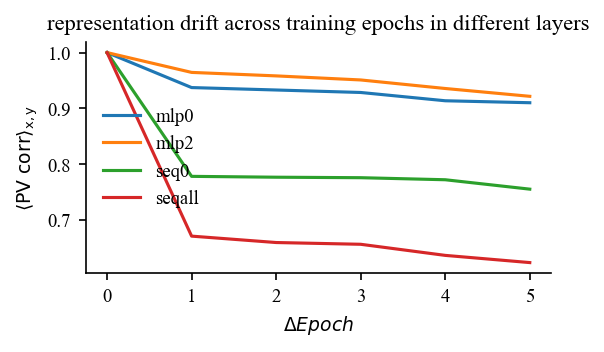

In [943]:
plt.figure(figsize=(4,2),dpi=150)
plt.title('')
for key in AC_PV_corrs:
    tmp=np.nanmean(AC_PV_corrs[key],axis=0)
    plt.plot(tmp,label=key)
plt.ylabel(r'$\langle \mathrm{PV\ corr} \rangle_{\mathrm{x,y}}$')
plt.xlabel(r'$\Delta Epoch$')
plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)
plt.title('representation drift across training epochs in different layers')
plt.savefig(current_fig_path/"AC_PV_corrs_drift_FixDG.svg",dpi=300,bbox_inches='tight')

In [934]:
# correlation of PFs between enjoys for each layer
PV_corrs_CV=dict()
for key in PFs_enjoys[0]:
    tmpPFs_enjoys1=np.array([x[key] for x in PFs_enjoys_first])
    tmpPFs_enjoys2=np.array([x[key] for x in PFs_enjoys_second])
    tmpPFs_enjoys1=tmpPFs_enjoys1.reshape(tmpPFs_enjoys1.shape[0],-1,tmpPFs_enjoys1.shape[-1])
    tmpPFs_enjoys2=tmpPFs_enjoys2.reshape(tmpPFs_enjoys2.shape[0],-1,tmpPFs_enjoys2.shape[-1])
    PV_corrs_CV[key]=np.array([pd.DataFrame(np.vstack([tmpPFs_enjoys1[:,i,:],tmpPFs_enjoys2[:,i,:]]).T).corr().to_numpy()[:num_epochs_drift,num_epochs_drift:] for i in range(tmpPFs_enjoys1.shape[1])])

In [935]:
displayname_dict={'seq0':'Seq. Input','seqall':'Seq.','mlp0':'Decoder 1','mlp2':'Decoder 2'}

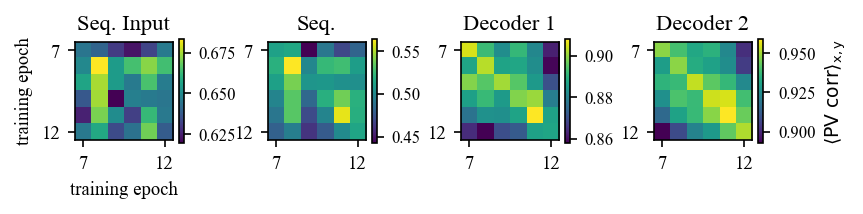

In [936]:
from zstandard import frame_content_size


fig,ax=plt.subplots(1,4,figsize=(5.5,2.8),dpi=150)
ax=ax.flatten()
i=0
for key in layernames:
    im = ax[i].imshow(np.nanmean(PV_corrs_CV[key], axis=0), label=displayname_dict[key],cmap='viridis')#,vmax=1,vmin=0.4)
    ax[i].set_title(displayname_dict[key])
    tickpos=np.arange(0,num_epochs_drift,5)
    ax[i].set_yticks(tickpos)
    ax[i].set_yticklabels(tickpos+7)
    ax[i].set_xticks(tickpos)
    ax[i].set_xticklabels(tickpos+7)
    # ax[i].set_xticks(np.arange(num_epochs_drift))
    # tmp=ax[i].set_xticklabels(["0","1","2","3","4","5","6","new"])
    # tmp[-1].set_rotation(90)
    cbar=plt.colorbar(im, ax=ax[i],shrink=0.25)
    cbar.ax.yaxis.set_tick_params(labelsize=8)
    i+=1
ax[0].set_ylabel('training epoch')
ax[0].set_xlabel('training epoch')


# cbar_ax = fig.add_axes([0.92, 0.25, 0.02, 0.4])  
# #    [left, bottom, width, height] in fractions of figure size

# # 2) draw the colorbar based on the last 'im' (they’re all the same scale)
# cbar=fig.colorbar(im, cax=cbar_ax, label='Correlation')

# # tidy up and save
# fig.tight_layout(rect=[0,0,0.9,1],pad=0.3)

cbar.set_label(r'$\langle \mathrm{PV\ corr} \rangle_{\mathrm{x,y}}$')
fig.tight_layout(pad=0.1)
_ensure_parent(current_fig_path/"PV_corrs_drift_CV.svg")
fig.savefig(current_fig_path/"PV_corrs_drift_CV_fixDG.pdf",dpi=300,bbox_inches='tight')
# plt.ylabel(r'$<PV corr>_{loc}$')
# plt.xlabel(r'$\Delta t (h)$')
# plt.legend(frameon=False)
# plt.gca().spines[['top','right']].set_visible(False)
# plt.title('representation drift across training epochs in different layers')
# plt.savefig(analysispath+"/PV_corrs.svg",dpi=300,bbox_inches='tight')

In [937]:
AC_PV_corrs_CV=dict()
n_enjoys=num_epochs_drift
for key in PFs_enjoys[0]:
    tmp=np.zeros((PV_corrs_CV[key].shape[0],n_enjoys))
    for j in range(n_enjoys):
        tmp[:,j]=np.array([ PV_corrs_CV[key][:,i,i+j] for i in range(0,n_enjoys-j)]).mean(0)
    AC_PV_corrs_CV[key]=tmp

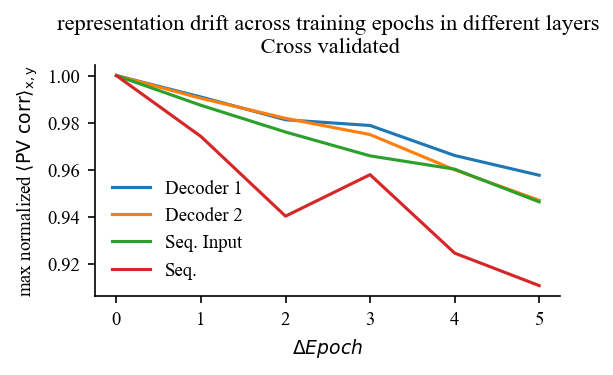

In [939]:
plt.figure(figsize=(4,2),dpi=150)
plt.title('')
for key in AC_PV_corrs_CV:
    tmp=np.nanmean(AC_PV_corrs_CV[key],axis=0)
    plt.plot(tmp/tmp[0],label=displayname_dict[key])
plt.ylabel(r'max normalized $\langle \mathrm{PV\ corr} \rangle_{\mathrm{x,y}}$')
plt.xlabel(r'$\Delta Epoch$')
plt.legend(frameon=False)
plt.gca().spines[['top','right']].set_visible(False)
plt.title('representation drift across training epochs in different layers\n Cross validated')
plt.savefig(current_fig_path/"AC_PV_corrs_drift_CV_fixDG.pdf",dpi=300,bbox_inches='tight')

## DGBN233 R3 L64

In [ ]:
Epi_Ins9_R3_Tr_AR_SS_DGBN233_Hippo16_L64_skip4_3pbt_64_rollout_Gamma99

### run many enjoys

In [679]:
root = pathlib.Path("/home/xiaoxiong/try0120/train_dir"
            "/Epi_Ins9_R3_Tr_AR_SS_DGBN233_Hippo16_L64_skip4_3pbt_64_rollout_Gamma99"
            "/checkpoint_p0")

# all *.pth files under checkpoints_p0/milestones/
ckpt_files = list((root / "milestones").glob("*.pth"))

In [680]:
pth_paths = sorted((root / "milestones").glob("*.pth"))

# convert to the wanted relative strings: "milestones/xxx.pth"
pth_list = [f"milestones/{p.name}" for p in pth_paths]

In [681]:
pth_list

['milestones/checkpoint_000001405_11214848.pth',
 'milestones/checkpoint_000003047_22896640.pth',
 'milestones/checkpoint_000004614_34258944.pth',
 'milestones/checkpoint_000005894_44154880.pth',
 'milestones/checkpoint_000007184_54132736.pth',
 'milestones/checkpoint_000008442_63258624.pth',
 'milestones/checkpoint_000009543_71688192.pth',
 'milestones/checkpoint_000010492_79167488.pth',
 'milestones/checkpoint_000011502_86851584.pth',
 'milestones/checkpoint_000012409_94281728.pth',
 'milestones/checkpoint_000013319_101441536.pth',
 'milestones/checkpoint_000014163_108060672.pth',
 'milestones/checkpoint_000014854_113721344.pth',
 'milestones/checkpoint_000015764_120586240.pth',
 'milestones/checkpoint_000016650_127254528.pth']

In [ ]:
checkpoints

['./train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/checkpoint_000016142_94973952.pth',
 './train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/checkpoint_000016178_95195136.pth',
 './train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/checkpoint_000016236_95551488.pth',
 './train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/checkpoint_000016260_95698944.pth',
 './train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/checkpoint_000016280_95821824.pth',
 './train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/checkpoint_000016330_96129024.pth',
 './train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/

In [ ]:
ckpt_files

[PosixPath('/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/checkpoint_000014962_87724032.pth'),
 PosixPath('/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/checkpoint_000011838_68751360.pth'),
 PosixPath('/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/checkpoint_000013486_78655488.pth'),
 PosixPath('/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/checkpoint_000009540_54853632.pth'),
 PosixPath('/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/checkpoint_000006746_38572032.pth'),
 PosixPath('/home/xiaoxiong/tr

In [ ]:
    cfg = load_from_checkpoint(cfg)

[2025-05-08 06:28:43,348][1267942] Loading existing experiment configuration from ./train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/config.json
[2025-05-08 06:28:43,349][1267942] Overriding arg 'train_dir' with value './train_dir' passed from command line
[2025-05-08 06:28:43,349][1267942] Overriding arg 'dmlab_level_cache_path' with value './.dmlab_cache' passed from command line
[2025-05-08 06:28:43,350][1267942] Overriding arg 'use_jit' with value False passed from command line
[2025-05-08 06:28:43,350][1267942] Overriding arg 'with_pos_obs' with value True passed from command line
[2025-05-08 06:28:43,352][1267942] Adding new argument 'fps'=0 that is not in the saved config file!
[2025-05-08 06:28:43,353][1267942] Adding new argument 'eval_env_frameskip'=None that is not in the saved config file!
[2025-05-08 06:28:43,354][1267942] Adding new argument 'no_render'=True that is not in the saved config file!
[2025-05-08 06:28:43,355][1267

In [ ]:
str(pth_name)

'/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/milestones/checkpoint_000014962_87724032.pth'

In [ ]:
Learner.load_checkpoint(str(pth_name), device)


[2025-05-08 06:35:15,164][1267942] Loading state from checkpoint h...
[2025-05-08 06:35:15,165][1267942] Could not load from checkpoint, attempt 0
Traceback (most recent call last):
  File "/home/xiaoxiong/miniforge3/envs/dmlab/lib/python3.8/site-packages/sample_factory/algo/learning/learner.py", line 281, in load_checkpoint
    checkpoint_dict = torch.load(latest_checkpoint, map_location=device)
  File "/home/xiaoxiong/miniforge3/envs/dmlab/lib/python3.8/site-packages/torch/serialization.py", line 791, in load
    with _open_file_like(f, 'rb') as opened_file:
  File "/home/xiaoxiong/miniforge3/envs/dmlab/lib/python3.8/site-packages/torch/serialization.py", line 271, in _open_file_like
    return _open_file(name_or_buffer, mode)
  File "/home/xiaoxiong/miniforge3/envs/dmlab/lib/python3.8/site-packages/torch/serialization.py", line 252, in __init__
    super().__init__(open(name, mode))
FileNotFoundError: [Errno 2] No such file or directory: 'h'
[2025-05-08 06:35:15,166][1267942] Loadin

In [ ]:
/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/checkpoint_p0/checkpoint_000019136_112484352.pth

In [ ]:
for pth_name in ckpt_files:
    verbose = False



    eval_env_frameskip: int = cfg.env_frameskip 
    assert (
        cfg.env_frameskip % eval_env_frameskip == 0
    ), f"{cfg.env_frameskip=} must be divisible by {eval_env_frameskip=}"
    render_action_repeat: int = cfg.env_frameskip // eval_env_frameskip
    cfg.env_frameskip = cfg.eval_env_frameskip = eval_env_frameskip
    log.debug(f"Using frameskip {cfg.env_frameskip} and {render_action_repeat=} for evaluation")

    cfg.num_envs = 1

    # render_mode = "human"
    # if cfg.save_video:
    #     render_mode = "rgb_array"
    # elif cfg.no_render:
    render_mode = None

    env = make_env_func_batched(
        cfg, env_config=AttrDict(worker_index=0, vector_index=0, env_id=0), render_mode=render_mode
    )
    env_info = extract_env_info(env, cfg)

    if hasattr(env.unwrapped, "reset_on_init"):
        # reset call ruins the demo recording for VizDoom
        env.unwrapped.reset_on_init = False
    log.info(env.action_space)
    actor_critic = create_actor_critic(cfg, env.observation_space, env.action_space)
    actor_critic.eval()



    device = torch.device("cpu" if cfg.device == "cpu" else "cuda")
    actor_critic.model_to_device(device)


    #################### register hook
    layers_to_log = [
        'encoder.basic_encoder.mlp_layers.0',
        "encoder.DG_projection.linear",
        "core",
        
        "decoder.mlp.0",
        "decoder.mlp.2"
    ]          # <- example; edit to taste

    # 2B. activation buffer

    import collections
    act_buffers = collections.defaultdict(list)

    def make_hook(layer_name):
        def _hook(_m, _inp, out):
            if isinstance(out, (tuple, list)):      # RNN returns (output, h_n)
                out = out[0]
            act_buffers[layer_name].append(out.detach().cpu())
        return _hook

    # attach the hook once
    for layer_to_log in layers_to_log:
        try:
            dict(actor_critic.named_modules())[layer_to_log].register_forward_hook(make_hook(layer_to_log))
            log.info("Activation hook registered on %s", layer_to_log)
        except KeyError:
            raise RuntimeError(f"Layer '{layer_to_log}' not found in the network!")

    ####################


    policy_id = cfg.policy_index
    # log.info(policy_id)
    name_prefix = dict(latest="checkpoint", best="best")[cfg.load_checkpoint_kind]
    # log.info(Learner.checkpoint_dir(cfg, policy_id))
    # checkpoints = Learner.get_checkpoints(Learner.checkpoint_dir(cfg, policy_id), f"{name_prefix}_*")
    # checkpoint_dict = Learner.load_checkpoint(str(pth_name), device)
    checkpoint_dict = torch.load(str(pth_name), device)
    actor_critic.load_state_dict(checkpoint_dict["model"])

    episode_rewards = [deque([], maxlen=100) for _ in range(env.num_agents)]
    true_objectives = [deque([], maxlen=100) for _ in range(env.num_agents)]
    num_frames = 0

    last_render_start = time.time()

    def max_frames_reached(frames):
        return cfg.max_num_frames is not None and frames > cfg.max_num_frames

    reward_list = []

    obs, infos = env.reset()
    rnn_states = torch.zeros([env.num_agents, get_rnn_size(cfg)], dtype=torch.float32, device=device)
    episode_reward = None
    finished_episode = [False for _ in range(env.num_agents)]

    video_frames = []
    num_episodes = 0

    # saved_data=dict()
    pose_records = []

    with torch.no_grad():
        while not max_frames_reached(num_frames):
            normalized_obs = prepare_and_normalize_obs(actor_critic, obs)

            # if not cfg.no_render:
            #     visualize_policy_inputs(normalized_obs)
            policy_outputs = actor_critic(normalized_obs, rnn_states)

            # sample actions from the distribution by default
            actions = policy_outputs["actions"]

            if cfg.eval_deterministic:
                action_distribution = actor_critic.action_distribution()
                actions = argmax_actions(action_distribution)

            # actions shape should be [num_agents, num_actions] even if it's [1, 1]
            if actions.ndim == 1:
                actions = unsqueeze_tensor(actions, dim=-1)
            actions = preprocess_actions(env_info, actions)

            rnn_states = policy_outputs["new_rnn_states"]

            for _ in range(render_action_repeat):
                # last_render_start = render_frame(cfg, env, video_frames, num_episodes, last_render_start)

                obs, rew, terminated, truncated, infos = env.step(actions)
                # log.info(obs['DEBUG.POS.TRANS'])
                # save info
                frame_idx = num_frames          # or use a wall‑clock timestamp
                pos = obs['DEBUG.POS.TRANS']    # (B,3)
                rot = obs['DEBUG.POS.ROT']      # (B,3) or (B,4) depending on env

                for agent_i in range(env.num_agents):
                    pose_records.append({
                        "frame"  : frame_idx,
                        "agent"  : agent_i,
                        "x"      : float(pos[agent_i, 0]),
                        "y"      : float(pos[agent_i, 1]),
                        "z"      : float(pos[agent_i, 2]),
                        "rot_x"  : float(rot[agent_i, 0]),
                        "rot_y"  : float(rot[agent_i, 1]),
                        "rot_z"  : float(rot[agent_i, 2]),
                        # keep the whole info dict as a JSON string for convenience
                        "info"   : json.dumps(infos[agent_i], default=str),
                    })



                dones = make_dones(terminated, truncated)
                infos = [{} for _ in range(env_info.num_agents)] if infos is None else infos

                if episode_reward is None:
                    episode_reward = rew.float().clone()
                else:
                    episode_reward += rew.float()

                num_frames += 1
                if num_frames % 100 == 0:
                    log.debug(f"Num frames {num_frames}...")

                dones = dones.cpu().numpy()
                for agent_i, done_flag in enumerate(dones):
                    if done_flag:
                        finished_episode[agent_i] = True
                        rew = episode_reward[agent_i].item()
                        episode_rewards[agent_i].append(rew)

                        true_objective = rew
                        if isinstance(infos, (list, tuple)):
                            true_objective = infos[agent_i].get("true_objective", rew)
                        true_objectives[agent_i].append(true_objective)

                        if verbose:
                            log.info(
                                "Episode finished for agent %d at %d frames. Reward: %.3f, true_objective: %.3f",
                                agent_i,
                                num_frames,
                                episode_reward[agent_i],
                                true_objectives[agent_i][-1],
                            )
                        rnn_states[agent_i] = torch.zeros([get_rnn_size(cfg)], dtype=torch.float32, device=device)
                        episode_reward[agent_i] = 0

                        if cfg.use_record_episode_statistics:
                            # we want the scores from the full episode not a single agent death (due to EpisodicLifeEnv wrapper)
                            if "episode" in infos[agent_i].keys():
                                num_episodes += 1
                                reward_list.append(infos[agent_i]["episode"]["r"])
                        else:
                            num_episodes += 1
                            reward_list.append(true_objective)

                # if episode terminated synchronously for all agents, pause a bit before starting a new one
                if all(dones):
                    # render_frame(cfg, env, video_frames, num_episodes, last_render_start)
                    time.sleep(0.05)

                if all(finished_episode):
                    finished_episode = [False] * env.num_agents
                    avg_episode_rewards_str, avg_true_objective_str = "", ""
                    for agent_i in range(env.num_agents):
                        avg_rew = np.mean(episode_rewards[agent_i])
                        avg_true_obj = np.mean(true_objectives[agent_i])

                        if not np.isnan(avg_rew):
                            if avg_episode_rewards_str:
                                avg_episode_rewards_str += ", "
                            avg_episode_rewards_str += f"#{agent_i}: {avg_rew:.3f}"
                        if not np.isnan(avg_true_obj):
                            if avg_true_objective_str:
                                avg_true_objective_str += ", "
                            avg_true_objective_str += f"#{agent_i}: {avg_true_obj:.3f}"

                    log.info(
                        "Avg episode rewards: %s, true rewards: %s", avg_episode_rewards_str, avg_true_objective_str
                    )
                    log.info(
                        "Avg episode reward: %.3f, avg true_objective: %.3f",
                        np.mean([np.mean(episode_rewards[i]) for i in range(env.num_agents)]),
                        np.mean([np.mean(true_objectives[i]) for i in range(env.num_agents)]),
                    )

                # VizDoom multiplayer stuff
                # for player in [1, 2, 3, 4, 5, 6, 7, 8]:
                #     key = f'PLAYER{player}_FRAGCOUNT'
                #     if key in infos[0]:
                #         log.debug('Score for player %d: %r', player, infos[0][key])

            if num_episodes >= cfg.max_num_episodes:
                break

    env.close()

    ts        = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    telemetry = pathlib.Path(experiment_dir(cfg=cfg)) / "telemetry"
    _ensure_parent(telemetry)
    telemetry = telemetry / pth_name.name
    _ensure_parent(telemetry)
    pose_path = telemetry / f"pose_{ts}.parquet"

    csv_path = pose_path.with_suffix(".csv")
    _ensure_parent(csv_path)
    pddata=pd.DataFrame(pose_records)
    pddata.to_csv(csv_path, index=False)
    log.info("Saved %d pose rows to %s", len(pose_records), csv_path)

    # log.info("Saved %d pose rows to %s", len(pose_records), pose_path)

    # 5B.  save activations to HDF5  ----------------------------------------
    act_path = telemetry / f"activations_{ts}.h5"
    with h5py.File(act_path, "w") as h5:
        for layer, lst in act_buffers.items():
            if not lst:            # nothing recorded for that layer
                continue
            data = torch.cat(lst, dim=0).numpy()   # (frames*agents, …)
            h5.create_dataset(layer, data=data, compression="gzip")
            log.info("Saved %-20s  shape=%r", layer, data.shape)

[2025-05-08 06:37:31,133][1267942] Using frameskip 8 and render_action_repeat=1 for evaluation
[2025-05-08 06:37:31,134][1267942] Using GPU 0 for DMLab rendering!
[2025-05-08 06:37:31,134][1267942] {'worker_index': 0, 'vector_index': 0, 'env_id': 0} level openfield_map2_fixed_loc3 task id 0
[2025-05-08 06:37:31,134][1267942] True
[2025-05-08 06:37:31,135][1267942] True
[2025-05-08 06:37:31,136][1267942] depth_sensor  dmlab env True
[2025-05-08 06:37:53,343][1267942] using reduced action set!
[2025-05-08 06:37:53,350][1267942] Discrete(5)
[2025-05-08 06:37:53,354][1267942] RunningMeanStd input shape: (4, 72, 96)
[2025-05-08 06:37:53,355][1267942] RunningMeanStd input shape: (1,)
[2025-05-08 06:37:53,365][1267942] True
[2025-05-08 06:37:53,366][1267942] using depth sensor True
[2025-05-08 06:37:53,366][1267942] Num input channels for depth encoder: 1
[2025-05-08 06:37:53,367][1267942] original obs space: Box(0, 255, (4, 72, 96), uint8)
[2025-05-08 06:37:53,424][1267942] Num input channel

Map number:	3


[2025-05-08 06:37:55,240][1267942] Num frames 100...
[2025-05-08 06:37:56,118][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:37:56,120][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.916666666667
Map number:	3
Map number:	3


[2025-05-08 06:37:57,287][1267942] Num frames 200...
[2025-05-08 06:37:58,126][1267942] Num frames 300...
[2025-05-08 06:37:58,856][1267942] Num frames 400...
[2025-05-08 06:37:59,451][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:37:59,452][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	38.616666666667
Map number:	3
Map number:	3


[2025-05-08 06:38:01,302][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:01,303][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.9
Map number:	3


[2025-05-08 06:38:01,833][1267942] Num frames 500...


Map number:	3


[2025-05-08 06:38:02,802][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:02,803][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.2833333333333
Map number:	3
Map number:	3


[2025-05-08 06:38:03,894][1267942] Num frames 600...
[2025-05-08 06:38:05,163][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:05,163][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.533333333333
Map number:	3


[2025-05-08 06:38:05,839][1267942] Num frames 700...


Map number:	3


[2025-05-08 06:38:06,638][1267942] Num frames 800...
[2025-05-08 06:38:07,487][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:07,488][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.666666666667
Map number:	3
Map number:	3


[2025-05-08 06:38:09,091][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:09,092][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.25
Map number:	3


[2025-05-08 06:38:09,805][1267942] Num frames 900...


Map number:	3


[2025-05-08 06:38:10,637][1267942] Num frames 1000...
[2025-05-08 06:38:11,989][1267942] Num frames 1100...
[2025-05-08 06:38:12,041][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:12,043][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.966666666667
Map number:	3
Map number:	3


[2025-05-08 06:38:13,451][1267942] Num frames 1200...
[2025-05-08 06:38:14,039][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:14,040][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.416666666667
Map number:	3
Map number:	3


[2025-05-08 06:38:15,547][1267942] Num frames 1300...
[2025-05-08 06:38:16,611][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:16,612][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.133333333333
Map number:	3
Map number:	3


[2025-05-08 06:38:17,462][1267942] Num frames 1400...
[2025-05-08 06:38:19,071][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:19,072][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.533333333333
Map number:	3


[2025-05-08 06:38:19,711][1267942] Num frames 1500...


Map number:	3


[2025-05-08 06:38:20,191][1267942] Num frames 1600...
[2025-05-08 06:38:21,047][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:21,048][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.383333333333
Map number:	3
Map number:	3


[2025-05-08 06:38:22,119][1267942] Num frames 1700...
[2025-05-08 06:38:23,058][1267942] Num frames 1800...
[2025-05-08 06:38:23,987][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:23,988][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.933333333333
Map number:	3
Map number:	3


[2025-05-08 06:38:25,107][1267942] Num frames 1900...
[2025-05-08 06:38:25,899][1267942] Num frames 2000...
[2025-05-08 06:38:26,741][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:26,742][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.883333333333
Map number:	3
Map number:	3


[2025-05-08 06:38:28,025][1267942] Num frames 2100...
[2025-05-08 06:38:28,799][1267942] Num frames 2200...
[2025-05-08 06:38:29,459][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:29,460][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.5
Map number:	3
Map number:	3


[2025-05-08 06:38:30,990][1267942] Num frames 2300...
[2025-05-08 06:38:32,134][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:32,135][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	21.233333333333
Map number:	3
Map number:	3


[2025-05-08 06:38:33,064][1267942] Num frames 2400...
[2025-05-08 06:38:33,750][1267942] Num frames 2500...
[2025-05-08 06:38:34,899][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:34,899][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.866666666667
Map number:	3


[2025-05-08 06:38:35,578][1267942] Num frames 2600...


Map number:	3


[2025-05-08 06:38:36,257][1267942] Num frames 2700...
[2025-05-08 06:38:37,040][1267942] Num frames 2800...
[2025-05-08 06:38:37,822][1267942] Num frames 2900...
[2025-05-08 06:38:38,623][1267942] Num frames 3000...
[2025-05-08 06:38:39,466][1267942] Num frames 3100...
[2025-05-08 06:38:40,465][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:40,466][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	74.083333333333
Map number:	3
Map number:	3


[2025-05-08 06:38:41,806][1267942] Num frames 3200...
[2025-05-08 06:38:43,051][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:43,052][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.1
Map number:	3
Map number:	3


[2025-05-08 06:38:43,999][1267942] Num frames 3300...
[2025-05-08 06:38:44,697][1267942] Num frames 3400...
[2025-05-08 06:38:45,671][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:45,672][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.133333333333
Map number:	3
Map number:	3


[2025-05-08 06:38:46,642][1267942] Num frames 3500...
[2025-05-08 06:38:47,363][1267942] Num frames 3600...
[2025-05-08 06:38:48,640][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:48,642][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	28.1
Map number:	3
Map number:	3


[2025-05-08 06:38:49,493][1267942] Num frames 3700...
[2025-05-08 06:38:50,793][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:50,794][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.8
Map number:	3


[2025-05-08 06:38:51,472][1267942] Num frames 3800...


Map number:	3


[2025-05-08 06:38:52,295][1267942] Num frames 3900...
[2025-05-08 06:38:52,992][1267942] Num frames 4000...
[2025-05-08 06:38:53,672][1267942] Num frames 4100...
[2025-05-08 06:38:54,650][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:54,651][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	51.35
Map number:	3
Map number:	3


[2025-05-08 06:38:55,443][1267942] Num frames 4200...
[2025-05-08 06:38:56,147][1267942] Num frames 4300...
[2025-05-08 06:38:56,772][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:56,773][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.866666666667
Map number:	3
Map number:	3


[2025-05-08 06:38:58,812][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:38:58,813][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.216666666667
Map number:	3


[2025-05-08 06:38:59,335][1267942] Num frames 4400...


Map number:	3


[2025-05-08 06:39:00,140][1267942] Num frames 4500...
[2025-05-08 06:39:00,930][1267942] Num frames 4600...
[2025-05-08 06:39:01,652][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:01,652][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	29.466666666667
Map number:	3
Map number:	3


[2025-05-08 06:39:02,784][1267942] Num frames 4700...
[2025-05-08 06:39:03,993][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:03,994][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.4
Map number:	3
Map number:	3


[2025-05-08 06:39:04,825][1267942] Num frames 4800...
[2025-05-08 06:39:05,645][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:05,646][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.9
Map number:	3
Map number:	3


[2025-05-08 06:39:06,633][1267942] Num frames 4900...
[2025-05-08 06:39:07,455][1267942] Num frames 5000...
[2025-05-08 06:39:08,813][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:08,814][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	31.55
Map number:	3
Map number:	3


[2025-05-08 06:39:09,626][1267942] Num frames 5100...
[2025-05-08 06:39:10,519][1267942] Num frames 5200...
[2025-05-08 06:39:11,392][1267942] Num frames 5300...
[2025-05-08 06:39:12,226][1267942] Num frames 5400...
[2025-05-08 06:39:13,592][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:13,593][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	53.283333333333
Map number:	3


[2025-05-08 06:39:14,253][1267942] Num frames 5500...


Map number:	3


[2025-05-08 06:39:15,177][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:15,178][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.5333333333333
Map number:	3
Map number:	3


[2025-05-08 06:39:16,189][1267942] Num frames 5600...
[2025-05-08 06:39:17,209][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:17,210][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.166666666667
Map number:	3
Map number:	3


[2025-05-08 06:39:18,216][1267942] Num frames 5700...
[2025-05-08 06:39:18,979][1267942] Num frames 5800...
[2025-05-08 06:39:19,833][1267942] Num frames 5900...
[2025-05-08 06:39:20,902][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:20,902][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	39.983333333333
Map number:	3
Map number:	3


[2025-05-08 06:39:21,842][1267942] Num frames 6000...
[2025-05-08 06:39:22,750][1267942] Num frames 6100...
[2025-05-08 06:39:24,003][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:24,003][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	31.6
Map number:	3


[2025-05-08 06:39:24,464][1267942] Num frames 6200...


Map number:	3


[2025-05-08 06:39:25,226][1267942] Num frames 6300...
[2025-05-08 06:39:25,963][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:25,964][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.516666666667
Map number:	3
Map number:	3


[2025-05-08 06:39:27,225][1267942] Num frames 6400...
[2025-05-08 06:39:28,309][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:28,309][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.533333333333
Map number:	3
Map number:	3


[2025-05-08 06:39:29,139][1267942] Num frames 6500...
[2025-05-08 06:39:30,232][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:30,233][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.466666666667
Map number:	3


[2025-05-08 06:39:30,830][1267942] Num frames 6600...


Map number:	3


[2025-05-08 06:39:31,569][1267942] Num frames 6700...
[2025-05-08 06:39:32,382][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:32,383][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.983333333333
Map number:	3
Map number:	3


[2025-05-08 06:39:33,537][1267942] Num frames 6800...
[2025-05-08 06:39:34,415][1267942] Num frames 6900...
[2025-05-08 06:39:35,504][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:35,505][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	30.333333333333
Map number:	3
Map number:	3


[2025-05-08 06:39:36,453][1267942] Num frames 7000...
[2025-05-08 06:39:37,414][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:37,415][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.8
Map number:	3
Map number:	3


[2025-05-08 06:39:38,369][1267942] Num frames 7100...
[2025-05-08 06:39:39,264][1267942] Num frames 7200...
[2025-05-08 06:39:40,466][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:40,466][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.483333333333
Map number:	3
Map number:	3


[2025-05-08 06:39:41,467][1267942] Num frames 7300...
[2025-05-08 06:39:42,162][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:42,163][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.8333333333333
Map number:	3
Map number:	3


[2025-05-08 06:39:43,456][1267942] Num frames 7400...
[2025-05-08 06:39:44,128][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:44,129][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.4
Map number:	3
Map number:	3


[2025-05-08 06:39:45,791][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:45,792][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.45
Map number:	3
Map number:	3


[2025-05-08 06:39:46,580][1267942] Num frames 7500...
[2025-05-08 06:39:47,350][1267942] Num frames 7600...
[2025-05-08 06:39:48,666][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:48,666][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	29.7
Map number:	3


[2025-05-08 06:39:49,249][1267942] Num frames 7700...


Map number:	3


[2025-05-08 06:39:50,184][1267942] Num frames 7800...
[2025-05-08 06:39:51,224][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:51,225][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.616666666667
Map number:	3
Map number:	3


[2025-05-08 06:39:52,229][1267942] Num frames 7900...
[2025-05-08 06:39:53,038][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:53,039][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.9
Map number:	3
Map number:	3


[2025-05-08 06:39:54,328][1267942] Num frames 8000...
[2025-05-08 06:39:55,168][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:55,169][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.533333333333
Map number:	3
Map number:	3


[2025-05-08 06:39:56,531][1267942] Num frames 8100...
[2025-05-08 06:39:57,989][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:39:57,990][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	22.716666666667
Map number:	3


[2025-05-08 06:39:58,671][1267942] Num frames 8200...


Map number:	3


[2025-05-08 06:39:59,551][1267942] Num frames 8300...
[2025-05-08 06:40:00,562][1267942] Num frames 8400...
[2025-05-08 06:40:01,693][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:01,694][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	39.4
Map number:	3
Map number:	3


[2025-05-08 06:40:02,471][1267942] Num frames 8500...
[2025-05-08 06:40:03,647][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:03,648][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.716666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:04,514][1267942] Num frames 8600...
[2025-05-08 06:40:05,375][1267942] Num frames 8700...
[2025-05-08 06:40:06,223][1267942] Num frames 8800...
[2025-05-08 06:40:06,827][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:06,827][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	30.683333333333
Map number:	3
Map number:	3


[2025-05-08 06:40:08,365][1267942] Num frames 8900...
[2025-05-08 06:40:09,353][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:09,354][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	19.366666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:10,421][1267942] Num frames 9000...
[2025-05-08 06:40:11,242][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:11,243][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.8666666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:12,865][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:12,866][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.9833333333333
Map number:	3
Map number:	3


[2025-05-08 06:40:13,780][1267942] Num frames 9100...
[2025-05-08 06:40:14,913][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:14,914][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.016666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:15,737][1267942] Num frames 9200...
[2025-05-08 06:40:16,765][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:16,766][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.716666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:17,630][1267942] Num frames 9300...
[2025-05-08 06:40:18,513][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:18,514][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.683333333333
Map number:	3
Map number:	3


[2025-05-08 06:40:19,484][1267942] Num frames 9400...
[2025-05-08 06:40:20,373][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:20,375][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.633333333333
Map number:	3
Map number:	3


[2025-05-08 06:40:21,476][1267942] Num frames 9500...
[2025-05-08 06:40:22,215][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:22,216][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.5
Map number:	3
Map number:	3


[2025-05-08 06:40:23,295][1267942] Num frames 9600...
[2025-05-08 06:40:24,260][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:24,262][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.35
Map number:	3
Map number:	3


[2025-05-08 06:40:25,614][1267942] Num frames 9700...
[2025-05-08 06:40:26,581][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:26,582][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.8
Map number:	3
Map number:	3


[2025-05-08 06:40:27,871][1267942] Num frames 9800...
[2025-05-08 06:40:28,665][1267942] Num frames 9900...
[2025-05-08 06:40:29,737][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:29,738][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	27.916666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:30,797][1267942] Num frames 10000...
[2025-05-08 06:40:31,777][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:31,778][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.116666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:32,629][1267942] Num frames 10100...
[2025-05-08 06:40:33,467][1267942] Num frames 10200...
[2025-05-08 06:40:34,576][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:34,577][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	25.966666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:35,668][1267942] Num frames 10300...
[2025-05-08 06:40:36,651][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:36,652][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.35
Map number:	3
Map number:	3


[2025-05-08 06:40:37,542][1267942] Num frames 10400...
[2025-05-08 06:40:38,329][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:38,330][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.3
Map number:	3
Map number:	3


[2025-05-08 06:40:39,285][1267942] Num frames 10500...
[2025-05-08 06:40:39,925][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:39,926][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.2
Map number:	3
Map number:	3


[2025-05-08 06:40:41,353][1267942] Num frames 10600...
[2025-05-08 06:40:42,200][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:42,201][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.966666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:43,279][1267942] Num frames 10700...
[2025-05-08 06:40:44,106][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:44,107][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.65
Map number:	3
Map number:	3


[2025-05-08 06:40:45,529][1267942] Num frames 10800...
[2025-05-08 06:40:46,423][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:46,423][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	17.533333333333
Map number:	3
Map number:	3


[2025-05-08 06:40:47,434][1267942] Num frames 10900...
[2025-05-08 06:40:48,796][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:48,797][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.65
Map number:	3


[2025-05-08 06:40:49,466][1267942] Num frames 11000...


Map number:	3


[2025-05-08 06:40:50,202][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:50,203][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.2666666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:51,290][1267942] Num frames 11100...
[2025-05-08 06:40:51,971][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:51,971][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.633333333333
Map number:	3
Map number:	3


[2025-05-08 06:40:53,052][1267942] Num frames 11200...
[2025-05-08 06:40:53,976][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:53,977][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.883333333333
Map number:	3
Map number:	3


[2025-05-08 06:40:54,895][1267942] Num frames 11300...
[2025-05-08 06:40:56,216][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:56,217][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.116666666667
Map number:	3
Map number:	3


[2025-05-08 06:40:56,946][1267942] Num frames 11400...
[2025-05-08 06:40:57,533][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:57,534][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.85
Map number:	3
Map number:	3


[2025-05-08 06:40:58,607][1267942] Num frames 11500...
[2025-05-08 06:40:59,246][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:40:59,247][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.1
Map number:	3
Map number:	3


[2025-05-08 06:41:00,375][1267942] Num frames 11600...
[2025-05-08 06:41:01,527][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:01,528][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.666666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:02,345][1267942] Num frames 11700...
[2025-05-08 06:41:03,253][1267942] Num frames 11800...
[2025-05-08 06:41:03,984][1267942] Num frames 11900...
[2025-05-08 06:41:04,660][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:04,660][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	34
Map number:	3
Map number:	3


[2025-05-08 06:41:05,809][1267942] Num frames 12000...
[2025-05-08 06:41:06,591][1267942] Num frames 12100...
[2025-05-08 06:41:07,336][1267942] Num frames 12200...
[2025-05-08 06:41:08,052][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:08,053][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	37.6
Map number:	3
Map number:	3


[2025-05-08 06:41:09,389][1267942] Num frames 12300...
[2025-05-08 06:41:10,049][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:10,050][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	14.516666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:11,447][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:11,448][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.55
Map number:	3
Map number:	3


[2025-05-08 06:41:12,197][1267942] Num frames 12400...
[2025-05-08 06:41:12,864][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:12,865][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	5.2833333333333
Map number:	3
Map number:	3


[2025-05-08 06:41:14,585][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:14,586][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	4.9666666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:15,653][1267942] Num frames 12500...
[2025-05-08 06:41:16,428][1267942] Num frames 12600...
[2025-05-08 06:41:17,420][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:17,421][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.566666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:18,455][1267942] Num frames 12700...
[2025-05-08 06:41:19,129][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:19,130][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.9166666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:20,977][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:20,977][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.016666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:21,635][1267942] Num frames 12800...
[2025-05-08 06:41:22,535][1267942] Num frames 12900...
[2025-05-08 06:41:23,394][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:23,394][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.25
Map number:	3
Map number:	3


[2025-05-08 06:41:24,506][1267942] Num frames 13000...
[2025-05-08 06:41:25,328][1267942] Num frames 13100...
[2025-05-08 06:41:26,089][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:26,090][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.983333333333
Map number:	3
Map number:	3


[2025-05-08 06:41:27,813][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:27,814][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.2333333333333
Map number:	3
Map number:	3


[2025-05-08 06:41:28,595][1267942] Num frames 13200...
[2025-05-08 06:41:29,989][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:29,990][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.766666666667
Map number:	3


[2025-05-08 06:41:30,592][1267942] Num frames 13300...


Map number:	3


[2025-05-08 06:41:31,955][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:31,956][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	13.783333333333
Map number:	3


[2025-05-08 06:41:32,571][1267942] Num frames 13400...


Map number:	3


[2025-05-08 06:41:33,381][1267942] Num frames 13500...
[2025-05-08 06:41:33,994][1267942] Num frames 13600...
[2025-05-08 06:41:35,104][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:35,105][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	36.733333333333
Map number:	3
Map number:	3


[2025-05-08 06:41:35,843][1267942] Num frames 13700...
[2025-05-08 06:41:36,568][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:36,570][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.95
Map number:	3
Map number:	3


[2025-05-08 06:41:37,713][1267942] Num frames 13800...
[2025-05-08 06:41:38,742][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:38,743][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.016666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:39,674][1267942] Num frames 13900...
[2025-05-08 06:41:40,575][1267942] Num frames 14000...
[2025-05-08 06:41:41,198][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:41,199][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	20.816666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:42,407][1267942] Num frames 14100...
[2025-05-08 06:41:43,272][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:43,272][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.25
Map number:	3
Map number:	3


[2025-05-08 06:41:44,279][1267942] Num frames 14200...
[2025-05-08 06:41:45,615][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:45,616][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.416666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:46,587][1267942] Num frames 14300...
[2025-05-08 06:41:47,716][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:47,717][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	9.0166666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:49,006][1267942] Num frames 14400...
[2025-05-08 06:41:49,989][1267942] Num frames 14500...
[2025-05-08 06:41:50,896][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:50,898][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	26.116666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:52,346][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:52,347][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	2.5666666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:53,278][1267942] Num frames 14600...
[2025-05-08 06:41:54,381][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:54,383][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.983333333333
Map number:	3
Map number:	3


[2025-05-08 06:41:55,309][1267942] Num frames 14700...
[2025-05-08 06:41:56,453][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:56,454][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.766666666667
Map number:	3
Map number:	3


[2025-05-08 06:41:57,230][1267942] Num frames 14800...
[2025-05-08 06:41:58,705][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:41:58,706][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.016666666667
Map number:	3


[2025-05-08 06:41:59,437][1267942] Num frames 14900...


Map number:	3


[2025-05-08 06:42:00,385][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:00,386][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	8.4
Map number:	3
Map number:	3


[2025-05-08 06:42:01,411][1267942] Num frames 15000...
[2025-05-08 06:42:02,330][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:02,331][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	10.783333333333
Map number:	3
Map number:	3


[2025-05-08 06:42:03,643][1267942] Num frames 15100...
[2025-05-08 06:42:04,835][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:04,836][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	18.083333333333
Map number:	3
Map number:	3


[2025-05-08 06:42:05,734][1267942] Num frames 15200...
[2025-05-08 06:42:07,048][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:07,049][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	11.533333333333
Map number:	3
Map number:	3


[2025-05-08 06:42:08,029][1267942] Num frames 15300...
[2025-05-08 06:42:09,080][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:09,081][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	12.1
Map number:	3
Map number:	3


[2025-05-08 06:42:10,941][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:10,941][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	6.15
Map number:	3
Map number:	3


[2025-05-08 06:42:11,599][1267942] Num frames 15400...
[2025-05-08 06:42:12,644][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:12,645][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	7.3666666666667
Map number:	3
Map number:	3


[2025-05-08 06:42:13,639][1267942] Num frames 15500...
[2025-05-08 06:42:14,930][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:14,931][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	16.216666666667
Map number:	3
Map number:	3


[2025-05-08 06:42:15,798][1267942] Num frames 15600...
[2025-05-08 06:42:16,805][1267942] Num frames 15700...
[2025-05-08 06:42:17,982][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:17,983][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	24.966666666667
Map number:	3
Map number:	3


[2025-05-08 06:42:18,792][1267942] Num frames 15800...
[2025-05-08 06:42:19,715][1267942] Num frames 15900...
[2025-05-08 06:42:20,627][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:20,627][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	23.583333333333
Map number:	3
Map number:	3


[2025-05-08 06:42:21,702][1267942] Num frames 16000...
[2025-05-08 06:42:22,820][1267942] Avg episode rewards: #0: 4.820, true rewards: #0: 4.820
[2025-05-08 06:42:22,821][1267942] Avg episode reward: 4.820, avg true_objective: 4.820


api:pickup:    	10	; Time: 	15.216666666667
Map number:	3
Map number:	3


### aggregate many enjoys

In [678]:
folders_containing_data=glob("/home/xiaoxiong/try0120/train_dir/Epi_Ins9_R3_Tr_AR_SS_DGBN233_Hippo16_L64_skip4_3pbt_64_rollout_Gamma99/telemetry/*/")
folders_containing_data=sorted(folders_containing_data)
folders_containing_data


[]

In [ ]:
# folders_containing_data= folders_containing_data+["/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/"]

In [ ]:
folders_containing_data

['/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000003314_19476480.pth/',
 '/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000006746_38572032.pth/',
 '/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000009540_54853632.pth/',
 '/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000011838_68751360.pth/',
 '/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000013486_78655488.pth/',
 '/home/xiaoxiong/try0120/train_dir/Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2/telemetry/checkpoint_000014962_87

In [ ]:
## aggregating data
fields_enjoys=[]
PFs_enjoys=[]
SI_enjoys=[]
for analysispath in folders_containing_data:
    # rootpath="/home/xiaoxiong/try0120/train_dir/ResumeLoc2_Epi_Ins9_Depth_Fix3_Tr_AR_SS_DGBN243_Hippo16_L64_skip8_3pbt_64_rollout_Gamma99_epoch2"
    # analysispath=rootpath+"/telemetry"
    glob(str(analysispath+"/*.csv"))
    

    pddata = pd.read_csv(glob(str(analysispath+"/*.csv"))[0])
    with h5py.File(glob(str(analysispath+"/*.h5"))[0]) as h5:
        activations = {k: h5[k][...] for k in h5}
    pddata['rot_pi']=pddata['rot_y']*np.pi/180
    # activations['core']=torch.cat(activations['core'], dim=0).numpy() 
    def SpatialInformation(firing,occu):
        p_occu = occu/occu.flatten().sum()
        fr_x = firing/occu
        fr_mean = firing.flatten().sum()/occu[:].sum()
        out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
        return( out )
        
    ## calculate SIs
    xbound=(100,2000)
    ybound=(100,2000)
    grain = 19
    occu_xya=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),density=False)[0]

    tmp_act=activations

    grain=19
    hla_xya=np.zeros((grain,grain,12,128))
    for i in range(128):
        hla_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['decoder.mlp.2'][:,i]*(tmp_act['decoder.mlp.2'][:,i]>0),density=False)[0]
    hla_xya=hla_xya[:,:,:,:]*(hla_xya[:,:,:,:]>0)

    grain=19
    hla0_xya=np.zeros((grain,grain,12,128))
    for i in range(128):
        hla0_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['decoder.mlp.0'][:,i]*(tmp_act['decoder.mlp.0'][:,i]>0),density=False)[0]
    hla0_xya=hla0_xya[:,:,:,:]*(hla0_xya[:,:,:,:]>0)


    sids=tmp_act['core'][:,:-13:15]

    grain=19
    seq0_xya=np.zeros((grain,grain,12,16))
    for i in range(16):
        seq0_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=sids[:,i],density=False)[0]

    grain=19
    seqall_xya=np.zeros((grain,grain,12,16*15))
    for i in range(16*15):
        seqall_xya[:,:,:,i]=np.histogramdd((pddata['x'],pddata['y'],pddata['rot_pi']),(np.linspace(*xbound,grain+1),np.linspace(*ybound,grain+1),np.linspace(-np.pi,np.pi,13)),weights=tmp_act['core'][:,i],density=False)[0]

    fields = {"mlp0":hla0_xya,"mlp2":hla_xya,"seq0":seq0_xya,"seqall":seqall_xya,"occu":occu_xya}
    fields_enjoys.append(fields)

    SIs = dict()
    for key in fields:
        if key !="occu":
            SIs[key]= np.array([SpatialInformation(fields[key][:,:,:,i],fields["occu"]) for i in range(fields[key].shape[-1])])
    SI_enjoys.append(SIs)
    PFs = dict()
    for key in fields:
        if key !="occu":
            PFs[key]= np.nansum(fields[key],-2)/np.nansum(fields["occu"][:,:,:,None],-2)
    PFs_enjoys.append(PFs)
    # SI_mlp2=np.array([SpatialInformation(hla_xya[:,:,:,i],occu_xya) for i in range(128)])
    # SI_seq0=np.array([SpatialInformation(seq0_xya[:,:,:,i],occu_xya) for i in range(16)])
    # SI_seqall=np.array([SpatialInformation(seqall_xya[:,:,:,i],occu_xya) for i in range(16*15)])
    


/tmp/ipykernel_1267942/3683632148.py:18: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_1267942/3683632148.py:20: RuntimeWarning: divide by zero encountered in log
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/3683632148.py:20: RuntimeWarning: invalid value encountered in multiply
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/3683632148.py:20: RuntimeWarning: invalid value encountered in true_divide
  out = np.nansum((fr_x*p_occu*np.log(fr_x/fr_mean)).flatten())
/tmp/ipykernel_1267942/3683632148.py:67: RuntimeWarning: invalid value encountered in true_divide
  PFs[key]= np.nansum(fields[key],-2)/np.nansum(fields["occu"][:,:,:,None],-2)
/tmp/ipykernel_1267942/3683632148.py:18: RuntimeWarning: invalid value encountered in true_divide
  fr_x = firing/occu
/tmp/ipykernel_1267942/3683632148.py:20: RuntimeWarning: divide by zero encountered in log
  out = np.nansum(